In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import patches
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

import os
import math
import random

import keras
from keras.models import Sequential
from keras.layers import Input, Dense, Conv1D, Conv2D, Flatten, MaxPooling1D, MaxPooling2D
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from keras.regularizers import l2

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.metrics import roc_curve, roc_auc_score, auc

import scipy.stats as st
from scipy.stats import poisson
from scipy.interpolate import interp1d
from scipy.stats import norm

In [6]:
from sklearn.neighbors import KernelDensity # paquete necesario
from sklearn.model_selection import GridSearchCV

import scipy.integrate as integrate

In [7]:
import xgboost
from xgboost import XGBRegressor, XGBClassifier

In [86]:
#####################################
# IMPORT AUXILIARY/CUSTOM FUNCTIONS #
#####################################

from AUX_MLL_BL import max_num_bins, Z_BL_asimov, BL_test_fast, BL_test_fsolve, MLL_test_fast, MLL_test_fsolve, KDE_fitter, MLL_test_fast, MLL_test_fsolve


# AUX FUNCTION TO FIND SOLUTIONS

def dx(fn, x, delta=0.001):
    return (fn(x+delta) - fn(x))/delta

def solvecross(fn, value, x=-45, maxtries=1000, maxerr=0.00001):
    for tries in range(maxtries):
        err = fn(x) - value
        if abs(err) < maxerr:
            return x
        slope = dx(fn, x)
        x -= err/slope
        if x < -47 or x > -44:
            x = random.uniform(-47, -44) 
    raise ValueError('no solution found')

### DATA

In [45]:
mDM_mDM = [10, 20, 35, 50, 100, 200, 500]

S_cross1045_mDM = [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]

print(S_cross1045_mDM)

filefolder = '../../data2024/processed/cs1cs2/'

[4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]


In [46]:
##############
# PARAMETERS #
##############

tot_B = 634.55+2.26+0.01+0.6+5.34

f_ER = 634.55 / tot_B
f_AC = 2.26 / tot_B
f_CNNS = 0.01 / tot_B
f_RN = 0.6 / tot_B
f_WALL = 5.34 / tot_B

f_ER + f_AC + f_CNNS + f_RN + f_WALL



cross_factor = np.logspace(-47,-43,15) / 1e-45

S_expected_mDM = []
for i in range(len(S_cross1045_mDM)):
    S_expected_mDM.append( [max(1, round(S_cross1045_mDM[i] * fac)) for fac in cross_factor] )


# DISCOVERY: 'discovery', EXCLUSION: 'exclusion'
D_or_E = 'exclusion'

# requested number of pseudo experiments
num_pseudo = 2000

# number of expected background events per ensemble
B_expected = round(tot_B)

print('B_expected: ', B_expected)
print('S_cross1045_mDM: ', S_cross1045_mDM)
print('S_expected_mDM (from cross=1e-47 to 1e-44): ', S_expected_mDM)

B_expected:  643
S_cross1045_mDM:  [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]
S_expected_mDM (from cross=1e-47 to 1e-44):  [[1, 1, 1, 1, 1, 1, 2, 5, 9, 18, 34, 66, 126, 244, 471], [1, 2, 3, 6, 12, 23, 44, 85, 165, 318, 615, 1187, 2291, 4424, 8542], [2, 3, 7, 13, 25, 48, 93, 179, 345, 666, 1286, 2484, 4795, 9258, 17875], [2, 4, 7, 14, 27, 51, 99, 192, 370, 714, 1378, 2661, 5138, 9921, 19154], [1, 3, 5, 10, 19, 37, 72, 139, 268, 518, 1001, 1932, 3730, 7201, 13904], [1, 2, 3, 6, 11, 21, 41, 79, 152, 294, 567, 1094, 2113, 4079, 7876], [1, 1, 1, 2, 5, 9, 17, 33, 64, 124, 239, 462, 892, 1723, 3326]]


In [47]:
###############
# BACKGROUNDS # 
###############

B_cs1_ER = np.loadtxt(filefolder + 'ER_cs1.txt')
B_cs2_ER = np.loadtxt(filefolder + 'ER_cs2.txt')

print('B_cs1_ER.shape: ', B_cs1_ER.shape)
print('B_cs2_ER.shape: ', B_cs2_ER.shape)


B_cs1_AC = np.loadtxt(filefolder + 'AC_cs1.txt')
B_cs2_AC = np.loadtxt(filefolder + 'AC_cs2.txt')

print('\nB_cs1_AC.shape: ', B_cs1_AC.shape)
print('B_cs2_AC.shape: ', B_cs2_AC.shape)


B_cs1_CNNS = np.loadtxt(filefolder + 'CNNS_cs1.txt')
B_cs2_CNNS = np.loadtxt(filefolder + 'CNNS_cs2.txt')

print('\nB_cs1_CNNS.shape: ', B_cs1_CNNS.shape)
print('B_cs2_CNNS.shape: ', B_cs2_CNNS.shape)


B_cs1_RN = np.loadtxt(filefolder + 'RN_cs1.txt')
B_cs2_RN = np.loadtxt(filefolder + 'RN_cs2.txt')

print('\nB_cs1_RN.shape: ', B_cs1_RN.shape)
print('B_cs2_RN.shape: ', B_cs2_RN.shape)


B_cs1_WALL = np.loadtxt(filefolder + 'WALL_cs1.txt')
B_cs2_WALL = np.loadtxt(filefolder + 'WALL_cs2.txt')

print('\nB_cs1_WALL.shape: ', B_cs1_WALL.shape)
print('B_cs2_WALL.shape: ', B_cs2_WALL.shape)

B_cs1_ER.shape:  (67300,)
B_cs2_ER.shape:  (67300,)

B_cs1_AC.shape:  (5000,)
B_cs2_AC.shape:  (5000,)

B_cs1_CNNS.shape:  (43,)
B_cs2_CNNS.shape:  (43,)

B_cs1_RN.shape:  (4516,)
B_cs2_RN.shape:  (4516,)

B_cs1_WALL.shape:  (5000,)
B_cs2_WALL.shape:  (5000,)


In [48]:
# cs1 = [3, 70] PE
# cS2 = [50, 8000] PE

B_cs1_ER_aux = [B_cs1_ER[x] for x in range(len(B_cs1_ER)) if (3 < B_cs1_ER[x] < 70 and 50 < B_cs2_ER[x] < 8000)]
B_cs2_ER = [B_cs2_ER[x] for x in range(len(B_cs1_ER)) if (3 < B_cs1_ER[x] < 70 and 50 < B_cs2_ER[x] < 8000)]
B_cs1_ER = B_cs1_ER_aux

B_cs1_AC_aux = [B_cs1_AC[x] for x in range(len(B_cs1_AC)) if (3 < B_cs1_AC[x] < 70 and 50 < B_cs2_AC[x] < 8000)]
B_cs2_AC = [B_cs2_AC[x] for x in range(len(B_cs1_AC)) if (3 < B_cs1_AC[x] < 70 and 50 < B_cs2_AC[x] < 8000)]
B_cs1_AC = B_cs1_AC_aux

B_cs1_CNNS_aux = [B_cs1_CNNS[x] for x in range(len(B_cs1_CNNS)) if (3 < B_cs1_CNNS[x] < 70 and 50 < B_cs2_CNNS[x] < 8000)]
B_cs2_CNNS = [B_cs2_CNNS[x] for x in range(len(B_cs1_CNNS)) if (3 < B_cs1_CNNS[x] < 70 and 50 < B_cs2_CNNS[x] < 8000)]
B_cs1_CNNS = B_cs1_CNNS_aux

B_cs1_RN_aux = [B_cs1_RN[x] for x in range(len(B_cs1_RN)) if (3 < B_cs1_RN[x] < 70 and 50 < B_cs2_RN[x] < 8000)]
B_cs2_RN = [B_cs2_RN[x] for x in range(len(B_cs1_RN)) if (3 < B_cs1_RN[x] < 70 and 50 < B_cs2_RN[x] < 8000)]
B_cs1_RN = B_cs1_RN_aux

B_cs1_WALL_aux = [B_cs1_WALL[x] for x in range(len(B_cs1_WALL)) if (3 < B_cs1_WALL[x] < 70 and 50 < B_cs2_WALL[x] < 8000)]
B_cs2_WALL = [B_cs2_WALL[x] for x in range(len(B_cs1_WALL)) if (3 < B_cs1_WALL[x] < 70 and 50 < B_cs2_WALL[x] < 8000)]
B_cs1_WALL = B_cs1_WALL_aux

## Loop over the masses

## 1. cS1 and cS2


#########################

mDM =  10 GeV


S_cs1.shape:  (34190,)
S_cs2.shape:  (34190,)
 NUM_DAT:  31606 

NUM_DAT_ER:  31203
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  262

B_cs1cs2.shape:  (31606, 2)

S_cs1cs2.shape:  (31606, 2)


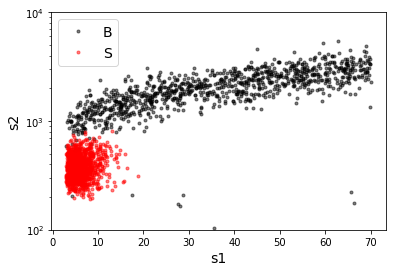

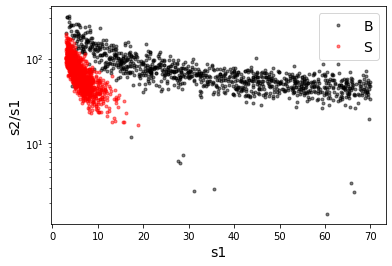

X_mon_B.shape:  (31606, 2)
X_mon_S.shape:  (31606, 2)
X_mon.shape:  (63212, 2)

X_mon_train :  (40297, 2)
y_mon_train :  (40297,)
X_mon_val :  (7112, 2)
y_mon_val :  (7112,)
X_mon_test :  (15803, 2)
y_mon_test :  (15803,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68349	validation_1-logloss:0.68351
[1]	validation_0-logloss:0.67403	validation_1-logloss:0.67405
[2]	validation_0-logloss:0.66477	validation_1-logloss:0.66480
[3]	validation_0-logloss:0.65567	validation_1-logloss:0.65571
[4]	validation_0-logloss:0.64673	validation_1-logloss:0.64681
[5]	validation_0-logloss:0.63800	validation_1-logloss:0.63807
[6]	validation_0-logloss:0.62941	validation_1-logloss:0.62949
[7]	validation_0-logloss:0.62098	validation_1-logloss:0.62108
[8]	validation_0-logloss:0.61270	validation_1-logloss:0.61283
[9]	validation_0-logloss:0.60458	validation_1-logloss:0.60472
[10]	validation_0-logloss:0.59661	validation_1-logloss:0.59677
[11]	validation_0-logloss:0.58880	validation_1-logloss:0.58895
[12]	validation_0-logloss:0.58111	validation_1-logloss:0.58128
[13]	validation_0-logloss:0.57358	validation_1-logloss:0.57373
[14]	validation_0-logloss:0.56617	validation_1-logloss:0.56633
[15]	validation_0-logloss:0.55888	validation_1-logloss:0.55905
[1

[130]	validation_0-logloss:0.16216	validation_1-logloss:0.16272
[131]	validation_0-logloss:0.16067	validation_1-logloss:0.16123
[132]	validation_0-logloss:0.15920	validation_1-logloss:0.15977
[133]	validation_0-logloss:0.15776	validation_1-logloss:0.15832
[134]	validation_0-logloss:0.15632	validation_1-logloss:0.15690
[135]	validation_0-logloss:0.15490	validation_1-logloss:0.15548
[136]	validation_0-logloss:0.15350	validation_1-logloss:0.15408
[137]	validation_0-logloss:0.15212	validation_1-logloss:0.15270
[138]	validation_0-logloss:0.15075	validation_1-logloss:0.15134
[139]	validation_0-logloss:0.14939	validation_1-logloss:0.14999
[140]	validation_0-logloss:0.14805	validation_1-logloss:0.14866
[141]	validation_0-logloss:0.14672	validation_1-logloss:0.14734
[142]	validation_0-logloss:0.14542	validation_1-logloss:0.14604
[143]	validation_0-logloss:0.14413	validation_1-logloss:0.14476
[144]	validation_0-logloss:0.14285	validation_1-logloss:0.14349
[145]	validation_0-logloss:0.14158	valid

[259]	validation_0-logloss:0.06030	validation_1-logloss:0.06181
[260]	validation_0-logloss:0.05994	validation_1-logloss:0.06146
[261]	validation_0-logloss:0.05958	validation_1-logloss:0.06111
[262]	validation_0-logloss:0.05923	validation_1-logloss:0.06077
[263]	validation_0-logloss:0.05888	validation_1-logloss:0.06043
[264]	validation_0-logloss:0.05854	validation_1-logloss:0.06009
[265]	validation_0-logloss:0.05820	validation_1-logloss:0.05976
[266]	validation_0-logloss:0.05786	validation_1-logloss:0.05942
[267]	validation_0-logloss:0.05753	validation_1-logloss:0.05910
[268]	validation_0-logloss:0.05720	validation_1-logloss:0.05877
[269]	validation_0-logloss:0.05687	validation_1-logloss:0.05846
[270]	validation_0-logloss:0.05654	validation_1-logloss:0.05814
[271]	validation_0-logloss:0.05622	validation_1-logloss:0.05783
[272]	validation_0-logloss:0.05591	validation_1-logloss:0.05752
[273]	validation_0-logloss:0.05559	validation_1-logloss:0.05722
[274]	validation_0-logloss:0.05528	valid

[388]	validation_0-logloss:0.03473	validation_1-logloss:0.03705
[389]	validation_0-logloss:0.03464	validation_1-logloss:0.03696
[390]	validation_0-logloss:0.03454	validation_1-logloss:0.03688
[391]	validation_0-logloss:0.03445	validation_1-logloss:0.03679
[392]	validation_0-logloss:0.03436	validation_1-logloss:0.03670
[393]	validation_0-logloss:0.03427	validation_1-logloss:0.03662
[394]	validation_0-logloss:0.03418	validation_1-logloss:0.03654
[395]	validation_0-logloss:0.03409	validation_1-logloss:0.03646
[396]	validation_0-logloss:0.03401	validation_1-logloss:0.03638
[397]	validation_0-logloss:0.03392	validation_1-logloss:0.03630
[398]	validation_0-logloss:0.03383	validation_1-logloss:0.03623
[399]	validation_0-logloss:0.03375	validation_1-logloss:0.03614
[400]	validation_0-logloss:0.03367	validation_1-logloss:0.03607
[401]	validation_0-logloss:0.03358	validation_1-logloss:0.03599
[402]	validation_0-logloss:0.03350	validation_1-logloss:0.03592
[403]	validation_0-logloss:0.03341	valid

[517]	validation_0-logloss:0.02791	validation_1-logloss:0.03093
[518]	validation_0-logloss:0.02789	validation_1-logloss:0.03091
[519]	validation_0-logloss:0.02786	validation_1-logloss:0.03089
[520]	validation_0-logloss:0.02783	validation_1-logloss:0.03087
[521]	validation_0-logloss:0.02781	validation_1-logloss:0.03084
[522]	validation_0-logloss:0.02778	validation_1-logloss:0.03082
[523]	validation_0-logloss:0.02776	validation_1-logloss:0.03080
[524]	validation_0-logloss:0.02773	validation_1-logloss:0.03078
[525]	validation_0-logloss:0.02771	validation_1-logloss:0.03077
[526]	validation_0-logloss:0.02769	validation_1-logloss:0.03075
[527]	validation_0-logloss:0.02766	validation_1-logloss:0.03073
[528]	validation_0-logloss:0.02764	validation_1-logloss:0.03071
[529]	validation_0-logloss:0.02761	validation_1-logloss:0.03069
[530]	validation_0-logloss:0.02759	validation_1-logloss:0.03067
[531]	validation_0-logloss:0.02757	validation_1-logloss:0.03065
[532]	validation_0-logloss:0.02754	valid

[646]	validation_0-logloss:0.02585	validation_1-logloss:0.02957
[647]	validation_0-logloss:0.02584	validation_1-logloss:0.02957
[648]	validation_0-logloss:0.02583	validation_1-logloss:0.02956
[649]	validation_0-logloss:0.02582	validation_1-logloss:0.02956
[650]	validation_0-logloss:0.02580	validation_1-logloss:0.02956
[651]	validation_0-logloss:0.02580	validation_1-logloss:0.02955
[652]	validation_0-logloss:0.02579	validation_1-logloss:0.02955
[653]	validation_0-logloss:0.02578	validation_1-logloss:0.02954
[654]	validation_0-logloss:0.02577	validation_1-logloss:0.02953
[655]	validation_0-logloss:0.02576	validation_1-logloss:0.02953
[656]	validation_0-logloss:0.02575	validation_1-logloss:0.02953
[657]	validation_0-logloss:0.02575	validation_1-logloss:0.02953
[658]	validation_0-logloss:0.02574	validation_1-logloss:0.02953
[659]	validation_0-logloss:0.02573	validation_1-logloss:0.02953
[660]	validation_0-logloss:0.02572	validation_1-logloss:0.02952
[661]	validation_0-logloss:0.02571	valid

[775]	validation_0-logloss:0.02497	validation_1-logloss:0.02942
[776]	validation_0-logloss:0.02496	validation_1-logloss:0.02942
[777]	validation_0-logloss:0.02496	validation_1-logloss:0.02941


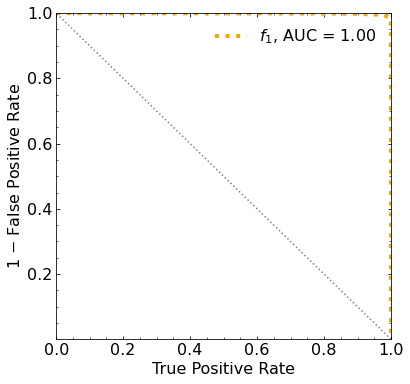

Classification score:


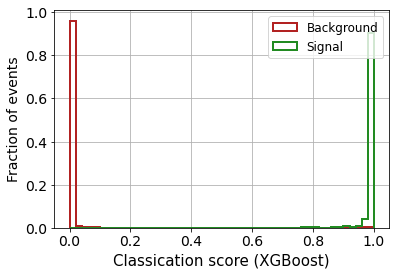


 ROC-AUC =  0.9987332401307145
At least 5 B events per bin, range = [[0, 1]]:
# bins:  2 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  2
range of our data:  [[0, 1]]
number of bins we are going to use:  2
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.095


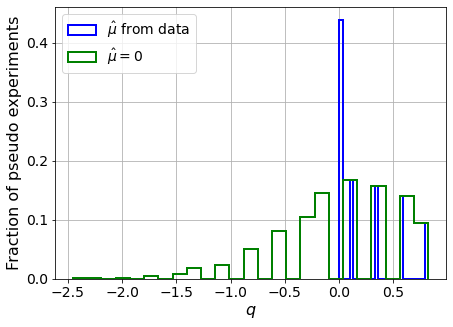

muhat mean:  0.402569838931261
Z_bins:  0.3442461940152992
std Z_bins:  0.40712045497525073
Z_bins mu=0:  0.3442461940152992
std Z_bins mu=0:  0.809490211919316

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0805


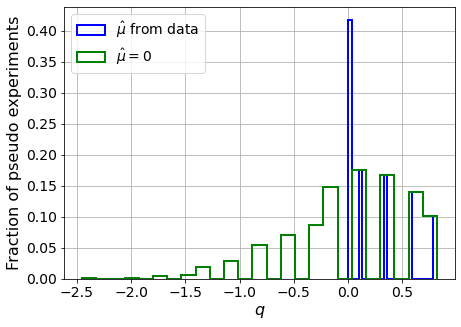

muhat mean:  0.3238193416699213
Z_bins:  0.3444741084700681
std Z_bins:  0.40858606389786534
Z_bins mu=0:  0.3444741084700681
std Z_bins mu=0:  0.8012217652120919

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.081


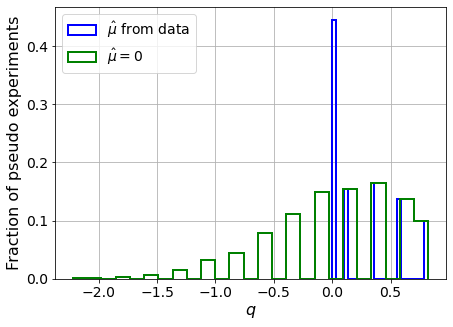

muhat mean:  0.38790407996730253
Z_bins:  0.3443221822625136
std Z_bins:  0.40951153059398104
Z_bins mu=0:  0.3443221822625136
std Z_bins mu=0:  0.8036847379991745

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0915


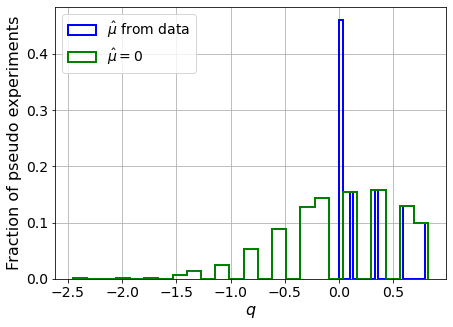

muhat mean:  0.42254402402726776
Z_bins:  0.34419552586361973
std Z_bins:  0.40912801379817715
Z_bins mu=0:  0.34419552586361973
std Z_bins mu=0:  0.7831221054628504

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.09


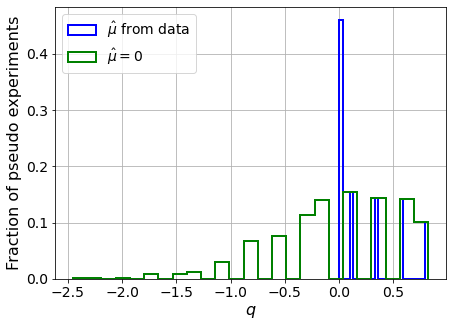

muhat mean:  0.49316668034780653
Z_bins:  0.3440688228407912
std Z_bins:  0.41482360818617536
Z_bins mu=0:  0.3440688228407912
std Z_bins mu=0:  0.8369952477883019

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.089


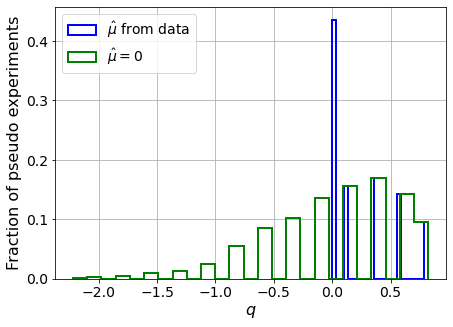

muhat mean:  0.3964923995383558
Z_bins:  0.34438549299422627
std Z_bins:  0.4079001285538211
Z_bins mu=0:  0.34438549299422627
std Z_bins mu=0:  0.8155744873777904

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.086


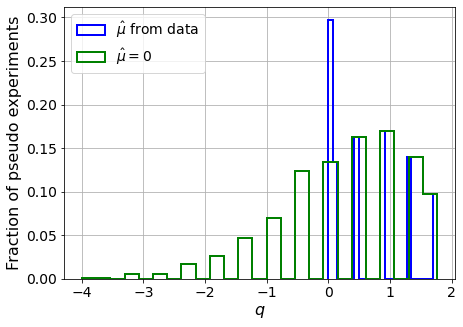

muhat mean:  0.17914160726420428
Z_bins:  0.6581019706446624
std Z_bins:  0.4563760722782594
Z_bins mu=0:  0.6581019706446624
std Z_bins mu=0:  0.793806959665937

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.083


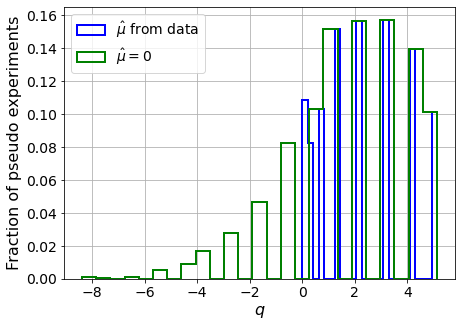

muhat mean:  0.08127550829228752
Z_bins:  1.491627104801074
std Z_bins:  0.5475670437075624
Z_bins mu=0:  1.491627104801074
std Z_bins mu=0:  0.7827852819545726

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.086


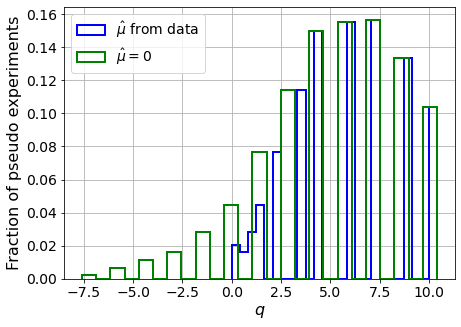

muhat mean:  0.04756964333768334
Z_bins:  2.4302489235846503
std Z_bins:  0.5902046966034311
Z_bins mu=0:  2.4302489235846503
std Z_bins mu=0:  0.7493640807916976

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0815


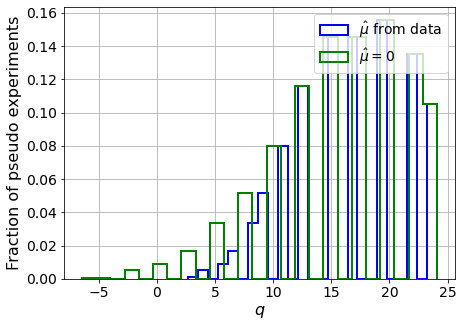

muhat mean:  0.025034949818260648
Z_bins:  4.12630182254937
std Z_bins:  0.5976684911650335
Z_bins mu=0:  4.12630182254937
std Z_bins mu=0:  0.6908255416479092

--------

B_expected:  643
S_expected:  34

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.083


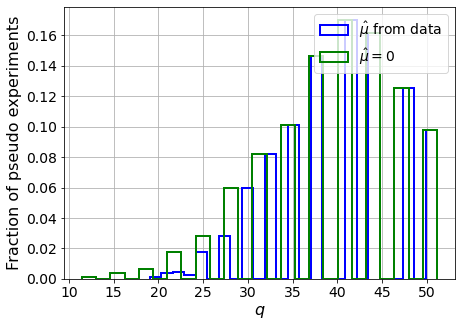

muhat mean:  0.01290635430593877
Z_bins:  6.417919406679188
std Z_bins:  0.5488511590549583
Z_bins mu=0:  6.417919406679188
std Z_bins mu=0:  0.6061690204446547

--------

B_expected:  643
S_expected:  66

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0955


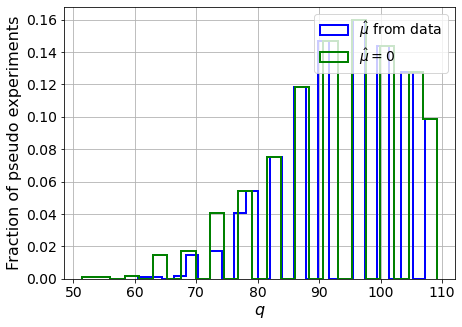

muhat mean:  0.008443909142267563
Z_bins:  9.78589922421957
std Z_bins:  0.5141743528454261
Z_bins mu=0:  9.78589922421957
std Z_bins mu=0:  0.5567183559351743

--------

B_expected:  643
S_expected:  126

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.078


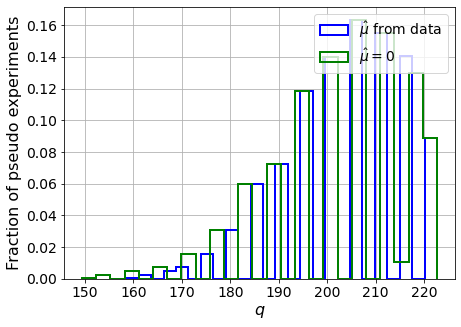

muhat mean:  0.003826021340937453
Z_bins:  14.338809666213939
std Z_bins:  0.44311475589560945
Z_bins mu=0:  14.338809666213939
std Z_bins mu=0:  0.47143828228242884

--------

B_expected:  643
S_expected:  244

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0905


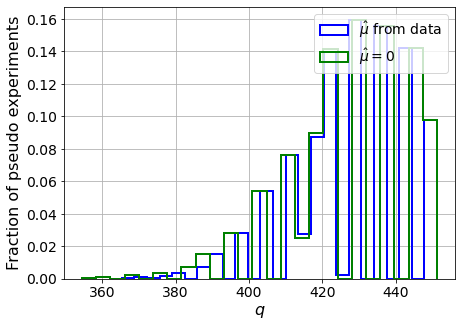

muhat mean:  0.0016819809125639283
Z_bins:  20.740959128213476
std Z_bins:  0.3785459496901353
Z_bins mu=0:  20.740959128213476
std Z_bins mu=0:  0.39779866765855637

--------

B_expected:  643
S_expected:  471

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0965


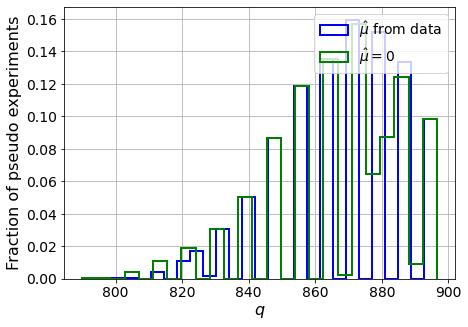

muhat mean:  0.001041683694976855
Z_bins:  29.51830351436577
std Z_bins:  0.3217475748625932
Z_bins mu=0:  29.51830351436577
std Z_bins mu=0:  0.33535829392772115

--------


 FINAL RESULT:

[[0.3442461940152992, 0.40712045497525073, 0.402569838931261, 0.3442461940152992, 0.809490211919316], [0.3444741084700681, 0.40858606389786534, 0.3238193416699213, 0.3444741084700681, 0.8012217652120919], [0.3443221822625136, 0.40951153059398104, 0.38790407996730253, 0.3443221822625136, 0.8036847379991745], [0.34419552586361973, 0.40912801379817715, 0.42254402402726776, 0.34419552586361973, 0.7831221054628504], [0.3440688228407912, 0.41482360818617536, 0.49316668034780653, 0.3440688228407912, 0.8369952477883019], [0.34438549299422627, 0.4079001285538211, 0.3964923995383558, 0.34438549299422627, 0.8155744873777904], [0.6581019706446624, 0.4563760722782594, 0.17914160726420428, 0.6581019706446624, 0.793806959665937], [1.491627104801074, 0.5475670437075624, 0.08127550829228752, 1.491627104801074, 0.78

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 462.62428494 372.43386727
 282.25905728 190.18889437  97.60066983   3.11088726 -84.58746887]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [       -inf        -inf        -inf        -inf        -inf        -inf
        -inf        -inf        -inf        -inf        -inf        -inf
        -inf        -inf        -inf 286.3669106 197.818

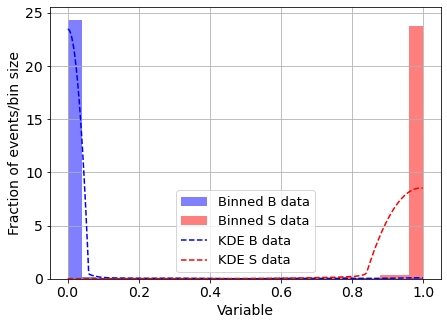

KDE Kernel:  epanechnikov
Background bandwidth:  0.059027261020128646
Signal bandwidth:  0.15753186734235153
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


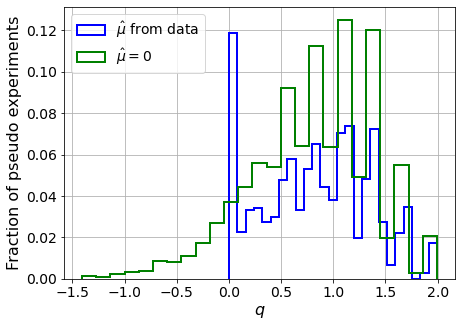

muhat mean:  -6.359577719174765
Z_bins:  0.9194231653387945
std Z_bins:  0.28035700542526654
Z_bins mu=0:  0.9194231653387945
std Z_bins mu=0:  0.318750035291255

--------

B_expected:  643
S_expected:  1



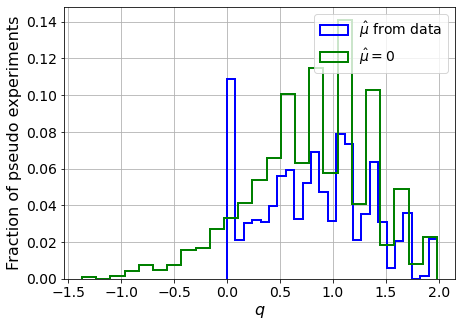

muhat mean:  -6.224711433450237
Z_bins:  0.9124612079114993
std Z_bins:  0.27833038862373344
Z_bins mu=0:  0.9124612079114993
std Z_bins mu=0:  0.3138803047010877

--------

B_expected:  643
S_expected:  1



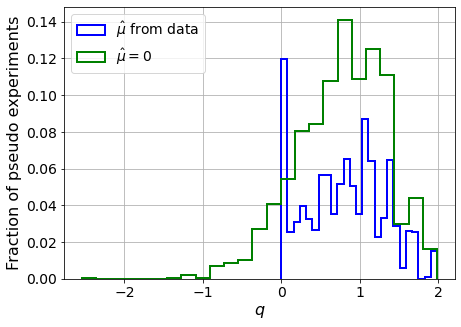

muhat mean:  -11.301623325285904
Z_bins:  0.9094723441901378
std Z_bins:  0.2770104148134421
Z_bins mu=0:  0.9094723441901378
std Z_bins mu=0:  0.31377764931223745

--------

B_expected:  643
S_expected:  1



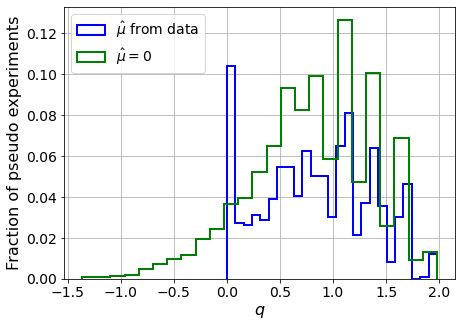

muhat mean:  -6.3797424455240055
Z_bins:  0.9179639934173695
std Z_bins:  0.2771666844433762
Z_bins mu=0:  0.9179639934173695
std Z_bins mu=0:  0.310450508957934

--------

B_expected:  643
S_expected:  1



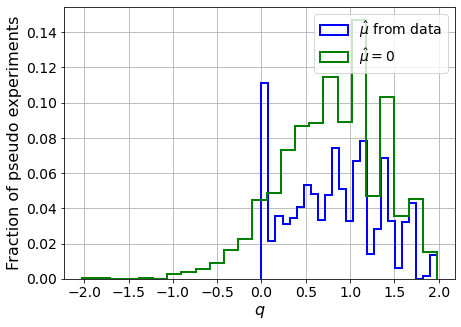

muhat mean:  -5.27166091467296
Z_bins:  0.9144035821085179
std Z_bins:  0.28008649775325806
Z_bins mu=0:  0.9144035821085179
std Z_bins mu=0:  0.3127773579309964

--------

B_expected:  643
S_expected:  1



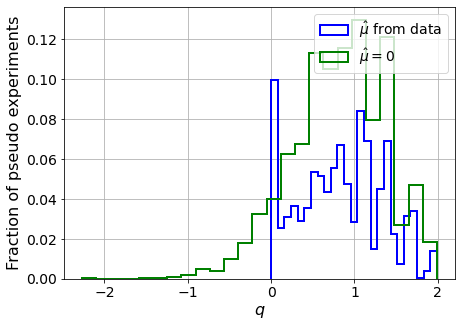

muhat mean:  -6.421770305732094
Z_bins:  0.9205193955006773
std Z_bins:  0.27403312459792345
Z_bins mu=0:  0.9205193955006773
std Z_bins mu=0:  0.3062701616028673

--------

B_expected:  643
S_expected:  2



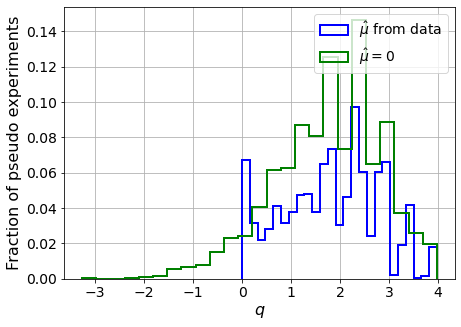

muhat mean:  -5.035084870690074
Z_bins:  1.3554984313617708
std Z_bins:  0.3616877653583488
Z_bins mu=0:  1.3554984313617708
std Z_bins mu=0:  0.3981759247534998

--------

B_expected:  643
S_expected:  5



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


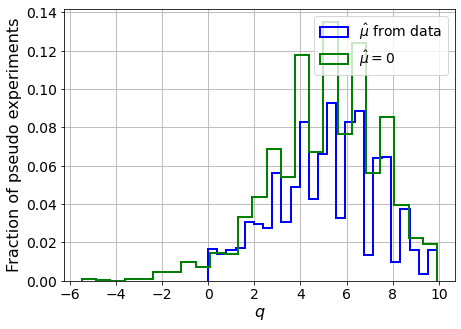

muhat mean:  -1.4421986823131057
Z_bins:  2.2902423494433184
std Z_bins:  0.4769180967754571
Z_bins mu=0:  2.2902423494433184
std Z_bins mu=0:  0.5104689372208576

--------

B_expected:  643
S_expected:  9



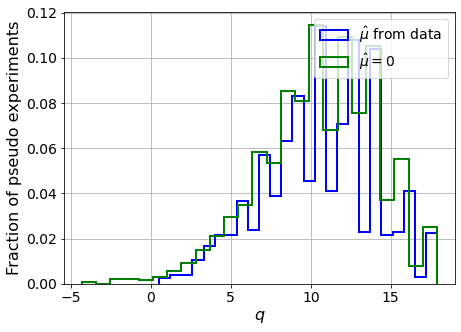

muhat mean:  -1.2771623707137607
Z_bins:  3.2717388734732062
std Z_bins:  0.5271907036164509
Z_bins mu=0:  3.2717388734732062
std Z_bins mu=0:  0.5479973637980563

--------

B_expected:  643
S_expected:  18



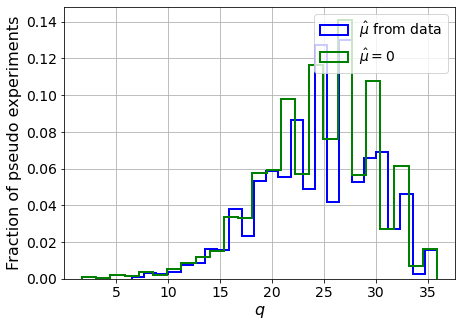

muhat mean:  -0.36948960067796116
Z_bins:  4.987604396360854
std Z_bins:  0.5254686135044794
Z_bins mu=0:  4.987604396360854
std Z_bins mu=0:  0.5399806303180197

--------

B_expected:  643
S_expected:  34



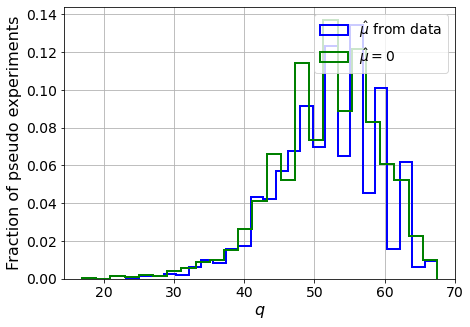

muhat mean:  -0.15634873525949716
Z_bins:  7.234011007300458
std Z_bins:  0.4969192129237624
Z_bins mu=0:  7.234011007300458
std Z_bins mu=0:  0.5078297492161173

--------

B_expected:  643
S_expected:  66



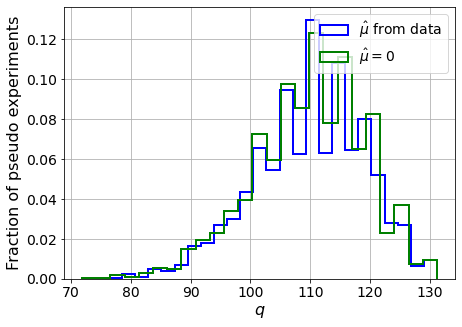

muhat mean:  -0.11035862054355863
Z_bins:  10.504409285875337
std Z_bins:  0.4380747123153771
Z_bins mu=0:  10.504409285875337
std Z_bins mu=0:  0.4430921971028576

--------

B_expected:  643
S_expected:  126



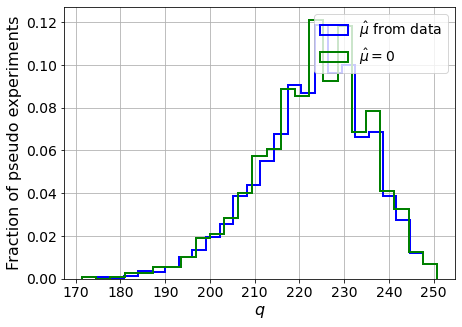

muhat mean:  -0.04780395583336909
Z_bins:  14.97104494414452
std Z_bins:  0.40579715429821245
Z_bins mu=0:  14.97104494414452
std Z_bins mu=0:  0.4104848044702898

--------

B_expected:  643
S_expected:  244



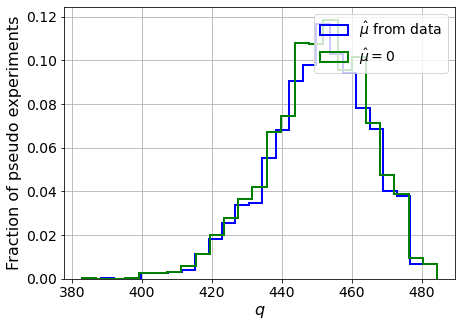

muhat mean:  -0.03270577614010921
Z_bins:  21.250239570882922
std Z_bins:  0.3424381915765184
Z_bins mu=0:  21.250239570882922
std Z_bins mu=0:  0.34507092682512946

--------

B_expected:  643
S_expected:  471



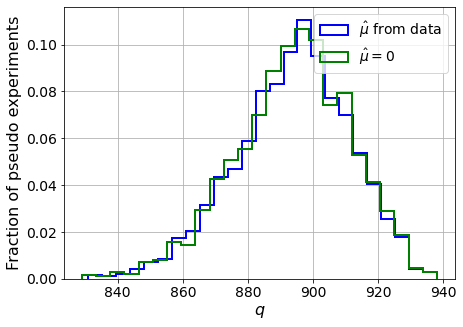

muhat mean:  -0.009518679684232706
Z_bins:  29.91874925859171
std Z_bins:  0.2923966215508893
Z_bins mu=0:  29.91874925859171
std Z_bins mu=0:  0.2941535266773663

--------


 FINAL RESULT:

[[0.9194231653387945, 0.28035700542526654, -6.359577719174765, 0.9194231653387945, 0.318750035291255], [0.9124612079114993, 0.27833038862373344, -6.224711433450237, 0.9124612079114993, 0.3138803047010877], [0.9094723441901378, 0.2770104148134421, -11.301623325285904, 0.9094723441901378, 0.31377764931223745], [0.9179639934173695, 0.2771666844433762, -6.3797424455240055, 0.9179639934173695, 0.310450508957934], [0.9144035821085179, 0.28008649775325806, -5.27166091467296, 0.9144035821085179, 0.3127773579309964], [0.9205193955006773, 0.27403312459792345, -6.421770305732094, 0.9205193955006773, 0.3062701616028673], [1.3554984313617708, 0.3616877653583488, -5.035084870690074, 1.3554984313617708, 0.3981759247534998], [2.2902423494433184, 0.4769180967754571, -1.4421986823131057, 2.2902423494433184, 0.510468

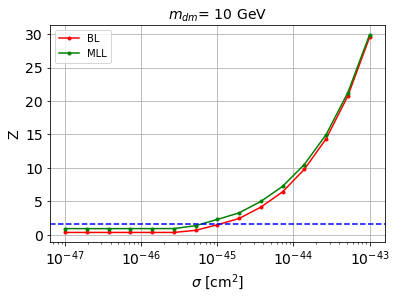


cross_BL_164:  1.1095946706771763e-45
cross_BL_164_up:  7.52764159151512e-46
cross_BL_164_down:  1.6669537300809248e-45

cross_MLL_164:  6.327710532070539e-46
cross_MLL_164_up:  4.699908795257047e-46
cross_MLL_164_down:  8.701065330236718e-46

#########################


#########################

mDM =  20 GeV


S_cs1.shape:  (33873,)
S_cs2.shape:  (33873,)
 NUM_DAT:  33001 

NUM_DAT_ER:  32580
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33001, 2)

S_cs1cs2.shape:  (33001, 2)


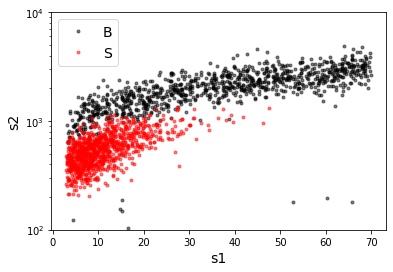

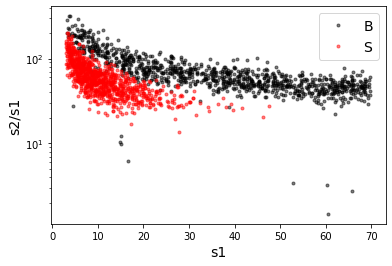

X_mon_B.shape:  (33001, 2)
X_mon_S.shape:  (33001, 2)
X_mon.shape:  (66002, 2)

X_mon_train :  (42075, 2)
y_mon_train :  (42075,)
X_mon_val :  (7426, 2)
y_mon_val :  (7426,)
X_mon_test :  (16501, 2)
y_mon_test :  (16501,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68430	validation_1-logloss:0.68434
[1]	validation_0-logloss:0.67560	validation_1-logloss:0.67571
[2]	validation_0-logloss:0.66708	validation_1-logloss:0.66724
[3]	validation_0-logloss:0.65873	validation_1-logloss:0.65895
[4]	validation_0-logloss:0.65051	validation_1-logloss:0.65081
[5]	validation_0-logloss:0.64249	validation_1-logloss:0.64283
[6]	validation_0-logloss:0.63460	validation_1-logloss:0.63500
[7]	validation_0-logloss:0.62687	validation_1-logloss:0.62732
[8]	validation_0-logloss:0.61927	validation_1-logloss:0.61978
[9]	validation_0-logloss:0.61182	validation_1-logloss:0.61239
[10]	validation_0-logloss:0.60450	validation_1-logloss:0.60512
[11]	validation_0-logloss:0.59732	validation_1-logloss:0.59799
[12]	validation_0-logloss:0.59027	validation_1-logloss:0.59099
[13]	validation_0-logloss:0.58335	validation_1-logloss:0.58411
[14]	validation_0-logloss:0.57653	validation_1-logloss:0.57736
[15]	validation_0-logloss:0.56986	validation_1-logloss:0.57072
[1

[130]	validation_0-logloss:0.20791	validation_1-logloss:0.21170
[131]	validation_0-logloss:0.20658	validation_1-logloss:0.21039
[132]	validation_0-logloss:0.20527	validation_1-logloss:0.20909
[133]	validation_0-logloss:0.20397	validation_1-logloss:0.20781
[134]	validation_0-logloss:0.20269	validation_1-logloss:0.20655
[135]	validation_0-logloss:0.20142	validation_1-logloss:0.20530
[136]	validation_0-logloss:0.20017	validation_1-logloss:0.20407
[137]	validation_0-logloss:0.19894	validation_1-logloss:0.20286
[138]	validation_0-logloss:0.19771	validation_1-logloss:0.20166
[139]	validation_0-logloss:0.19649	validation_1-logloss:0.20046
[140]	validation_0-logloss:0.19530	validation_1-logloss:0.19929
[141]	validation_0-logloss:0.19412	validation_1-logloss:0.19813
[142]	validation_0-logloss:0.19296	validation_1-logloss:0.19698
[143]	validation_0-logloss:0.19180	validation_1-logloss:0.19585
[144]	validation_0-logloss:0.19066	validation_1-logloss:0.19472
[145]	validation_0-logloss:0.18952	valid

[259]	validation_0-logloss:0.11793	validation_1-logloss:0.12387
[260]	validation_0-logloss:0.11762	validation_1-logloss:0.12357
[261]	validation_0-logloss:0.11731	validation_1-logloss:0.12327
[262]	validation_0-logloss:0.11701	validation_1-logloss:0.12298
[263]	validation_0-logloss:0.11671	validation_1-logloss:0.12269
[264]	validation_0-logloss:0.11642	validation_1-logloss:0.12241
[265]	validation_0-logloss:0.11613	validation_1-logloss:0.12213
[266]	validation_0-logloss:0.11583	validation_1-logloss:0.12185
[267]	validation_0-logloss:0.11555	validation_1-logloss:0.12157
[268]	validation_0-logloss:0.11527	validation_1-logloss:0.12130
[269]	validation_0-logloss:0.11499	validation_1-logloss:0.12103
[270]	validation_0-logloss:0.11471	validation_1-logloss:0.12077
[271]	validation_0-logloss:0.11444	validation_1-logloss:0.12050
[272]	validation_0-logloss:0.11417	validation_1-logloss:0.12024
[273]	validation_0-logloss:0.11391	validation_1-logloss:0.11999
[274]	validation_0-logloss:0.11365	valid

[388]	validation_0-logloss:0.09639	validation_1-logloss:0.10361
[389]	validation_0-logloss:0.09631	validation_1-logloss:0.10355
[390]	validation_0-logloss:0.09624	validation_1-logloss:0.10348
[391]	validation_0-logloss:0.09616	validation_1-logloss:0.10341
[392]	validation_0-logloss:0.09608	validation_1-logloss:0.10334
[393]	validation_0-logloss:0.09601	validation_1-logloss:0.10328
[394]	validation_0-logloss:0.09594	validation_1-logloss:0.10321
[395]	validation_0-logloss:0.09587	validation_1-logloss:0.10315
[396]	validation_0-logloss:0.09579	validation_1-logloss:0.10308
[397]	validation_0-logloss:0.09572	validation_1-logloss:0.10302
[398]	validation_0-logloss:0.09565	validation_1-logloss:0.10296
[399]	validation_0-logloss:0.09559	validation_1-logloss:0.10290
[400]	validation_0-logloss:0.09552	validation_1-logloss:0.10284
[401]	validation_0-logloss:0.09545	validation_1-logloss:0.10277
[402]	validation_0-logloss:0.09538	validation_1-logloss:0.10271
[403]	validation_0-logloss:0.09532	valid

[517]	validation_0-logloss:0.09077	validation_1-logloss:0.09909
[518]	validation_0-logloss:0.09075	validation_1-logloss:0.09907
[519]	validation_0-logloss:0.09073	validation_1-logloss:0.09905
[520]	validation_0-logloss:0.09071	validation_1-logloss:0.09904
[521]	validation_0-logloss:0.09069	validation_1-logloss:0.09903
[522]	validation_0-logloss:0.09066	validation_1-logloss:0.09901
[523]	validation_0-logloss:0.09064	validation_1-logloss:0.09900
[524]	validation_0-logloss:0.09062	validation_1-logloss:0.09898
[525]	validation_0-logloss:0.09059	validation_1-logloss:0.09897
[526]	validation_0-logloss:0.09057	validation_1-logloss:0.09896
[527]	validation_0-logloss:0.09055	validation_1-logloss:0.09895
[528]	validation_0-logloss:0.09052	validation_1-logloss:0.09893
[529]	validation_0-logloss:0.09050	validation_1-logloss:0.09892
[530]	validation_0-logloss:0.09048	validation_1-logloss:0.09891
[531]	validation_0-logloss:0.09046	validation_1-logloss:0.09889
[532]	validation_0-logloss:0.09043	valid

[646]	validation_0-logloss:0.08871	validation_1-logloss:0.09817
[647]	validation_0-logloss:0.08870	validation_1-logloss:0.09817
[648]	validation_0-logloss:0.08869	validation_1-logloss:0.09817
[649]	validation_0-logloss:0.08868	validation_1-logloss:0.09817
[650]	validation_0-logloss:0.08867	validation_1-logloss:0.09817
[651]	validation_0-logloss:0.08866	validation_1-logloss:0.09817
[652]	validation_0-logloss:0.08865	validation_1-logloss:0.09817
[653]	validation_0-logloss:0.08864	validation_1-logloss:0.09817
[654]	validation_0-logloss:0.08864	validation_1-logloss:0.09817
[655]	validation_0-logloss:0.08863	validation_1-logloss:0.09816
[656]	validation_0-logloss:0.08862	validation_1-logloss:0.09816
[657]	validation_0-logloss:0.08861	validation_1-logloss:0.09816
[658]	validation_0-logloss:0.08860	validation_1-logloss:0.09816
[659]	validation_0-logloss:0.08859	validation_1-logloss:0.09816
[660]	validation_0-logloss:0.08858	validation_1-logloss:0.09816
[661]	validation_0-logloss:0.08858	valid

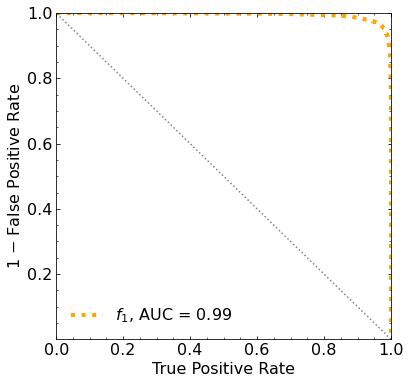

Classification score:


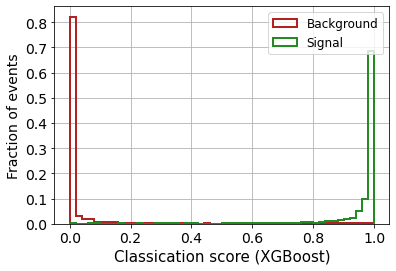


 ROC-AUC =  0.9940985733100339
At least 5 B events per bin, range = [[0, 1]]:
# bins:  8 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  8
range of our data:  [[0, 1]]
number of bins we are going to use:  8
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8385


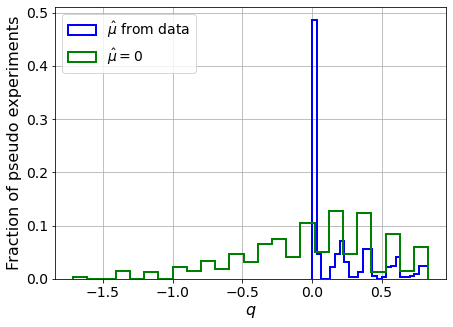

muhat mean:  0.4961576783184855
Z_bins:  0.19372629592213486
std Z_bins:  0.646291801893246
Z_bins mu=0:  0.16570006843481
std Z_bins mu=0:  1.5041933892263757

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.858


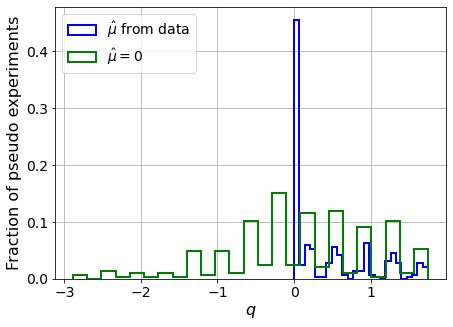

muhat mean:  0.3400781231985062
Z_bins:  0.4247604494788286
std Z_bins:  0.6306996353731057
Z_bins mu=0:  0.39973739481456894
std Z_bins mu=0:  1.1843840058660577

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8455


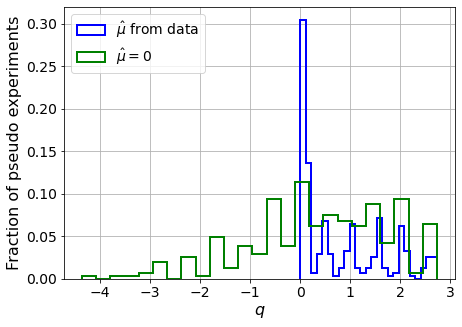

muhat mean:  0.2108078566752621
Z_bins:  0.691346786584571
std Z_bins:  0.6117758461846583
Z_bins mu=0:  0.6774069443402697
std Z_bins mu=0:  1.0278853670711385

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.844


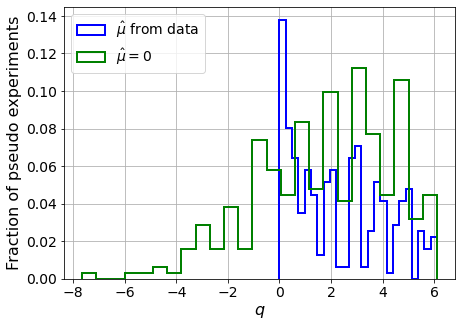

muhat mean:  0.11254614552071601
Z_bins:  1.424370564350801
std Z_bins:  0.6351740537409706
Z_bins mu=0:  1.4194380478704232
std Z_bins mu=0:  0.9140221593856873

--------

B_expected:  643
S_expected:  12

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.857


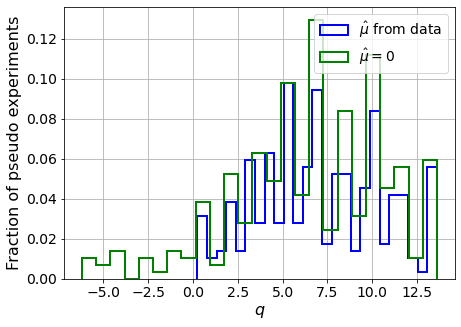

muhat mean:  0.050484632389650244
Z_bins:  2.6283631716769302
std Z_bins:  0.6422491623784355
Z_bins mu=0:  2.6258511009038346
std Z_bins mu=0:  0.8047462163979885

--------

B_expected:  643
S_expected:  23

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.843


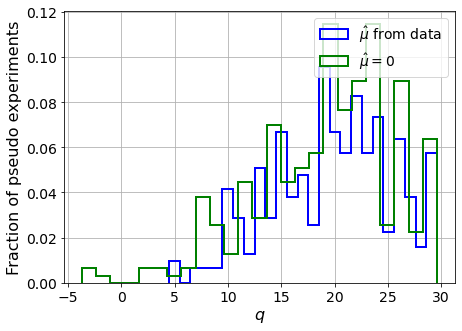

muhat mean:  0.013770327877592064
Z_bins:  4.462762722859083
std Z_bins:  0.6261090048320158
Z_bins mu=0:  4.462762722859083
std Z_bins mu=0:  0.7190354393371985

--------

B_expected:  643
S_expected:  44

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.857


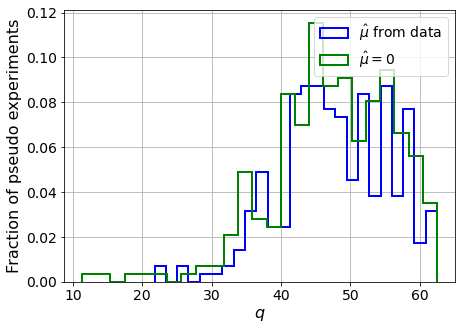

muhat mean:  0.010941692883334438
Z_bins:  6.904219034378307
std Z_bins:  0.5635534284927504
Z_bins mu=0:  6.903013193556958
std Z_bins mu=0:  0.6273318958394205

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.85


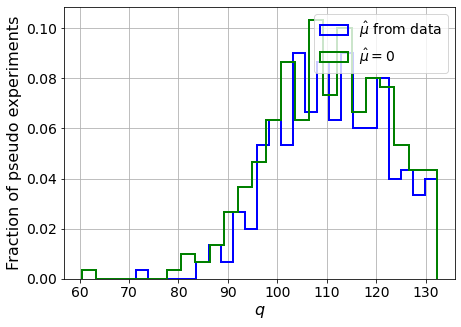

muhat mean:  0.008171353088750727
Z_bins:  10.524344836248577
std Z_bins:  0.5240921602125401
Z_bins mu=0:  10.523236576096872
std Z_bins mu=0:  0.5613756474797201

--------

B_expected:  643
S_expected:  165

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8375


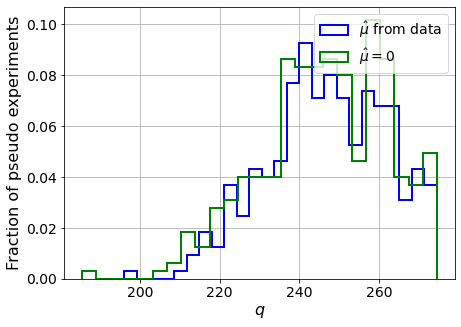

muhat mean:  0.0029349994469042018
Z_bins:  15.724611568477169
std Z_bins:  0.47543768045476276
Z_bins mu=0:  15.724028009052876
std Z_bins mu=0:  0.5009649911425523

--------

B_expected:  643
S_expected:  318

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.842


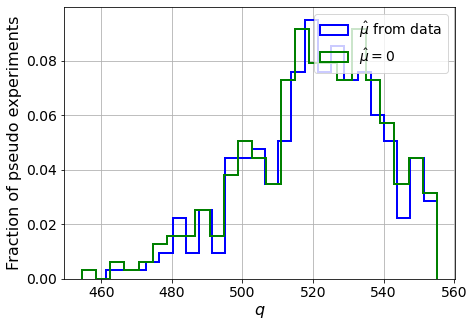

muhat mean:  0.0015942275421608
Z_bins:  22.84865813631736
std Z_bins:  0.4078566712885403
Z_bins mu=0:  22.847704095163454
std Z_bins mu=0:  0.42587311864084915

--------

B_expected:  643
S_expected:  615

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.847


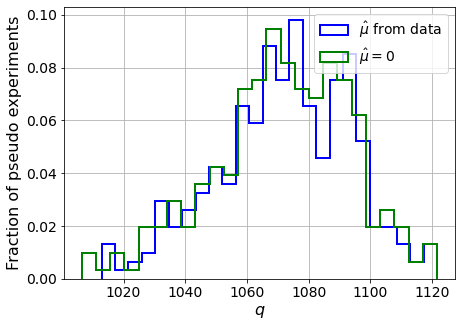

muhat mean:  0.0008658736555953452
Z_bins:  32.75393666722224
std Z_bins:  0.33014919707894147
Z_bins mu=0:  32.75373278037641
std Z_bins mu=0:  0.3407623635357347

--------

B_expected:  643
S_expected:  1187

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8395


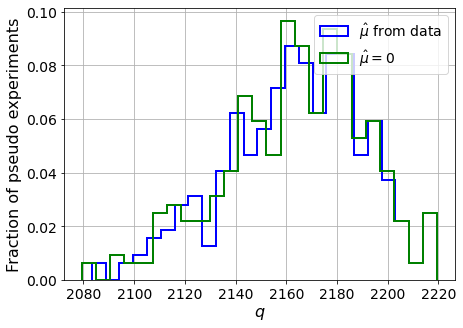

muhat mean:  0.0001998205747740988
Z_bins:  46.53336070875959
std Z_bins:  0.2901317452412416
Z_bins mu=0:  46.532632562429406
std Z_bins mu=0:  0.29699031262251835

--------

B_expected:  643
S_expected:  2291

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.853


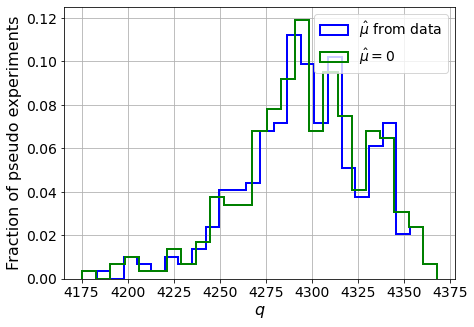

muhat mean:  0.00023686388104057792
Z_bins:  65.5579859001336
std Z_bins:  0.2544922159603058
Z_bins mu=0:  65.55731181997805
std Z_bins mu=0:  0.2605789399298747

--------

B_expected:  643
S_expected:  4424

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8265


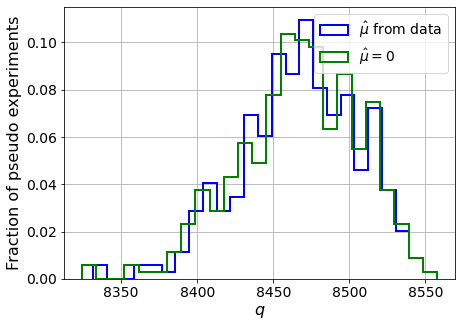

muhat mean:  0.00017864379521135461
Z_bins:  92.03150607030449
std Z_bins:  0.21114064357252565
Z_bins mu=0:  92.0313885758054
std Z_bins mu=0:  0.2158616303517941

--------

B_expected:  643
S_expected:  8542

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8535


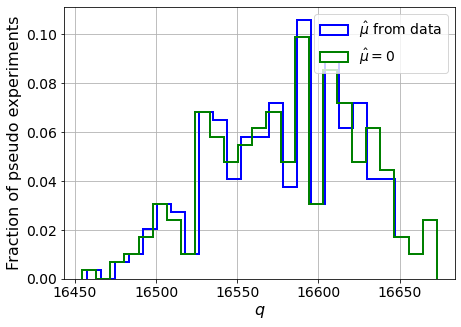

muhat mean:  3.6718144943219065e-05
Z_bins:  128.7787416744592
std Z_bins:  0.17330354446736956
Z_bins mu=0:  128.77871363423372
std Z_bins mu=0:  0.1754274924069205

--------


 FINAL RESULT:

[[0.19372629592213486, 0.646291801893246, 0.4961576783184855, 0.16570006843481, 1.5041933892263757], [0.4247604494788286, 0.6306996353731057, 0.3400781231985062, 0.39973739481456894, 1.1843840058660577], [0.691346786584571, 0.6117758461846583, 0.2108078566752621, 0.6774069443402697, 1.0278853670711385], [1.424370564350801, 0.6351740537409706, 0.11254614552071601, 1.4194380478704232, 0.9140221593856873], [2.6283631716769302, 0.6422491623784355, 0.050484632389650244, 2.6258511009038346, 0.8047462163979885], [4.462762722859083, 0.6261090048320158, 0.013770327877592064, 4.462762722859083, 0.7190354393371985], [6.904219034378307, 0.5635534284927504, 0.010941692883334438, 6.903013193556958, 0.6273318958394205], [10.524344836248577, 0.5240921602125401, 0.008171353088750727, 10.523236576096872, 0.561375

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 435.09704041 365.43167383 295.89215085
 221.01027887 143.96635851  66.47318043 -13.23363789 -91.0224262 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 345.65512357 287.1055502
 223.

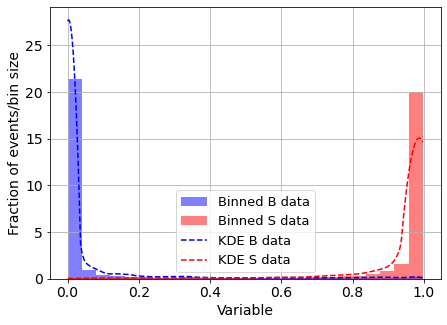

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



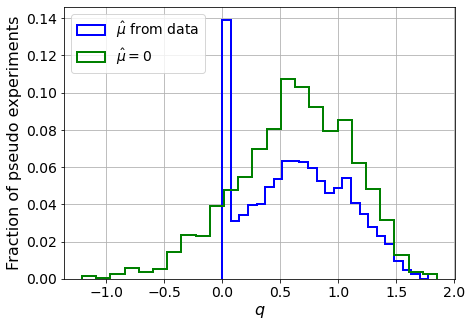

muhat mean:  -4.723261646511252
Z_bins:  0.8075577842362052
std Z_bins:  0.26583921404858674
Z_bins mu=0:  0.8075577842362052
std Z_bins mu=0:  0.304711990367144

--------

B_expected:  643
S_expected:  2



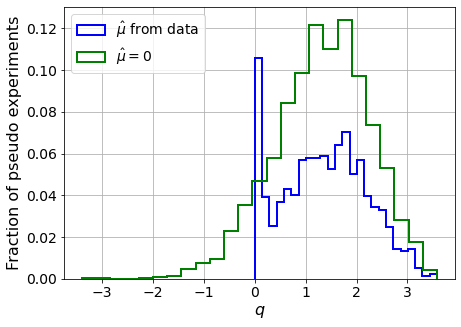

muhat mean:  -1.902480166121854
Z_bins:  1.1702196378633416
std Z_bins:  0.3569734659681753
Z_bins mu=0:  1.1702196378633416
std Z_bins mu=0:  0.4002242015856971

--------

B_expected:  643
S_expected:  3



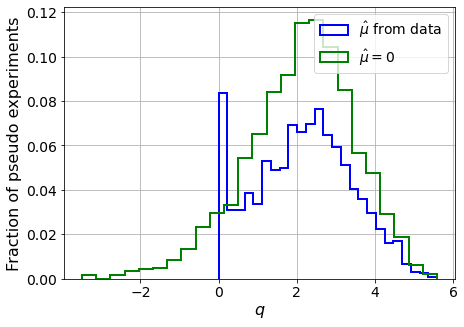

muhat mean:  -1.368246690670712
Z_bins:  1.492209419948883
std Z_bins:  0.4119717616782079
Z_bins mu=0:  1.492209419948883
std Z_bins mu=0:  0.46242340309689933

--------

B_expected:  643
S_expected:  6



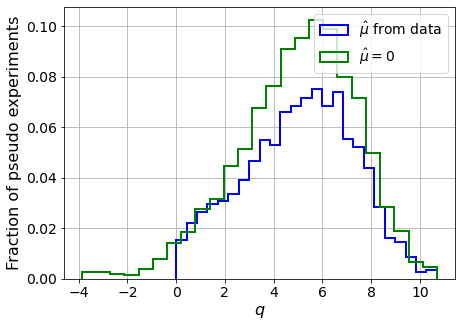

muhat mean:  -0.7831101617443434
Z_bins:  2.282955050947064
std Z_bins:  0.4908987182437992
Z_bins mu=0:  2.282955050947064
std Z_bins mu=0:  0.5241022930190901

--------

B_expected:  643
S_expected:  12



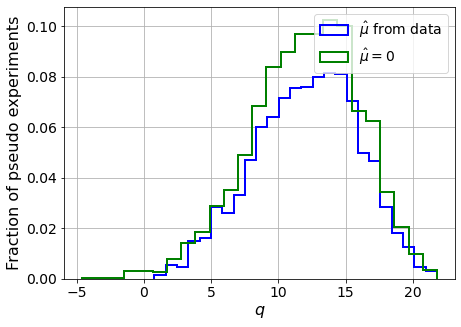

muhat mean:  -0.47980487760009205
Z_bins:  3.498069450150488
std Z_bins:  0.5542335897249129
Z_bins mu=0:  3.498069450150488
std Z_bins mu=0:  0.5757910719640164

--------

B_expected:  643
S_expected:  23



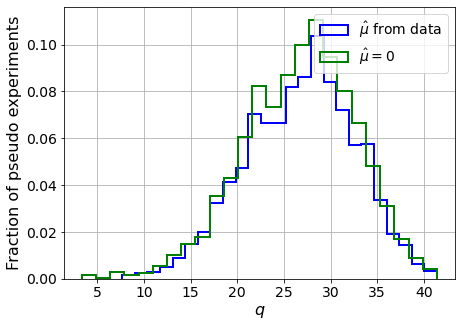

muhat mean:  -0.18125270881259137
Z_bins:  5.212431531849352
std Z_bins:  0.5573035941530753
Z_bins mu=0:  5.212431531849352
std Z_bins mu=0:  0.572558439374572

--------

B_expected:  643
S_expected:  44



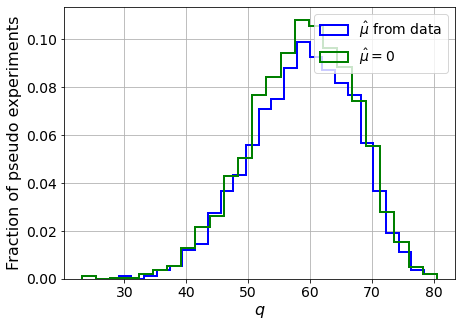

muhat mean:  -0.09322430823547714
Z_bins:  7.703976801474616
std Z_bins:  0.5353893941450563
Z_bins mu=0:  7.703976801474616
std Z_bins mu=0:  0.5438095145576183

--------

B_expected:  643
S_expected:  85



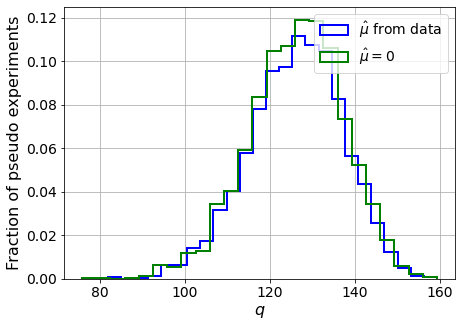

muhat mean:  -0.05190343543255788
Z_bins:  11.25542330754239
std Z_bins:  0.4914020761565748
Z_bins mu=0:  11.25542330754239
std Z_bins mu=0:  0.4978516364395152

--------

B_expected:  643
S_expected:  165



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


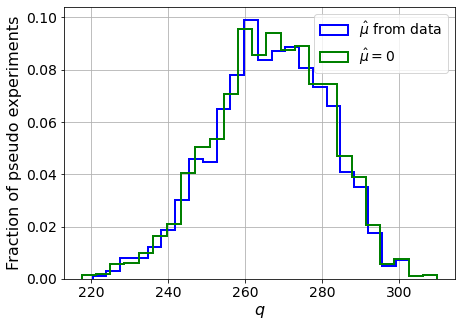

muhat mean:  -0.02860863625482563
Z_bins:  16.346114726362064
std Z_bins:  0.4531014521017319
Z_bins mu=0:  16.346114726362064
std Z_bins mu=0:  0.4564707002248813

--------

B_expected:  643
S_expected:  318



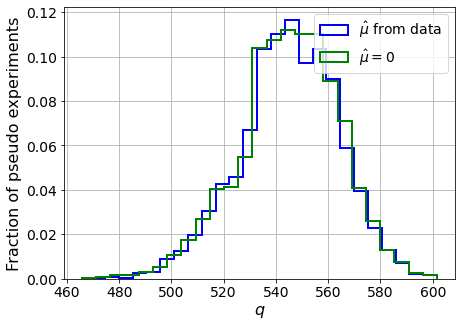

muhat mean:  -0.012313121532005667
Z_bins:  23.36950226364294
std Z_bins:  0.40643419494216193
Z_bins mu=0:  23.36950226364294
std Z_bins mu=0:  0.4102148210034627

--------

B_expected:  643
S_expected:  615



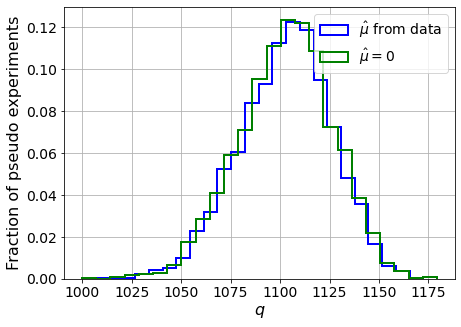

muhat mean:  -0.006119049252033698
Z_bins:  33.23480934305498
std Z_bins:  0.35462043676739824
Z_bins mu=0:  33.23480934305498
std Z_bins mu=0:  0.3569714936311047

--------

B_expected:  643
S_expected:  1187



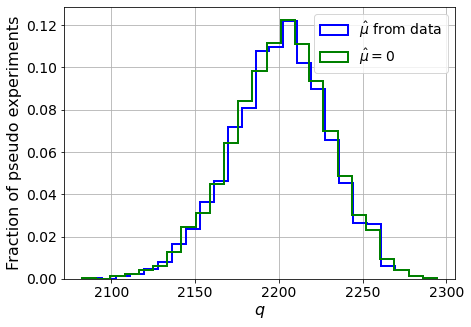

muhat mean:  -0.0037739630299897485
Z_bins:  46.92747738351274
std Z_bins:  0.31166830268772927
Z_bins mu=0:  46.92747738351274
std Z_bins mu=0:  0.3128688654656849

--------

B_expected:  643
S_expected:  2291



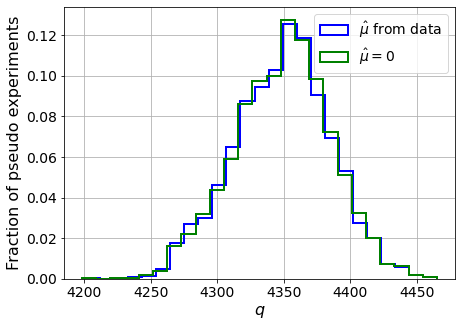

muhat mean:  -0.001927430241443621
Z_bins:  65.9618658773883
std Z_bins:  0.2748455055724583
Z_bins mu=0:  65.96184900848704
std Z_bins mu=0:  0.2756053386951252

--------

B_expected:  643
S_expected:  4424



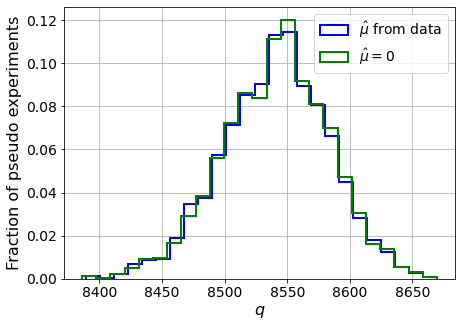

muhat mean:  -0.000939988685706101
Z_bins:  92.42912836356646
std Z_bins:  0.23048463869042674
Z_bins mu=0:  92.42881695460325
std Z_bins mu=0:  0.2310895234395123

--------

B_expected:  643
S_expected:  8542



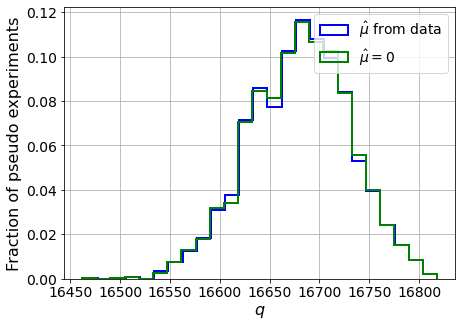

muhat mean:  -0.0005243560970902641
Z_bins:  129.1592833294206
std Z_bins:  0.19526915770173675
Z_bins mu=0:  129.1592833150373
std Z_bins mu=0:  0.19571827473608516

--------


 FINAL RESULT:

[[0.8075577842362052, 0.26583921404858674, -4.723261646511252, 0.8075577842362052, 0.304711990367144], [1.1702196378633416, 0.3569734659681753, -1.902480166121854, 1.1702196378633416, 0.4002242015856971], [1.492209419948883, 0.4119717616782079, -1.368246690670712, 1.492209419948883, 0.46242340309689933], [2.282955050947064, 0.4908987182437992, -0.7831101617443434, 2.282955050947064, 0.5241022930190901], [3.498069450150488, 0.5542335897249129, -0.47980487760009205, 3.498069450150488, 0.5757910719640164], [5.212431531849352, 0.5573035941530753, -0.18125270881259137, 5.212431531849352, 0.572558439374572], [7.703976801474616, 0.5353893941450563, -0.09322430823547714, 7.703976801474616, 0.5438095145576183], [11.25542330754239, 0.4914020761565748, -0.05190343543255788, 11.25542330754239, 0.49785163643

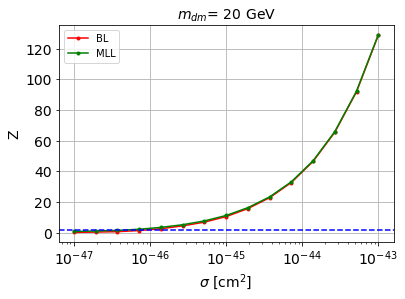


cross_BL_164:  8.096791337886445e-47
cross_BL_164_up:  4.996584716740839e-47
cross_BL_164_down:  1.1487798633788297e-46

cross_MLL_164:  4.215301582128836e-47
cross_MLL_164_up:  2.350764602858847e-47
cross_MLL_164_down:  6.253303735248249e-47

#########################


#########################

mDM =  35 GeV


S_cs1.shape:  (33697,)
S_cs2.shape:  (33697,)
 NUM_DAT:  33084 

NUM_DAT_ER:  32663
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33084, 2)

S_cs1cs2.shape:  (33084, 2)


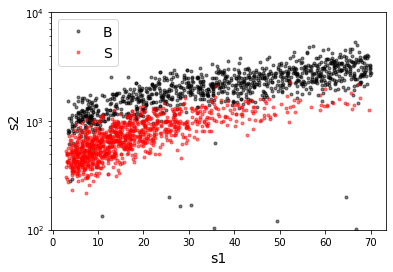

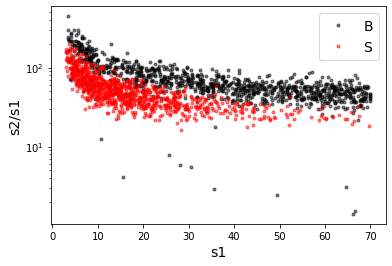

X_mon_B.shape:  (33084, 2)
X_mon_S.shape:  (33084, 2)
X_mon.shape:  (66168, 2)

X_mon_train :  (42182, 2)
y_mon_train :  (42182,)
X_mon_val :  (7444, 2)
y_mon_val :  (7444,)
X_mon_test :  (16542, 2)
y_mon_test :  (16542,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68503	validation_1-logloss:0.68497
[1]	validation_0-logloss:0.67708	validation_1-logloss:0.67696
[2]	validation_0-logloss:0.66929	validation_1-logloss:0.66911
[3]	validation_0-logloss:0.66165	validation_1-logloss:0.66141
[4]	validation_0-logloss:0.65415	validation_1-logloss:0.65386
[5]	validation_0-logloss:0.64680	validation_1-logloss:0.64645
[6]	validation_0-logloss:0.63957	validation_1-logloss:0.63918
[7]	validation_0-logloss:0.63248	validation_1-logloss:0.63204
[8]	validation_0-logloss:0.62553	validation_1-logloss:0.62503
[9]	validation_0-logloss:0.61870	validation_1-logloss:0.61816
[10]	validation_0-logloss:0.61200	validation_1-logloss:0.61139
[11]	validation_0-logloss:0.60542	validation_1-logloss:0.60476
[12]	validation_0-logloss:0.59896	validation_1-logloss:0.59824
[13]	validation_0-logloss:0.59261	validation_1-logloss:0.59183
[14]	validation_0-logloss:0.58640	validation_1-logloss:0.58555
[15]	validation_0-logloss:0.58029	validation_1-logloss:0.57937
[1

[130]	validation_0-logloss:0.24796	validation_1-logloss:0.24237
[131]	validation_0-logloss:0.24674	validation_1-logloss:0.24112
[132]	validation_0-logloss:0.24553	validation_1-logloss:0.23988
[133]	validation_0-logloss:0.24433	validation_1-logloss:0.23868
[134]	validation_0-logloss:0.24316	validation_1-logloss:0.23748
[135]	validation_0-logloss:0.24200	validation_1-logloss:0.23631
[136]	validation_0-logloss:0.24086	validation_1-logloss:0.23516
[137]	validation_0-logloss:0.23971	validation_1-logloss:0.23400
[138]	validation_0-logloss:0.23858	validation_1-logloss:0.23284
[139]	validation_0-logloss:0.23748	validation_1-logloss:0.23173
[140]	validation_0-logloss:0.23638	validation_1-logloss:0.23061
[141]	validation_0-logloss:0.23530	validation_1-logloss:0.22953
[142]	validation_0-logloss:0.23423	validation_1-logloss:0.22845
[143]	validation_0-logloss:0.23318	validation_1-logloss:0.22738
[144]	validation_0-logloss:0.23213	validation_1-logloss:0.22631
[145]	validation_0-logloss:0.23110	valid

[259]	validation_0-logloss:0.16639	validation_1-logloss:0.15930
[260]	validation_0-logloss:0.16612	validation_1-logloss:0.15903
[261]	validation_0-logloss:0.16584	validation_1-logloss:0.15876
[262]	validation_0-logloss:0.16557	validation_1-logloss:0.15849
[263]	validation_0-logloss:0.16531	validation_1-logloss:0.15822
[264]	validation_0-logloss:0.16504	validation_1-logloss:0.15796
[265]	validation_0-logloss:0.16478	validation_1-logloss:0.15771
[266]	validation_0-logloss:0.16452	validation_1-logloss:0.15745
[267]	validation_0-logloss:0.16427	validation_1-logloss:0.15719
[268]	validation_0-logloss:0.16402	validation_1-logloss:0.15693
[269]	validation_0-logloss:0.16377	validation_1-logloss:0.15669
[270]	validation_0-logloss:0.16353	validation_1-logloss:0.15645
[271]	validation_0-logloss:0.16329	validation_1-logloss:0.15621
[272]	validation_0-logloss:0.16305	validation_1-logloss:0.15598
[273]	validation_0-logloss:0.16281	validation_1-logloss:0.15574
[274]	validation_0-logloss:0.16257	valid

[388]	validation_0-logloss:0.14742	validation_1-logloss:0.14073
[389]	validation_0-logloss:0.14736	validation_1-logloss:0.14068
[390]	validation_0-logloss:0.14729	validation_1-logloss:0.14061
[391]	validation_0-logloss:0.14722	validation_1-logloss:0.14055
[392]	validation_0-logloss:0.14715	validation_1-logloss:0.14049
[393]	validation_0-logloss:0.14709	validation_1-logloss:0.14043
[394]	validation_0-logloss:0.14703	validation_1-logloss:0.14037
[395]	validation_0-logloss:0.14696	validation_1-logloss:0.14032
[396]	validation_0-logloss:0.14690	validation_1-logloss:0.14026
[397]	validation_0-logloss:0.14684	validation_1-logloss:0.14020
[398]	validation_0-logloss:0.14677	validation_1-logloss:0.14014
[399]	validation_0-logloss:0.14671	validation_1-logloss:0.14008
[400]	validation_0-logloss:0.14665	validation_1-logloss:0.14002
[401]	validation_0-logloss:0.14659	validation_1-logloss:0.13997
[402]	validation_0-logloss:0.14653	validation_1-logloss:0.13992
[403]	validation_0-logloss:0.14647	valid

[517]	validation_0-logloss:0.14210	validation_1-logloss:0.13628
[518]	validation_0-logloss:0.14207	validation_1-logloss:0.13625
[519]	validation_0-logloss:0.14205	validation_1-logloss:0.13623
[520]	validation_0-logloss:0.14203	validation_1-logloss:0.13622
[521]	validation_0-logloss:0.14200	validation_1-logloss:0.13620
[522]	validation_0-logloss:0.14198	validation_1-logloss:0.13619
[523]	validation_0-logloss:0.14195	validation_1-logloss:0.13617
[524]	validation_0-logloss:0.14193	validation_1-logloss:0.13615
[525]	validation_0-logloss:0.14190	validation_1-logloss:0.13613
[526]	validation_0-logloss:0.14188	validation_1-logloss:0.13611
[527]	validation_0-logloss:0.14185	validation_1-logloss:0.13609
[528]	validation_0-logloss:0.14183	validation_1-logloss:0.13608
[529]	validation_0-logloss:0.14181	validation_1-logloss:0.13606
[530]	validation_0-logloss:0.14179	validation_1-logloss:0.13605
[531]	validation_0-logloss:0.14177	validation_1-logloss:0.13604
[532]	validation_0-logloss:0.14175	valid

[646]	validation_0-logloss:0.14007	validation_1-logloss:0.13534
[647]	validation_0-logloss:0.14006	validation_1-logloss:0.13533
[648]	validation_0-logloss:0.14004	validation_1-logloss:0.13533
[649]	validation_0-logloss:0.14003	validation_1-logloss:0.13533
[650]	validation_0-logloss:0.14002	validation_1-logloss:0.13533
[651]	validation_0-logloss:0.14001	validation_1-logloss:0.13532
[652]	validation_0-logloss:0.14000	validation_1-logloss:0.13533
[653]	validation_0-logloss:0.13998	validation_1-logloss:0.13533
[654]	validation_0-logloss:0.13998	validation_1-logloss:0.13533
[655]	validation_0-logloss:0.13997	validation_1-logloss:0.13533
[656]	validation_0-logloss:0.13996	validation_1-logloss:0.13533
[657]	validation_0-logloss:0.13995	validation_1-logloss:0.13533
[658]	validation_0-logloss:0.13995	validation_1-logloss:0.13533
[659]	validation_0-logloss:0.13994	validation_1-logloss:0.13532
[660]	validation_0-logloss:0.13992	validation_1-logloss:0.13532
[661]	validation_0-logloss:0.13991	valid

[775]	validation_0-logloss:0.13895	validation_1-logloss:0.13515
[776]	validation_0-logloss:0.13895	validation_1-logloss:0.13515
[777]	validation_0-logloss:0.13894	validation_1-logloss:0.13515
[778]	validation_0-logloss:0.13894	validation_1-logloss:0.13515
[779]	validation_0-logloss:0.13893	validation_1-logloss:0.13515
[780]	validation_0-logloss:0.13892	validation_1-logloss:0.13515
[781]	validation_0-logloss:0.13891	validation_1-logloss:0.13515
[782]	validation_0-logloss:0.13891	validation_1-logloss:0.13515
[783]	validation_0-logloss:0.13890	validation_1-logloss:0.13515
[784]	validation_0-logloss:0.13890	validation_1-logloss:0.13515
[785]	validation_0-logloss:0.13889	validation_1-logloss:0.13515
[786]	validation_0-logloss:0.13889	validation_1-logloss:0.13515
[787]	validation_0-logloss:0.13888	validation_1-logloss:0.13515
[788]	validation_0-logloss:0.13887	validation_1-logloss:0.13515
[789]	validation_0-logloss:0.13887	validation_1-logloss:0.13515
[790]	validation_0-logloss:0.13886	valid

[904]	validation_0-logloss:0.13812	validation_1-logloss:0.13510
[905]	validation_0-logloss:0.13812	validation_1-logloss:0.13509
[906]	validation_0-logloss:0.13811	validation_1-logloss:0.13509
[907]	validation_0-logloss:0.13811	validation_1-logloss:0.13509
[908]	validation_0-logloss:0.13811	validation_1-logloss:0.13509
[909]	validation_0-logloss:0.13811	validation_1-logloss:0.13509
[910]	validation_0-logloss:0.13810	validation_1-logloss:0.13509
[911]	validation_0-logloss:0.13810	validation_1-logloss:0.13509
[912]	validation_0-logloss:0.13809	validation_1-logloss:0.13509
[913]	validation_0-logloss:0.13809	validation_1-logloss:0.13509
[914]	validation_0-logloss:0.13809	validation_1-logloss:0.13509
[915]	validation_0-logloss:0.13808	validation_1-logloss:0.13509
[916]	validation_0-logloss:0.13808	validation_1-logloss:0.13509
[917]	validation_0-logloss:0.13808	validation_1-logloss:0.13509
[918]	validation_0-logloss:0.13808	validation_1-logloss:0.13509
[919]	validation_0-logloss:0.13807	valid

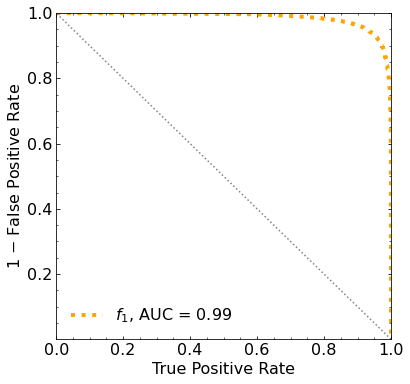

Classification score:


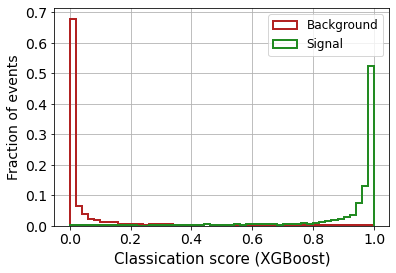


 ROC-AUC =  0.9858971416940243
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3675


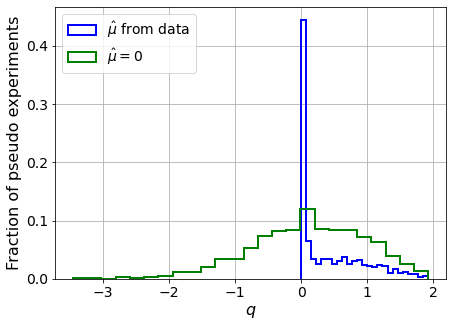

muhat mean:  0.22896827052404628
Z_bins:  0.36879819249188567
std Z_bins:  0.6771711561466172
Z_bins mu=0:  0.3503927385855913
std Z_bins mu=0:  1.2164661587225991

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3895


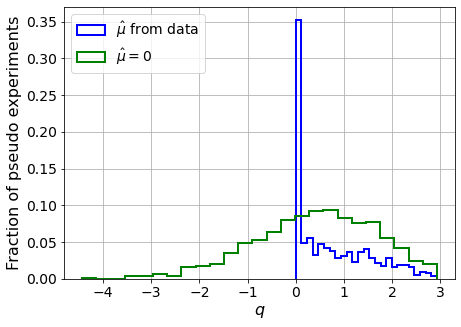

muhat mean:  0.07639391660198629
Z_bins:  0.7158681308378803
std Z_bins:  0.5515840428885711
Z_bins mu=0:  0.7158681308378803
std Z_bins mu=0:  0.8670083452860581

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.395


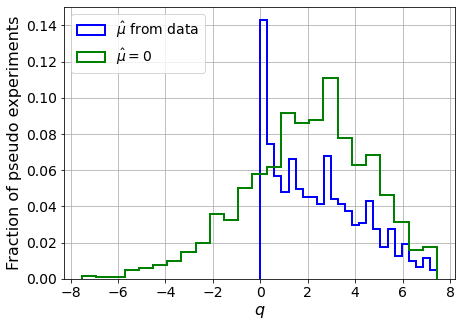

muhat mean:  0.056482056789662324
Z_bins:  1.4784565672189058
std Z_bins:  0.6406672587714609
Z_bins mu=0:  1.4780627056173261
std Z_bins mu=0:  0.8760228572937913

--------

B_expected:  643
S_expected:  13

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3715


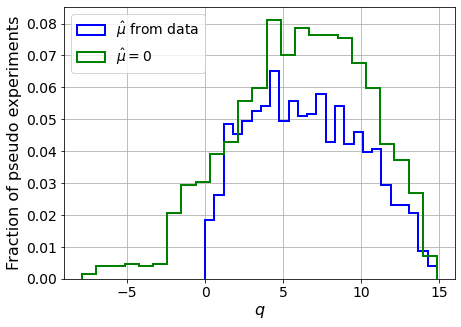

muhat mean:  0.023642470462698472
Z_bins:  2.5231687750315297
std Z_bins:  0.700937343977742
Z_bins mu=0:  2.5220049465381273
std Z_bins mu=0:  0.8473629814853183

--------

B_expected:  643
S_expected:  25

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.375


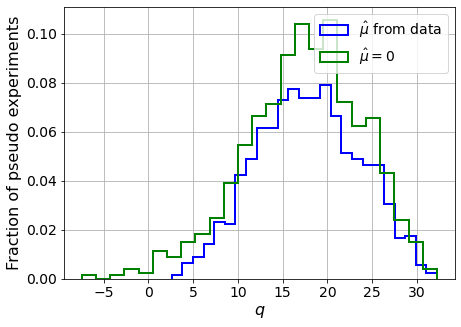

muhat mean:  0.013629749021245391
Z_bins:  4.21352389977325
std Z_bins:  0.675704196715152
Z_bins mu=0:  4.212289505041014
std Z_bins mu=0:  0.7683107050706738

--------

B_expected:  643
S_expected:  48

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3765


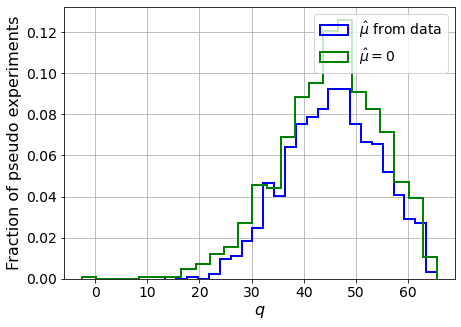

muhat mean:  0.0070696771129519645
Z_bins:  6.761655409999936
std Z_bins:  0.6502036035944591
Z_bins mu=0:  6.761219043861006
std Z_bins mu=0:  0.71083312233578

--------

B_expected:  643
S_expected:  93

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.374


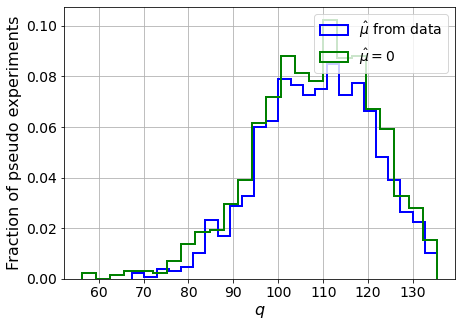

muhat mean:  0.0057218648957725795
Z_bins:  10.440464671370751
std Z_bins:  0.5926804178924407
Z_bins mu=0:  10.437303794296355
std Z_bins mu=0:  0.6345594706475134

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.381


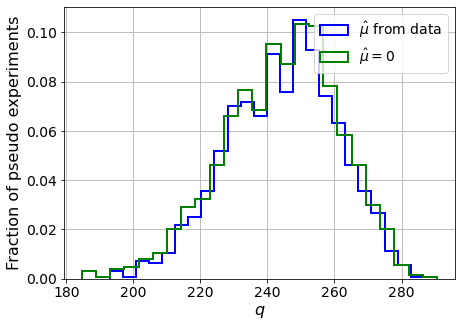

muhat mean:  0.0020625139460784233
Z_bins:  15.66609917613846
std Z_bins:  0.5224067113398605
Z_bins mu=0:  15.66609917613846
std Z_bins mu=0:  0.5474433031569038

--------

B_expected:  643
S_expected:  345

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.384


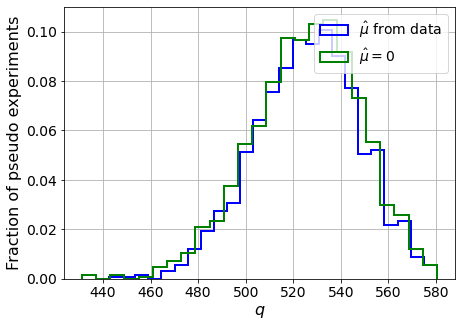

muhat mean:  0.0014962527669148734
Z_bins:  22.95390803196746
std Z_bins:  0.47786387655753004
Z_bins mu=0:  22.952296022040063
std Z_bins mu=0:  0.4959787326985389

--------

B_expected:  643
S_expected:  666

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.373


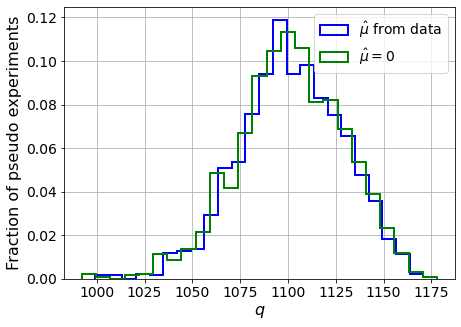

muhat mean:  0.0003975326654470711
Z_bins:  33.19190693177903
std Z_bins:  0.4084387397453671
Z_bins mu=0:  33.190654274158106
std Z_bins mu=0:  0.41876372869305306

--------

B_expected:  643
S_expected:  1286

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.382


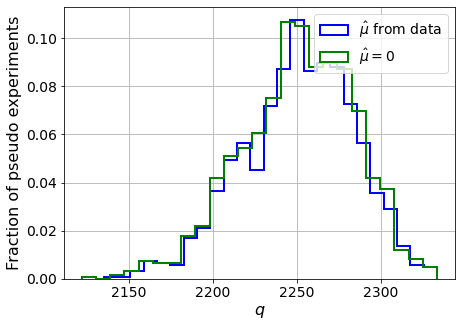

muhat mean:  0.00030297880941131214
Z_bins:  47.46361916049324
std Z_bins:  0.3481119018024431
Z_bins mu=0:  47.46247655030997
std Z_bins mu=0:  0.3555260152315174

--------

B_expected:  643
S_expected:  2484

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.364


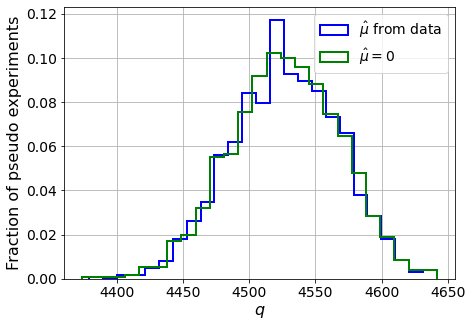

muhat mean:  0.0001763599466642372
Z_bins:  67.28261474311675
std Z_bins:  0.30130791613005625
Z_bins mu=0:  67.28249727952013
std Z_bins mu=0:  0.3057075028202016

--------

B_expected:  643
S_expected:  4795

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.372


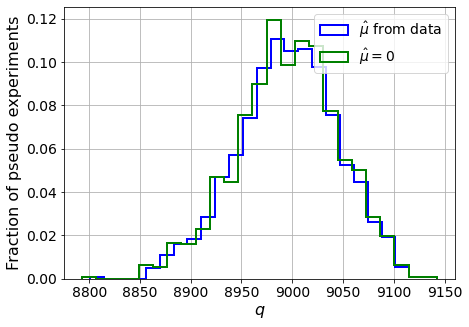

muhat mean:  0.00010319554103290042
Z_bins:  94.85463737954554
std Z_bins:  0.26128226687786865
Z_bins mu=0:  94.85367637801482
std Z_bins mu=0:  0.264607952307842

--------

B_expected:  643
S_expected:  9258

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3725


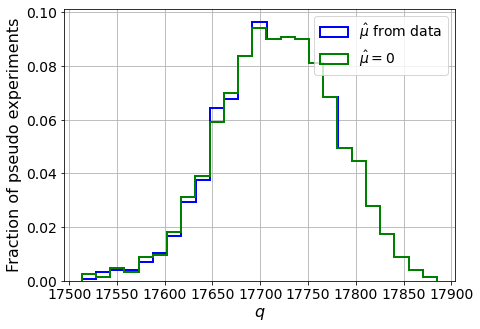

muhat mean:  3.9130164730700875e-05
Z_bins:  133.1121465767611
std Z_bins:  0.2256155557255516
Z_bins mu=0:  133.11124167386785
std Z_bins mu=0:  0.2277721290759214

--------

B_expected:  643
S_expected:  17875

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.379


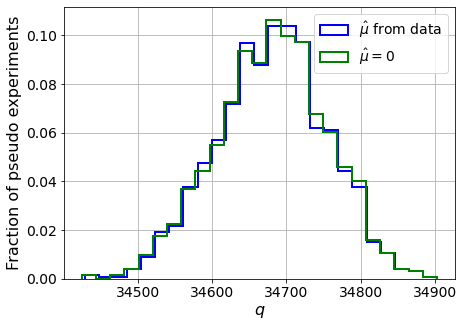

muhat mean:  2.5628909315442597e-05
Z_bins:  186.23600252980805
std Z_bins:  0.19722356606998204
Z_bins mu=0:  186.23505816983146
std Z_bins mu=0:  0.19876864022132323

--------


 FINAL RESULT:

[[0.36879819249188567, 0.6771711561466172, 0.22896827052404628, 0.3503927385855913, 1.2164661587225991], [0.7158681308378803, 0.5515840428885711, 0.07639391660198629, 0.7158681308378803, 0.8670083452860581], [1.4784565672189058, 0.6406672587714609, 0.056482056789662324, 1.4780627056173261, 0.8760228572937913], [2.5231687750315297, 0.700937343977742, 0.023642470462698472, 2.5220049465381273, 0.8473629814853183], [4.21352389977325, 0.675704196715152, 0.013629749021245391, 4.212289505041014, 0.7683107050706738], [6.761655409999936, 0.6502036035944591, 0.0070696771129519645, 6.761219043861006, 0.71083312233578], [10.440464671370751, 0.5926804178924407, 0.0057218648957725795, 10.437303794296355, 0.6345594706475134], [15.66609917613846, 0.5224067113398605, 0.0020625139460784233, 15.66609917613846, 0

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 392.53276374 349.98474015 300.1851422  244.06042144
 183.10140015 116.21281525  47.20181768 -24.77984414 -95.38386454]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 271.89440164 228.33887187
 177

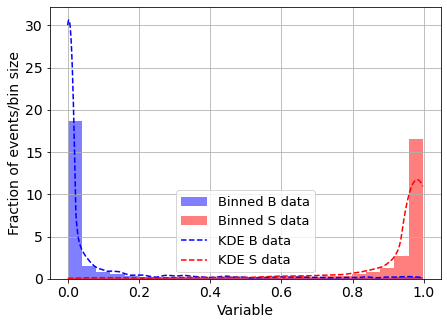

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



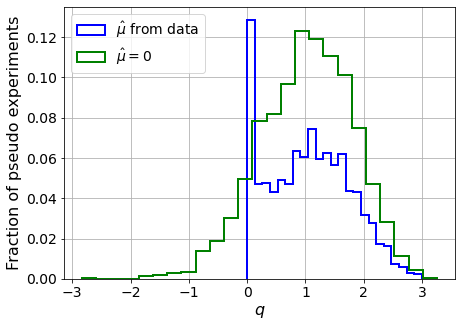

muhat mean:  -2.321658006242752
Z_bins:  1.030156173852657
std Z_bins:  0.341415872256302
Z_bins mu=0:  1.030156173852657
std Z_bins mu=0:  0.3841448129885931

--------

B_expected:  643
S_expected:  3



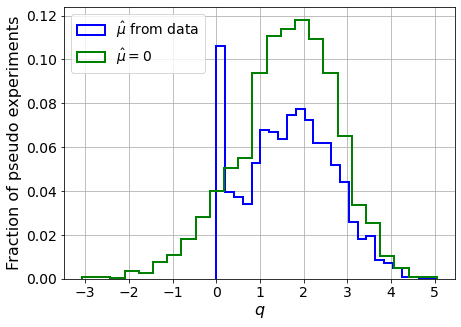

muhat mean:  -1.6198713523689634
Z_bins:  1.302172386742712
std Z_bins:  0.38740201231749205
Z_bins mu=0:  1.302172386742712
std Z_bins mu=0:  0.43725231096988154

--------

B_expected:  643
S_expected:  7



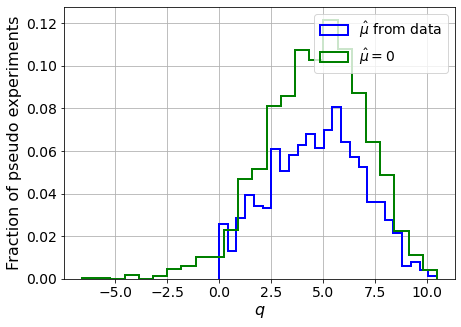

muhat mean:  -0.6952599295184183
Z_bins:  2.1910039111540867
std Z_bins:  0.501657533633524
Z_bins mu=0:  2.1910039111540867
std Z_bins mu=0:  0.5386344546628873

--------

B_expected:  643
S_expected:  13



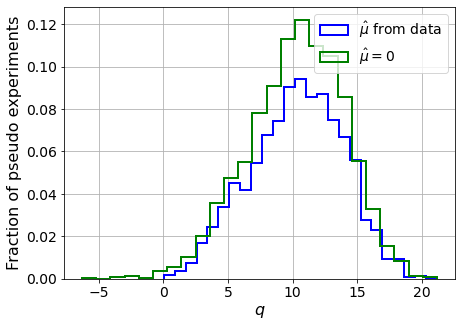

muhat mean:  -0.37013323811963245
Z_bins:  3.2460992746149437
std Z_bins:  0.5527101306709706
Z_bins mu=0:  3.2460992746149437
std Z_bins mu=0:  0.5735979528985174

--------

B_expected:  643
S_expected:  25



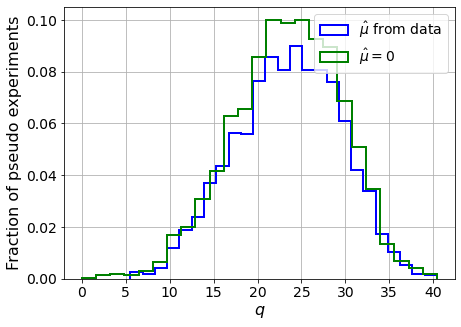

muhat mean:  -0.18785144963131492
Z_bins:  4.866826141204809
std Z_bins:  0.6153547981897579
Z_bins mu=0:  4.866826141204809
std Z_bins mu=0:  0.6318029114726577

--------

B_expected:  643
S_expected:  48



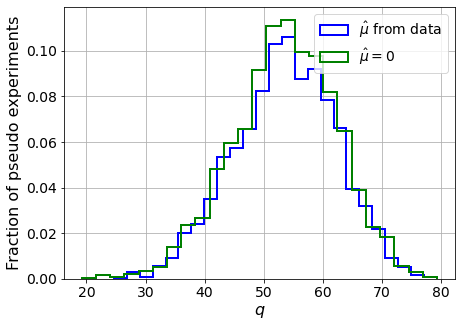

muhat mean:  -0.10554144897429749
Z_bins:  7.333620316408455
std Z_bins:  0.5860833401294776
Z_bins mu=0:  7.333620316408455
std Z_bins mu=0:  0.5959522444281361

--------

B_expected:  643
S_expected:  93



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


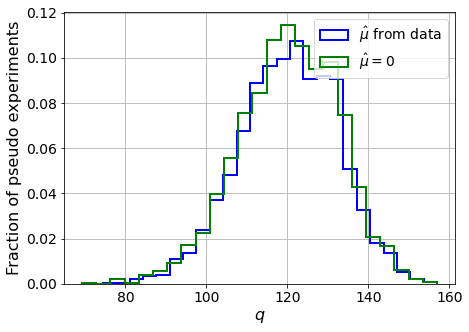

muhat mean:  -0.05597204914111894
Z_bins:  10.988157296993107
std Z_bins:  0.5517732169133526
Z_bins mu=0:  10.988157296993107
std Z_bins mu=0:  0.5581564460260908

--------

B_expected:  643
S_expected:  179



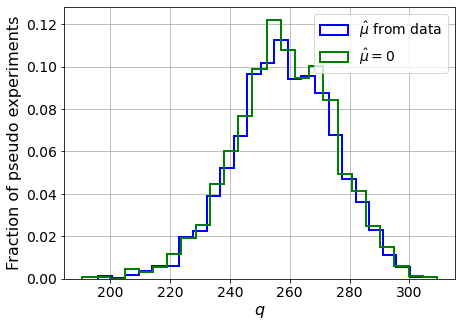

muhat mean:  -0.026102354823047985
Z_bins:  16.073273934161477
std Z_bins:  0.5221242673741556
Z_bins mu=0:  16.073084269018246
std Z_bins mu=0:  0.5270392873045096

--------

B_expected:  643
S_expected:  345



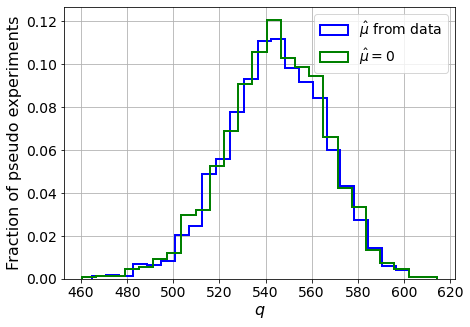

muhat mean:  -0.014044063518168365
Z_bins:  23.342075887641748
std Z_bins:  0.46942317723235416
Z_bins mu=0:  23.342075887641748
std Z_bins mu=0:  0.47262937420458406

--------

B_expected:  643
S_expected:  666



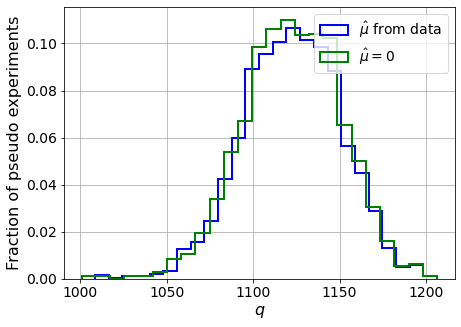

muhat mean:  -0.007207285893375854
Z_bins:  33.51150121572754
std Z_bins:  0.42030063590878586
Z_bins mu=0:  33.51150121572754
std Z_bins mu=0:  0.42228160825435795

--------

B_expected:  643
S_expected:  1286



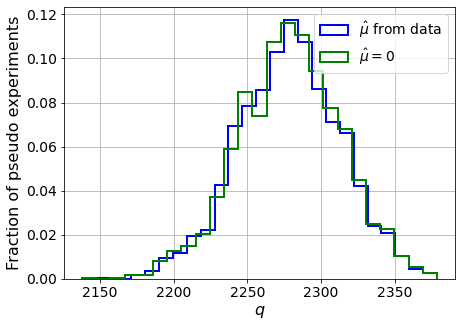

muhat mean:  -0.0035133887210567457
Z_bins:  47.738736936501816
std Z_bins:  0.36485941533725497
Z_bins mu=0:  47.738736936501816
std Z_bins mu=0:  0.36624433846606325

--------

B_expected:  643
S_expected:  2484



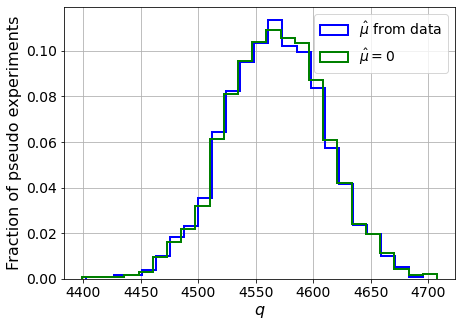

muhat mean:  -0.0019452848992792917
Z_bins:  67.58719043412972
std Z_bins:  0.32276992620434797
Z_bins mu=0:  67.58714347047923
std Z_bins mu=0:  0.3235969882717489

--------

B_expected:  643
S_expected:  4795



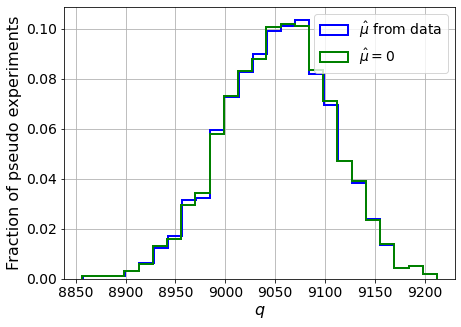

muhat mean:  -0.0009836757596990821
Z_bins:  95.15391341435765
std Z_bins:  0.2860576674593597
Z_bins mu=0:  95.15391341435765
std Z_bins mu=0:  0.28667377250434

--------

B_expected:  643
S_expected:  9258



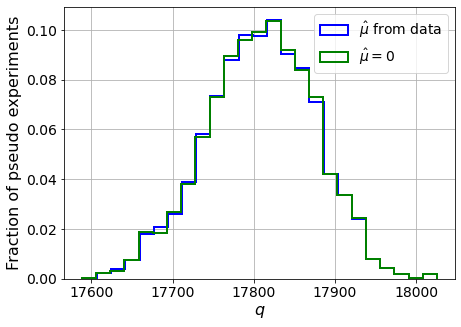

muhat mean:  -0.0005189037545343944
Z_bins:  133.4584442903872
std Z_bins:  0.24991347387038915
Z_bins mu=0:  133.45803155390587
std Z_bins mu=0:  0.250264150987103

--------

B_expected:  643
S_expected:  17875



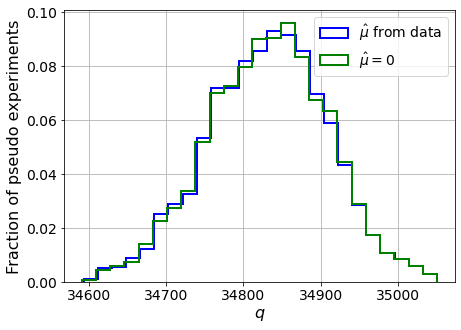

muhat mean:  -0.00026917035846410253
Z_bins:  186.6398889848518
std Z_bins:  0.20866187796858274
Z_bins mu=0:  186.63984865825773
std Z_bins mu=0:  0.2089319627719911

--------


 FINAL RESULT:

[[1.030156173852657, 0.341415872256302, -2.321658006242752, 1.030156173852657, 0.3841448129885931], [1.302172386742712, 0.38740201231749205, -1.6198713523689634, 1.302172386742712, 0.43725231096988154], [2.1910039111540867, 0.501657533633524, -0.6952599295184183, 2.1910039111540867, 0.5386344546628873], [3.2460992746149437, 0.5527101306709706, -0.37013323811963245, 3.2460992746149437, 0.5735979528985174], [4.866826141204809, 0.6153547981897579, -0.18785144963131492, 4.866826141204809, 0.6318029114726577], [7.333620316408455, 0.5860833401294776, -0.10554144897429749, 7.333620316408455, 0.5959522444281361], [10.988157296993107, 0.5517732169133526, -0.05597204914111894, 10.988157296993107, 0.5581564460260908], [16.073273934161477, 0.5221242673741556, -0.026102354823047985, 16.073084269018246, 0.52

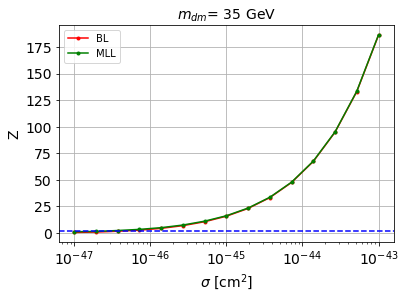


cross_BL_164:  4.126752829028213e-47
cross_BL_164_up:  2.5745104157510154e-47
cross_BL_164_down:  6.371679083661672e-47

cross_MLL_164:  2.4791838890357076e-47
cross_MLL_164_up:  1.742502365082223e-47
cross_MLL_164_down:  3.574591351166628e-47

#########################


#########################

mDM =  50 GeV


S_cs1.shape:  (35287,)
S_cs2.shape:  (35287,)
 NUM_DAT:  34105 

NUM_DAT_ER:  33671
NUM_DAT_AC:  119
NUM_DAT_CNNS:  1
NUM_DAT_RN:  31
NUM_DAT_WALL:  283

B_cs1cs2.shape:  (34105, 2)

S_cs1cs2.shape:  (34105, 2)


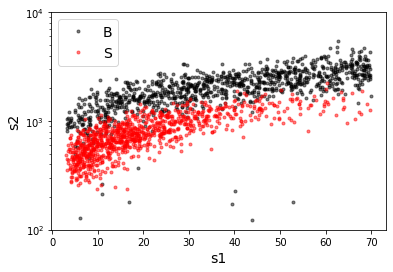

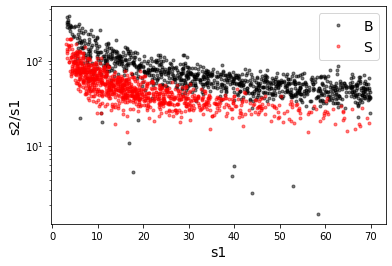

X_mon_B.shape:  (34105, 2)
X_mon_S.shape:  (34105, 2)
X_mon.shape:  (68210, 2)

X_mon_train :  (43483, 2)
y_mon_train :  (43483,)
X_mon_val :  (7674, 2)
y_mon_val :  (7674,)
X_mon_test :  (17053, 2)
y_mon_test :  (17053,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68533	validation_1-logloss:0.68531
[1]	validation_0-logloss:0.67766	validation_1-logloss:0.67762
[2]	validation_0-logloss:0.67016	validation_1-logloss:0.67009
[3]	validation_0-logloss:0.66278	validation_1-logloss:0.66270
[4]	validation_0-logloss:0.65556	validation_1-logloss:0.65546
[5]	validation_0-logloss:0.64848	validation_1-logloss:0.64834
[6]	validation_0-logloss:0.64152	validation_1-logloss:0.64137
[7]	validation_0-logloss:0.63468	validation_1-logloss:0.63451
[8]	validation_0-logloss:0.62799	validation_1-logloss:0.62780
[9]	validation_0-logloss:0.62140	validation_1-logloss:0.62119
[10]	validation_0-logloss:0.61493	validation_1-logloss:0.61470
[11]	validation_0-logloss:0.60859	validation_1-logloss:0.60834
[12]	validation_0-logloss:0.60236	validation_1-logloss:0.60208
[13]	validation_0-logloss:0.59625	validation_1-logloss:0.59595
[14]	validation_0-logloss:0.59021	validation_1-logloss:0.58991
[15]	validation_0-logloss:0.58431	validation_1-logloss:0.58396
[1

[130]	validation_0-logloss:0.26289	validation_1-logloss:0.26209
[131]	validation_0-logloss:0.26171	validation_1-logloss:0.26093
[132]	validation_0-logloss:0.26052	validation_1-logloss:0.25974
[133]	validation_0-logloss:0.25936	validation_1-logloss:0.25860
[134]	validation_0-logloss:0.25823	validation_1-logloss:0.25748
[135]	validation_0-logloss:0.25708	validation_1-logloss:0.25634
[136]	validation_0-logloss:0.25596	validation_1-logloss:0.25523
[137]	validation_0-logloss:0.25488	validation_1-logloss:0.25415
[138]	validation_0-logloss:0.25377	validation_1-logloss:0.25305
[139]	validation_0-logloss:0.25270	validation_1-logloss:0.25199
[140]	validation_0-logloss:0.25162	validation_1-logloss:0.25092
[141]	validation_0-logloss:0.25058	validation_1-logloss:0.24990
[142]	validation_0-logloss:0.24954	validation_1-logloss:0.24887
[143]	validation_0-logloss:0.24850	validation_1-logloss:0.24784
[144]	validation_0-logloss:0.24749	validation_1-logloss:0.24684
[145]	validation_0-logloss:0.24650	valid

[259]	validation_0-logloss:0.18336	validation_1-logloss:0.18387
[260]	validation_0-logloss:0.18309	validation_1-logloss:0.18361
[261]	validation_0-logloss:0.18283	validation_1-logloss:0.18335
[262]	validation_0-logloss:0.18257	validation_1-logloss:0.18310
[263]	validation_0-logloss:0.18231	validation_1-logloss:0.18284
[264]	validation_0-logloss:0.18206	validation_1-logloss:0.18259
[265]	validation_0-logloss:0.18181	validation_1-logloss:0.18235
[266]	validation_0-logloss:0.18157	validation_1-logloss:0.18211
[267]	validation_0-logloss:0.18132	validation_1-logloss:0.18187
[268]	validation_0-logloss:0.18107	validation_1-logloss:0.18163
[269]	validation_0-logloss:0.18084	validation_1-logloss:0.18140
[270]	validation_0-logloss:0.18060	validation_1-logloss:0.18117
[271]	validation_0-logloss:0.18037	validation_1-logloss:0.18094
[272]	validation_0-logloss:0.18013	validation_1-logloss:0.18071
[273]	validation_0-logloss:0.17990	validation_1-logloss:0.18049
[274]	validation_0-logloss:0.17966	valid

[388]	validation_0-logloss:0.16475	validation_1-logloss:0.16607
[389]	validation_0-logloss:0.16468	validation_1-logloss:0.16601
[390]	validation_0-logloss:0.16461	validation_1-logloss:0.16595
[391]	validation_0-logloss:0.16454	validation_1-logloss:0.16589
[392]	validation_0-logloss:0.16447	validation_1-logloss:0.16583
[393]	validation_0-logloss:0.16440	validation_1-logloss:0.16577
[394]	validation_0-logloss:0.16433	validation_1-logloss:0.16571
[395]	validation_0-logloss:0.16426	validation_1-logloss:0.16565
[396]	validation_0-logloss:0.16420	validation_1-logloss:0.16559
[397]	validation_0-logloss:0.16413	validation_1-logloss:0.16554
[398]	validation_0-logloss:0.16407	validation_1-logloss:0.16548
[399]	validation_0-logloss:0.16400	validation_1-logloss:0.16543
[400]	validation_0-logloss:0.16394	validation_1-logloss:0.16537
[401]	validation_0-logloss:0.16388	validation_1-logloss:0.16531
[402]	validation_0-logloss:0.16382	validation_1-logloss:0.16526
[403]	validation_0-logloss:0.16376	valid

[517]	validation_0-logloss:0.15935	validation_1-logloss:0.16183
[518]	validation_0-logloss:0.15933	validation_1-logloss:0.16182
[519]	validation_0-logloss:0.15931	validation_1-logloss:0.16181
[520]	validation_0-logloss:0.15929	validation_1-logloss:0.16179
[521]	validation_0-logloss:0.15927	validation_1-logloss:0.16178
[522]	validation_0-logloss:0.15925	validation_1-logloss:0.16176
[523]	validation_0-logloss:0.15922	validation_1-logloss:0.16176
[524]	validation_0-logloss:0.15920	validation_1-logloss:0.16175
[525]	validation_0-logloss:0.15918	validation_1-logloss:0.16173
[526]	validation_0-logloss:0.15916	validation_1-logloss:0.16172
[527]	validation_0-logloss:0.15914	validation_1-logloss:0.16169
[528]	validation_0-logloss:0.15912	validation_1-logloss:0.16168
[529]	validation_0-logloss:0.15910	validation_1-logloss:0.16167
[530]	validation_0-logloss:0.15908	validation_1-logloss:0.16166
[531]	validation_0-logloss:0.15906	validation_1-logloss:0.16164
[532]	validation_0-logloss:0.15904	valid

[646]	validation_0-logloss:0.15746	validation_1-logloss:0.16078
[647]	validation_0-logloss:0.15745	validation_1-logloss:0.16078
[648]	validation_0-logloss:0.15745	validation_1-logloss:0.16077
[649]	validation_0-logloss:0.15744	validation_1-logloss:0.16077
[650]	validation_0-logloss:0.15743	validation_1-logloss:0.16076
[651]	validation_0-logloss:0.15742	validation_1-logloss:0.16076
[652]	validation_0-logloss:0.15741	validation_1-logloss:0.16076
[653]	validation_0-logloss:0.15740	validation_1-logloss:0.16076
[654]	validation_0-logloss:0.15739	validation_1-logloss:0.16075
[655]	validation_0-logloss:0.15738	validation_1-logloss:0.16074
[656]	validation_0-logloss:0.15737	validation_1-logloss:0.16073
[657]	validation_0-logloss:0.15737	validation_1-logloss:0.16073
[658]	validation_0-logloss:0.15735	validation_1-logloss:0.16073
[659]	validation_0-logloss:0.15734	validation_1-logloss:0.16072
[660]	validation_0-logloss:0.15734	validation_1-logloss:0.16072
[661]	validation_0-logloss:0.15732	valid

[775]	validation_0-logloss:0.15636	validation_1-logloss:0.16037
[776]	validation_0-logloss:0.15635	validation_1-logloss:0.16037
[777]	validation_0-logloss:0.15634	validation_1-logloss:0.16037
[778]	validation_0-logloss:0.15634	validation_1-logloss:0.16036
[779]	validation_0-logloss:0.15633	validation_1-logloss:0.16036
[780]	validation_0-logloss:0.15632	validation_1-logloss:0.16036
[781]	validation_0-logloss:0.15632	validation_1-logloss:0.16036
[782]	validation_0-logloss:0.15631	validation_1-logloss:0.16035
[783]	validation_0-logloss:0.15630	validation_1-logloss:0.16034
[784]	validation_0-logloss:0.15629	validation_1-logloss:0.16034
[785]	validation_0-logloss:0.15628	validation_1-logloss:0.16034
[786]	validation_0-logloss:0.15626	validation_1-logloss:0.16034
[787]	validation_0-logloss:0.15626	validation_1-logloss:0.16033
[788]	validation_0-logloss:0.15624	validation_1-logloss:0.16033
[789]	validation_0-logloss:0.15623	validation_1-logloss:0.16032
[790]	validation_0-logloss:0.15622	valid

[904]	validation_0-logloss:0.15505	validation_1-logloss:0.16015
[905]	validation_0-logloss:0.15504	validation_1-logloss:0.16015
[906]	validation_0-logloss:0.15503	validation_1-logloss:0.16015
[907]	validation_0-logloss:0.15503	validation_1-logloss:0.16015
[908]	validation_0-logloss:0.15501	validation_1-logloss:0.16014
[909]	validation_0-logloss:0.15500	validation_1-logloss:0.16014
[910]	validation_0-logloss:0.15499	validation_1-logloss:0.16014
[911]	validation_0-logloss:0.15498	validation_1-logloss:0.16014
[912]	validation_0-logloss:0.15497	validation_1-logloss:0.16013
[913]	validation_0-logloss:0.15495	validation_1-logloss:0.16013
[914]	validation_0-logloss:0.15494	validation_1-logloss:0.16012
[915]	validation_0-logloss:0.15493	validation_1-logloss:0.16012
[916]	validation_0-logloss:0.15491	validation_1-logloss:0.16011
[917]	validation_0-logloss:0.15491	validation_1-logloss:0.16011
[918]	validation_0-logloss:0.15490	validation_1-logloss:0.16011
[919]	validation_0-logloss:0.15488	valid

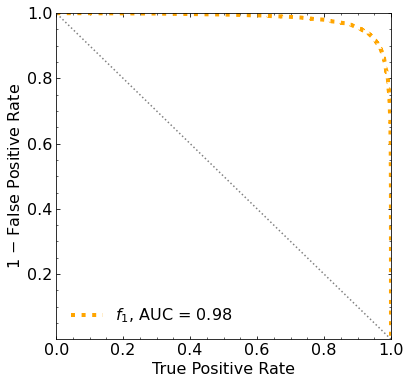

Classification score:


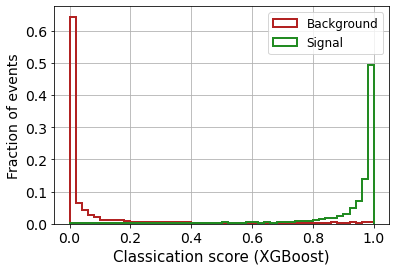


 ROC-AUC =  0.982592312602827
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.203


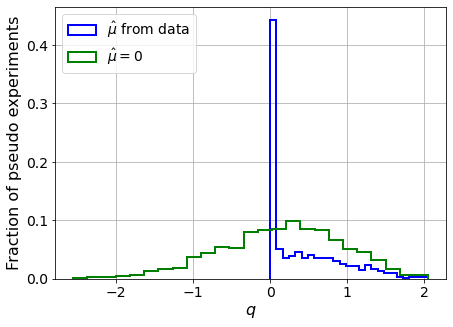

muhat mean:  0.128880035825796
Z_bins:  0.428980717787183
std Z_bins:  0.5604467497644348
Z_bins mu=0:  0.42893266307479877
std Z_bins mu=0:  0.9303038774394077

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.217


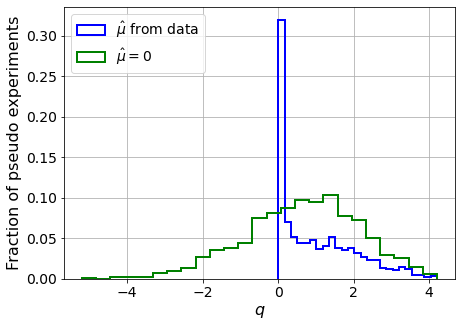

muhat mean:  0.04864754792567047
Z_bins:  0.8573404821372919
std Z_bins:  0.597407823442365
Z_bins mu=0:  0.8573404821372919
std Z_bins mu=0:  0.8910970458485169

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2135


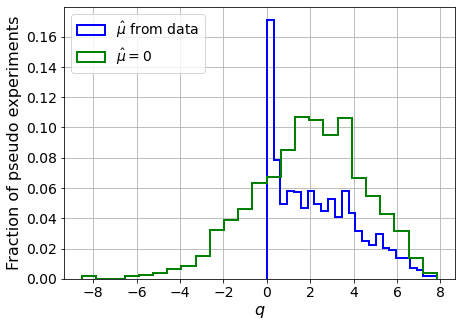

muhat mean:  0.011080391408046907
Z_bins:  1.4447202362531306
std Z_bins:  0.6501835364835531
Z_bins mu=0:  1.4447202362531306
std Z_bins mu=0:  0.8736621570035976

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.203


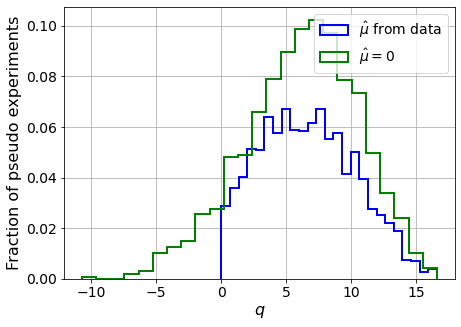

muhat mean:  0.02329930118092238
Z_bins:  2.543158637093072
std Z_bins:  0.7099412430631984
Z_bins mu=0:  2.543141721188454
std Z_bins mu=0:  0.8606229587323624

--------

B_expected:  643
S_expected:  27

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1995


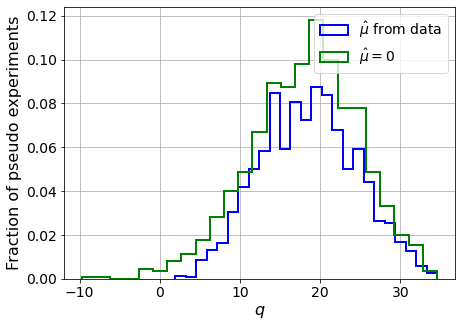

muhat mean:  0.00786586013845398
Z_bins:  4.308674300957849
std Z_bins:  0.6934379680561797
Z_bins mu=0:  4.307560642241242
std Z_bins mu=0:  0.7774925219174263

--------

B_expected:  643
S_expected:  51

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.206


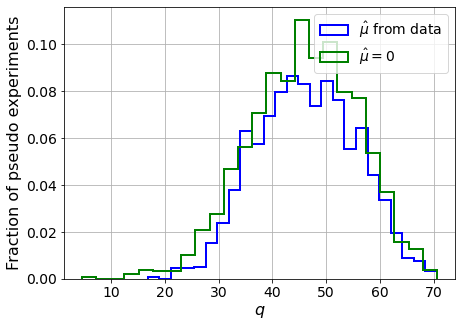

muhat mean:  0.007061619995774436
Z_bins:  6.784444832122725
std Z_bins:  0.6777874966090898
Z_bins mu=0:  6.784363902641436
std Z_bins mu=0:  0.7325786170873831

--------

B_expected:  643
S_expected:  99

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.205


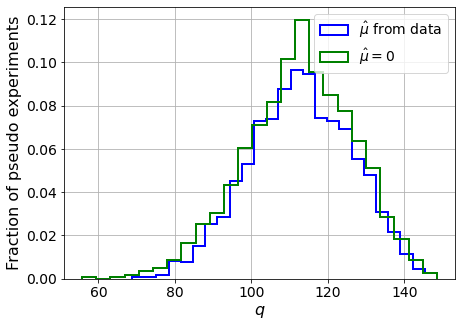

muhat mean:  0.0032014719989570885
Z_bins:  10.624660810652738
std Z_bins:  0.6311098912569338
Z_bins mu=0:  10.623774557468193
std Z_bins mu=0:  0.6691318030648414

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.212


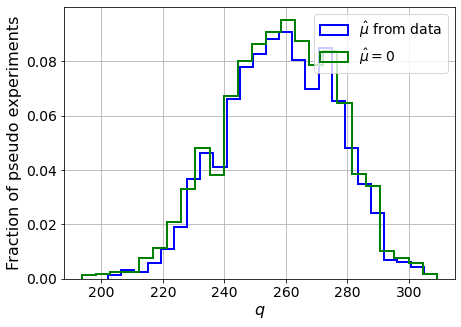

muhat mean:  0.0008634005888853742
Z_bins:  16.085007369122902
std Z_bins:  0.5588927864834352
Z_bins mu=0:  16.084496277026705
std Z_bins mu=0:  0.5810783764301747

--------

B_expected:  643
S_expected:  370

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.211


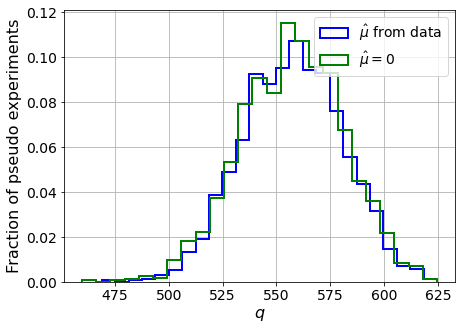

muhat mean:  0.0008500762504101349
Z_bins:  23.611817028452062
std Z_bins:  0.487877933433131
Z_bins mu=0:  23.611230551721043
std Z_bins mu=0:  0.5021370328312775

--------

B_expected:  643
S_expected:  714

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.201


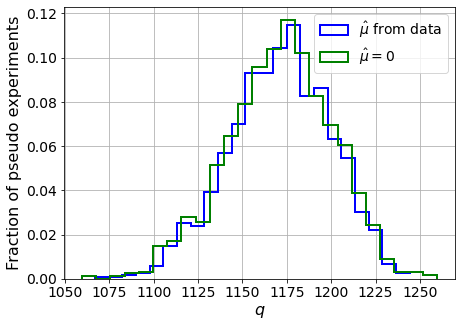

muhat mean:  0.0001338697070617272
Z_bins:  34.244844314656326
std Z_bins:  0.422051578959003
Z_bins mu=0:  34.243925019928945
std Z_bins mu=0:  0.4318578416472284

--------

B_expected:  643
S_expected:  1378

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2125


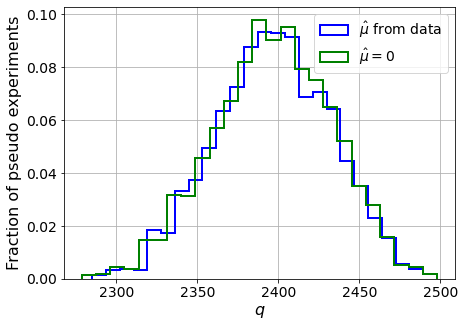

muhat mean:  0.0001629440043243171
Z_bins:  48.96105315984211
std Z_bins:  0.3663582116503214
Z_bins mu=0:  48.959453518327976
std Z_bins mu=0:  0.37267438009758597

--------

B_expected:  643
S_expected:  2661

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.198


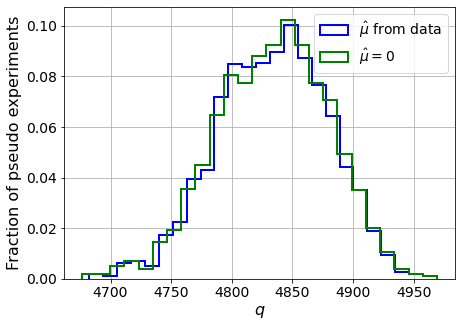

muhat mean:  -2.1224741230272377e-05
Z_bins:  69.54128690703942
std Z_bins:  0.32801357928512326
Z_bins mu=0:  69.54128690703942
std Z_bins mu=0:  0.3321593582241002

--------

B_expected:  643
S_expected:  5138

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2005


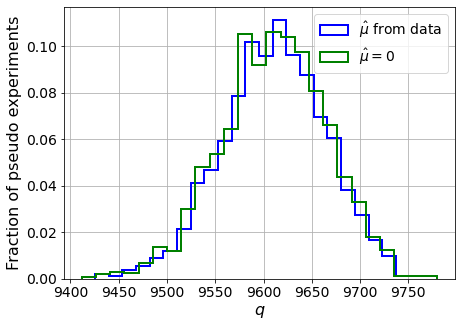

muhat mean:  4.9322765392829194e-05
Z_bins:  98.04638837052846
std Z_bins:  0.27552370851319136
Z_bins mu=0:  98.04436405228961
std Z_bins mu=0:  0.2788378095188621

--------

B_expected:  643
S_expected:  9921

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.22


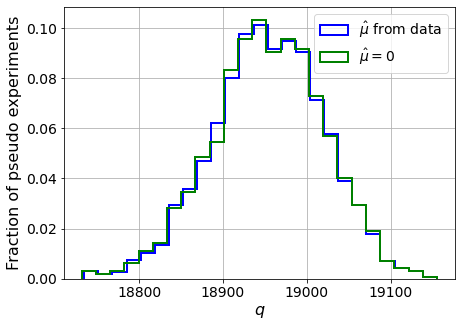

muhat mean:  2.1661899833587032e-05
Z_bins:  137.6763179231787
std Z_bins:  0.24133500846105538
Z_bins mu=0:  137.67564140600138
std Z_bins mu=0:  0.24342394280779833

--------

B_expected:  643
S_expected:  19154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2095


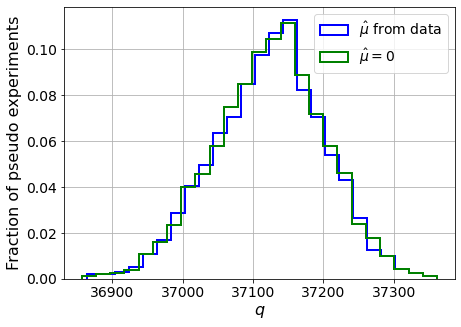

muhat mean:  9.610352866252973e-06
Z_bins:  192.68652634882235
std Z_bins:  0.20208923194403067
Z_bins mu=0:  192.6863559549342
std Z_bins mu=0:  0.20349843168619428

--------


 FINAL RESULT:

[[0.428980717787183, 0.5604467497644348, 0.128880035825796, 0.42893266307479877, 0.9303038774394077], [0.8573404821372919, 0.597407823442365, 0.04864754792567047, 0.8573404821372919, 0.8910970458485169], [1.4447202362531306, 0.6501835364835531, 0.011080391408046907, 1.4447202362531306, 0.8736621570035976], [2.543158637093072, 0.7099412430631984, 0.02329930118092238, 2.543141721188454, 0.8606229587323624], [4.308674300957849, 0.6934379680561797, 0.00786586013845398, 4.307560642241242, 0.7774925219174263], [6.784444832122725, 0.6777874966090898, 0.007061619995774436, 6.784363902641436, 0.7325786170873831], [10.624660810652738, 0.6311098912569338, 0.0032014719989570885, 10.623774557468193, 0.6691318030648414], [16.085007369122902, 0.5588927864834352, 0.0008634005888853742, 16.084496277026705, 0.581

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 341.49646549 301.89877456 260.24201201 211.90105054
 157.0529026   96.43397676  34.60828665 -32.87512949 -99.01684956]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 334.12056279 304.60525922 267.16989031 224.68185389
 175

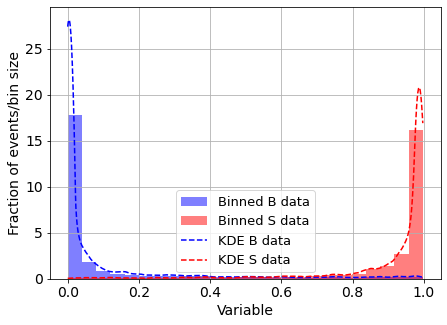

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



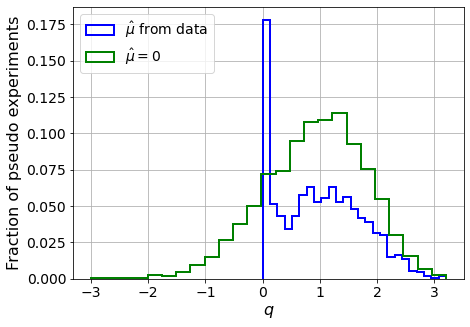

muhat mean:  -2.228257720937122
Z_bins:  0.9864360234155324
std Z_bins:  0.3716491830808153
Z_bins mu=0:  0.9864360234155324
std Z_bins mu=0:  0.4457635264449766

--------

B_expected:  643
S_expected:  4



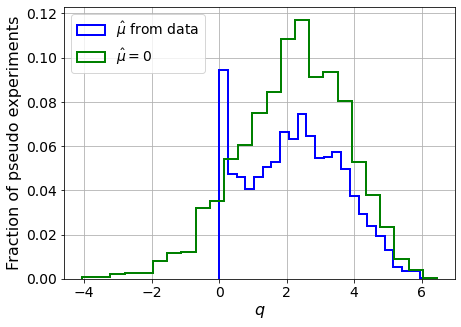

muhat mean:  -0.9514581531934341
Z_bins:  1.5147415602065997
std Z_bins:  0.4606207718628654
Z_bins mu=0:  1.5147415602065997
std Z_bins mu=0:  0.5236824315504172

--------

B_expected:  643
S_expected:  7



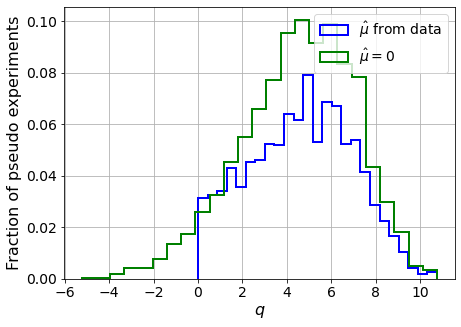

muhat mean:  -0.5875258850215153
Z_bins:  2.178867374465335
std Z_bins:  0.5342606637073404
Z_bins mu=0:  2.178867374465335
std Z_bins mu=0:  0.5868131131672788

--------

B_expected:  643
S_expected:  14



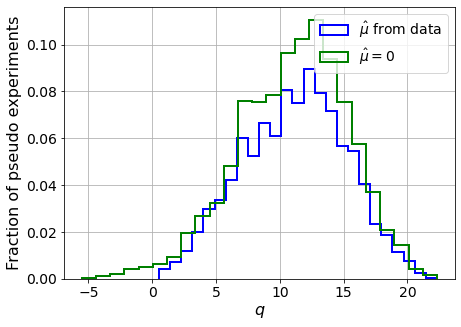

muhat mean:  -0.2839914943173514
Z_bins:  3.370153952878842
std Z_bins:  0.5991230736295167
Z_bins mu=0:  3.370153952878842
std Z_bins mu=0:  0.6365808537109369

--------

B_expected:  643
S_expected:  27



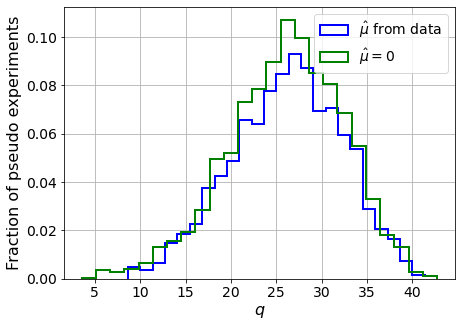

muhat mean:  -0.1505353485986502
Z_bins:  5.143732671914591
std Z_bins:  0.5907031532319037
Z_bins mu=0:  5.143732671914591
std Z_bins mu=0:  0.6116408801593267

--------

B_expected:  643
S_expected:  51



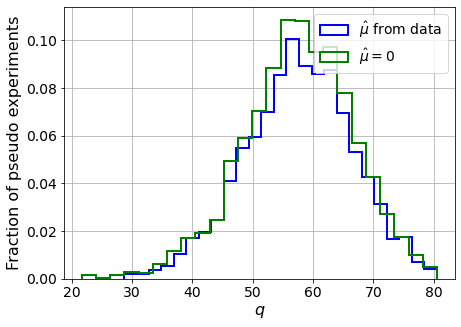

muhat mean:  -0.0775040296226909
Z_bins:  7.606244258334397
std Z_bins:  0.5832618243894137
Z_bins mu=0:  7.606244258334397
std Z_bins mu=0:  0.5997170315896437

--------

B_expected:  643
S_expected:  99



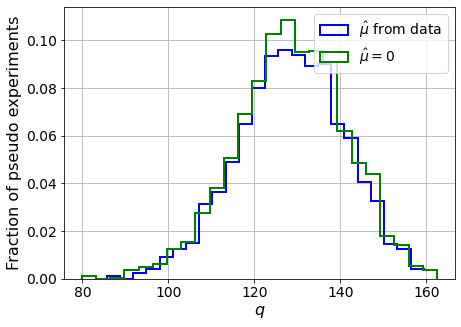

muhat mean:  -0.04269290897169274
Z_bins:  11.347189057946725
std Z_bins:  0.5444242967461941
Z_bins mu=0:  11.347189057946725
std Z_bins mu=0:  0.553277926783674

--------

B_expected:  643
S_expected:  192



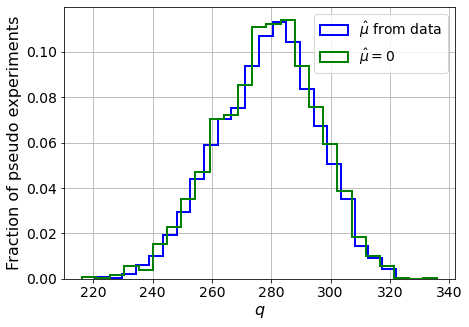

muhat mean:  -0.01903018361879694
Z_bins:  16.72139040465836
std Z_bins:  0.5011163626126258
Z_bins mu=0:  16.72139040465836
std Z_bins mu=0:  0.5071967644514772

--------

B_expected:  643
S_expected:  370



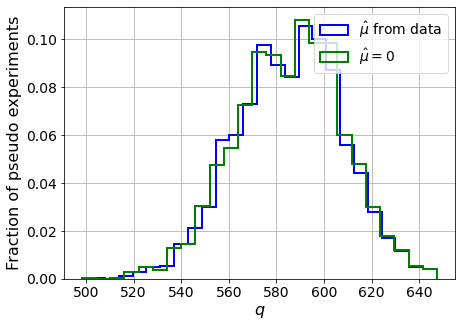

muhat mean:  -0.010752886891706942
Z_bins:  24.22070628393244
std Z_bins:  0.4596949943357325
Z_bins mu=0:  24.22070628393244
std Z_bins mu=0:  0.46312449186208776

--------

B_expected:  643
S_expected:  714



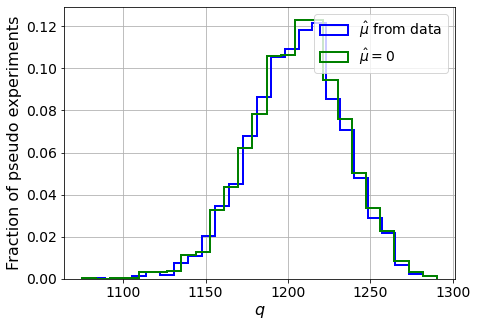

muhat mean:  -0.006543352994130517
Z_bins:  34.7375648102456
std Z_bins:  0.4127276562577443
Z_bins mu=0:  34.73749677538662
std Z_bins mu=0:  0.4154156839213082

--------

B_expected:  643
S_expected:  1378



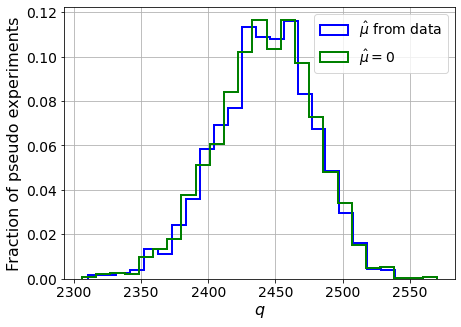

muhat mean:  -0.00272065755047138
Z_bins:  49.4307742723431
std Z_bins:  0.3687226825462038
Z_bins mu=0:  49.43062035142798
std Z_bins mu=0:  0.3707389460226921

--------

B_expected:  643
S_expected:  2661



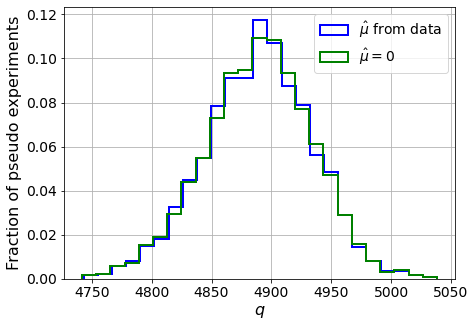

muhat mean:  -0.0015841891928591455
Z_bins:  69.93377902834503
std Z_bins:  0.31875536063060245
Z_bins mu=0:  69.93377902834503
std Z_bins mu=0:  0.3201294649725575

--------

B_expected:  643
S_expected:  5138



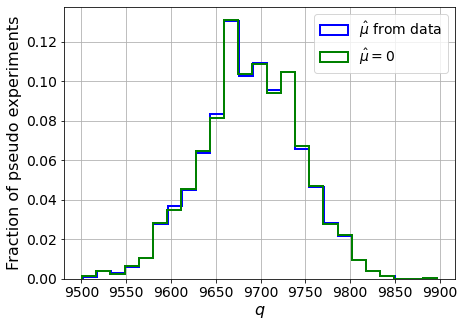

muhat mean:  -0.0008064767129102415
Z_bins:  98.43260192958817
std Z_bins:  0.27834086327239393
Z_bins mu=0:  98.43220511481961
std Z_bins mu=0:  0.2792061880524979

--------

B_expected:  643
S_expected:  9921



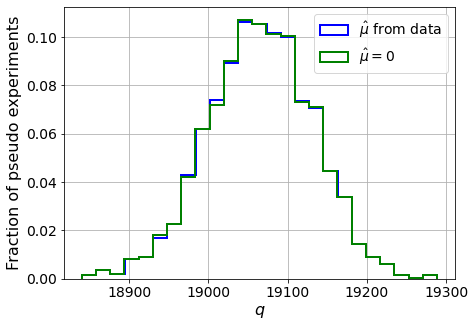

muhat mean:  -0.00034558951140066583
Z_bins:  138.08042630809675
std Z_bins:  0.23980122626438774
Z_bins mu=0:  138.08029089961093
std Z_bins mu=0:  0.24028825770615625

--------

B_expected:  643
S_expected:  19154



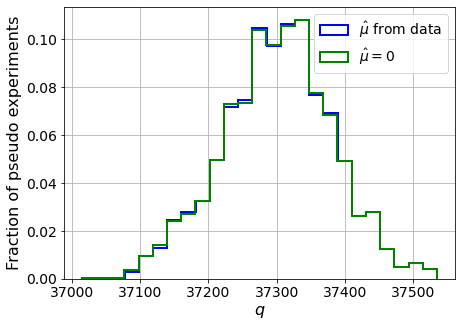

muhat mean:  -0.0002120902827199786
Z_bins:  193.1435005568098
std Z_bins:  0.2090173648515973
Z_bins mu=0:  193.14337610770727
std Z_bins mu=0:  0.2093828131970722

--------


 FINAL RESULT:

[[0.9864360234155324, 0.3716491830808153, -2.228257720937122, 0.9864360234155324, 0.4457635264449766], [1.5147415602065997, 0.4606207718628654, -0.9514581531934341, 1.5147415602065997, 0.5236824315504172], [2.178867374465335, 0.5342606637073404, -0.5875258850215153, 2.178867374465335, 0.5868131131672788], [3.370153952878842, 0.5991230736295167, -0.2839914943173514, 3.370153952878842, 0.6365808537109369], [5.143732671914591, 0.5907031532319037, -0.1505353485986502, 5.143732671914591, 0.6116408801593267], [7.606244258334397, 0.5832618243894137, -0.0775040296226909, 7.606244258334397, 0.5997170315896437], [11.347189057946725, 0.5444242967461941, -0.04269290897169274, 11.347189057946725, 0.553277926783674], [16.72139040465836, 0.5011163626126258, -0.01903018361879694, 16.72139040465836, 0.50719676445

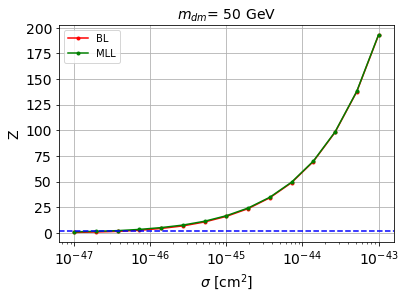


cross_BL_164:  4.190083687755331e-47
cross_BL_164_up:  2.335585929453233e-47
cross_BL_164_down:  6.367863310344144e-47

cross_MLL_164:  2.1857568833524696e-47
cross_MLL_164_up:  1.35047863716278e-47
cross_MLL_164_down:  3.7085108551863866e-47

#########################


#########################

mDM =  100 GeV


S_cs1.shape:  (37757,)
S_cs2.shape:  (37757,)
 NUM_DAT:  35163 

NUM_DAT_ER:  34715
NUM_DAT_AC:  123
NUM_DAT_CNNS:  1
NUM_DAT_RN:  32
NUM_DAT_WALL:  292

B_cs1cs2.shape:  (35163, 2)

S_cs1cs2.shape:  (35163, 2)


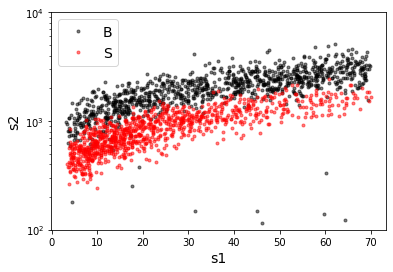

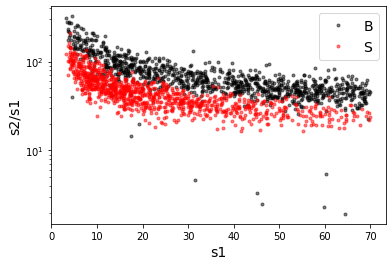

X_mon_B.shape:  (35163, 2)
X_mon_S.shape:  (35163, 2)
X_mon.shape:  (70326, 2)

X_mon_train :  (44832, 2)
y_mon_train :  (44832,)
X_mon_val :  (7912, 2)
y_mon_val :  (7912,)
X_mon_test :  (17582, 2)
y_mon_test :  (17582,)

[0]	validation_0-logloss:0.68557	validation_1-logloss:0.68568
[1]	validation_0-logloss:0.67809	validation_1-logloss:0.67831
[2]	validation_0-logloss:0.67080	validation_1-logloss:0.67114
[3]	validation_0-logloss:0.66360	validation_1-logloss:0.66404
[4]	validation_0-logloss:0.65660	validation_1-logloss:0.65714
[5]	validation_0-logloss:0.64967	validation_1-logloss:0.65032
[6]	validation_0-logloss:0.64294	validation_1-logloss:0.64367
[7]	validation_0-logloss:0.63625	validation_1-logloss:0.63708
[8]	validation_0-logloss:0.62973	validation_1-logloss:0.63065
[9]	validation_0-logloss:0.62330	validation_1-logloss:0.62431
[10]	validation_0-logloss:0.61698	validation_1-logloss:0.61809
[11]	validation_0-logloss:0.61079	validation_1-logloss:0.61198


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.60472	validation_1-logloss:0.60602
[13]	validation_0-logloss:0.59875	validation_1-logloss:0.60012
[14]	validation_0-logloss:0.59288	validation_1-logloss:0.59433
[15]	validation_0-logloss:0.58713	validation_1-logloss:0.58868
[16]	validation_0-logloss:0.58145	validation_1-logloss:0.58309
[17]	validation_0-logloss:0.57589	validation_1-logloss:0.57762
[18]	validation_0-logloss:0.57041	validation_1-logloss:0.57220
[19]	validation_0-logloss:0.56503	validation_1-logloss:0.56692
[20]	validation_0-logloss:0.55975	validation_1-logloss:0.56171
[21]	validation_0-logloss:0.55454	validation_1-logloss:0.55659
[22]	validation_0-logloss:0.54945	validation_1-logloss:0.55157
[23]	validation_0-logloss:0.54441	validation_1-logloss:0.54661
[24]	validation_0-logloss:0.53948	validation_1-logloss:0.54176
[25]	validation_0-logloss:0.53462	validation_1-logloss:0.53698
[26]	validation_0-logloss:0.52982	validation_1-logloss:0.53225
[27]	validation_0-logloss:0.52513	validation_1-logloss:

[142]	validation_0-logloss:0.25979	validation_1-logloss:0.26802
[143]	validation_0-logloss:0.25878	validation_1-logloss:0.26706
[144]	validation_0-logloss:0.25780	validation_1-logloss:0.26610
[145]	validation_0-logloss:0.25681	validation_1-logloss:0.26517
[146]	validation_0-logloss:0.25583	validation_1-logloss:0.26423
[147]	validation_0-logloss:0.25486	validation_1-logloss:0.26332
[148]	validation_0-logloss:0.25394	validation_1-logloss:0.26241
[149]	validation_0-logloss:0.25300	validation_1-logloss:0.26153
[150]	validation_0-logloss:0.25207	validation_1-logloss:0.26064
[151]	validation_0-logloss:0.25116	validation_1-logloss:0.25976
[152]	validation_0-logloss:0.25024	validation_1-logloss:0.25889
[153]	validation_0-logloss:0.24936	validation_1-logloss:0.25805
[154]	validation_0-logloss:0.24848	validation_1-logloss:0.25719
[155]	validation_0-logloss:0.24762	validation_1-logloss:0.25637
[156]	validation_0-logloss:0.24674	validation_1-logloss:0.25553
[157]	validation_0-logloss:0.24589	valid

[271]	validation_0-logloss:0.19191	validation_1-logloss:0.20391
[272]	validation_0-logloss:0.19169	validation_1-logloss:0.20370
[273]	validation_0-logloss:0.19146	validation_1-logloss:0.20351
[274]	validation_0-logloss:0.19123	validation_1-logloss:0.20331
[275]	validation_0-logloss:0.19101	validation_1-logloss:0.20312
[276]	validation_0-logloss:0.19079	validation_1-logloss:0.20292
[277]	validation_0-logloss:0.19057	validation_1-logloss:0.20273
[278]	validation_0-logloss:0.19036	validation_1-logloss:0.20253
[279]	validation_0-logloss:0.19014	validation_1-logloss:0.20233
[280]	validation_0-logloss:0.18993	validation_1-logloss:0.20214
[281]	validation_0-logloss:0.18973	validation_1-logloss:0.20196
[282]	validation_0-logloss:0.18951	validation_1-logloss:0.20177
[283]	validation_0-logloss:0.18931	validation_1-logloss:0.20158
[284]	validation_0-logloss:0.18911	validation_1-logloss:0.20139
[285]	validation_0-logloss:0.18891	validation_1-logloss:0.20121
[286]	validation_0-logloss:0.18872	valid

[528]	validation_0-logloss:0.17117	validation_1-logloss:0.18692
[529]	validation_0-logloss:0.17114	validation_1-logloss:0.18690
[530]	validation_0-logloss:0.17112	validation_1-logloss:0.18689
[531]	validation_0-logloss:0.17111	validation_1-logloss:0.18688
[532]	validation_0-logloss:0.17109	validation_1-logloss:0.18687
[533]	validation_0-logloss:0.17107	validation_1-logloss:0.18687
[534]	validation_0-logloss:0.17105	validation_1-logloss:0.18686
[535]	validation_0-logloss:0.17103	validation_1-logloss:0.18685
[536]	validation_0-logloss:0.17101	validation_1-logloss:0.18684
[537]	validation_0-logloss:0.17099	validation_1-logloss:0.18683
[538]	validation_0-logloss:0.17098	validation_1-logloss:0.18682
[539]	validation_0-logloss:0.17096	validation_1-logloss:0.18681
[540]	validation_0-logloss:0.17094	validation_1-logloss:0.18680
[541]	validation_0-logloss:0.17092	validation_1-logloss:0.18680
[542]	validation_0-logloss:0.17090	validation_1-logloss:0.18679
[543]	validation_0-logloss:0.17088	valid

[657]	validation_0-logloss:0.16962	validation_1-logloss:0.18634
[658]	validation_0-logloss:0.16961	validation_1-logloss:0.18634
[659]	validation_0-logloss:0.16960	validation_1-logloss:0.18634
[660]	validation_0-logloss:0.16959	validation_1-logloss:0.18634
[661]	validation_0-logloss:0.16958	validation_1-logloss:0.18634
[662]	validation_0-logloss:0.16957	validation_1-logloss:0.18634
[663]	validation_0-logloss:0.16956	validation_1-logloss:0.18634
[664]	validation_0-logloss:0.16955	validation_1-logloss:0.18633
[665]	validation_0-logloss:0.16955	validation_1-logloss:0.18633
[666]	validation_0-logloss:0.16953	validation_1-logloss:0.18633
[667]	validation_0-logloss:0.16953	validation_1-logloss:0.18633
[668]	validation_0-logloss:0.16952	validation_1-logloss:0.18632
[669]	validation_0-logloss:0.16951	validation_1-logloss:0.18632
[670]	validation_0-logloss:0.16951	validation_1-logloss:0.18632
[671]	validation_0-logloss:0.16950	validation_1-logloss:0.18632
[672]	validation_0-logloss:0.16949	valid

[786]	validation_0-logloss:0.16851	validation_1-logloss:0.18620
[787]	validation_0-logloss:0.16850	validation_1-logloss:0.18620
[788]	validation_0-logloss:0.16849	validation_1-logloss:0.18619
[789]	validation_0-logloss:0.16848	validation_1-logloss:0.18619
[790]	validation_0-logloss:0.16847	validation_1-logloss:0.18619
[791]	validation_0-logloss:0.16846	validation_1-logloss:0.18619
[792]	validation_0-logloss:0.16845	validation_1-logloss:0.18619
[793]	validation_0-logloss:0.16845	validation_1-logloss:0.18619
[794]	validation_0-logloss:0.16844	validation_1-logloss:0.18619
[795]	validation_0-logloss:0.16842	validation_1-logloss:0.18620
[796]	validation_0-logloss:0.16842	validation_1-logloss:0.18619
[797]	validation_0-logloss:0.16841	validation_1-logloss:0.18619
[798]	validation_0-logloss:0.16841	validation_1-logloss:0.18620
[799]	validation_0-logloss:0.16839	validation_1-logloss:0.18620
[800]	validation_0-logloss:0.16839	validation_1-logloss:0.18620
[801]	validation_0-logloss:0.16838	valid

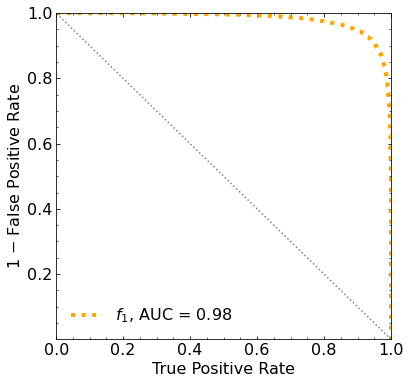

Classification score:


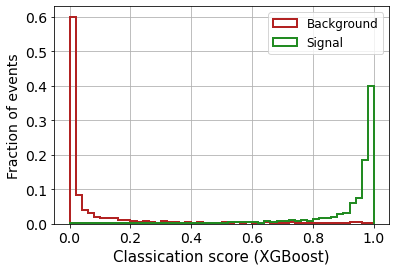


 ROC-AUC =  0.9803669487107838
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


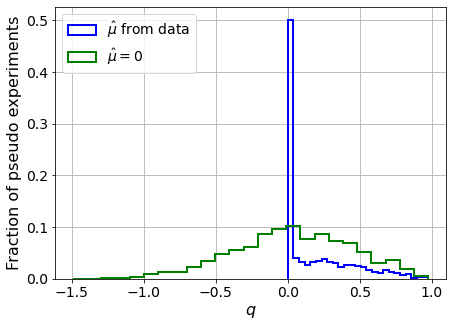

muhat mean:  0.11725080012610511
Z_bins:  0.19686199106694854
std Z_bins:  0.612171009460398
Z_bins mu=0:  0.1958766355914743
std Z_bins mu=0:  1.0476589149830569

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1145


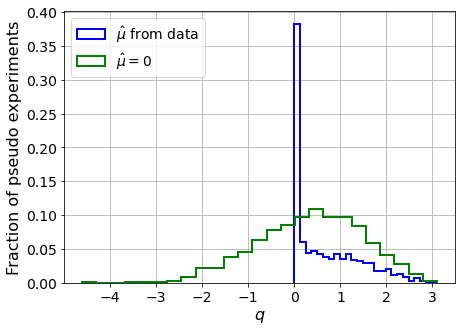

muhat mean:  0.08367348345907401
Z_bins:  0.632446949721679
std Z_bins:  0.5750987041796783
Z_bins mu=0:  0.632446949721679
std Z_bins mu=0:  0.9075924301629256

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1155


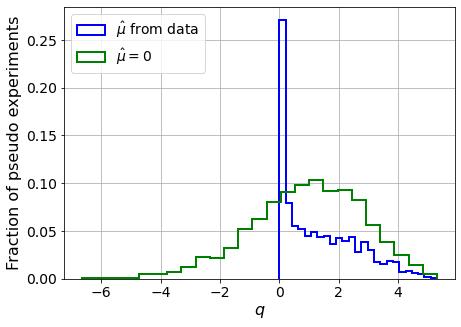

muhat mean:  0.053241130693188116
Z_bins:  1.0268826835302036
std Z_bins:  0.6184225227905945
Z_bins mu=0:  1.0267029871598856
std Z_bins mu=0:  0.9046935437539515

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.119


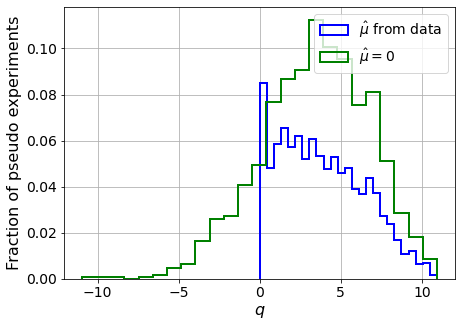

muhat mean:  0.018910468079519776
Z_bins:  1.9048512831466011
std Z_bins:  0.6809824025013003
Z_bins mu=0:  1.9047716547864972
std Z_bins mu=0:  0.8608914728090867

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.124


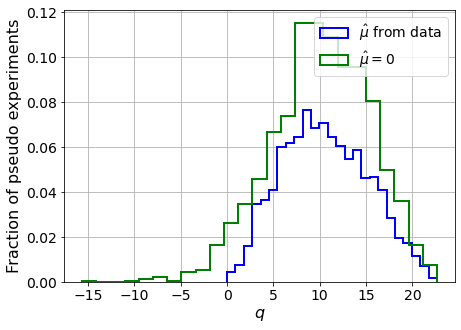

muhat mean:  0.011464021420606162
Z_bins:  3.2072518789935156
std Z_bins:  0.7150543949655729
Z_bins mu=0:  3.206858353245041
std Z_bins mu=0:  0.8308163483147449

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.11


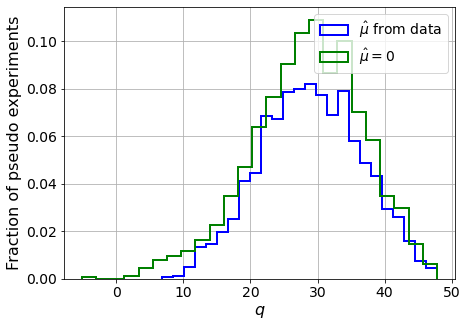

muhat mean:  0.004516355229011132
Z_bins:  5.379055794579407
std Z_bins:  0.6972626771118715
Z_bins mu=0:  5.378847938249876
std Z_bins mu=0:  0.7694410802130494

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1125


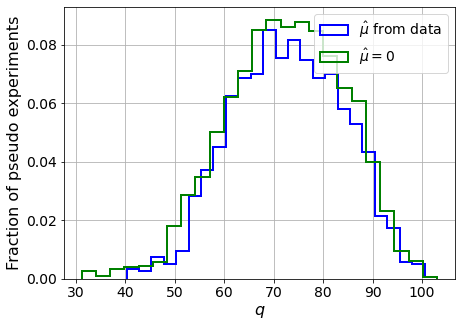

muhat mean:  0.0024205057803674875
Z_bins:  8.537619615956245
std Z_bins:  0.6517612596647636
Z_bins mu=0:  8.537031870384553
std Z_bins mu=0:  0.6940372933700629

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0975


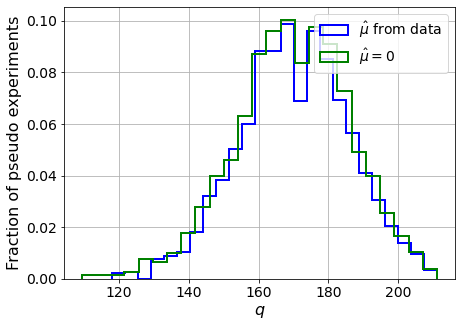

muhat mean:  0.0012581351628065415
Z_bins:  13.031362335271105
std Z_bins:  0.6016365998310294
Z_bins mu=0:  13.031202160269267
std Z_bins mu=0:  0.6302350728925514

--------

B_expected:  643
S_expected:  268

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1185


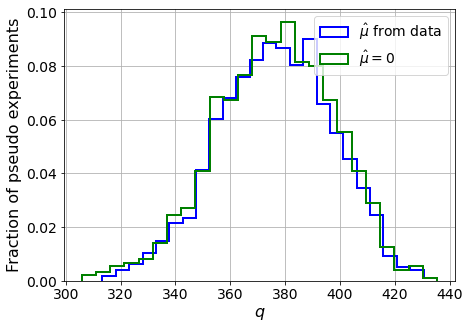

muhat mean:  0.0008749436577021565
Z_bins:  19.414484640782554
std Z_bins:  0.5349036502195734
Z_bins mu=0:  19.41351628507854
std Z_bins mu=0:  0.5541286917481375

--------

B_expected:  643
S_expected:  518

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1115


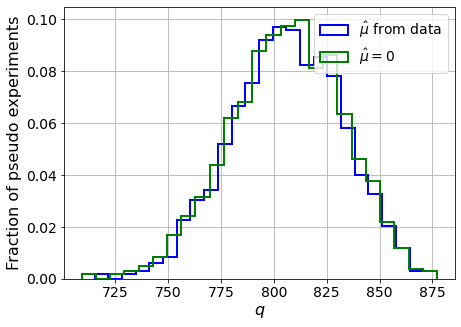

muhat mean:  0.0001873594541643614
Z_bins:  28.40329591230944
std Z_bins:  0.4584056687855677
Z_bins mu=0:  28.40235007055922
std Z_bins mu=0:  0.46934749385746766

--------

B_expected:  643
S_expected:  1001

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1175


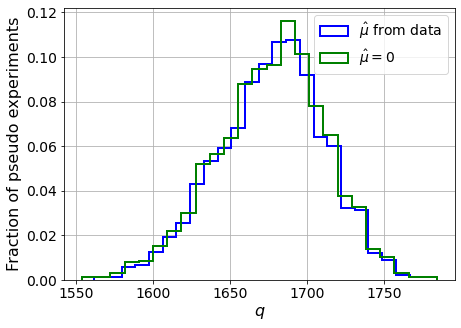

muhat mean:  0.00018192526892927806
Z_bins:  40.97779331251786
std Z_bins:  0.42394461901751446
Z_bins mu=0:  40.975919215316196
std Z_bins mu=0:  0.43218943175759994

--------

B_expected:  643
S_expected:  1932

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1025


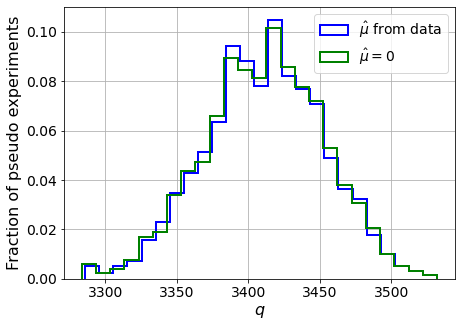

muhat mean:  0.00019764099422486795
Z_bins:  58.41911098172233
std Z_bins:  0.35450624158928556
Z_bins mu=0:  58.41867858865715
std Z_bins mu=0:  0.35981847536292433

--------

B_expected:  643
S_expected:  3730

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1085


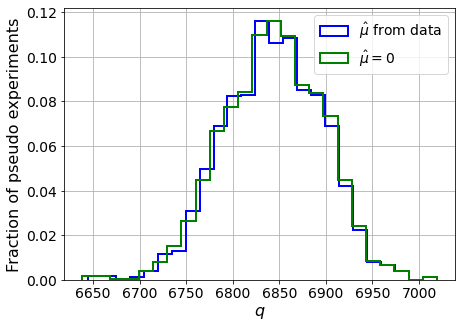

muhat mean:  6.606970129320826e-05
Z_bins:  82.72955848315124
std Z_bins:  0.31693286812641536
Z_bins mu=0:  82.72928235927253
std Z_bins mu=0:  0.3207554113077299

--------

B_expected:  643
S_expected:  7201

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1195


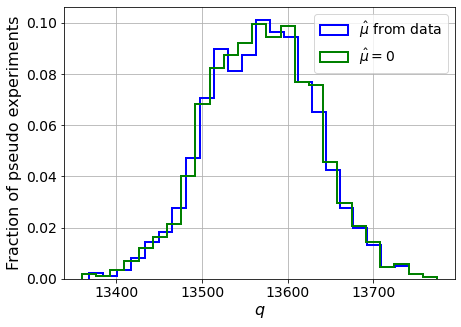

muhat mean:  3.9237897530837084e-05
Z_bins:  116.49093590671805
std Z_bins:  0.2699024442650998
Z_bins mu=0:  116.48977285097041
std Z_bins mu=0:  0.2720704355839381

--------

B_expected:  643
S_expected:  13904

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1155


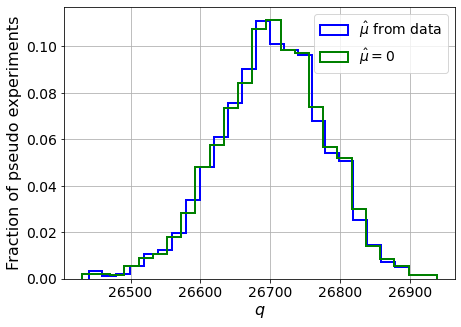

muhat mean:  1.1670597016098113e-05
Z_bins:  163.41446751228005
std Z_bins:  0.23397645321975669
Z_bins mu=0:  163.41357924179323
std Z_bins mu=0:  0.23551928310122353

--------


 FINAL RESULT:

[[0.19686199106694854, 0.612171009460398, 0.11725080012610511, 0.1958766355914743, 1.0476589149830569], [0.632446949721679, 0.5750987041796783, 0.08367348345907401, 0.632446949721679, 0.9075924301629256], [1.0268826835302036, 0.6184225227905945, 0.053241130693188116, 1.0267029871598856, 0.9046935437539515], [1.9048512831466011, 0.6809824025013003, 0.018910468079519776, 1.9047716547864972, 0.8608914728090867], [3.2072518789935156, 0.7150543949655729, 0.011464021420606162, 3.206858353245041, 0.8308163483147449], [5.379055794579407, 0.6972626771118715, 0.004516355229011132, 5.378847938249876, 0.7694410802130494], [8.537619615956245, 0.6517612596647636, 0.0024205057803674875, 8.537031870384553, 0.6940372933700629], [13.031362335271105, 0.6016365998310294, 0.0012581351628065415, 13.031202160269267,

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 346.8731702  309.42730066 265.45674102 213.79266909
 161.98624136 104.11555613  38.49121697 -27.66372611 -96.64827406]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 285.60627259 252.73824167 212.64144965
 162

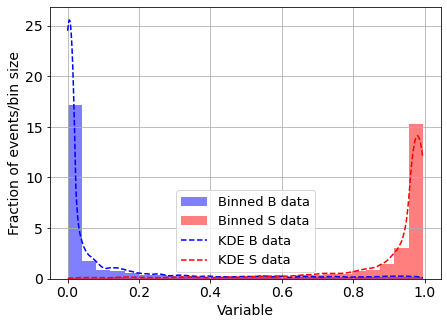

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



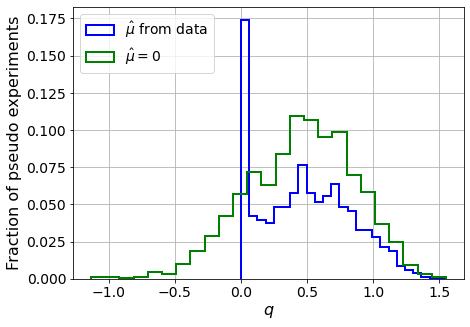

muhat mean:  -5.339472140970221
Z_bins:  0.6927884832670244
std Z_bins:  0.25221857786437235
Z_bins mu=0:  0.6927884832670244
std Z_bins mu=0:  0.2912993858059997

--------

B_expected:  643
S_expected:  3



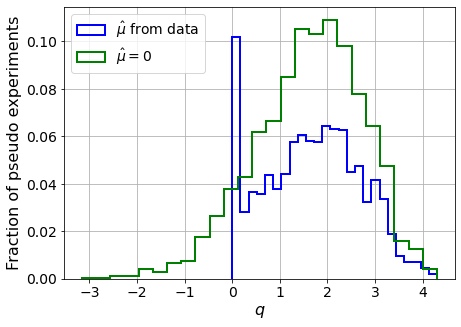

muhat mean:  -1.8474000700162643
Z_bins:  1.3080196229069163
std Z_bins:  0.38389308093742747
Z_bins mu=0:  1.3080196229069163
std Z_bins mu=0:  0.4309923886541215

--------

B_expected:  643
S_expected:  5



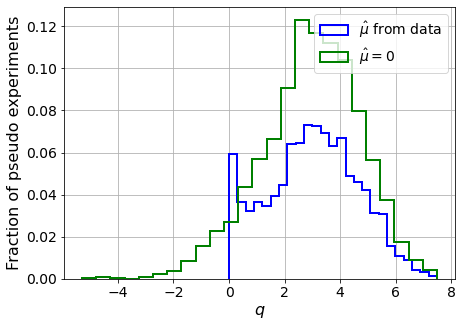

muhat mean:  -1.1097838326947302
Z_bins:  1.751234459307744
std Z_bins:  0.46366873072628284
Z_bins mu=0:  1.751234459307744
std Z_bins mu=0:  0.5121593240955729

--------

B_expected:  643
S_expected:  10



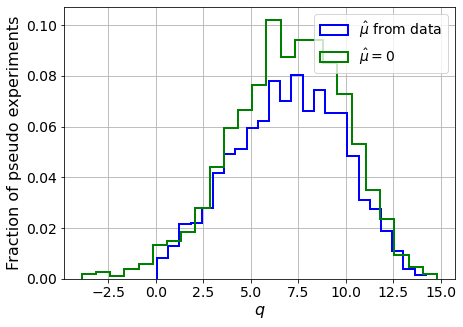

muhat mean:  -0.510441264671202
Z_bins:  2.6653819648392854
std Z_bins:  0.5351982400578715
Z_bins mu=0:  2.6653819648392854
std Z_bins mu=0:  0.5650304105038191

--------

B_expected:  643
S_expected:  19



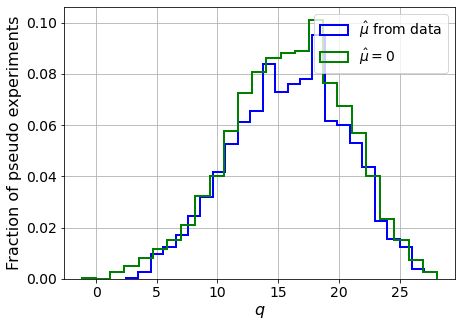

muhat mean:  -0.2652040928424243
Z_bins:  4.012136091050562
std Z_bins:  0.5818936336059045
Z_bins mu=0:  4.012136091050562
std Z_bins mu=0:  0.6003410420752392

--------

B_expected:  643
S_expected:  37



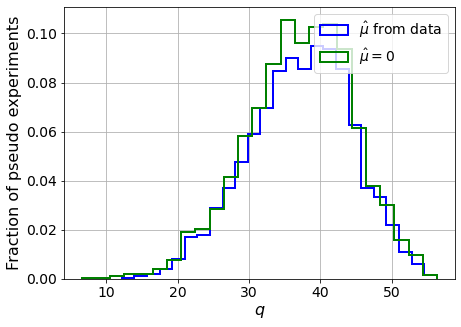

muhat mean:  -0.1431740412548979
Z_bins:  6.117268803292083
std Z_bins:  0.5925834121419461
Z_bins mu=0:  6.117268803292083
std Z_bins mu=0:  0.606998888014943

--------

B_expected:  643
S_expected:  72



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


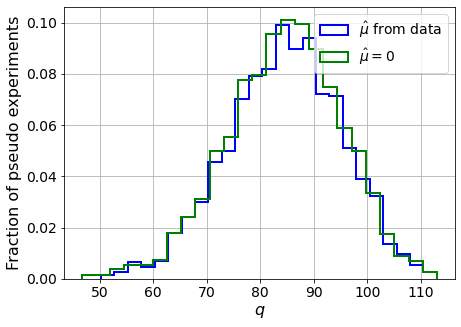

muhat mean:  -0.06850027598790444
Z_bins:  9.214145432580926
std Z_bins:  0.5730429777418269
Z_bins mu=0:  9.214145432580926
std Z_bins mu=0:  0.581948027554945

--------

B_expected:  643
S_expected:  139



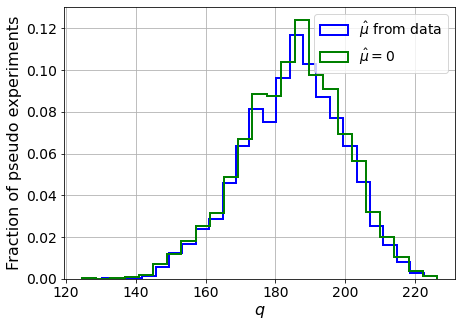

muhat mean:  -0.03544846856206736
Z_bins:  13.62991219475231
std Z_bins:  0.5334419664619412
Z_bins mu=0:  13.62991219475231
std Z_bins mu=0:  0.5393476774756871

--------

B_expected:  643
S_expected:  268



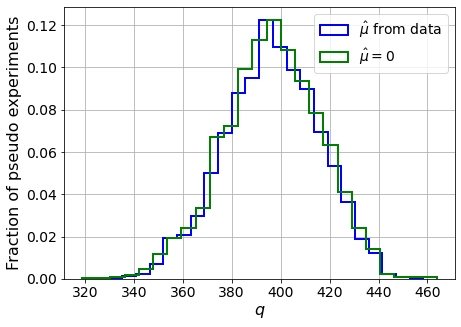

muhat mean:  -0.01995538122291938
Z_bins:  19.912433149152204
std Z_bins:  0.4929953204429787
Z_bins mu=0:  19.912433149152204
std Z_bins mu=0:  0.49654315583597913

--------

B_expected:  643
S_expected:  518



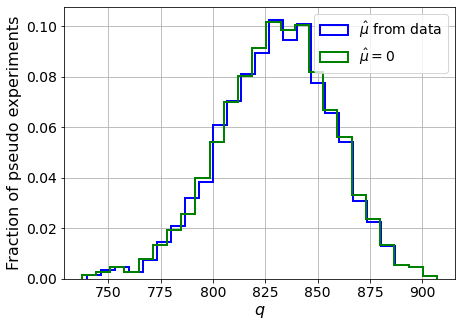

muhat mean:  -0.010361687048660927
Z_bins:  28.83523219201195
std Z_bins:  0.46131508515068886
Z_bins mu=0:  28.83523219201195
std Z_bins mu=0:  0.4644248941374462

--------

B_expected:  643
S_expected:  1001



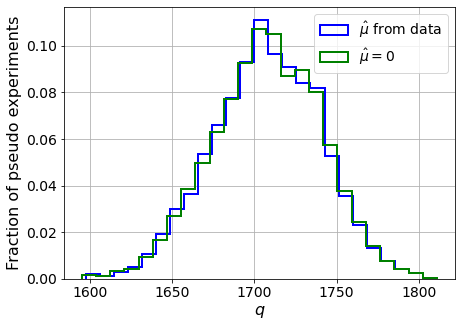

muhat mean:  -0.005734015677651467
Z_bins:  41.32933288494303
std Z_bins:  0.3982787319208183
Z_bins mu=0:  41.32933288494303
std Z_bins mu=0:  0.399488604164573

--------

B_expected:  643
S_expected:  1932



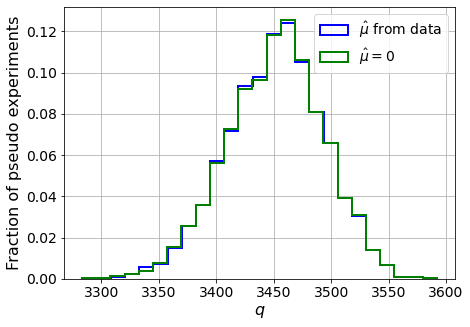

muhat mean:  -0.0024468085620800582
Z_bins:  58.76670700501673
std Z_bins:  0.3587545277038581
Z_bins mu=0:  58.76652500977873
std Z_bins mu=0:  0.3597284198671647

--------

B_expected:  643
S_expected:  3730



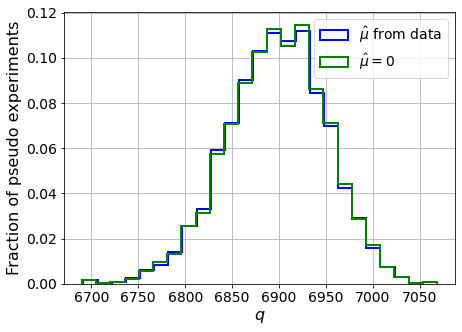

muhat mean:  -0.0013418513344267296
Z_bins:  83.05561436180022
std Z_bins:  0.3181359063339351
Z_bins mu=0:  83.05524348153881
std Z_bins mu=0:  0.31884593928296767

--------

B_expected:  643
S_expected:  7201



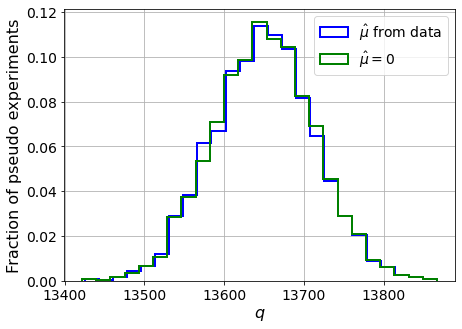

muhat mean:  -0.0007278490118658763
Z_bins:  116.8317868565454
std Z_bins:  0.26967859191435134
Z_bins mu=0:  116.8317868565454
std Z_bins mu=0:  0.2701045760235518

--------

B_expected:  643
S_expected:  13904



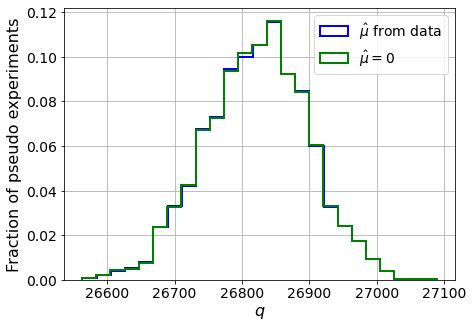

muhat mean:  -0.0003525289587011798
Z_bins:  163.7825183138081
std Z_bins:  0.2325888293110982
Z_bins mu=0:  163.7825183138081
std Z_bins mu=0:  0.2328816052085984

--------


 FINAL RESULT:

[[0.6927884832670244, 0.25221857786437235, -5.339472140970221, 0.6927884832670244, 0.2912993858059997], [1.3080196229069163, 0.38389308093742747, -1.8474000700162643, 1.3080196229069163, 0.4309923886541215], [1.751234459307744, 0.46366873072628284, -1.1097838326947302, 1.751234459307744, 0.5121593240955729], [2.6653819648392854, 0.5351982400578715, -0.510441264671202, 2.6653819648392854, 0.5650304105038191], [4.012136091050562, 0.5818936336059045, -0.2652040928424243, 4.012136091050562, 0.6003410420752392], [6.117268803292083, 0.5925834121419461, -0.1431740412548979, 6.117268803292083, 0.606998888014943], [9.214145432580926, 0.5730429777418269, -0.06850027598790444, 9.214145432580926, 0.581948027554945], [13.62991219475231, 0.5334419664619412, -0.03544846856206736, 13.62991219475231, 0.53934767747

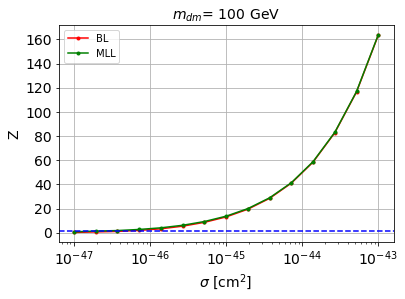


cross_BL_164:  5.901375098779627e-47
cross_BL_164_up:  3.6979922878651826e-47
cross_BL_164_down:  8.93066966882424e-47

cross_MLL_164:  3.160256410238024e-47
cross_MLL_164_up:  1.844404131734865e-47
cross_MLL_164_down:  4.90830704827016e-47

#########################


#########################

mDM =  200 GeV


S_cs1.shape:  (34573,)
S_cs2.shape:  (34573,)
 NUM_DAT:  31737 

NUM_DAT_ER:  31333
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  263

B_cs1cs2.shape:  (31737, 2)

S_cs1cs2.shape:  (31737, 2)


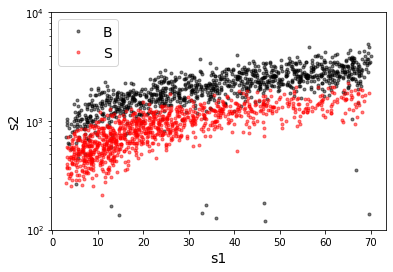

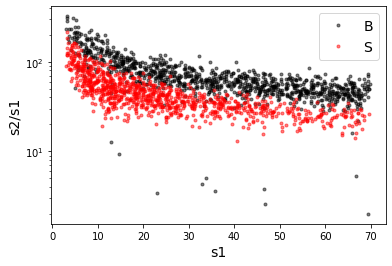

X_mon_B.shape:  (31737, 2)
X_mon_S.shape:  (31737, 2)
X_mon.shape:  (63474, 2)

X_mon_train :  (40464, 2)
y_mon_train :  (40464,)
X_mon_val :  (7141, 2)
y_mon_val :  (7141,)
X_mon_test :  (15869, 2)
y_mon_test :  (15869,)

[0]	validation_0-logloss:0.68560	validation_1-logloss:0.68566
[1]	validation_0-logloss:0.67821	validation_1-logloss:0.67830
[2]	validation_0-logloss:0.67096	validation_1-logloss:0.67112
[3]	validation_0-logloss:0.66384	validation_1-logloss:0.66405
[4]	validation_0-logloss:0.65687	validation_1-logloss:0.65714
[5]	validation_0-logloss:0.65002	validation_1-logloss:0.65034
[6]	validation_0-logloss:0.64331	validation_1-logloss:0.64367
[7]	validation_0-logloss:0.63671	validation_1-logloss:0.63712
[8]	validation_0-logloss:0.63024	validation_1-logloss:0.63072
[9]	validation_0-logloss:0.62389	validation_1-logloss:0.62438
[10]	validation_0-logloss:0.61766	validation_1-logloss:0.61820
[11]	validation_0-logloss:0.61154	validation_1-logloss:0.61214


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.60552	validation_1-logloss:0.60615
[13]	validation_0-logloss:0.59960	validation_1-logloss:0.60029
[14]	validation_0-logloss:0.59380	validation_1-logloss:0.59453
[15]	validation_0-logloss:0.58808	validation_1-logloss:0.58884
[16]	validation_0-logloss:0.58248	validation_1-logloss:0.58328
[17]	validation_0-logloss:0.57695	validation_1-logloss:0.57777
[18]	validation_0-logloss:0.57159	validation_1-logloss:0.57245
[19]	validation_0-logloss:0.56627	validation_1-logloss:0.56714
[20]	validation_0-logloss:0.56102	validation_1-logloss:0.56193
[21]	validation_0-logloss:0.55588	validation_1-logloss:0.55682
[22]	validation_0-logloss:0.55080	validation_1-logloss:0.55177
[23]	validation_0-logloss:0.54581	validation_1-logloss:0.54681
[24]	validation_0-logloss:0.54096	validation_1-logloss:0.54196
[25]	validation_0-logloss:0.53614	validation_1-logloss:0.53716
[26]	validation_0-logloss:0.53141	validation_1-logloss:0.53246
[27]	validation_0-logloss:0.52674	validation_1-logloss:

[142]	validation_0-logloss:0.26368	validation_1-logloss:0.26711
[143]	validation_0-logloss:0.26269	validation_1-logloss:0.26611
[144]	validation_0-logloss:0.26171	validation_1-logloss:0.26515
[145]	validation_0-logloss:0.26074	validation_1-logloss:0.26420
[146]	validation_0-logloss:0.25976	validation_1-logloss:0.26326
[147]	validation_0-logloss:0.25881	validation_1-logloss:0.26233
[148]	validation_0-logloss:0.25785	validation_1-logloss:0.26141
[149]	validation_0-logloss:0.25693	validation_1-logloss:0.26050
[150]	validation_0-logloss:0.25601	validation_1-logloss:0.25962
[151]	validation_0-logloss:0.25510	validation_1-logloss:0.25873
[152]	validation_0-logloss:0.25420	validation_1-logloss:0.25784
[153]	validation_0-logloss:0.25332	validation_1-logloss:0.25698
[154]	validation_0-logloss:0.25244	validation_1-logloss:0.25612
[155]	validation_0-logloss:0.25156	validation_1-logloss:0.25528
[156]	validation_0-logloss:0.25071	validation_1-logloss:0.25445
[157]	validation_0-logloss:0.24987	valid

[271]	validation_0-logloss:0.19648	validation_1-logloss:0.20204
[272]	validation_0-logloss:0.19625	validation_1-logloss:0.20182
[273]	validation_0-logloss:0.19602	validation_1-logloss:0.20160
[274]	validation_0-logloss:0.19580	validation_1-logloss:0.20139
[275]	validation_0-logloss:0.19558	validation_1-logloss:0.20118
[276]	validation_0-logloss:0.19537	validation_1-logloss:0.20097
[277]	validation_0-logloss:0.19515	validation_1-logloss:0.20076
[278]	validation_0-logloss:0.19494	validation_1-logloss:0.20056
[279]	validation_0-logloss:0.19473	validation_1-logloss:0.20036
[280]	validation_0-logloss:0.19451	validation_1-logloss:0.20016
[281]	validation_0-logloss:0.19431	validation_1-logloss:0.19996
[282]	validation_0-logloss:0.19411	validation_1-logloss:0.19976
[283]	validation_0-logloss:0.19390	validation_1-logloss:0.19956
[284]	validation_0-logloss:0.19370	validation_1-logloss:0.19936
[285]	validation_0-logloss:0.19350	validation_1-logloss:0.19916
[286]	validation_0-logloss:0.19330	valid

[400]	validation_0-logloss:0.18025	validation_1-logloss:0.18677
[401]	validation_0-logloss:0.18019	validation_1-logloss:0.18672
[402]	validation_0-logloss:0.18013	validation_1-logloss:0.18666
[403]	validation_0-logloss:0.18006	validation_1-logloss:0.18660
[404]	validation_0-logloss:0.18000	validation_1-logloss:0.18655
[405]	validation_0-logloss:0.17994	validation_1-logloss:0.18650
[406]	validation_0-logloss:0.17988	validation_1-logloss:0.18646
[407]	validation_0-logloss:0.17982	validation_1-logloss:0.18640
[408]	validation_0-logloss:0.17976	validation_1-logloss:0.18636
[409]	validation_0-logloss:0.17971	validation_1-logloss:0.18632
[410]	validation_0-logloss:0.17965	validation_1-logloss:0.18627
[411]	validation_0-logloss:0.17959	validation_1-logloss:0.18622
[412]	validation_0-logloss:0.17954	validation_1-logloss:0.18618
[413]	validation_0-logloss:0.17948	validation_1-logloss:0.18613
[414]	validation_0-logloss:0.17942	validation_1-logloss:0.18607
[415]	validation_0-logloss:0.17937	valid

[529]	validation_0-logloss:0.17557	validation_1-logloss:0.18306
[530]	validation_0-logloss:0.17555	validation_1-logloss:0.18305
[531]	validation_0-logloss:0.17553	validation_1-logloss:0.18304
[532]	validation_0-logloss:0.17551	validation_1-logloss:0.18302
[533]	validation_0-logloss:0.17549	validation_1-logloss:0.18301
[534]	validation_0-logloss:0.17548	validation_1-logloss:0.18300
[535]	validation_0-logloss:0.17546	validation_1-logloss:0.18299
[536]	validation_0-logloss:0.17545	validation_1-logloss:0.18298
[537]	validation_0-logloss:0.17543	validation_1-logloss:0.18298
[538]	validation_0-logloss:0.17541	validation_1-logloss:0.18296
[539]	validation_0-logloss:0.17540	validation_1-logloss:0.18296
[540]	validation_0-logloss:0.17538	validation_1-logloss:0.18295
[541]	validation_0-logloss:0.17537	validation_1-logloss:0.18294
[542]	validation_0-logloss:0.17536	validation_1-logloss:0.18293
[543]	validation_0-logloss:0.17534	validation_1-logloss:0.18292
[544]	validation_0-logloss:0.17532	valid

[658]	validation_0-logloss:0.17378	validation_1-logloss:0.18226
[659]	validation_0-logloss:0.17377	validation_1-logloss:0.18226
[660]	validation_0-logloss:0.17375	validation_1-logloss:0.18226
[661]	validation_0-logloss:0.17374	validation_1-logloss:0.18225
[662]	validation_0-logloss:0.17373	validation_1-logloss:0.18225
[663]	validation_0-logloss:0.17372	validation_1-logloss:0.18225
[664]	validation_0-logloss:0.17371	validation_1-logloss:0.18225
[665]	validation_0-logloss:0.17370	validation_1-logloss:0.18225
[666]	validation_0-logloss:0.17369	validation_1-logloss:0.18224
[667]	validation_0-logloss:0.17368	validation_1-logloss:0.18225
[668]	validation_0-logloss:0.17367	validation_1-logloss:0.18224
[669]	validation_0-logloss:0.17366	validation_1-logloss:0.18225
[670]	validation_0-logloss:0.17365	validation_1-logloss:0.18225
[671]	validation_0-logloss:0.17364	validation_1-logloss:0.18224
[672]	validation_0-logloss:0.17364	validation_1-logloss:0.18224
[673]	validation_0-logloss:0.17363	valid

[787]	validation_0-logloss:0.17255	validation_1-logloss:0.18213
[788]	validation_0-logloss:0.17254	validation_1-logloss:0.18213
[789]	validation_0-logloss:0.17253	validation_1-logloss:0.18213
[790]	validation_0-logloss:0.17251	validation_1-logloss:0.18212
[791]	validation_0-logloss:0.17250	validation_1-logloss:0.18212
[792]	validation_0-logloss:0.17249	validation_1-logloss:0.18212
[793]	validation_0-logloss:0.17247	validation_1-logloss:0.18211
[794]	validation_0-logloss:0.17246	validation_1-logloss:0.18211
[795]	validation_0-logloss:0.17244	validation_1-logloss:0.18212
[796]	validation_0-logloss:0.17243	validation_1-logloss:0.18212
[797]	validation_0-logloss:0.17241	validation_1-logloss:0.18211
[798]	validation_0-logloss:0.17240	validation_1-logloss:0.18211
[799]	validation_0-logloss:0.17239	validation_1-logloss:0.18211
[800]	validation_0-logloss:0.17239	validation_1-logloss:0.18211
[801]	validation_0-logloss:0.17237	validation_1-logloss:0.18211
[802]	validation_0-logloss:0.17236	valid

[916]	validation_0-logloss:0.17113	validation_1-logloss:0.18205
[917]	validation_0-logloss:0.17111	validation_1-logloss:0.18205
[918]	validation_0-logloss:0.17109	validation_1-logloss:0.18204
[919]	validation_0-logloss:0.17108	validation_1-logloss:0.18205
[920]	validation_0-logloss:0.17107	validation_1-logloss:0.18205
[921]	validation_0-logloss:0.17106	validation_1-logloss:0.18205
[922]	validation_0-logloss:0.17105	validation_1-logloss:0.18205
[923]	validation_0-logloss:0.17103	validation_1-logloss:0.18205
[924]	validation_0-logloss:0.17102	validation_1-logloss:0.18204
[925]	validation_0-logloss:0.17100	validation_1-logloss:0.18204
[926]	validation_0-logloss:0.17100	validation_1-logloss:0.18205
[927]	validation_0-logloss:0.17098	validation_1-logloss:0.18205
[928]	validation_0-logloss:0.17097	validation_1-logloss:0.18204
[929]	validation_0-logloss:0.17096	validation_1-logloss:0.18204
[930]	validation_0-logloss:0.17095	validation_1-logloss:0.18204
[931]	validation_0-logloss:0.17094	valid

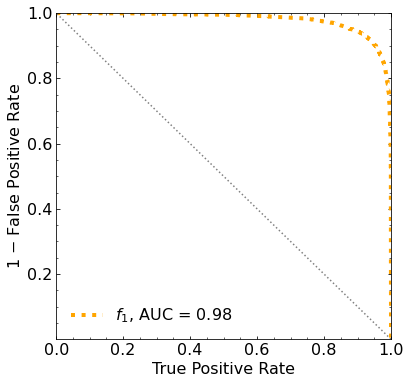

Classification score:


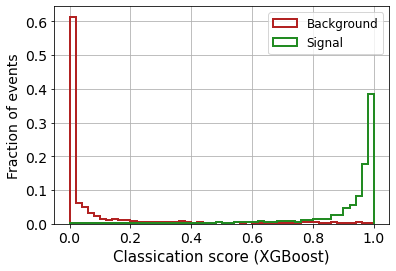


 ROC-AUC =  0.9795167050918349
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0785


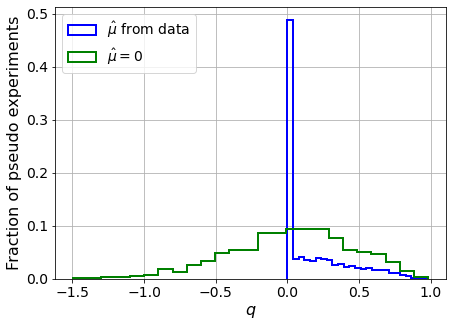

muhat mean:  0.24098824267260363
Z_bins:  0.2303591479840808
std Z_bins:  0.5124346221391715
Z_bins mu=0:  0.23035467787164904
std Z_bins mu=0:  0.9203037164419933

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.086


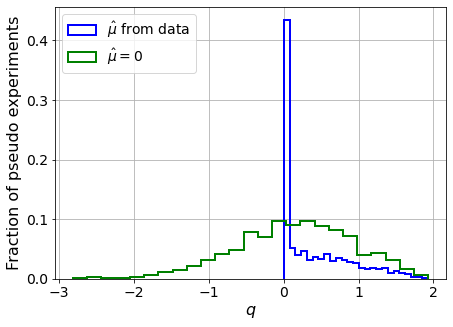

muhat mean:  0.12246062111221181
Z_bins:  0.4292146163778136
std Z_bins:  0.5525699865938498
Z_bins mu=0:  0.42913977404629555
std Z_bins mu=0:  0.9133816252209311

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.083


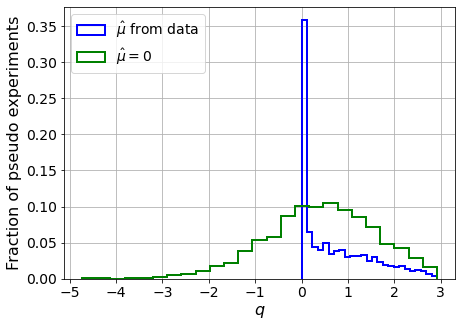

muhat mean:  0.008541577755443615
Z_bins:  0.6755973035730162
std Z_bins:  0.5691342205474538
Z_bins mu=0:  0.6755973035730162
std Z_bins mu=0:  0.8643106852376801

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0795


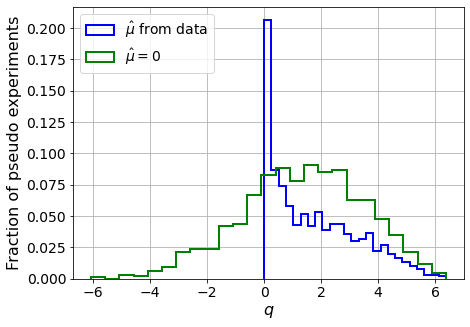

muhat mean:  0.04355167044568862
Z_bins:  1.2013041269742608
std Z_bins:  0.6453727245621871
Z_bins mu=0:  1.2009260128653707
std Z_bins mu=0:  0.882266462527546

--------

B_expected:  643
S_expected:  11

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.079


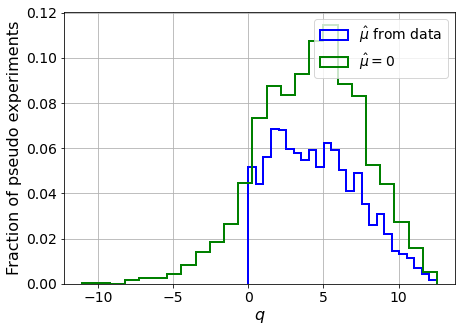

muhat mean:  0.013792831774029148
Z_bins:  2.082186101242866
std Z_bins:  0.6787433948197891
Z_bins mu=0:  2.082186101242866
std Z_bins mu=0:  0.8380579799984642

--------

B_expected:  643
S_expected:  21

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0905


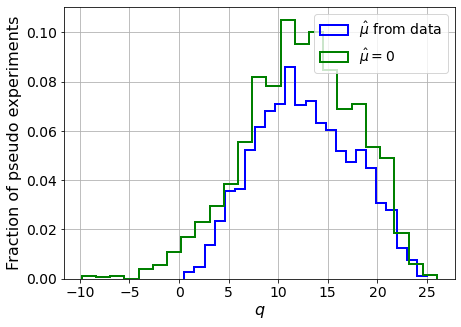

muhat mean:  0.0038923387761328923
Z_bins:  3.520736014788765
std Z_bins:  0.7015238361058511
Z_bins mu=0:  3.5194667582416854
std Z_bins mu=0:  0.7983610945876707

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0865


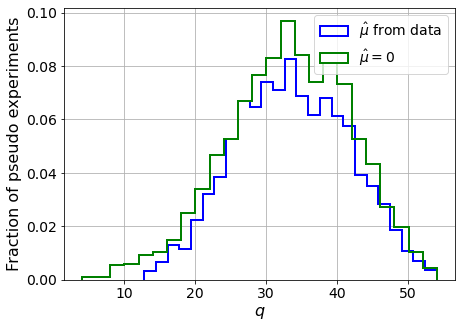

muhat mean:  0.00584918595997869
Z_bins:  5.784270789782702
std Z_bins:  0.6910507337816743
Z_bins mu=0:  5.783574628796046
std Z_bins mu=0:  0.7544645710683044

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0855


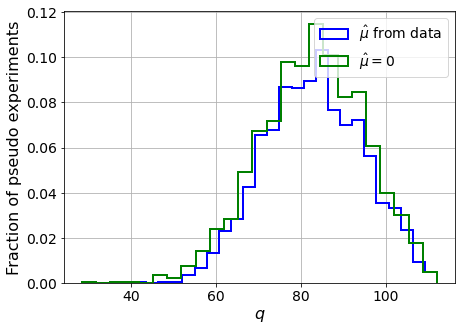

muhat mean:  0.001570826228065829
Z_bins:  9.111240600465127
std Z_bins:  0.6335453662322319
Z_bins mu=0:  9.109799614581547
std Z_bins mu=0:  0.6710862590034292

--------

B_expected:  643
S_expected:  152

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.07


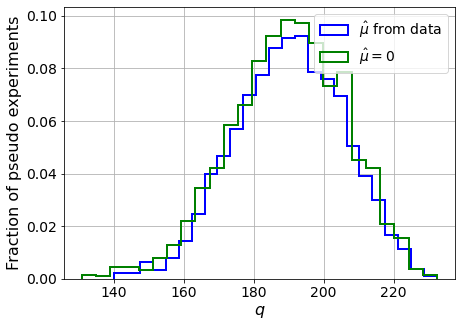

muhat mean:  0.0014013180434037187
Z_bins:  13.813205940032963
std Z_bins:  0.5658941795381435
Z_bins mu=0:  13.811709654702494
std Z_bins mu=0:  0.5914827538889378

--------

B_expected:  643
S_expected:  294

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0755


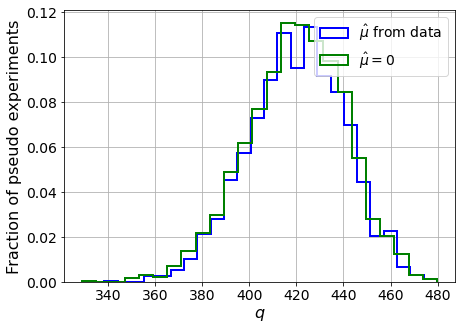

muhat mean:  0.0004574589753985387
Z_bins:  20.512212551419506
std Z_bins:  0.4971987737191326
Z_bins mu=0:  20.508484995959794
std Z_bins mu=0:  0.5133271601781515

--------

B_expected:  643
S_expected:  567

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.083


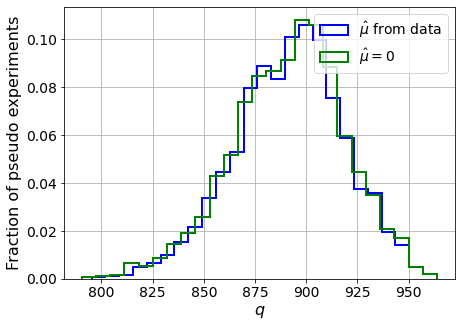

muhat mean:  0.00028050022545204493
Z_bins:  29.896819605983133
std Z_bins:  0.44750963997137466
Z_bins mu=0:  29.896379896236756
std Z_bins mu=0:  0.45848293542336477

--------

B_expected:  643
S_expected:  1094

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0815


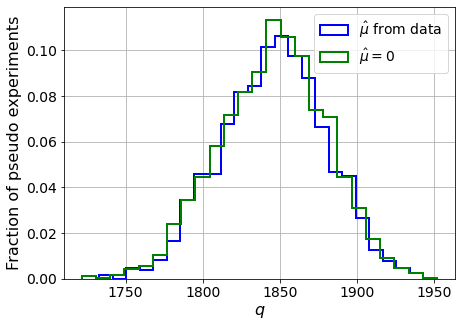

muhat mean:  0.00013654234318336047
Z_bins:  42.97511659336111
std Z_bins:  0.39480873771146613
Z_bins mu=0:  42.97465717661131
std Z_bins mu=0:  0.40158696489883267

--------

B_expected:  643
S_expected:  2113

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0775


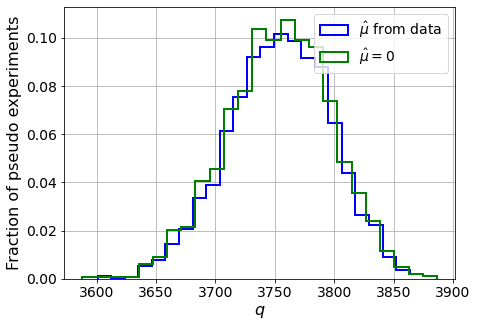

muhat mean:  8.532074293881195e-05
Z_bins:  61.28336739655411
std Z_bins:  0.352085937002917
Z_bins mu=0:  61.28223541619162
std Z_bins mu=0:  0.3569896204428453

--------

B_expected:  643
S_expected:  4079

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0815


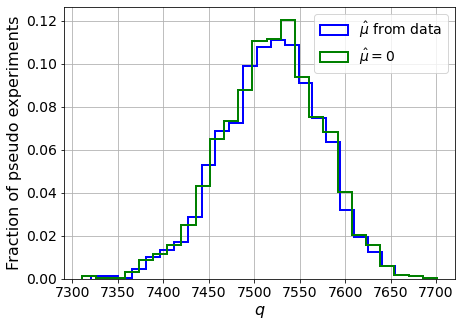

muhat mean:  3.433490990521432e-05
Z_bins:  86.72397063347613
std Z_bins:  0.3130434678712204
Z_bins mu=0:  86.7230507927857
std Z_bins mu=0:  0.31636886416640175

--------

B_expected:  643
S_expected:  7876

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0905


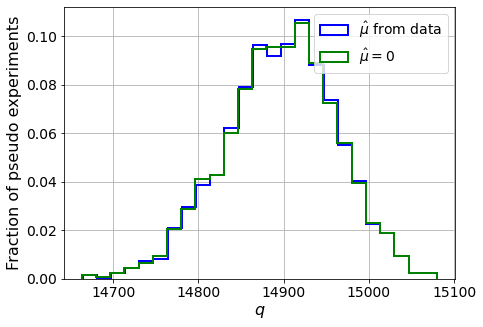

muhat mean:  3.65333533816744e-05
Z_bins:  122.06379787656653
std Z_bins:  0.267567032835395
Z_bins mu=0:  122.06202017001597
std Z_bins mu=0:  0.26978253872797375

--------


 FINAL RESULT:

[[0.2303591479840808, 0.5124346221391715, 0.24098824267260363, 0.23035467787164904, 0.9203037164419933], [0.4292146163778136, 0.5525699865938498, 0.12246062111221181, 0.42913977404629555, 0.9133816252209311], [0.6755973035730162, 0.5691342205474538, 0.008541577755443615, 0.6755973035730162, 0.8643106852376801], [1.2013041269742608, 0.6453727245621871, 0.04355167044568862, 1.2009260128653707, 0.882266462527546], [2.082186101242866, 0.6787433948197891, 0.013792831774029148, 2.082186101242866, 0.8380579799984642], [3.520736014788765, 0.7015238361058511, 0.0038923387761328923, 3.5194667582416854, 0.7983610945876707], [5.784270789782702, 0.6910507337816743, 0.00584918595997869, 5.783574628796046, 0.7544645710683044], [9.111240600465127, 0.6335453662322319, 0.001570826228065829, 9.109799614581547, 0.671

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  316.318351    279.3458945   239.54392628  197.71586188
  145.817613     89.46426107   27.26869036  -37.537436   -100.36904547]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 283.95309701 261.65711616 232.368871

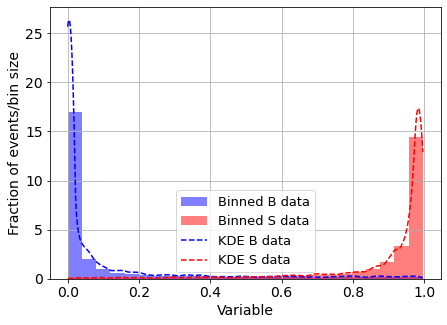

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



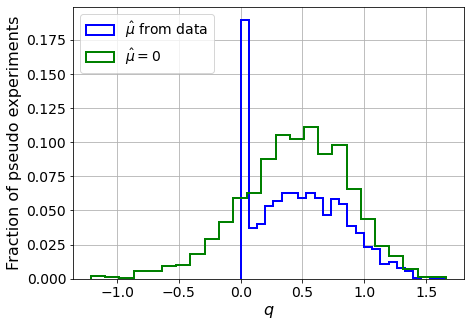

muhat mean:  -5.139989111720955
Z_bins:  0.6790454535980212
std Z_bins:  0.26257638293689894
Z_bins mu=0:  0.6790454535980212
std Z_bins mu=0:  0.3179462541359465

--------

B_expected:  643
S_expected:  2



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


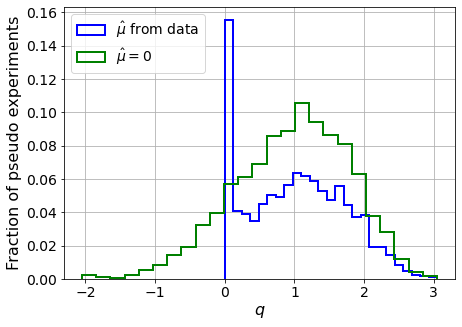

muhat mean:  -2.378944743862305
Z_bins:  1.0150880607733836
std Z_bins:  0.3466170342570151
Z_bins mu=0:  1.0150880607733836
std Z_bins mu=0:  0.4008149519960378

--------

B_expected:  643
S_expected:  3



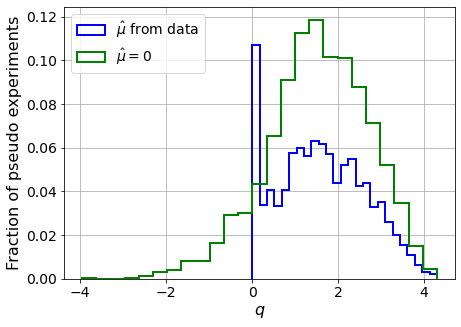

muhat mean:  -1.5100372154230417
Z_bins:  1.2506881590612013
std Z_bins:  0.4073976197483458
Z_bins mu=0:  1.2506881590612013
std Z_bins mu=0:  0.4686661838635111

--------

B_expected:  643
S_expected:  6



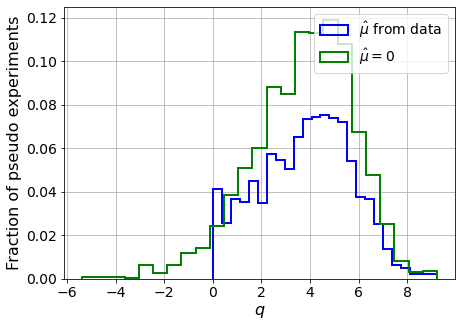

muhat mean:  -0.7794471970838488
Z_bins:  1.9843107364299246
std Z_bins:  0.47663874206814333
Z_bins mu=0:  1.9843107364299246
std Z_bins mu=0:  0.5296681481557424

--------

B_expected:  643
S_expected:  11



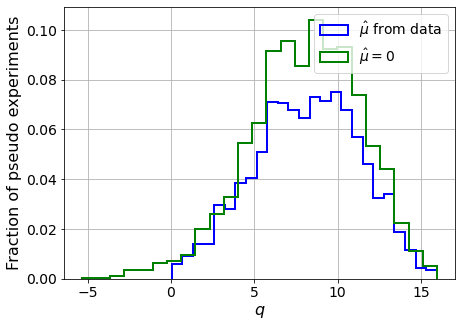

muhat mean:  -0.4169706669899902
Z_bins:  2.8775569765373556
std Z_bins:  0.5471928725662358
Z_bins mu=0:  2.8775569765373556
std Z_bins mu=0:  0.5797876989286411

--------

B_expected:  643
S_expected:  21



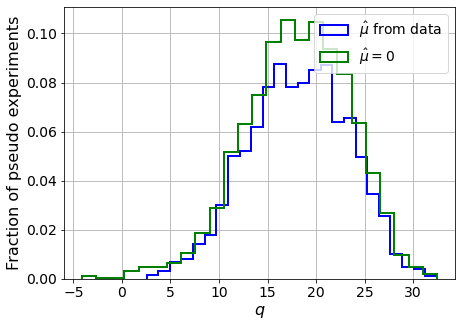

muhat mean:  -0.20257868879247581
Z_bins:  4.283449836135048
std Z_bins:  0.6002099679145745
Z_bins mu=0:  4.283449836135048
std Z_bins mu=0:  0.6281811499906085

--------

B_expected:  643
S_expected:  41



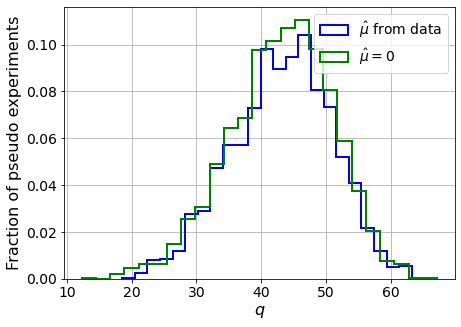

muhat mean:  -0.129194612093581
Z_bins:  6.606249176479191
std Z_bins:  0.5877640271664056
Z_bins mu=0:  6.606249176479191
std Z_bins mu=0:  0.6025374750019692

--------

B_expected:  643
S_expected:  79



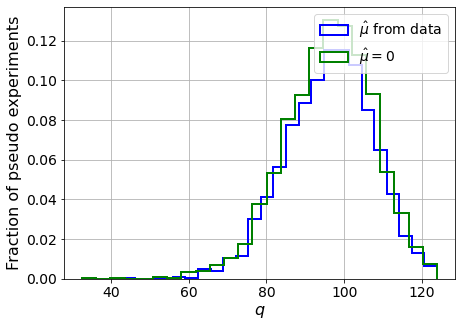

muhat mean:  -0.06216160029362808
Z_bins:  9.8420656997457
std Z_bins:  0.563909447159808
Z_bins mu=0:  9.8420656997457
std Z_bins mu=0:  0.576708835269477

--------

B_expected:  643
S_expected:  152



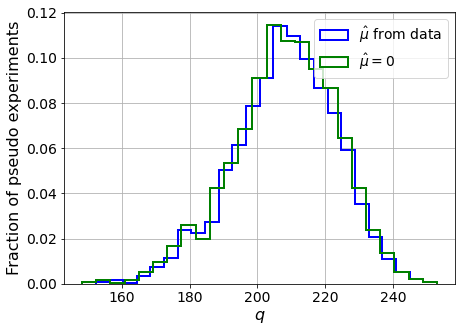

muhat mean:  -0.034520100650992036
Z_bins:  14.453173138355734
std Z_bins:  0.5211356888532792
Z_bins mu=0:  14.453173138355734
std Z_bins mu=0:  0.5278579574315966

--------

B_expected:  643
S_expected:  294



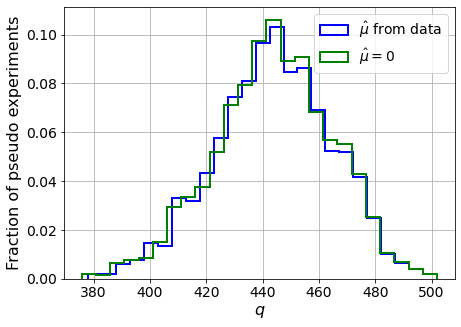

muhat mean:  -0.01631242729607501
Z_bins:  21.077129336130273
std Z_bins:  0.49228565789235834
Z_bins mu=0:  21.076980987630073
std Z_bins mu=0:  0.4962526092821627

--------

B_expected:  643
S_expected:  567



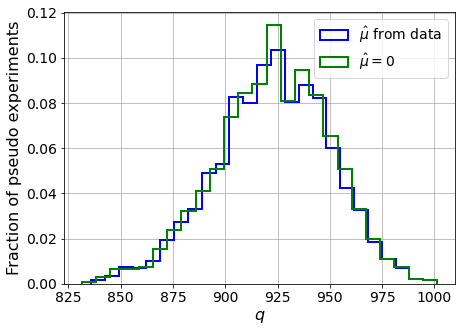

muhat mean:  -0.00827204307998479
Z_bins:  30.39324892376593
std Z_bins:  0.4471448034119713
Z_bins mu=0:  30.39324892376593
std Z_bins mu=0:  0.45027158896981756

--------

B_expected:  643
S_expected:  1094



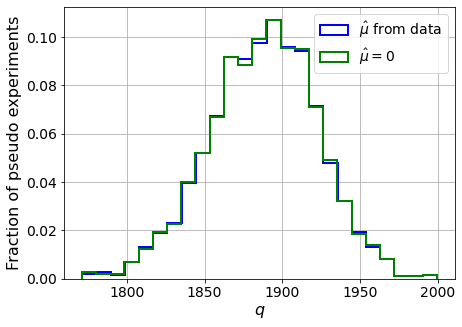

muhat mean:  -0.004618056355976753
Z_bins:  43.46481569677782
std Z_bins:  0.397645352439544
Z_bins mu=0:  43.46481569677782
std Z_bins mu=0:  0.39925876051770565

--------

B_expected:  643
S_expected:  2113



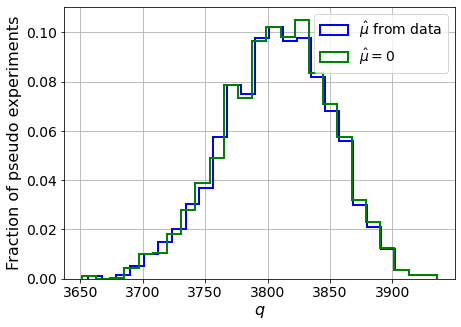

muhat mean:  -0.0024845113203665384
Z_bins:  61.71930270165442
std Z_bins:  0.34847509716861835
Z_bins mu=0:  61.71926960179638
std Z_bins mu=0:  0.3496184725926973

--------

B_expected:  643
S_expected:  4079



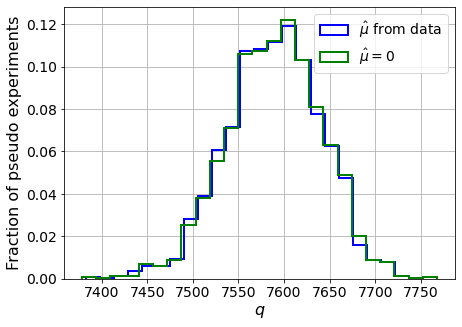

muhat mean:  -0.001128572862212918
Z_bins:  87.120459636397
std Z_bins:  0.2988482177742426
Z_bins mu=0:  87.12032834796072
std Z_bins mu=0:  0.2997707034202122

--------

B_expected:  643
S_expected:  7876



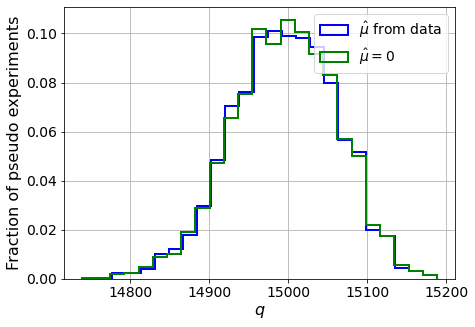

muhat mean:  -0.0005775407191392339
Z_bins:  122.46022630902002
std Z_bins:  0.2714522983263412
Z_bins mu=0:  122.45863943599991
std Z_bins mu=0:  0.2721141887482192

--------


 FINAL RESULT:

[[0.6790454535980212, 0.26257638293689894, -5.139989111720955, 0.6790454535980212, 0.3179462541359465], [1.0150880607733836, 0.3466170342570151, -2.378944743862305, 1.0150880607733836, 0.4008149519960378], [1.2506881590612013, 0.4073976197483458, -1.5100372154230417, 1.2506881590612013, 0.4686661838635111], [1.9843107364299246, 0.47663874206814333, -0.7794471970838488, 1.9843107364299246, 0.5296681481557424], [2.8775569765373556, 0.5471928725662358, -0.4169706669899902, 2.8775569765373556, 0.5797876989286411], [4.283449836135048, 0.6002099679145745, -0.20257868879247581, 4.283449836135048, 0.6281811499906085], [6.606249176479191, 0.5877640271664056, -0.129194612093581, 6.606249176479191, 0.6025374750019692], [9.8420656997457, 0.563909447159808, -0.06216160029362808, 9.8420656997457, 0.5767088352

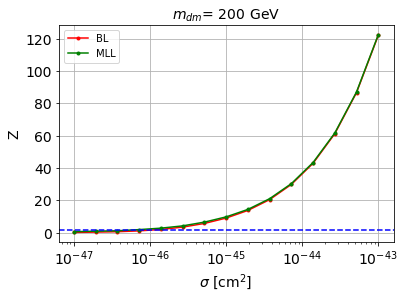


cross_BL_164:  9.986975208863919e-47
cross_BL_164_up:  5.741737957063233e-47
cross_BL_164_down:  1.550945049143072e-46

cross_MLL_164:  5.285045211559934e-47
cross_MLL_164_up:  3.5809122507953503e-47
cross_MLL_164_down:  8.000171524375639e-47

#########################


#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


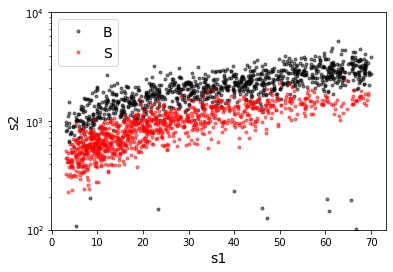

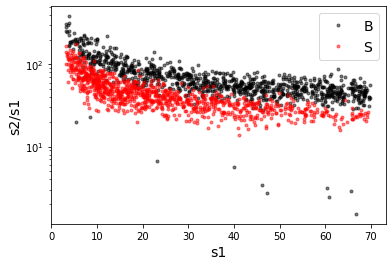

X_mon_B.shape:  (32117, 2)
X_mon_S.shape:  (32117, 2)
X_mon.shape:  (64234, 2)

X_mon_train :  (40948, 2)
y_mon_train :  (40948,)
X_mon_val :  (7227, 2)
y_mon_val :  (7227,)
X_mon_test :  (16059, 2)
y_mon_test :  (16059,)

[0]	validation_0-logloss:0.68563	validation_1-logloss:0.68565
[1]	validation_0-logloss:0.67826	validation_1-logloss:0.67830
[2]	validation_0-logloss:0.67102	validation_1-logloss:0.67109
[3]	validation_0-logloss:0.66394	validation_1-logloss:0.66404
[4]	validation_0-logloss:0.65698	validation_1-logloss:0.65711
[5]	validation_0-logloss:0.65015	validation_1-logloss:0.65030
[6]	validation_0-logloss:0.64346	validation_1-logloss:0.64365
[7]	validation_0-logloss:0.63688	validation_1-logloss:0.63709
[8]	validation_0-logloss:0.63044	validation_1-logloss:0.63069
[9]	validation_0-logloss:0.62410	validation_1-logloss:0.62437
[10]	validation_0-logloss:0.61787	validation_1-logloss:0.61818
[11]	validation_0-logloss:0.61179	validation_1-logloss:0.61212
[12]	validation_0-logloss:0.605

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13]	validation_0-logloss:0.59987	validation_1-logloss:0.60028
[14]	validation_0-logloss:0.59409	validation_1-logloss:0.59452
[15]	validation_0-logloss:0.58838	validation_1-logloss:0.58886
[16]	validation_0-logloss:0.58279	validation_1-logloss:0.58330
[17]	validation_0-logloss:0.57731	validation_1-logloss:0.57783
[18]	validation_0-logloss:0.57189	validation_1-logloss:0.57245
[19]	validation_0-logloss:0.56660	validation_1-logloss:0.56718
[20]	validation_0-logloss:0.56137	validation_1-logloss:0.56198
[21]	validation_0-logloss:0.55623	validation_1-logloss:0.55687
[22]	validation_0-logloss:0.55117	validation_1-logloss:0.55183
[23]	validation_0-logloss:0.54621	validation_1-logloss:0.54687
[24]	validation_0-logloss:0.54132	validation_1-logloss:0.54203
[25]	validation_0-logloss:0.53652	validation_1-logloss:0.53725
[26]	validation_0-logloss:0.53182	validation_1-logloss:0.53257
[27]	validation_0-logloss:0.52716	validation_1-logloss:0.52794
[28]	validation_0-logloss:0.52258	validation_1-logloss:

[143]	validation_0-logloss:0.26554	validation_1-logloss:0.26839
[144]	validation_0-logloss:0.26457	validation_1-logloss:0.26744
[145]	validation_0-logloss:0.26360	validation_1-logloss:0.26649
[146]	validation_0-logloss:0.26266	validation_1-logloss:0.26554
[147]	validation_0-logloss:0.26172	validation_1-logloss:0.26461
[148]	validation_0-logloss:0.26080	validation_1-logloss:0.26369
[149]	validation_0-logloss:0.25987	validation_1-logloss:0.26277
[150]	validation_0-logloss:0.25896	validation_1-logloss:0.26188
[151]	validation_0-logloss:0.25806	validation_1-logloss:0.26098
[152]	validation_0-logloss:0.25717	validation_1-logloss:0.26009
[153]	validation_0-logloss:0.25629	validation_1-logloss:0.25922
[154]	validation_0-logloss:0.25541	validation_1-logloss:0.25835
[155]	validation_0-logloss:0.25456	validation_1-logloss:0.25750
[156]	validation_0-logloss:0.25372	validation_1-logloss:0.25667
[157]	validation_0-logloss:0.25287	validation_1-logloss:0.25583
[158]	validation_0-logloss:0.25206	valid

[272]	validation_0-logloss:0.20016	validation_1-logloss:0.20338
[273]	validation_0-logloss:0.19994	validation_1-logloss:0.20315
[274]	validation_0-logloss:0.19972	validation_1-logloss:0.20292
[275]	validation_0-logloss:0.19950	validation_1-logloss:0.20271
[276]	validation_0-logloss:0.19929	validation_1-logloss:0.20250
[277]	validation_0-logloss:0.19908	validation_1-logloss:0.20228
[278]	validation_0-logloss:0.19887	validation_1-logloss:0.20207
[279]	validation_0-logloss:0.19866	validation_1-logloss:0.20186
[280]	validation_0-logloss:0.19845	validation_1-logloss:0.20165
[281]	validation_0-logloss:0.19825	validation_1-logloss:0.20145
[282]	validation_0-logloss:0.19806	validation_1-logloss:0.20125
[283]	validation_0-logloss:0.19786	validation_1-logloss:0.20104
[284]	validation_0-logloss:0.19766	validation_1-logloss:0.20084
[285]	validation_0-logloss:0.19746	validation_1-logloss:0.20064
[286]	validation_0-logloss:0.19726	validation_1-logloss:0.20046
[287]	validation_0-logloss:0.19708	valid

[528]	validation_0-logloss:0.17987	validation_1-logloss:0.18419
[529]	validation_0-logloss:0.17986	validation_1-logloss:0.18418
[530]	validation_0-logloss:0.17984	validation_1-logloss:0.18417
[531]	validation_0-logloss:0.17981	validation_1-logloss:0.18415
[532]	validation_0-logloss:0.17979	validation_1-logloss:0.18415
[533]	validation_0-logloss:0.17978	validation_1-logloss:0.18414
[534]	validation_0-logloss:0.17975	validation_1-logloss:0.18413
[535]	validation_0-logloss:0.17973	validation_1-logloss:0.18412
[536]	validation_0-logloss:0.17972	validation_1-logloss:0.18410
[537]	validation_0-logloss:0.17970	validation_1-logloss:0.18409
[538]	validation_0-logloss:0.17968	validation_1-logloss:0.18407
[539]	validation_0-logloss:0.17966	validation_1-logloss:0.18406
[540]	validation_0-logloss:0.17964	validation_1-logloss:0.18405
[541]	validation_0-logloss:0.17963	validation_1-logloss:0.18403
[542]	validation_0-logloss:0.17962	validation_1-logloss:0.18402
[543]	validation_0-logloss:0.17960	valid

[657]	validation_0-logloss:0.17817	validation_1-logloss:0.18330
[658]	validation_0-logloss:0.17816	validation_1-logloss:0.18330
[659]	validation_0-logloss:0.17815	validation_1-logloss:0.18329
[660]	validation_0-logloss:0.17814	validation_1-logloss:0.18329
[661]	validation_0-logloss:0.17813	validation_1-logloss:0.18328
[662]	validation_0-logloss:0.17812	validation_1-logloss:0.18328
[663]	validation_0-logloss:0.17811	validation_1-logloss:0.18327
[664]	validation_0-logloss:0.17810	validation_1-logloss:0.18327
[665]	validation_0-logloss:0.17809	validation_1-logloss:0.18327
[666]	validation_0-logloss:0.17808	validation_1-logloss:0.18327
[667]	validation_0-logloss:0.17807	validation_1-logloss:0.18327
[668]	validation_0-logloss:0.17806	validation_1-logloss:0.18326
[669]	validation_0-logloss:0.17805	validation_1-logloss:0.18326
[670]	validation_0-logloss:0.17803	validation_1-logloss:0.18325
[671]	validation_0-logloss:0.17802	validation_1-logloss:0.18325
[672]	validation_0-logloss:0.17802	valid

[786]	validation_0-logloss:0.17687	validation_1-logloss:0.18306
[787]	validation_0-logloss:0.17686	validation_1-logloss:0.18306
[788]	validation_0-logloss:0.17686	validation_1-logloss:0.18306
[789]	validation_0-logloss:0.17684	validation_1-logloss:0.18305
[790]	validation_0-logloss:0.17683	validation_1-logloss:0.18305
[791]	validation_0-logloss:0.17681	validation_1-logloss:0.18306
[792]	validation_0-logloss:0.17680	validation_1-logloss:0.18306
[793]	validation_0-logloss:0.17679	validation_1-logloss:0.18306
[794]	validation_0-logloss:0.17678	validation_1-logloss:0.18306
[795]	validation_0-logloss:0.17677	validation_1-logloss:0.18306
[796]	validation_0-logloss:0.17676	validation_1-logloss:0.18305
[797]	validation_0-logloss:0.17675	validation_1-logloss:0.18305
[798]	validation_0-logloss:0.17674	validation_1-logloss:0.18305
[799]	validation_0-logloss:0.17673	validation_1-logloss:0.18305
[800]	validation_0-logloss:0.17672	validation_1-logloss:0.18305
[801]	validation_0-logloss:0.17670	valid

[915]	validation_0-logloss:0.17550	validation_1-logloss:0.18290
[916]	validation_0-logloss:0.17548	validation_1-logloss:0.18289
[917]	validation_0-logloss:0.17546	validation_1-logloss:0.18290
[918]	validation_0-logloss:0.17545	validation_1-logloss:0.18290
[919]	validation_0-logloss:0.17544	validation_1-logloss:0.18290
[920]	validation_0-logloss:0.17544	validation_1-logloss:0.18290
[921]	validation_0-logloss:0.17542	validation_1-logloss:0.18290
[922]	validation_0-logloss:0.17541	validation_1-logloss:0.18289
[923]	validation_0-logloss:0.17540	validation_1-logloss:0.18290
[924]	validation_0-logloss:0.17539	validation_1-logloss:0.18290
[925]	validation_0-logloss:0.17539	validation_1-logloss:0.18289
[926]	validation_0-logloss:0.17537	validation_1-logloss:0.18288
[927]	validation_0-logloss:0.17536	validation_1-logloss:0.18288
[928]	validation_0-logloss:0.17536	validation_1-logloss:0.18288
[929]	validation_0-logloss:0.17535	validation_1-logloss:0.18288
[930]	validation_0-logloss:0.17534	valid

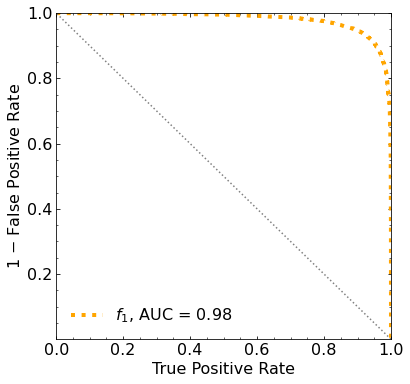

Classification score:


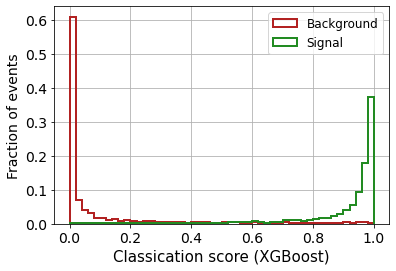


 ROC-AUC =  0.9798855396469355
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.105


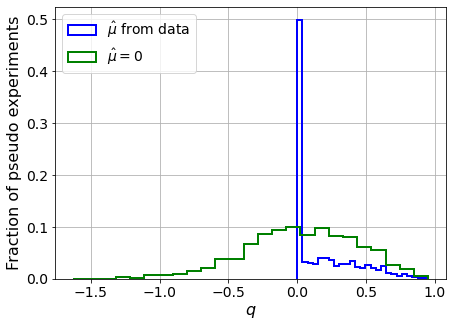

muhat mean:  0.16450448469485304
Z_bins:  0.2068762795092394
std Z_bins:  0.5607341085413801
Z_bins mu=0:  0.20671419757923565
std Z_bins mu=0:  0.9825912640728395

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0975


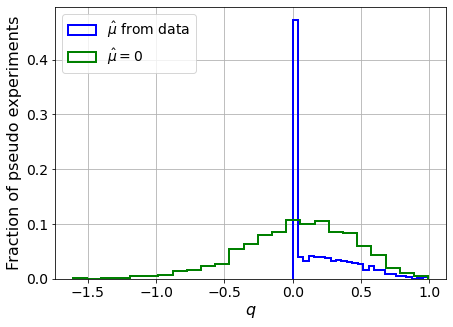

muhat mean:  0.023516454351194323
Z_bins:  0.2620997585932202
std Z_bins:  0.43064568799488806
Z_bins mu=0:  0.2620997585932202
std Z_bins mu=0:  0.7524461745143923

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0955


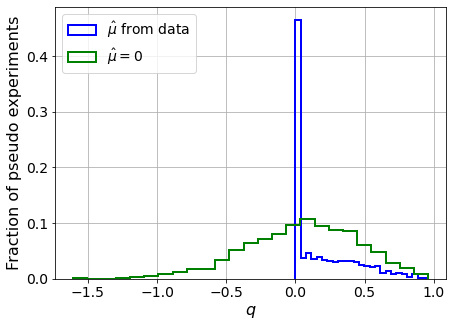

muhat mean:  -0.01426158309149921
Z_bins:  0.2730295088830433
std Z_bins:  0.4259630306701442
Z_bins mu=0:  0.2730295088830433
std Z_bins mu=0:  0.7339238533165126

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.106


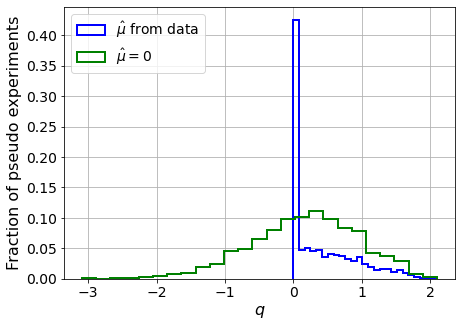

muhat mean:  0.04377439307869075
Z_bins:  0.46353775228125993
std Z_bins:  0.5171262109007254
Z_bins mu=0:  0.46353775228125993
std Z_bins mu=0:  0.8459618100116498

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0935


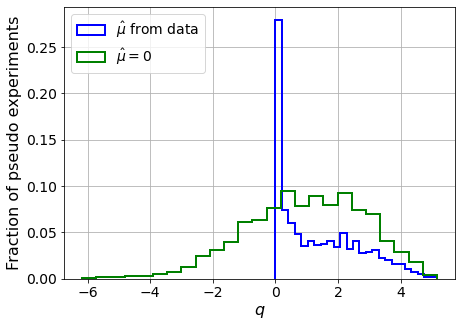

muhat mean:  0.03451758235050687
Z_bins:  1.019385315534966
std Z_bins:  0.639008427457799
Z_bins mu=0:  1.0192698004477996
std Z_bins mu=0:  0.9207609649041183

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.088


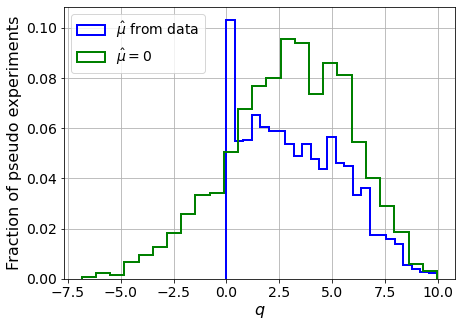

muhat mean:  -0.004963052091670484
Z_bins:  1.7621797791675395
std Z_bins:  0.648129583268058
Z_bins mu=0:  1.7621797791675395
std Z_bins mu=0:  0.8160243705978323

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1015


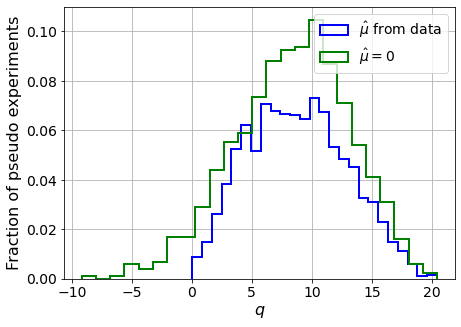

muhat mean:  0.009588738864961173
Z_bins:  2.9464897992765056
std Z_bins:  0.6929657137782146
Z_bins mu=0:  2.9464897992765056
std Z_bins mu=0:  0.8070771331967396

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1045


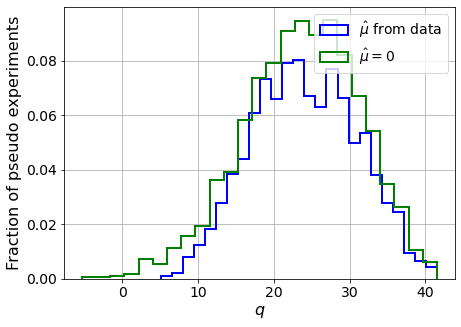

muhat mean:  0.007138557780612123
Z_bins:  4.884787868231969
std Z_bins:  0.7029100857499625
Z_bins mu=0:  4.883894912214959
std Z_bins mu=0:  0.7798600178536547

--------

B_expected:  643
S_expected:  64

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.093


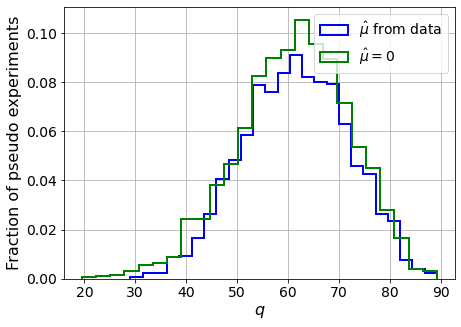

muhat mean:  0.002819650959864253
Z_bins:  7.852650442312858
std Z_bins:  0.6531443402867634
Z_bins mu=0:  7.851675490552869
std Z_bins mu=0:  0.7004651470816381

--------

B_expected:  643
S_expected:  124

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.101


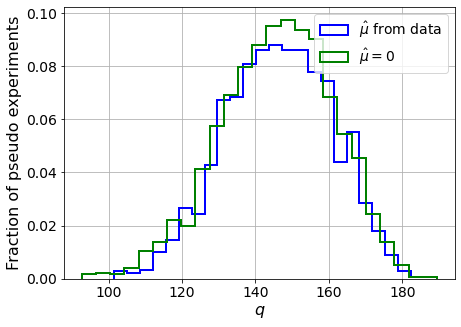

muhat mean:  0.0013905431049058559
Z_bins:  12.102480089924438
std Z_bins:  0.6002400033065909
Z_bins mu=0:  12.102049098350443
std Z_bins mu=0:  0.6299457715562634

--------

B_expected:  643
S_expected:  239

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.097


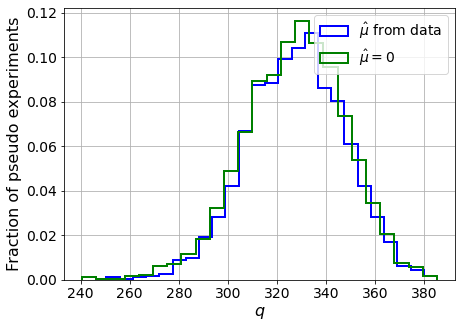

muhat mean:  0.0006289623279607224
Z_bins:  18.113418045282668
std Z_bins:  0.5470146695003103
Z_bins mu=0:  18.11280793352807
std Z_bins mu=0:  0.5676704329559639

--------

B_expected:  643
S_expected:  462

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.113


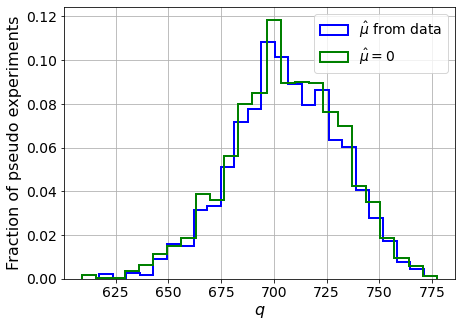

muhat mean:  0.0005147422840828442
Z_bins:  26.56049357972793
std Z_bins:  0.4815530765914184
Z_bins mu=0:  26.55663646618589
std Z_bins mu=0:  0.49483082714345744

--------

B_expected:  643
S_expected:  892

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.093


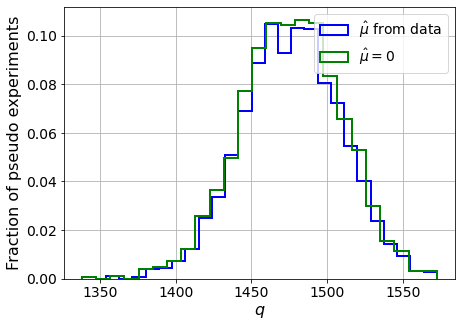

muhat mean:  0.00010405940055790851
Z_bins:  38.427011422034354
std Z_bins:  0.42650385342338926
Z_bins mu=0:  38.42663432751351
std Z_bins mu=0:  0.43422330913754487

--------

B_expected:  643
S_expected:  1723

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1035


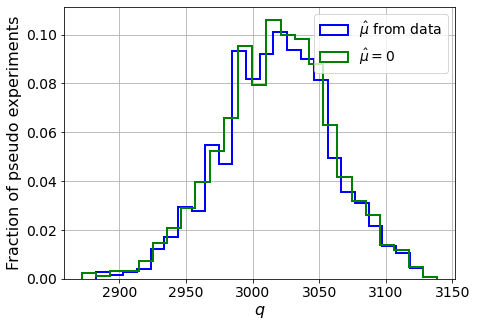

muhat mean:  0.00013230489740756292
Z_bins:  54.94254511927811
std Z_bins:  0.37920190001098825
Z_bins mu=0:  54.94097203246649
std Z_bins mu=0:  0.3851180879182536

--------

B_expected:  643
S_expected:  3326

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.092


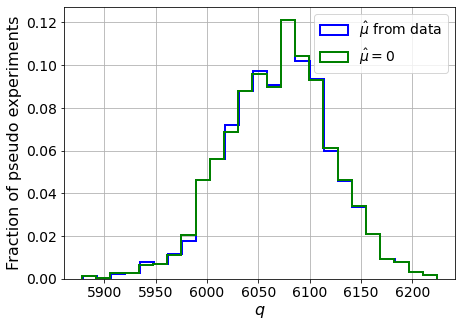

muhat mean:  3.727893672433583e-05
Z_bins:  77.92436147286043
std Z_bins:  0.32454383515110363
Z_bins mu=0:  77.92403184534359
std Z_bins mu=0:  0.32809552636230993

--------


 FINAL RESULT:

[[0.2068762795092394, 0.5607341085413801, 0.16450448469485304, 0.20671419757923565, 0.9825912640728395], [0.2620997585932202, 0.43064568799488806, 0.023516454351194323, 0.2620997585932202, 0.7524461745143923], [0.2730295088830433, 0.4259630306701442, -0.01426158309149921, 0.2730295088830433, 0.7339238533165126], [0.46353775228125993, 0.5171262109007254, 0.04377439307869075, 0.46353775228125993, 0.8459618100116498], [1.019385315534966, 0.639008427457799, 0.03451758235050687, 1.0192698004477996, 0.9207609649041183], [1.7621797791675395, 0.648129583268058, -0.004963052091670484, 1.7621797791675395, 0.8160243705978323], [2.9464897992765056, 0.6929657137782146, 0.009588738864961173, 2.9464897992765056, 0.8070771331967396], [4.884787868231969, 0.7029100857499625, 0.007138557780612123, 4.883894912214959

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 327.27937877 292.59956953 251.49979372 203.68934299
 146.6376497   88.35341929  28.81997893 -35.67900509 -99.17323844]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 252.84552372 227.30234688 192.04736902
 149

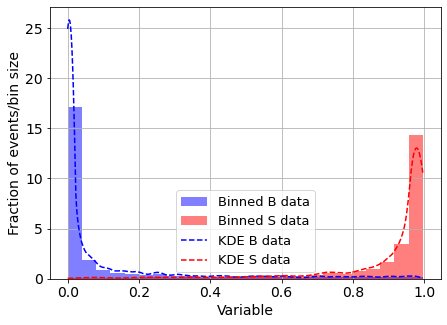

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



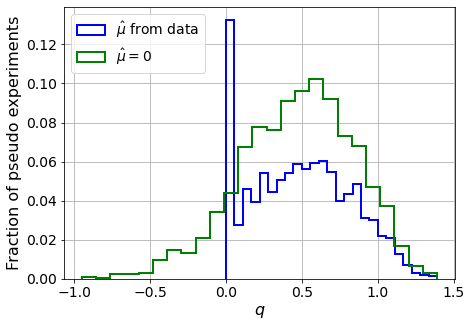

muhat mean:  -5.423039168392475
Z_bins:  0.7022601205726416
std Z_bins:  0.2340302709161614
Z_bins mu=0:  0.7022601205726416
std Z_bins mu=0:  0.26652089105594157

--------

B_expected:  643
S_expected:  1



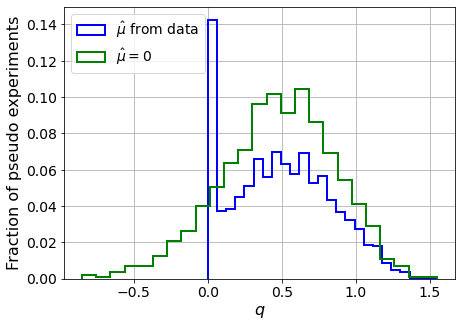

muhat mean:  -5.410810973232894
Z_bins:  0.6996918881012105
std Z_bins:  0.2394221596153981
Z_bins mu=0:  0.6996918881012105
std Z_bins mu=0:  0.2722973079958212

--------

B_expected:  643
S_expected:  1



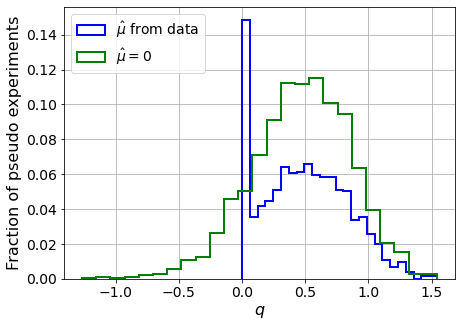

muhat mean:  -5.564298696383601
Z_bins:  0.6995289762891059
std Z_bins:  0.24166214299478114
Z_bins mu=0:  0.6995289762891059
std Z_bins mu=0:  0.2781902524986748

--------

B_expected:  643
S_expected:  2



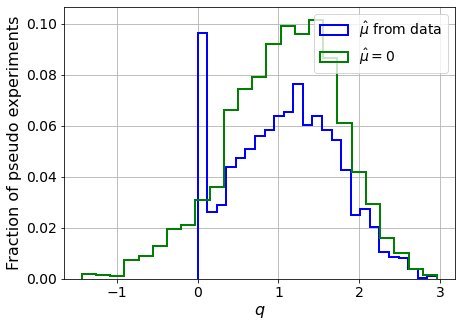

muhat mean:  -2.9162037072746636
Z_bins:  1.0551043018857644
std Z_bins:  0.3035097481114066
Z_bins mu=0:  1.0551043018857644
std Z_bins mu=0:  0.334973113118668

--------

B_expected:  643
S_expected:  5



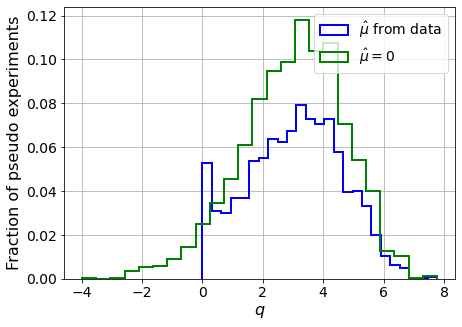

muhat mean:  -1.1413062320528078
Z_bins:  1.7716573506589455
std Z_bins:  0.44282446590138713
Z_bins mu=0:  1.7716573506589455
std Z_bins mu=0:  0.47795531938826524

--------

B_expected:  643
S_expected:  9



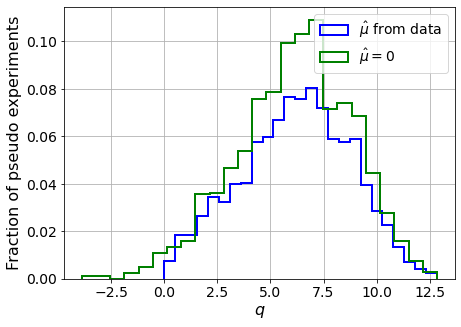

muhat mean:  -0.6233554670591641
Z_bins:  2.5121443579988223
std Z_bins:  0.5131316906328385
Z_bins mu=0:  2.5121443579988223
std Z_bins mu=0:  0.5349854899023907

--------

B_expected:  643
S_expected:  17



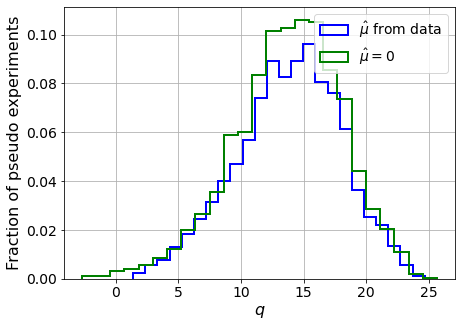

muhat mean:  -0.32031955847088284
Z_bins:  3.7519828424281707
std Z_bins:  0.5565104557989302
Z_bins mu=0:  3.7519828424281707
std Z_bins mu=0:  0.5751999508840603

--------

B_expected:  643
S_expected:  33



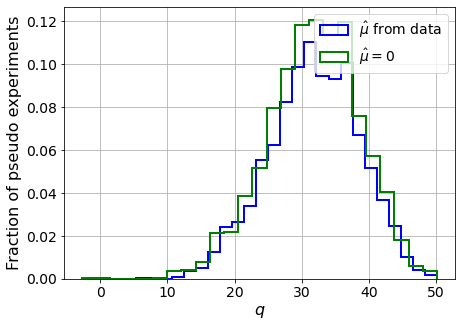

muhat mean:  -0.16548537089493953
Z_bins:  5.6542118446999
std Z_bins:  0.5935887934942335
Z_bins mu=0:  5.6542118446999
std Z_bins mu=0:  0.6066527758818696

--------

B_expected:  643
S_expected:  64



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


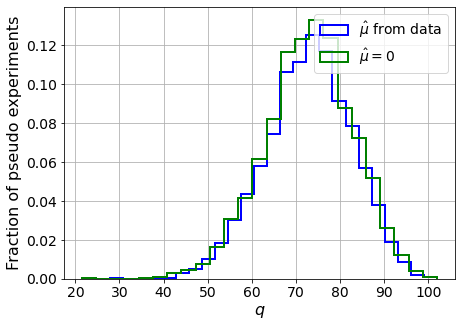

muhat mean:  -0.09657654174690712
Z_bins:  8.560261698030924
std Z_bins:  0.5742867390617583
Z_bins mu=0:  8.560261698030924
std Z_bins mu=0:  0.5817449402603632

--------

B_expected:  643
S_expected:  124



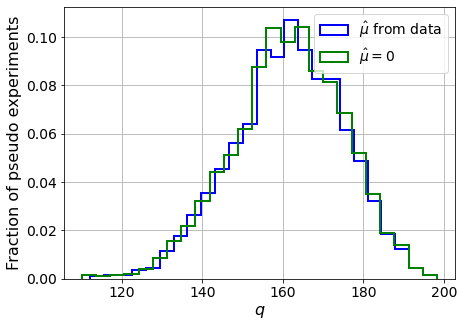

muhat mean:  -0.044872191099408494
Z_bins:  12.723966830544924
std Z_bins:  0.5373722115311156
Z_bins mu=0:  12.723966830544924
std Z_bins mu=0:  0.5418984053743943

--------

B_expected:  643
S_expected:  239



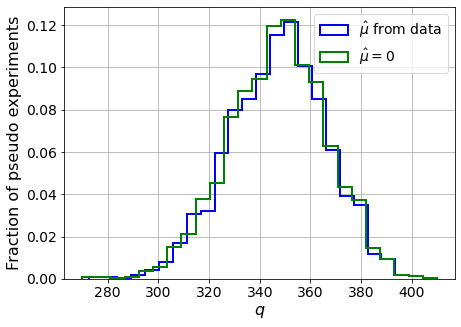

muhat mean:  -0.024600101338642433
Z_bins:  18.647766897599848
std Z_bins:  0.5127892219858167
Z_bins mu=0:  18.647766897599848
std Z_bins mu=0:  0.515585281469511

--------

B_expected:  643
S_expected:  462



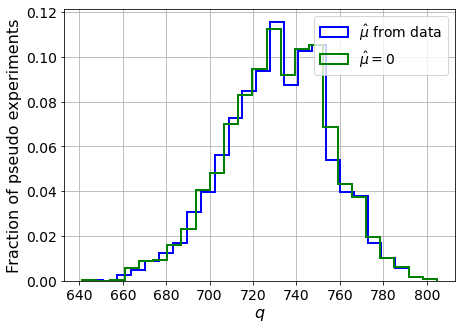

muhat mean:  -0.012501079994017086
Z_bins:  27.052150054127313
std Z_bins:  0.4440158379013171
Z_bins mu=0:  27.052150054127313
std Z_bins mu=0:  0.4458553165234743

--------

B_expected:  643
S_expected:  892



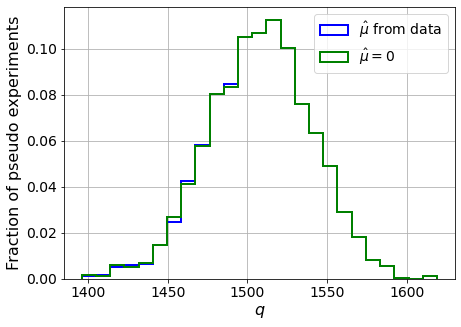

muhat mean:  -0.006320364527390714
Z_bins:  38.84304065137891
std Z_bins:  0.41262887640251233
Z_bins mu=0:  38.84296946418173
std Z_bins mu=0:  0.41411868457635426

--------

B_expected:  643
S_expected:  1723



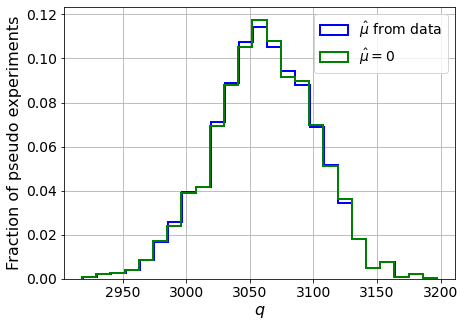

muhat mean:  -0.003596848930103859
Z_bins:  55.3332016898866
std Z_bins:  0.362585937413892
Z_bins mu=0:  55.3332016898866
std Z_bins mu=0:  0.3633458785570069

--------

B_expected:  643
S_expected:  3326



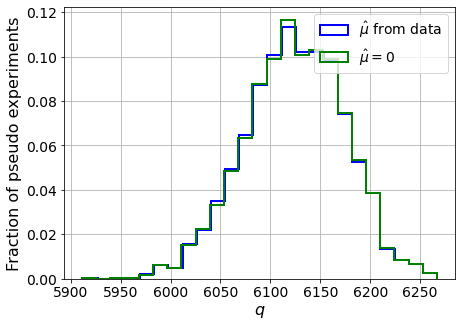

muhat mean:  -0.0015581809426790457
Z_bins:  78.26084418011271
std Z_bins:  0.31937655963963874
Z_bins mu=0:  78.26084418011271
std Z_bins mu=0:  0.3199380296463542

--------


 FINAL RESULT:

[[0.7022601205726416, 0.2340302709161614, -5.423039168392475, 0.7022601205726416, 0.26652089105594157], [0.6996918881012105, 0.2394221596153981, -5.410810973232894, 0.6996918881012105, 0.2722973079958212], [0.6995289762891059, 0.24166214299478114, -5.564298696383601, 0.6995289762891059, 0.2781902524986748], [1.0551043018857644, 0.3035097481114066, -2.9162037072746636, 1.0551043018857644, 0.334973113118668], [1.7716573506589455, 0.44282446590138713, -1.1413062320528078, 1.7716573506589455, 0.47795531938826524], [2.5121443579988223, 0.5131316906328385, -0.6233554670591641, 2.5121443579988223, 0.5349854899023907], [3.7519828424281707, 0.5565104557989302, -0.32031955847088284, 3.7519828424281707, 0.5751999508840603], [5.6542118446999, 0.5935887934942335, -0.16548537089493953, 5.6542118446999, 0.60665

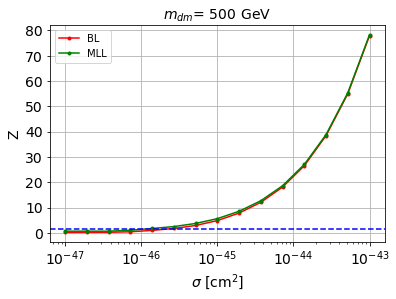


cross_BL_164:  2.4075495850714916e-46
cross_BL_164_up:  1.3649061513732286e-46
cross_BL_164_down:  3.634538584838061e-46

cross_MLL_164:  1.2312913824398904e-46
cross_MLL_164_up:  8.934657564981184e-47
cross_MLL_164_down:  1.8858858941758842e-46

#########################



In [87]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
    S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

    print('\nS_cs1.shape: ', S_cs1.shape)
    print('S_cs2.shape: ', S_cs2.shape)
    
    S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs1 = S_cs1_aux
    
    
    # set events per classs
    NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = int(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
    NUM_DAT_RN = int(NUM_DAT*f_RN)
    NUM_DAT_WALL = int(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

    print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


    S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


    print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)
    
    
    rnd = 100

    B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
    S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

    plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    
    plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2/s1',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    ############
    # DATASETS #
    ############
    
    # concatenate the data
    X_mon_B = B_cs1cs2
    X_mon_S = S_cs1cs2

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower)
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)
    
    
    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [88]:
cross_cs1cs2 = store_cross_BL_164
cross_cs1cs2_up = store_cross_BL_164_up
cross_cs1cs2_down = store_cross_BL_164_down

print(cross_cs1cs2)
print(cross_cs1cs2_up)
print(cross_cs1cs2_down)


cross_cs1cs2_MLL = store_cross_MLL_164
cross_cs1cs2_MLL_up = store_cross_MLL_164_up
cross_cs1cs2_MLL_down = store_cross_MLL_164_down

print(cross_cs1cs2_MLL)
print(cross_cs1cs2_MLL_up)
print(cross_cs1cs2_MLL_down)

[1.1095946706771763e-45, 8.096791337886445e-47, 4.126752829028213e-47, 4.190083687755331e-47, 5.901375098779627e-47, 9.986975208863919e-47, 2.4075495850714916e-46]
[7.52764159151512e-46, 4.996584716740839e-47, 2.5745104157510154e-47, 2.335585929453233e-47, 3.6979922878651826e-47, 5.741737957063233e-47, 1.3649061513732286e-46]
[1.6669537300809248e-45, 1.1487798633788297e-46, 6.371679083661672e-47, 6.367863310344144e-47, 8.93066966882424e-47, 1.550945049143072e-46, 3.634538584838061e-46]
[6.327710532070539e-46, 4.215301582128836e-47, 2.4791838890357076e-47, 2.1857568833524696e-47, 3.160256410238024e-47, 5.285045211559934e-47, 1.2312913824398904e-46]
[4.699908795257047e-46, 2.350764602858847e-47, 1.742502365082223e-47, 1.35047863716278e-47, 1.844404131734865e-47, 3.5809122507953503e-47, 8.934657564981184e-47]
[8.701065330236718e-46, 6.253303735248249e-47, 3.574591351166628e-47, 3.7085108551863866e-47, 4.90830704827016e-47, 8.000171524375639e-47, 1.8858858941758842e-46]


In [103]:
np.savetxt('results/cs1cs2.txt', [cross_cs1cs2, cross_cs1cs2_up, cross_cs1cs2_down])
np.savetxt('results/cs1cs2_MLL.txt', [cross_cs1cs2_MLL, cross_cs1cs2_MLL_up, cross_cs1cs2_MLL_down])

In [104]:
cross_cs1cs2 = np.loadtxt('results/cs1cs2.txt')[0]
cross_cs1cs2_up = np.loadtxt('results/cs1cs2.txt')[1]
cross_cs1cs2_down =np.loadtxt('results/cs1cs2.txt')[2]

cross_cs1cs2_MLL = np.loadtxt('results/cs1cs2_MLL.txt')[0]
cross_cs1cs2_MLL_up = np.loadtxt('results/cs1cs2_MLL.txt')[1]
cross_cs1cs2_MLL_down = np.loadtxt('results/cs1cs2_MLL.txt')[2]

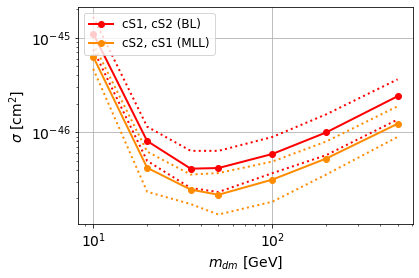

In [105]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_cs1cs2, '-o', color='red', lw=lw, label=r'cS1, cS2 (BL)')
plt.plot(mDM_mDM, cross_cs1cs2_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_cs1cs2_MLL, '-o', color='darkorange', lw=lw, label=r'cS2, cS1 (MLL)')
plt.plot(mDM_mDM, cross_cs1cs2_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_MLL_down, ':', color='darkorange', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

## 2. only 1 variable: cs2/cs1

In [81]:
def solvecross(fn, value, x=-44.3, maxtries=1000, maxerr=0.00001):
    for tries in range(maxtries):
        err = fn(x) - value
        if abs(err) < maxerr:
            return x
        slope = dx(fn, x)
        x -= err/slope
    raise ValueError('no solution found')


#########################

mDM =  10 GeV


S_cs1.shape:  (34190,)
S_cs2.shape:  (34190,)
 NUM_DAT:  31606 

NUM_DAT_ER:  31203
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  262

B_cs1cs2.shape:  (31606, 2)

S_cs1cs2.shape:  (31606, 2)


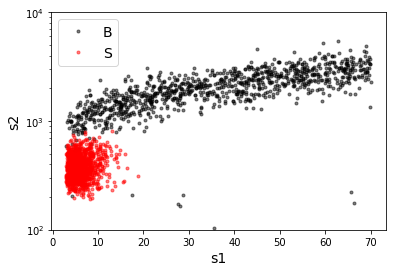

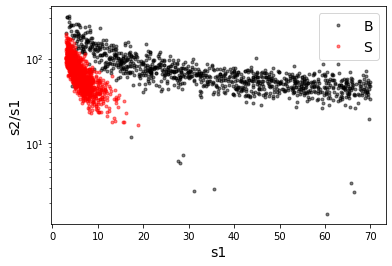

X_mon_B.shape:  (31606, 1)
X_mon_S.shape:  (31606, 1)
X_mon.shape:  (63212, 1)

X_mon_train :  (40297, 1)
y_mon_train :  (40297,)
X_mon_val :  (7112, 1)
y_mon_val :  (7112,)
X_mon_test :  (15803, 1)
y_mon_test :  (15803,)

[0]	validation_0-logloss:0.69271	validation_1-logloss:0.69272
[1]	validation_0-logloss:0.69229	validation_1-logloss:0.69230
[2]	validation_0-logloss:0.69186	validation_1-logloss:0.69189
[3]	validation_0-logloss:0.69144	validation_1-logloss:0.69149
[4]	validation_0-logloss:0.69103	validation_1-logloss:0.69110


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[5]	validation_0-logloss:0.69063	validation_1-logloss:0.69071
[6]	validation_0-logloss:0.69024	validation_1-logloss:0.69033
[7]	validation_0-logloss:0.68985	validation_1-logloss:0.68997
[8]	validation_0-logloss:0.68946	validation_1-logloss:0.68960
[9]	validation_0-logloss:0.68910	validation_1-logloss:0.68924
[10]	validation_0-logloss:0.68874	validation_1-logloss:0.68890
[11]	validation_0-logloss:0.68837	validation_1-logloss:0.68856
[12]	validation_0-logloss:0.68803	validation_1-logloss:0.68822
[13]	validation_0-logloss:0.68768	validation_1-logloss:0.68789
[14]	validation_0-logloss:0.68734	validation_1-logloss:0.68757
[15]	validation_0-logloss:0.68701	validation_1-logloss:0.68725
[16]	validation_0-logloss:0.68668	validation_1-logloss:0.68694
[17]	validation_0-logloss:0.68637	validation_1-logloss:0.68663
[18]	validation_0-logloss:0.68604	validation_1-logloss:0.68633
[19]	validation_0-logloss:0.68574	validation_1-logloss:0.68604
[20]	validation_0-logloss:0.68543	validation_1-logloss:0.685

[135]	validation_0-logloss:0.66995	validation_1-logloss:0.67116
[136]	validation_0-logloss:0.66990	validation_1-logloss:0.67112
[137]	validation_0-logloss:0.66986	validation_1-logloss:0.67107
[138]	validation_0-logloss:0.66981	validation_1-logloss:0.67103
[139]	validation_0-logloss:0.66976	validation_1-logloss:0.67099
[140]	validation_0-logloss:0.66972	validation_1-logloss:0.67095
[141]	validation_0-logloss:0.66967	validation_1-logloss:0.67091
[142]	validation_0-logloss:0.66963	validation_1-logloss:0.67087
[143]	validation_0-logloss:0.66958	validation_1-logloss:0.67084
[144]	validation_0-logloss:0.66954	validation_1-logloss:0.67080
[145]	validation_0-logloss:0.66950	validation_1-logloss:0.67077
[146]	validation_0-logloss:0.66946	validation_1-logloss:0.67073
[147]	validation_0-logloss:0.66942	validation_1-logloss:0.67070
[148]	validation_0-logloss:0.66938	validation_1-logloss:0.67066
[149]	validation_0-logloss:0.66934	validation_1-logloss:0.67063
[150]	validation_0-logloss:0.66931	valid

[264]	validation_0-logloss:0.66686	validation_1-logloss:0.66879
[265]	validation_0-logloss:0.66685	validation_1-logloss:0.66878
[266]	validation_0-logloss:0.66684	validation_1-logloss:0.66877
[267]	validation_0-logloss:0.66683	validation_1-logloss:0.66877
[268]	validation_0-logloss:0.66682	validation_1-logloss:0.66876
[269]	validation_0-logloss:0.66681	validation_1-logloss:0.66875
[270]	validation_0-logloss:0.66679	validation_1-logloss:0.66875
[271]	validation_0-logloss:0.66679	validation_1-logloss:0.66874
[272]	validation_0-logloss:0.66677	validation_1-logloss:0.66873
[273]	validation_0-logloss:0.66676	validation_1-logloss:0.66873
[274]	validation_0-logloss:0.66675	validation_1-logloss:0.66873
[275]	validation_0-logloss:0.66674	validation_1-logloss:0.66872
[276]	validation_0-logloss:0.66673	validation_1-logloss:0.66871
[277]	validation_0-logloss:0.66671	validation_1-logloss:0.66872
[278]	validation_0-logloss:0.66670	validation_1-logloss:0.66871
[279]	validation_0-logloss:0.66670	valid

[393]	validation_0-logloss:0.66563	validation_1-logloss:0.66845
[394]	validation_0-logloss:0.66563	validation_1-logloss:0.66846
[395]	validation_0-logloss:0.66561	validation_1-logloss:0.66845
[396]	validation_0-logloss:0.66560	validation_1-logloss:0.66845
[397]	validation_0-logloss:0.66560	validation_1-logloss:0.66845
[398]	validation_0-logloss:0.66559	validation_1-logloss:0.66846
[399]	validation_0-logloss:0.66558	validation_1-logloss:0.66845
[400]	validation_0-logloss:0.66556	validation_1-logloss:0.66845
[401]	validation_0-logloss:0.66556	validation_1-logloss:0.66845
[402]	validation_0-logloss:0.66556	validation_1-logloss:0.66845
[403]	validation_0-logloss:0.66555	validation_1-logloss:0.66845
[404]	validation_0-logloss:0.66554	validation_1-logloss:0.66846
[405]	validation_0-logloss:0.66553	validation_1-logloss:0.66845
[406]	validation_0-logloss:0.66552	validation_1-logloss:0.66845
[407]	validation_0-logloss:0.66551	validation_1-logloss:0.66845
[408]	validation_0-logloss:0.66550	valid

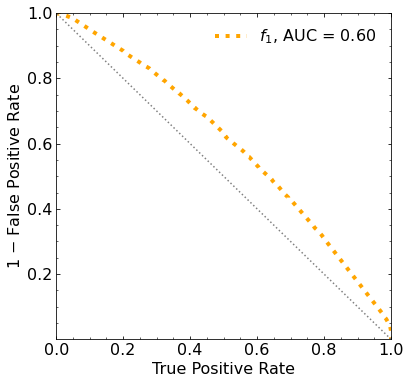

Classification score:


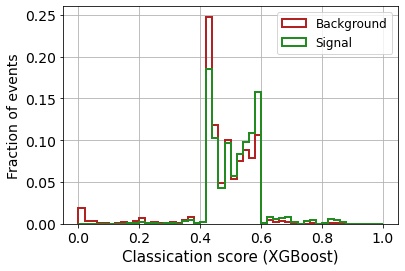


 ROC-AUC =  0.5979147828086497
At least 5 B events per bin, range = [[0, 1]]:
# bins:  3 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  3
range of our data:  [[0, 1]]
number of bins we are going to use:  3
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.202


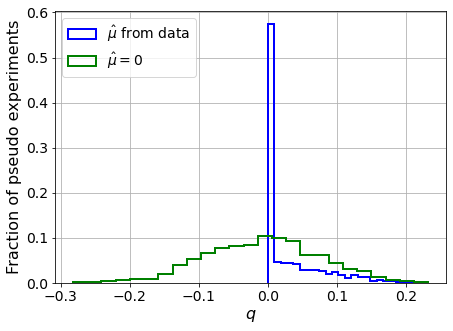

muhat mean:  2.7834383854535503
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.08153300634306122
std Z_bins mu=0:  0.5082730225504326

--------

B_expected:  643
S_expected:  1



/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:807: RuntimeWarning: divide by zero encountered in double_scalars
  Z_bins_std = np.std(q_muhat_bins) / (2.*Z_bins)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.205


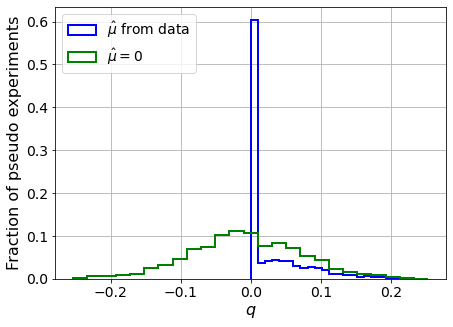

muhat mean:  2.6998959784326075
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.09550884966263382
std Z_bins mu=0:  0.4162986701960729

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.207


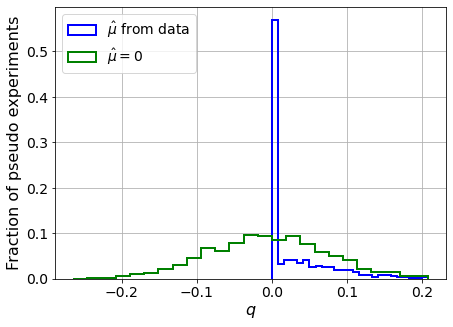

muhat mean:  2.1220816186944402
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.07547366783079154
std Z_bins mu=0:  0.527645557475118

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2175


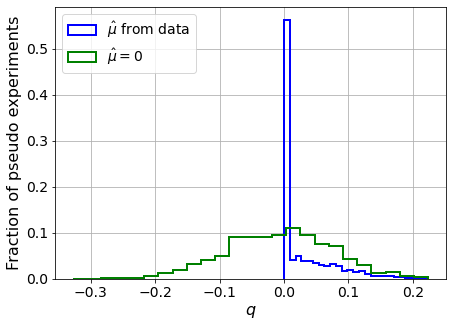

muhat mean:  2.7486815607589308
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.057546069703953324
std Z_bins mu=0:  0.7149199559211143

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2125


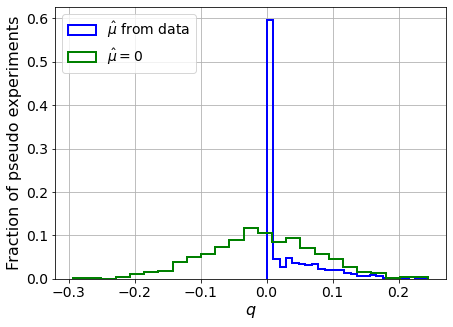

muhat mean:  3.028343671731424
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.0979197918579477
std Z_bins mu=0:  0.4248014424225598

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.216


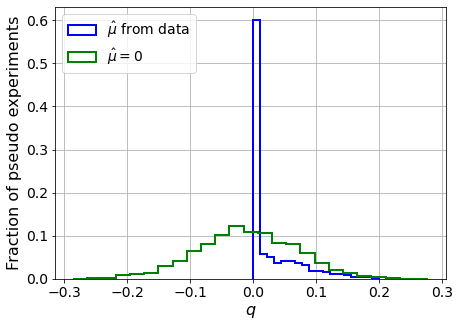

muhat mean:  3.4570154637942556
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.0986192910197936
std Z_bins mu=0:  0.40256351741070534

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.22


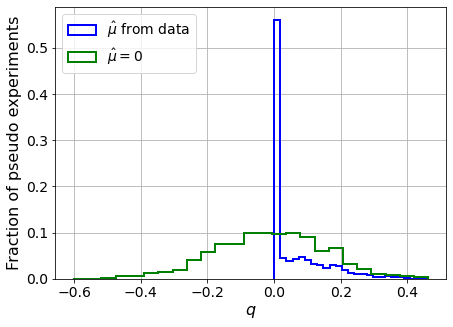

muhat mean:  1.385400477429921
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.10085076639864511
std Z_bins mu=0:  0.8076516582776785

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2055


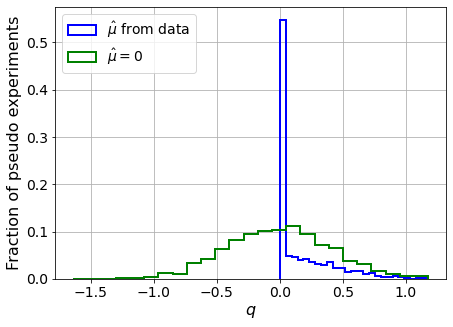

muhat mean:  0.62478819694496
Z_bins:  0.09625785962981005
std Z_bins:  1.2249029491229368
Z_bins mu=0:  0.05450713661561382
std Z_bins mu=0:  3.7682981694887228

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2005


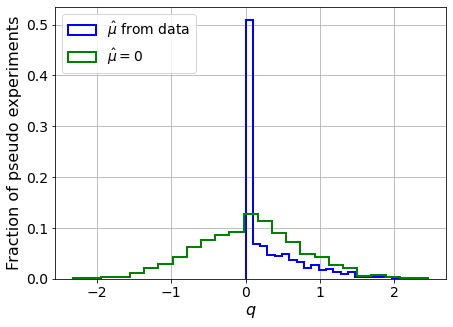

muhat mean:  0.3006179321221454
Z_bins:  0.2980325304178594
std Z_bins:  0.73531463829899
Z_bins mu=0:  0.2895628484102073
std Z_bins mu=0:  1.2359160079499851

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.208


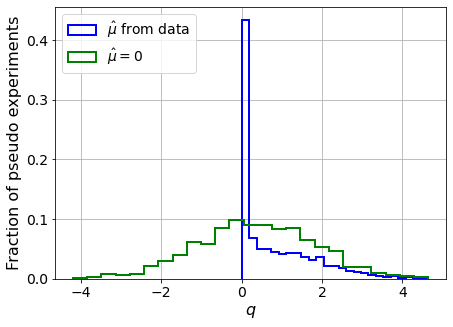

muhat mean:  0.18299174587001527
Z_bins:  0.6007137536500027
std Z_bins:  0.7958838058603577
Z_bins mu=0:  0.5846886854026155
std Z_bins mu=0:  1.2528316715293977

--------

B_expected:  643
S_expected:  34

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.211


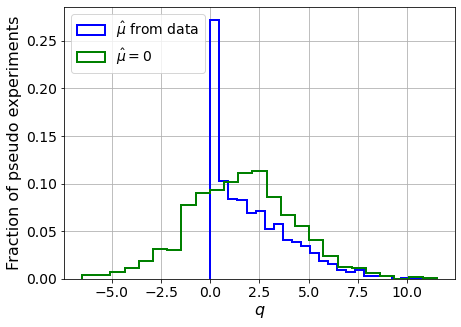

muhat mean:  0.07799023908275243
Z_bins:  1.2695813721408402
std Z_bins:  0.7940286398401908
Z_bins mu=0:  1.2631252622694147
std Z_bins mu=0:  1.055633801499777

--------

B_expected:  643
S_expected:  66

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.206


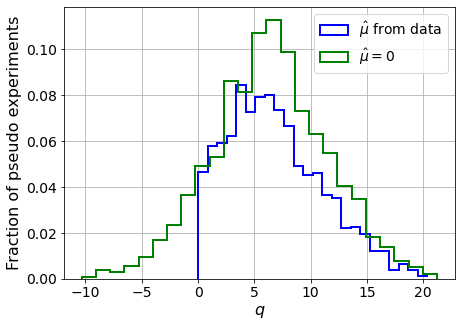

muhat mean:  0.04266164131369415
Z_bins:  2.522429356029208
std Z_bins:  0.8467105711452889
Z_bins mu=0:  2.5204214795349063
std Z_bins mu=0:  1.0077501104979154

--------

B_expected:  643
S_expected:  126

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2155


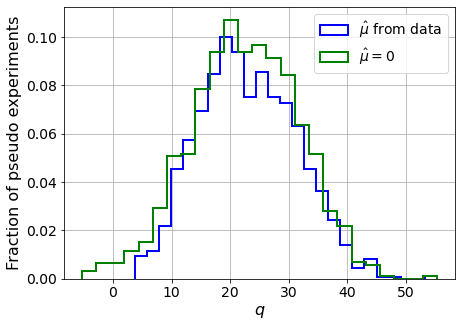

muhat mean:  0.02149182738559528
Z_bins:  4.741095745803278
std Z_bins:  0.8744046260628979
Z_bins mu=0:  4.738053302266113
std Z_bins mu=0:  0.9644108956436392

--------

B_expected:  643
S_expected:  244

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.226


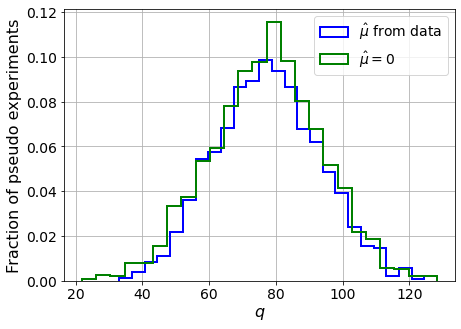

muhat mean:  0.011795570590531995
Z_bins:  8.817802599352577
std Z_bins:  0.8880275558766609
Z_bins mu=0:  8.817188507966556
std Z_bins mu=0:  0.9377792099875465

--------

B_expected:  643
S_expected:  471

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2175


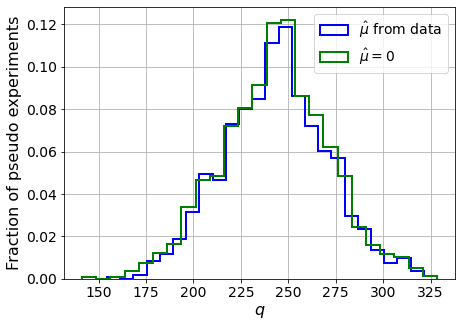

muhat mean:  0.005900764415132074
Z_bins:  15.604118123209954
std Z_bins:  0.8741204235603944
Z_bins mu=0:  15.604085134883555
std Z_bins mu=0:  0.9025091409143937

--------


 FINAL RESULT:

[[0.0, inf, 2.7834383854535503, 0.08153300634306122, 0.5082730225504326], [0.0, inf, 2.6998959784326075, 0.09550884966263382, 0.4162986701960729], [0.0, inf, 2.1220816186944402, 0.07547366783079154, 0.527645557475118], [0.0, inf, 2.7486815607589308, 0.057546069703953324, 0.7149199559211143], [0.0, inf, 3.028343671731424, 0.0979197918579477, 0.4248014424225598], [0.0, inf, 3.4570154637942556, 0.0986192910197936, 0.40256351741070534], [0.0, inf, 1.385400477429921, 0.10085076639864511, 0.8076516582776785], [0.09625785962981005, 1.2249029491229368, 0.62478819694496, 0.05450713661561382, 3.7682981694887228], [0.2980325304178594, 0.73531463829899, 0.3006179321221454, 0.2895628484102073, 1.2359160079499851], [0.6007137536500027, 0.7958838058603577, 0.18299174587001527, 0.5846886854026155, 1.2528316715293

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 266.4354833  247.97312808 224.32764374
 199.17581716 151.88479597  81.57404719   6.96311781 -84.26381598]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 270.05342568 248.60354728 227.78704447
 209

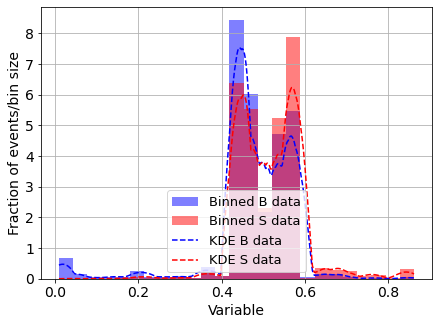

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



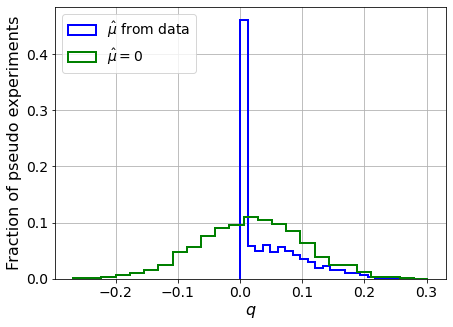

muhat mean:  -4.777183420909194
Z_bins:  0.14091590185469746
std Z_bins:  0.19569688824389694
Z_bins mu=0:  0.14091590185469746
std Z_bins mu=0:  0.29945048214043457

--------

B_expected:  643
S_expected:  1



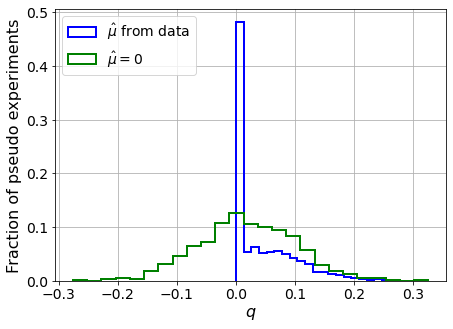

muhat mean:  -4.756216713140178
Z_bins:  0.1335912766582746
std Z_bins:  0.2052323381513245
Z_bins mu=0:  0.1335912766582746
std Z_bins mu=0:  0.30903028866319227

--------

B_expected:  643
S_expected:  1



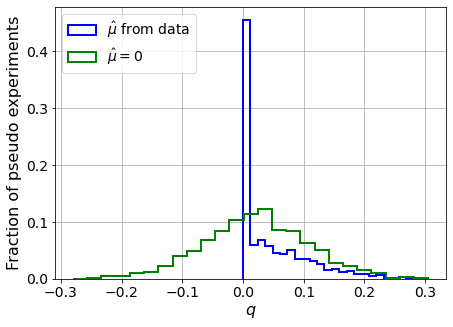

muhat mean:  -5.292982531538355
Z_bins:  0.14264774731641316
std Z_bins:  0.2038708298809789
Z_bins mu=0:  0.14264774731641316
std Z_bins mu=0:  0.3056283574204634

--------

B_expected:  643
S_expected:  1



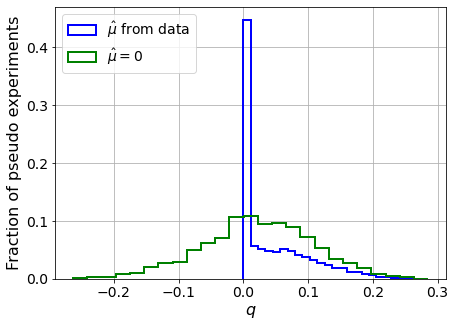

muhat mean:  -5.385515910276333
Z_bins:  0.14875286425369638
std Z_bins:  0.18763230226401525
Z_bins mu=0:  0.14875286425369638
std Z_bins mu=0:  0.288858116709911

--------

B_expected:  643
S_expected:  1



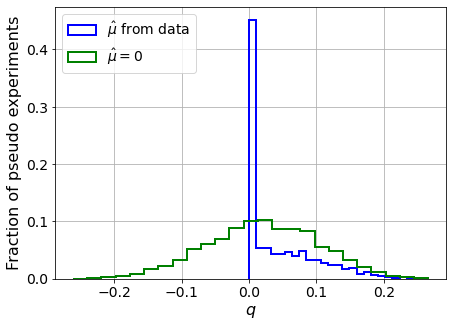

muhat mean:  -4.910084040883652
Z_bins:  0.14302182300300054
std Z_bins:  0.18936887852635534
Z_bins mu=0:  0.14302182300300054
std Z_bins mu=0:  0.2906430400523555

--------

B_expected:  643
S_expected:  1



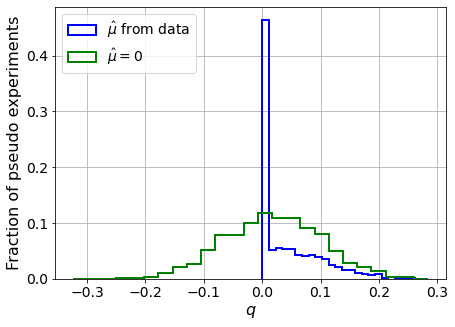

muhat mean:  -4.4792248605413985
Z_bins:  0.1388925835584183
std Z_bins:  0.19371610585087767
Z_bins mu=0:  0.1388925835584183
std Z_bins mu=0:  0.2980609243707403

--------

B_expected:  643
S_expected:  2



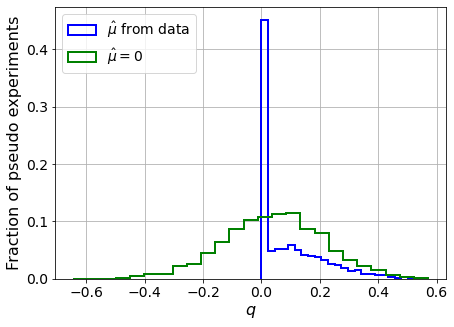

muhat mean:  -2.4698622555281085
Z_bins:  0.21501036095763443
std Z_bins:  0.26276915897554515
Z_bins mu=0:  0.21501036095763443
std Z_bins mu=0:  0.3986746552443777

--------

B_expected:  643
S_expected:  5



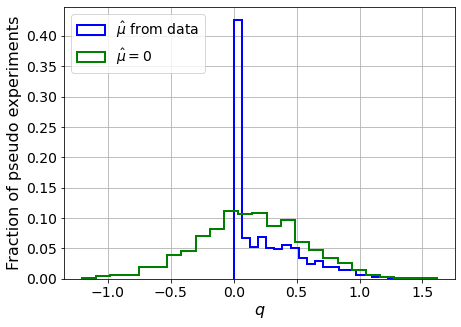

muhat mean:  -1.0537443983302293
Z_bins:  0.3686862847544656
std Z_bins:  0.3986285918217301
Z_bins mu=0:  0.3686862847544656
std Z_bins mu=0:  0.5751784568448888

--------

B_expected:  643
S_expected:  9



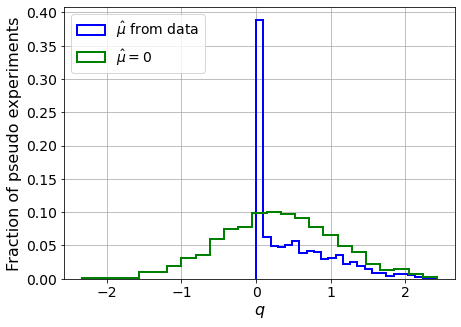

muhat mean:  -0.5063592138845472
Z_bins:  0.5387547353837668
std Z_bins:  0.49393806731492046
Z_bins mu=0:  0.5387547353837668
std Z_bins mu=0:  0.6988494979384222

--------

B_expected:  643
S_expected:  18



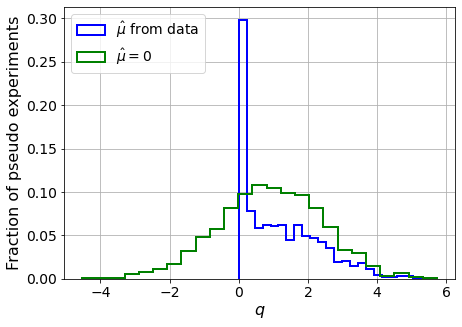

muhat mean:  -0.2908048834186329
Z_bins:  0.966733190320483
std Z_bins:  0.5848608798528935
Z_bins mu=0:  0.966733190320483
std Z_bins mu=0:  0.772109721475818

--------

B_expected:  643
S_expected:  34



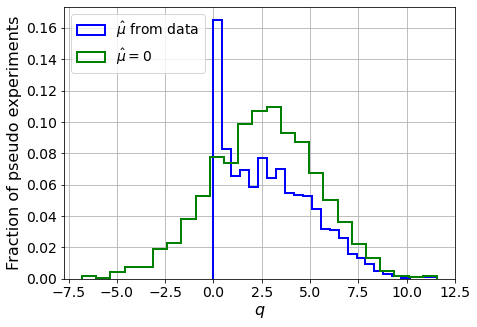

muhat mean:  -0.14732509375132025
Z_bins:  1.6374362846941624
std Z_bins:  0.6908713252005673
Z_bins mu=0:  1.6374362846941624
std Z_bins mu=0:  0.8447382729053937

--------

B_expected:  643
S_expected:  66



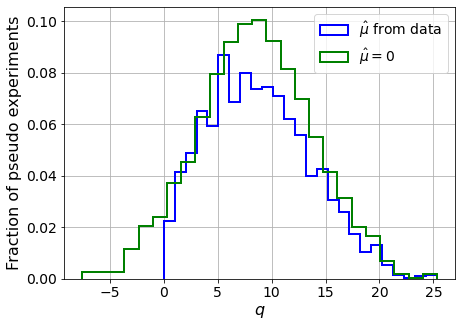

muhat mean:  -0.08593002779860638
Z_bins:  2.9030950921175447
std Z_bins:  0.8213718416347298
Z_bins mu=0:  2.9030950921175447
std Z_bins mu=0:  0.9098385049377654

--------

B_expected:  643
S_expected:  126



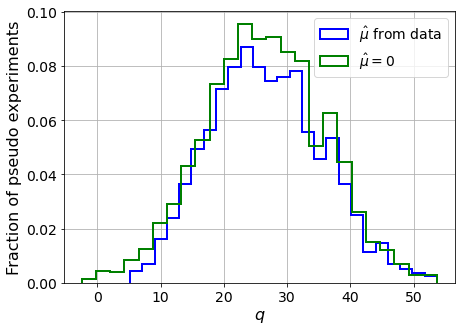

muhat mean:  -0.034588477014361574
Z_bins:  5.1290416388826765
std Z_bins:  0.8618297989723696
Z_bins mu=0:  5.1290416388826765
std Z_bins mu=0:  0.916749831974075

--------

B_expected:  643
S_expected:  244



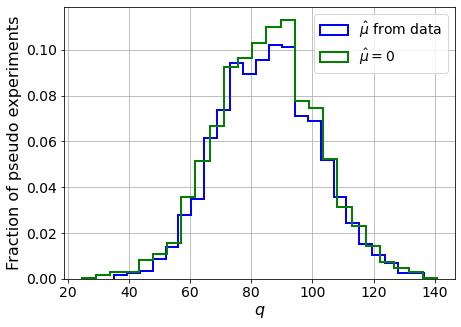

muhat mean:  -0.021300075416657033
Z_bins:  9.241287893875082
std Z_bins:  0.8823571433587182
Z_bins mu=0:  9.241287893875082
std Z_bins mu=0:  0.9142978580362778

--------

B_expected:  643
S_expected:  471



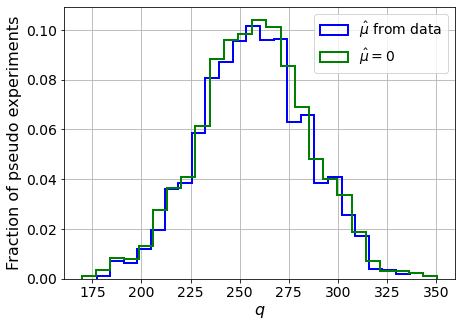

muhat mean:  -0.009903769679582652
Z_bins:  16.042846610091456
std Z_bins:  0.8562121107831673
Z_bins mu=0:  16.042846610091456
std Z_bins mu=0:  0.8746936694280586

--------


 FINAL RESULT:

[[0.14091590185469746, 0.19569688824389694, -4.777183420909194, 0.14091590185469746, 0.29945048214043457], [0.1335912766582746, 0.2052323381513245, -4.756216713140178, 0.1335912766582746, 0.30903028866319227], [0.14264774731641316, 0.2038708298809789, -5.292982531538355, 0.14264774731641316, 0.3056283574204634], [0.14875286425369638, 0.18763230226401525, -5.385515910276333, 0.14875286425369638, 0.288858116709911], [0.14302182300300054, 0.18936887852635534, -4.910084040883652, 0.14302182300300054, 0.2906430400523555], [0.1388925835584183, 0.19371610585087767, -4.4792248605413985, 0.1388925835584183, 0.2980609243707403], [0.21501036095763443, 0.26276915897554515, -2.4698622555281085, 0.21501036095763443, 0.3986746552443777], [0.3686862847544656, 0.3986285918217301, -1.0537443983302293, 0.3686862847

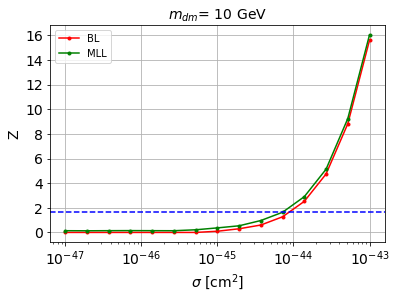


cross_BL_164:  8.742134946724876e-45
cross_BL_164_up:  4.739034004766273e-45
cross_BL_164_down:  1.3625543887700953e-44

cross_MLL_164:  7.206453676103188e-45
cross_MLL_164_up:  4.017433684558724e-45
cross_MLL_164_down:  1.0756658183909771e-44

#########################


#########################

mDM =  20 GeV


S_cs1.shape:  (33873,)
S_cs2.shape:  (33873,)
 NUM_DAT:  33001 

NUM_DAT_ER:  32580
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33001, 2)

S_cs1cs2.shape:  (33001, 2)


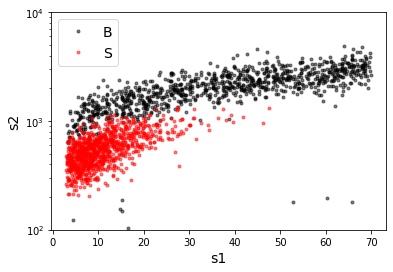

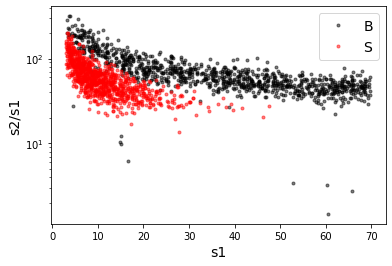

X_mon_B.shape:  (33001, 1)
X_mon_S.shape:  (33001, 1)
X_mon.shape:  (66002, 1)

X_mon_train :  (42075, 1)
y_mon_train :  (42075,)
X_mon_val :  (7426, 1)
y_mon_val :  (7426,)
X_mon_test :  (16501, 1)
y_mon_test :  (16501,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69260	validation_1-logloss:0.69260
[1]	validation_0-logloss:0.69204	validation_1-logloss:0.69207
[2]	validation_0-logloss:0.69152	validation_1-logloss:0.69155
[3]	validation_0-logloss:0.69099	validation_1-logloss:0.69105
[4]	validation_0-logloss:0.69048	validation_1-logloss:0.69055
[5]	validation_0-logloss:0.68998	validation_1-logloss:0.69006
[6]	validation_0-logloss:0.68948	validation_1-logloss:0.68959
[7]	validation_0-logloss:0.68900	validation_1-logloss:0.68912
[8]	validation_0-logloss:0.68852	validation_1-logloss:0.68866
[9]	validation_0-logloss:0.68807	validation_1-logloss:0.68820
[10]	validation_0-logloss:0.68760	validation_1-logloss:0.68776
[11]	validation_0-logloss:0.68717	validation_1-logloss:0.68733
[12]	validation_0-logloss:0.68671	validation_1-logloss:0.68691
[13]	validation_0-logloss:0.68630	validation_1-logloss:0.68649
[14]	validation_0-logloss:0.68587	validation_1-logloss:0.68608
[15]	validation_0-logloss:0.68547	validation_1-logloss:0.68568
[1

[130]	validation_0-logloss:0.66445	validation_1-logloss:0.66671
[131]	validation_0-logloss:0.66439	validation_1-logloss:0.66666
[132]	validation_0-logloss:0.66432	validation_1-logloss:0.66662
[133]	validation_0-logloss:0.66426	validation_1-logloss:0.66656
[134]	validation_0-logloss:0.66419	validation_1-logloss:0.66652
[135]	validation_0-logloss:0.66413	validation_1-logloss:0.66646
[136]	validation_0-logloss:0.66407	validation_1-logloss:0.66642
[137]	validation_0-logloss:0.66400	validation_1-logloss:0.66638
[138]	validation_0-logloss:0.66395	validation_1-logloss:0.66634
[139]	validation_0-logloss:0.66388	validation_1-logloss:0.66629
[140]	validation_0-logloss:0.66383	validation_1-logloss:0.66625
[141]	validation_0-logloss:0.66378	validation_1-logloss:0.66620
[142]	validation_0-logloss:0.66371	validation_1-logloss:0.66615
[143]	validation_0-logloss:0.66366	validation_1-logloss:0.66612
[144]	validation_0-logloss:0.66360	validation_1-logloss:0.66608
[145]	validation_0-logloss:0.66355	valid

[259]	validation_0-logloss:0.66003	validation_1-logloss:0.66407
[260]	validation_0-logloss:0.66001	validation_1-logloss:0.66407
[261]	validation_0-logloss:0.65999	validation_1-logloss:0.66407
[262]	validation_0-logloss:0.65998	validation_1-logloss:0.66407
[263]	validation_0-logloss:0.65996	validation_1-logloss:0.66407
[264]	validation_0-logloss:0.65995	validation_1-logloss:0.66406
[265]	validation_0-logloss:0.65994	validation_1-logloss:0.66405
[266]	validation_0-logloss:0.65993	validation_1-logloss:0.66405
[267]	validation_0-logloss:0.65990	validation_1-logloss:0.66405
[268]	validation_0-logloss:0.65989	validation_1-logloss:0.66404
[269]	validation_0-logloss:0.65988	validation_1-logloss:0.66404
[270]	validation_0-logloss:0.65986	validation_1-logloss:0.66403
[271]	validation_0-logloss:0.65985	validation_1-logloss:0.66403
[272]	validation_0-logloss:0.65983	validation_1-logloss:0.66403
[273]	validation_0-logloss:0.65981	validation_1-logloss:0.66402
[274]	validation_0-logloss:0.65980	valid

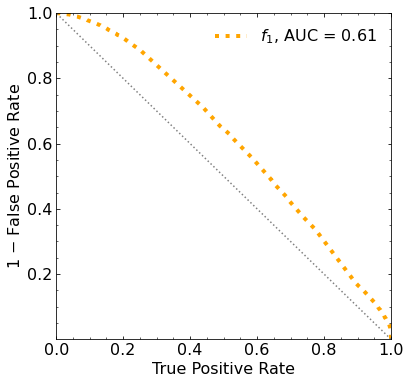

Classification score:


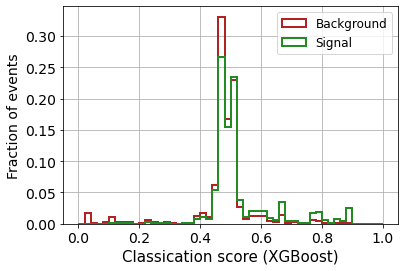


 ROC-AUC =  0.6096371904571974
At least 5 B events per bin, range = [[0, 1]]:
# bins:  4 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  4
range of our data:  [[0, 1]]
number of bins we are going to use:  4
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0115


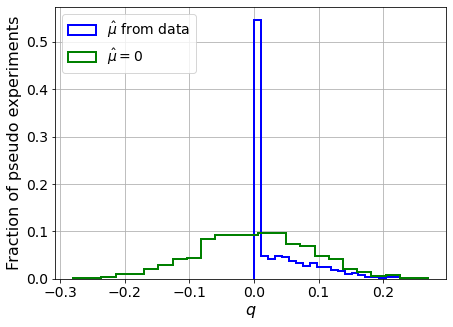

muhat mean:  0.4936850566180122
Z_bins:  0.03406203843143189
std Z_bins:  0.749865809794202
Z_bins mu=0:  0.031972123691866236
std Z_bins mu=0:  1.369216780899838

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0145


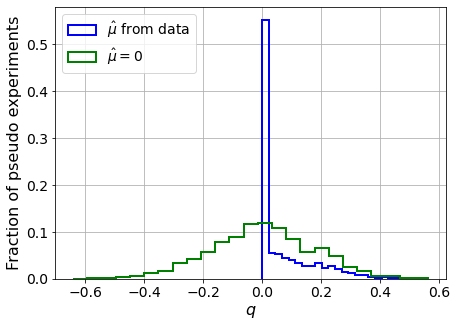

muhat mean:  0.3992763747129996
Z_bins:  0.06398083888530756
std Z_bins:  0.8117335592255056
Z_bins mu=0:  0.0575829408391575
std Z_bins mu=0:  1.5370331209222383

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.01


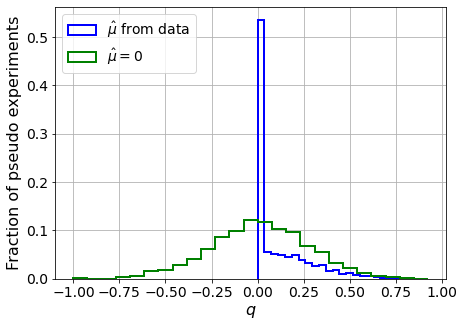

muhat mean:  0.1445370964268919
Z_bins:  0.11987708821215609
std Z_bins:  0.6726864480426816
Z_bins mu=0:  0.11863932522949347
std Z_bins mu=0:  1.133626877925831

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0085


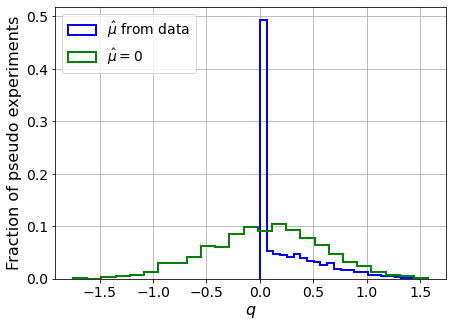

muhat mean:  0.16347745083976783
Z_bins:  0.2671437977682083
std Z_bins:  0.5930718520619108
Z_bins mu=0:  0.2671437977682083
std Z_bins mu=0:  0.9943847486363935

--------

B_expected:  643
S_expected:  12

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.016


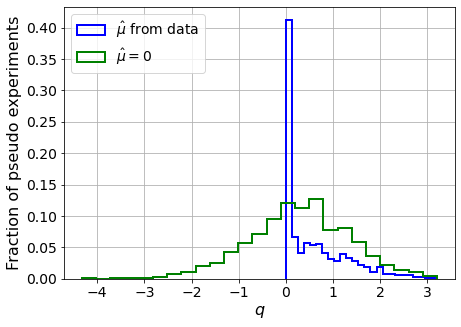

muhat mean:  0.008793030841866452
Z_bins:  0.5735082437619655
std Z_bins:  0.605163912652863
Z_bins mu=0:  0.5735082437619655
std Z_bins mu=0:  0.9310381650472709

--------

B_expected:  643
S_expected:  23

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.014


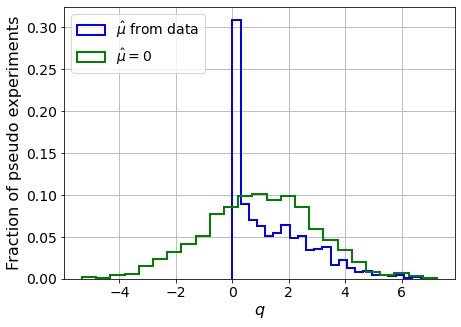

muhat mean:  0.028235268455437963
Z_bins:  1.0023330013960832
std Z_bins:  0.7079851150077168
Z_bins mu=0:  1.0022518967044283
std Z_bins mu=0:  0.9826239642864495

--------

B_expected:  643
S_expected:  44

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0125


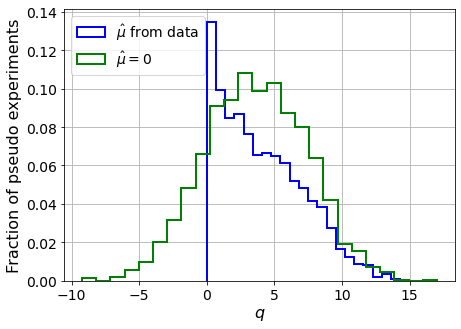

muhat mean:  0.0034828835346904907
Z_bins:  1.8972968977911764
std Z_bins:  0.8118765654129357
Z_bins mu=0:  1.8972919911586235
std Z_bins mu=0:  0.9872445002356096

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0135


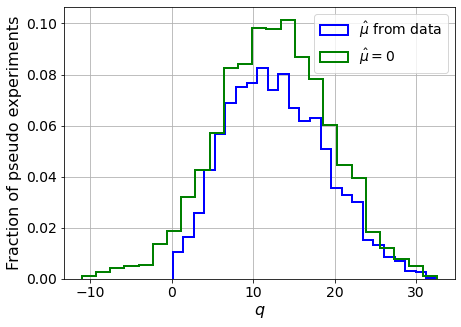

muhat mean:  0.01016846205967808
Z_bins:  3.5476445668643004
std Z_bins:  0.8561646415963309
Z_bins mu=0:  3.5472470467751456
std Z_bins mu=0:  0.9693893518108431

--------

B_expected:  643
S_expected:  165

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0155


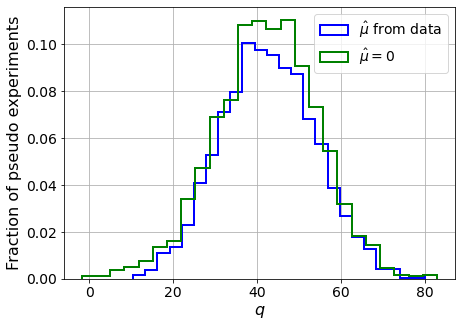

muhat mean:  0.006129811476270606
Z_bins:  6.5202515461225055
std Z_bins:  0.8627290161445376
Z_bins mu=0:  6.519127840603324
std Z_bins mu=0:  0.9270070225355704

--------

B_expected:  643
S_expected:  318

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.015


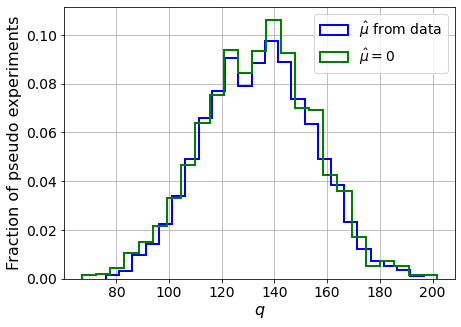

muhat mean:  0.0034712532293275267
Z_bins:  11.581686437043047
std Z_bins:  0.880565010940746
Z_bins mu=0:  11.581044231113506
std Z_bins mu=0:  0.9150420046635809

--------

B_expected:  643
S_expected:  615

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.01


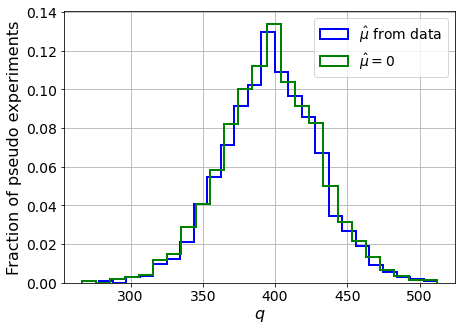

muhat mean:  0.001922228846145483
Z_bins:  19.923726296134916
std Z_bins:  0.8272650783430399
Z_bins mu=0:  19.92223678601146
std Z_bins mu=0:  0.8474664046939938

--------

B_expected:  643
S_expected:  1187

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.016


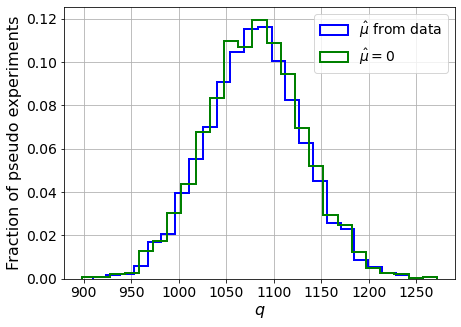

muhat mean:  0.000558495480573667
Z_bins:  32.867825051559635
std Z_bins:  0.7727254458991873
Z_bins mu=0:  32.86702977669425
std Z_bins mu=0:  0.7836305339189827

--------

B_expected:  643
S_expected:  2291

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.015


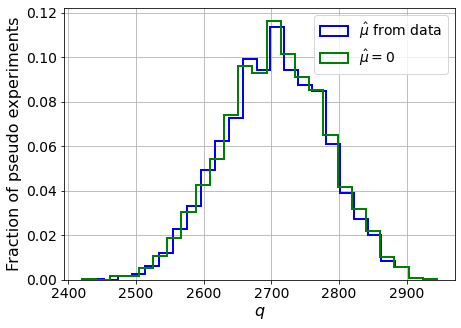

muhat mean:  0.00026629676450488416
Z_bins:  52.031114491895146
std Z_bins:  0.7299399311791618
Z_bins mu=0:  52.03080388427794
std Z_bins mu=0:  0.7372752409192662

--------

B_expected:  643
S_expected:  4424

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.013


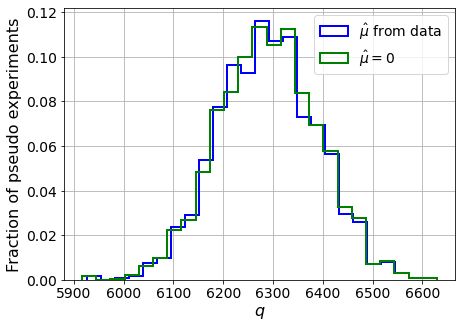

muhat mean:  9.422188322083394e-05
Z_bins:  79.30764002790792
std Z_bins:  0.6258452126503676
Z_bins mu=0:  79.30704970290452
std Z_bins mu=0:  0.630076618594734

--------

B_expected:  643
S_expected:  8542

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.013


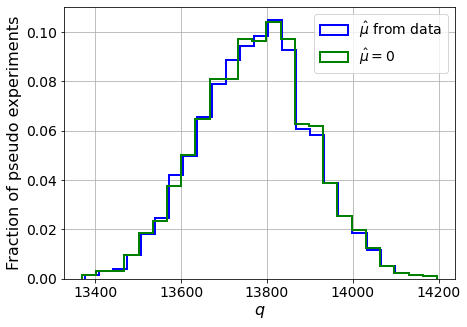

muhat mean:  0.00015407647632131036
Z_bins:  117.36974645331746
std Z_bins:  0.550311942659869
Z_bins mu=0:  117.36940914677565
std Z_bins mu=0:  0.5533994142737709

--------


 FINAL RESULT:

[[0.03406203843143189, 0.749865809794202, 0.4936850566180122, 0.031972123691866236, 1.369216780899838], [0.06398083888530756, 0.8117335592255056, 0.3992763747129996, 0.0575829408391575, 1.5370331209222383], [0.11987708821215609, 0.6726864480426816, 0.1445370964268919, 0.11863932522949347, 1.133626877925831], [0.2671437977682083, 0.5930718520619108, 0.16347745083976783, 0.2671437977682083, 0.9943847486363935], [0.5735082437619655, 0.605163912652863, 0.008793030841866452, 0.5735082437619655, 0.9310381650472709], [1.0023330013960832, 0.7079851150077168, 0.028235268455437963, 1.0022518967044283, 0.9826239642864495], [1.8972968977911764, 0.8118765654129357, 0.0034828835346904907, 1.8972919911586235, 0.9872445002356096], [3.5476445668643004, 0.8561646415963309, 0.01016846205967808, 3.5472470467751456, 

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 348.10752109 321.18439768 277.69300331
 220.35955899 154.01135016  86.29995112   8.76245808 -83.67748096]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 237.50148913
 194

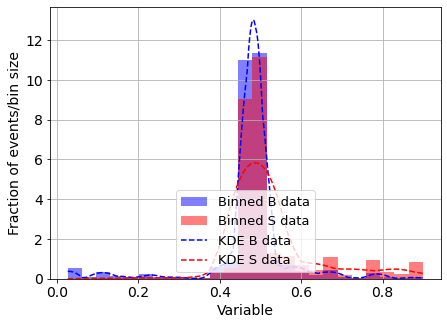

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



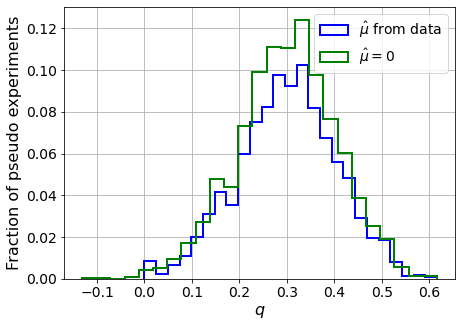

muhat mean:  -46.216283429873435
Z_bins:  0.5504534419776862
std Z_bins:  0.09410110351767838
Z_bins mu=0:  0.5504534419776862
std Z_bins mu=0:  0.09454025641948884

--------

B_expected:  643
S_expected:  2



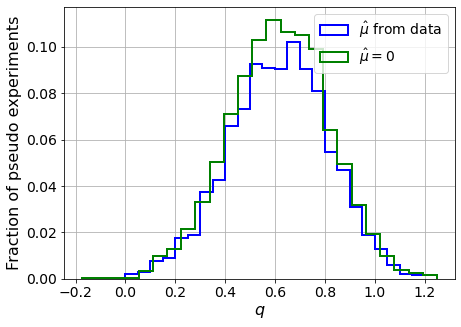

muhat mean:  -23.761322842789248
Z_bins:  0.7878613065885881
std Z_bins:  0.1264551746674314
Z_bins mu=0:  0.7878613065885881
std Z_bins mu=0:  0.12677259520454734

--------

B_expected:  643
S_expected:  3



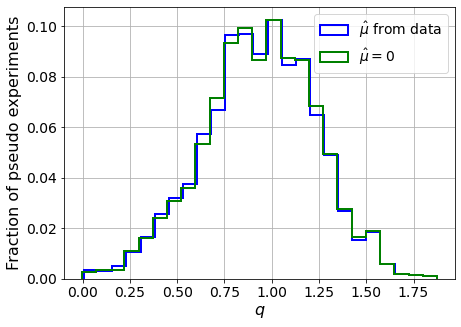

muhat mean:  -15.791061956656078
Z_bins:  0.9749043241281369
std Z_bins:  0.1529033285360146
Z_bins mu=0:  0.9749043241281369
std Z_bins mu=0:  0.15291451867356637

--------

B_expected:  643
S_expected:  6



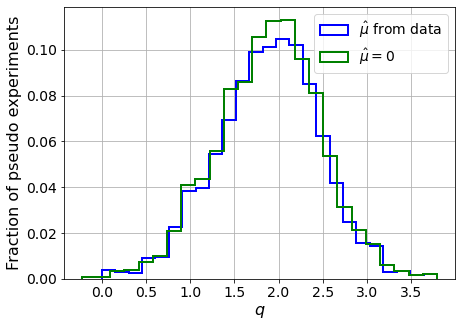

muhat mean:  -7.80342461408882
Z_bins:  1.3862284722103582
std Z_bins:  0.21092610925806443
Z_bins mu=0:  1.3862284722103582
std Z_bins mu=0:  0.21118683579650607

--------

B_expected:  643
S_expected:  12



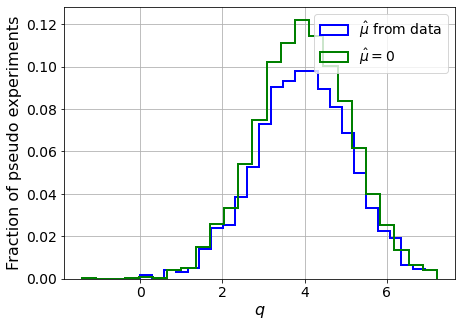

muhat mean:  -3.9046619495396153
Z_bins:  1.995570610607439
std Z_bins:  0.28704894725578417
Z_bins mu=0:  1.995570610607439
std Z_bins mu=0:  0.2880161501562205

--------

B_expected:  643
S_expected:  23



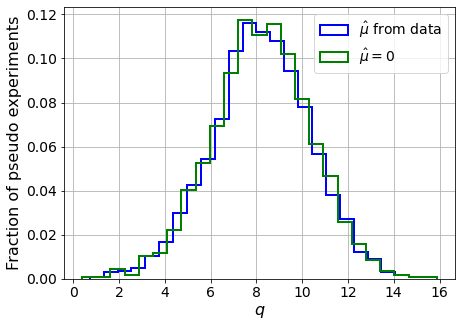

muhat mean:  -2.070659901526239
Z_bins:  2.86951587102369
std Z_bins:  0.3757879600266425
Z_bins mu=0:  2.86951587102369
std Z_bins mu=0:  0.3760250405457295

--------

B_expected:  643
S_expected:  44



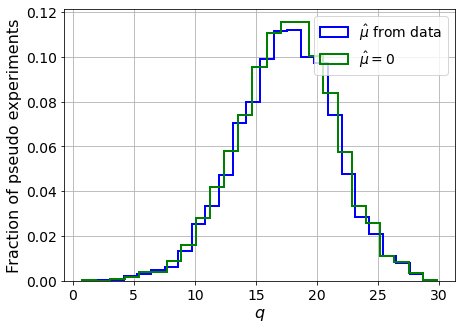

muhat mean:  -1.0630085424592504
Z_bins:  4.194029720530324
std Z_bins:  0.47878048993061356
Z_bins mu=0:  4.194029720530324
std Z_bins mu=0:  0.4791795348745185

--------

B_expected:  643
S_expected:  85



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


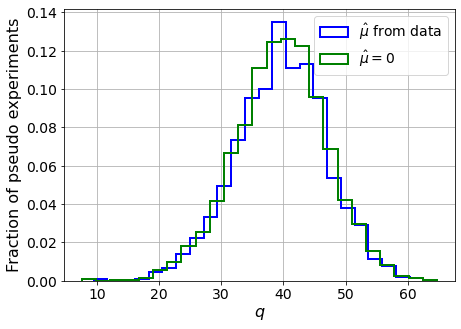

muhat mean:  -0.5479746328686349
Z_bins:  6.308950577794569
std Z_bins:  0.578841674710182
Z_bins mu=0:  6.308950577794569
std Z_bins mu=0:  0.5793900902949001

--------

B_expected:  643
S_expected:  165



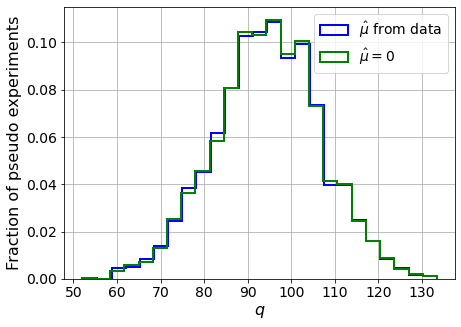

muhat mean:  -0.28467730125440915
Z_bins:  9.73285788480205
std Z_bins:  0.6235637481143943
Z_bins mu=0:  9.73285788480205
std Z_bins mu=0:  0.6236095514513164

--------

B_expected:  643
S_expected:  318



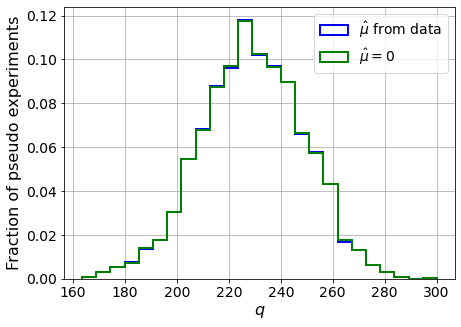

muhat mean:  -0.14969295867554105
Z_bins:  15.129877899159398
std Z_bins:  0.6540285630077727
Z_bins mu=0:  15.129877899159398
std Z_bins mu=0:  0.6540375303323215

--------

B_expected:  643
S_expected:  615



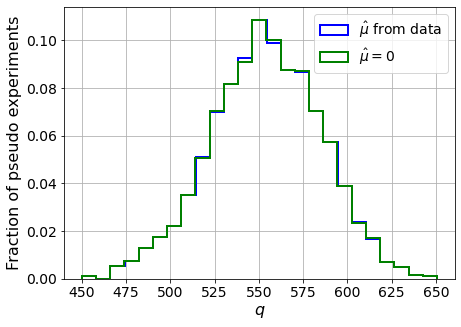

muhat mean:  -0.07625605644721367
Z_bins:  23.536777537770273
std Z_bins:  0.6611426144996119
Z_bins mu=0:  23.536777537770273
std Z_bins mu=0:  0.661154042821738

--------

B_expected:  643
S_expected:  1187



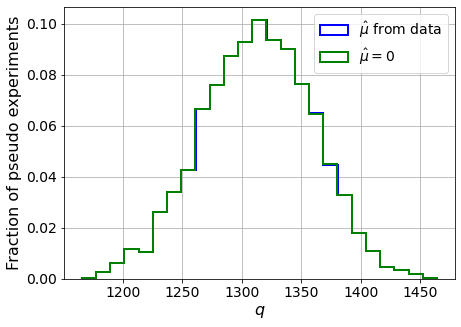

muhat mean:  -0.03985046553921331
Z_bins:  36.23810366541984
std Z_bins:  0.6464273057734379
Z_bins mu=0:  36.23810366541984
std Z_bins mu=0:  0.6464326384161067

--------

B_expected:  643
S_expected:  2291



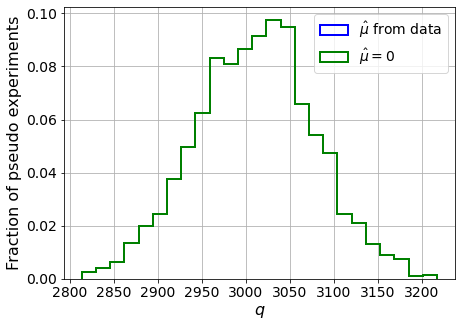

muhat mean:  -0.021184461289576934
Z_bins:  54.88434226826617
std Z_bins:  0.611288022929815
Z_bins mu=0:  54.88434226826617
std Z_bins mu=0:  0.6112882776263707

--------

B_expected:  643
S_expected:  4424



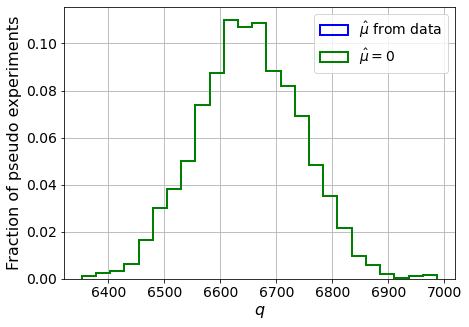

muhat mean:  -0.010782210808448099
Z_bins:  81.55332088395771
std Z_bins:  0.5667352712171938
Z_bins mu=0:  81.55332088395771
std Z_bins mu=0:  0.5667421244481655

--------

B_expected:  643
S_expected:  8542



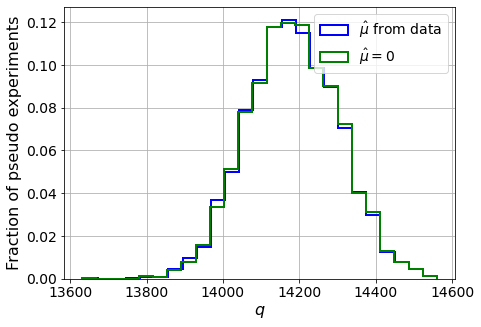

muhat mean:  -0.005513462366862718
Z_bins:  119.08662019874902
std Z_bins:  0.505541267146247
Z_bins mu=0:  119.08662019874902
std Z_bins mu=0:  0.5055823496664019

--------


 FINAL RESULT:

[[0.5504534419776862, 0.09410110351767838, -46.216283429873435, 0.5504534419776862, 0.09454025641948884], [0.7878613065885881, 0.1264551746674314, -23.761322842789248, 0.7878613065885881, 0.12677259520454734], [0.9749043241281369, 0.1529033285360146, -15.791061956656078, 0.9749043241281369, 0.15291451867356637], [1.3862284722103582, 0.21092610925806443, -7.80342461408882, 1.3862284722103582, 0.21118683579650607], [1.995570610607439, 0.28704894725578417, -3.9046619495396153, 1.995570610607439, 0.2880161501562205], [2.86951587102369, 0.3757879600266425, -2.070659901526239, 2.86951587102369, 0.3760250405457295], [4.194029720530324, 0.47878048993061356, -1.0630085424592504, 4.194029720530324, 0.4791795348745185], [6.308950577794569, 0.578841674710182, -0.5479746328686349, 6.308950577794569, 0.57939009

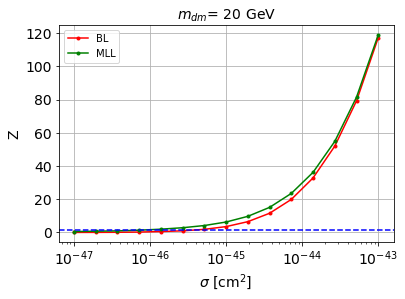


cross_BL_164:  4.286911563739823e-46
cross_BL_164_up:  2.4591297746233356e-46
cross_BL_164_down:  6.500460955100018e-46

cross_MLL_164:  9.465285684476282e-47
cross_MLL_164_up:  7.498969856538178e-47
cross_MLL_164_down:  1.2768540508490896e-46

#########################


#########################

mDM =  35 GeV


S_cs1.shape:  (33697,)
S_cs2.shape:  (33697,)
 NUM_DAT:  33084 

NUM_DAT_ER:  32663
NUM_DAT_AC:  116
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  274

B_cs1cs2.shape:  (33084, 2)

S_cs1cs2.shape:  (33084, 2)


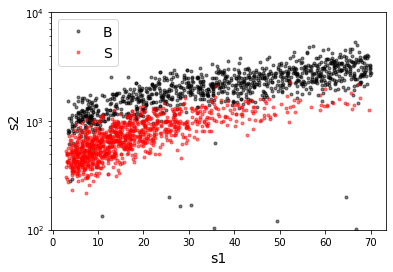

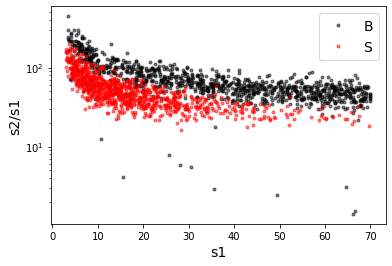

X_mon_B.shape:  (33084, 1)
X_mon_S.shape:  (33084, 1)
X_mon.shape:  (66168, 1)

X_mon_train :  (42182, 1)
y_mon_train :  (42182,)
X_mon_val :  (7444, 1)
y_mon_val :  (7444,)
X_mon_test :  (16542, 1)
y_mon_test :  (16542,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69184	validation_1-logloss:0.69184
[1]	validation_0-logloss:0.69056	validation_1-logloss:0.69056
[2]	validation_0-logloss:0.68929	validation_1-logloss:0.68930
[3]	validation_0-logloss:0.68805	validation_1-logloss:0.68806
[4]	validation_0-logloss:0.68684	validation_1-logloss:0.68685
[5]	validation_0-logloss:0.68564	validation_1-logloss:0.68565
[6]	validation_0-logloss:0.68448	validation_1-logloss:0.68448
[7]	validation_0-logloss:0.68334	validation_1-logloss:0.68333
[8]	validation_0-logloss:0.68220	validation_1-logloss:0.68221
[9]	validation_0-logloss:0.68111	validation_1-logloss:0.68110
[10]	validation_0-logloss:0.68003	validation_1-logloss:0.68001
[11]	validation_0-logloss:0.67897	validation_1-logloss:0.67894
[12]	validation_0-logloss:0.67792	validation_1-logloss:0.67790
[13]	validation_0-logloss:0.67691	validation_1-logloss:0.67687
[14]	validation_0-logloss:0.67591	validation_1-logloss:0.67587
[15]	validation_0-logloss:0.67492	validation_1-logloss:0.67488
[1

[130]	validation_0-logloss:0.62604	validation_1-logloss:0.62584
[131]	validation_0-logloss:0.62588	validation_1-logloss:0.62569
[132]	validation_0-logloss:0.62575	validation_1-logloss:0.62555
[133]	validation_0-logloss:0.62560	validation_1-logloss:0.62541
[134]	validation_0-logloss:0.62546	validation_1-logloss:0.62527
[135]	validation_0-logloss:0.62533	validation_1-logloss:0.62513
[136]	validation_0-logloss:0.62519	validation_1-logloss:0.62500
[137]	validation_0-logloss:0.62506	validation_1-logloss:0.62487
[138]	validation_0-logloss:0.62492	validation_1-logloss:0.62474
[139]	validation_0-logloss:0.62479	validation_1-logloss:0.62461
[140]	validation_0-logloss:0.62466	validation_1-logloss:0.62449
[141]	validation_0-logloss:0.62453	validation_1-logloss:0.62437
[142]	validation_0-logloss:0.62441	validation_1-logloss:0.62425
[143]	validation_0-logloss:0.62429	validation_1-logloss:0.62414
[144]	validation_0-logloss:0.62416	validation_1-logloss:0.62403
[145]	validation_0-logloss:0.62404	valid

[259]	validation_0-logloss:0.61733	validation_1-logloss:0.61787
[260]	validation_0-logloss:0.61729	validation_1-logloss:0.61786
[261]	validation_0-logloss:0.61727	validation_1-logloss:0.61784
[262]	validation_0-logloss:0.61724	validation_1-logloss:0.61782
[263]	validation_0-logloss:0.61721	validation_1-logloss:0.61781
[264]	validation_0-logloss:0.61719	validation_1-logloss:0.61779
[265]	validation_0-logloss:0.61717	validation_1-logloss:0.61778
[266]	validation_0-logloss:0.61715	validation_1-logloss:0.61776
[267]	validation_0-logloss:0.61711	validation_1-logloss:0.61775
[268]	validation_0-logloss:0.61709	validation_1-logloss:0.61773
[269]	validation_0-logloss:0.61706	validation_1-logloss:0.61772
[270]	validation_0-logloss:0.61704	validation_1-logloss:0.61770
[271]	validation_0-logloss:0.61702	validation_1-logloss:0.61769
[272]	validation_0-logloss:0.61699	validation_1-logloss:0.61768
[273]	validation_0-logloss:0.61697	validation_1-logloss:0.61767
[274]	validation_0-logloss:0.61695	valid

[388]	validation_0-logloss:0.61514	validation_1-logloss:0.61703
[389]	validation_0-logloss:0.61513	validation_1-logloss:0.61703
[390]	validation_0-logloss:0.61512	validation_1-logloss:0.61702
[391]	validation_0-logloss:0.61511	validation_1-logloss:0.61701
[392]	validation_0-logloss:0.61509	validation_1-logloss:0.61701
[393]	validation_0-logloss:0.61508	validation_1-logloss:0.61701
[394]	validation_0-logloss:0.61506	validation_1-logloss:0.61700
[395]	validation_0-logloss:0.61505	validation_1-logloss:0.61700
[396]	validation_0-logloss:0.61504	validation_1-logloss:0.61700
[397]	validation_0-logloss:0.61503	validation_1-logloss:0.61700
[398]	validation_0-logloss:0.61502	validation_1-logloss:0.61700
[399]	validation_0-logloss:0.61501	validation_1-logloss:0.61699
[400]	validation_0-logloss:0.61500	validation_1-logloss:0.61699
[401]	validation_0-logloss:0.61500	validation_1-logloss:0.61699
[402]	validation_0-logloss:0.61499	validation_1-logloss:0.61699
[403]	validation_0-logloss:0.61497	valid

[517]	validation_0-logloss:0.61371	validation_1-logloss:0.61694
[518]	validation_0-logloss:0.61370	validation_1-logloss:0.61694
[519]	validation_0-logloss:0.61369	validation_1-logloss:0.61694
[520]	validation_0-logloss:0.61368	validation_1-logloss:0.61694
[521]	validation_0-logloss:0.61367	validation_1-logloss:0.61694
[522]	validation_0-logloss:0.61367	validation_1-logloss:0.61693
[523]	validation_0-logloss:0.61366	validation_1-logloss:0.61693
[524]	validation_0-logloss:0.61365	validation_1-logloss:0.61693
[525]	validation_0-logloss:0.61364	validation_1-logloss:0.61693
[526]	validation_0-logloss:0.61363	validation_1-logloss:0.61693
[527]	validation_0-logloss:0.61362	validation_1-logloss:0.61693
[528]	validation_0-logloss:0.61362	validation_1-logloss:0.61693


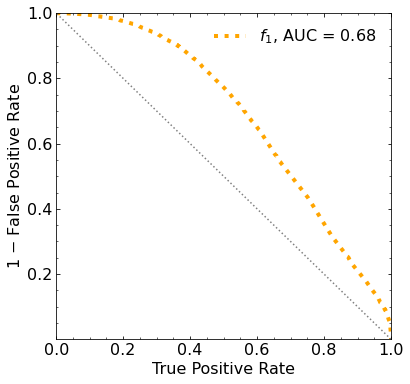

Classification score:


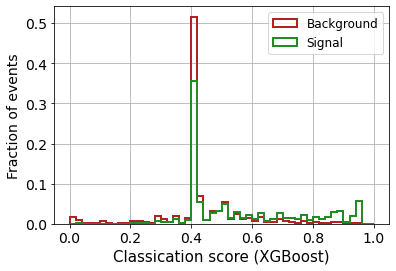


 ROC-AUC =  0.6810684285544546
At least 5 B events per bin, range = [[0, 1]]:
# bins:  8 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  8
range of our data:  [[0, 1]]
number of bins we are going to use:  8
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.29


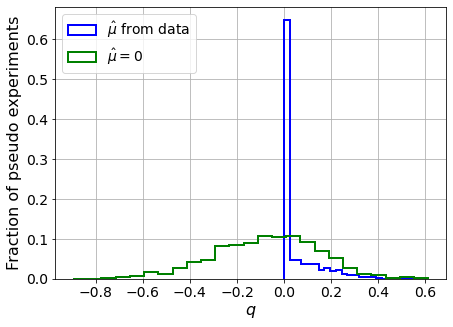

muhat mean:  2.809522452863948
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.25077480934810603
std Z_bins mu=0:  0.44179882421308475

--------

B_expected:  643
S_expected:  3



/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:807: RuntimeWarning: divide by zero encountered in double_scalars
  Z_bins_std = np.std(q_muhat_bins) / (2.*Z_bins)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.296


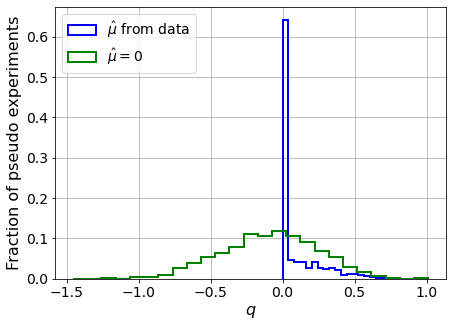

muhat mean:  1.7599862524683638
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.27295194865072286
std Z_bins mu=0:  0.6186622588230823

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3155


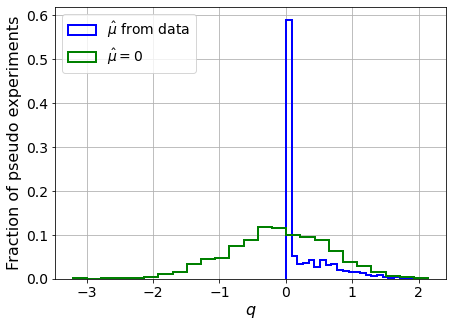

muhat mean:  0.8208273841431624
Z_bins:  0.11195780866319349
std Z_bins:  1.7483577641962365
Z_bins mu=0:  0.3366683794900203
std Z_bins mu=0:  1.1387716835582262

--------

B_expected:  643
S_expected:  13

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.292


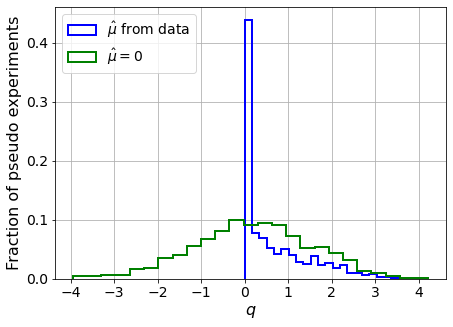

muhat mean:  0.39695433332630214
Z_bins:  0.5570067104346094
std Z_bins:  0.7394571091153622
Z_bins mu=0:  0.4838500572766926
std Z_bins mu=0:  1.415147313089006

--------

B_expected:  643
S_expected:  25

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.302


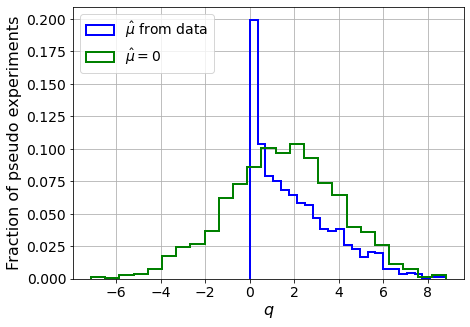

muhat mean:  0.19922698030408978
Z_bins:  1.275001152573175
std Z_bins:  0.708381272099616
Z_bins mu=0:  1.2391344263182236
std Z_bins mu=0:  1.014154751148626

--------

B_expected:  643
S_expected:  48

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2895


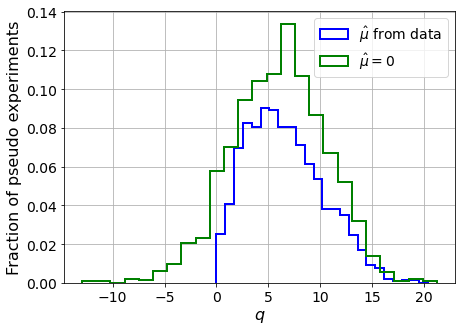

muhat mean:  0.11468312021828289
Z_bins:  2.501895862328793
std Z_bins:  0.7346781137322527
Z_bins mu=0:  2.4903715815824268
std Z_bins mu=0:  0.9068372746468987

--------

B_expected:  643
S_expected:  93

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.292


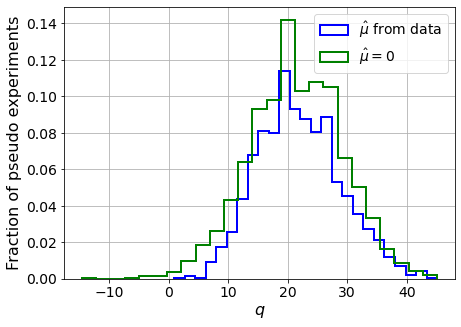

muhat mean:  0.05984511189799984
Z_bins:  4.618987967900772
std Z_bins:  0.7547402776092875
Z_bins mu=0:  4.598240469643112
std Z_bins mu=0:  0.850639513125948

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.301


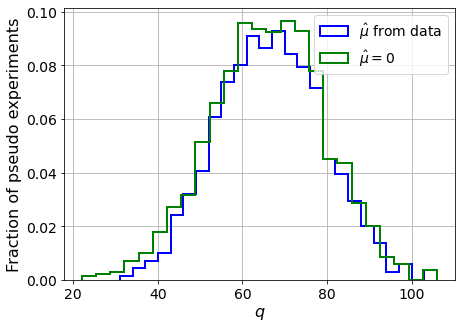

muhat mean:  0.03325130326664265
Z_bins:  8.153373809726016
std Z_bins:  0.7624549016432103
Z_bins mu=0:  8.144332558268815
std Z_bins mu=0:  0.8183110287832494

--------

B_expected:  643
S_expected:  345

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.296


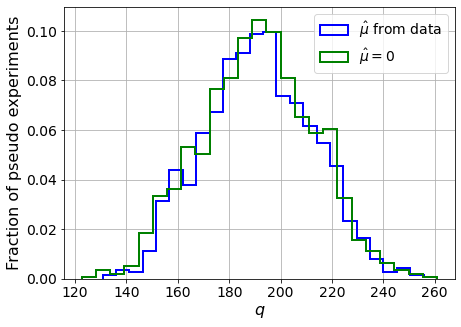

muhat mean:  0.016897994759084333
Z_bins:  13.826730474130537
std Z_bins:  0.7629468443651598
Z_bins mu=0:  13.816264190178165
std Z_bins mu=0:  0.7937167680505395

--------

B_expected:  643
S_expected:  666

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2975


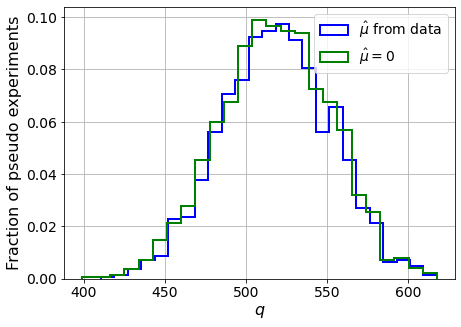

muhat mean:  0.008057115008305875
Z_bins:  22.772291939424935
std Z_bins:  0.7359756172620354
Z_bins mu=0:  22.765696075671478
std Z_bins mu=0:  0.7530829429247656

--------

B_expected:  643
S_expected:  1286

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.288


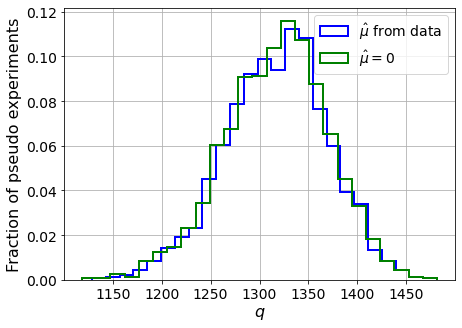

muhat mean:  0.004255002250556305
Z_bins:  36.325043694811754
std Z_bins:  0.7162520584514992
Z_bins mu=0:  36.32463437355627
std Z_bins mu=0:  0.7277732248248553

--------

B_expected:  643
S_expected:  2484

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3055


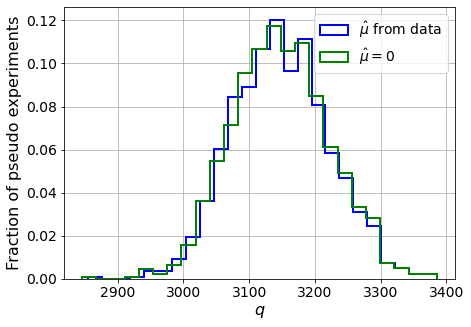

muhat mean:  0.0022310857080911736
Z_bins:  56.091260122065336
std Z_bins:  0.6502654092338807
Z_bins mu=0:  56.086761376648646
std Z_bins mu=0:  0.6569222749566785

--------

B_expected:  643
S_expected:  4795

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3015


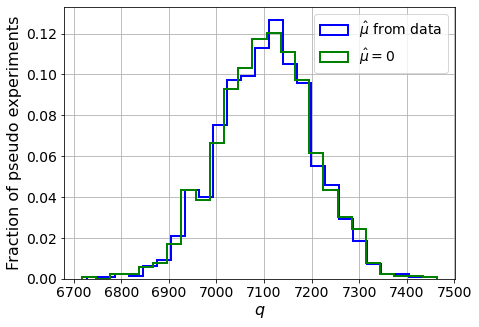

muhat mean:  0.0012589646800135852
Z_bins:  84.30316809532162
std Z_bins:  0.5884605724472983
Z_bins mu=0:  84.30277449787262
std Z_bins mu=0:  0.5930362925633798

--------

B_expected:  643
S_expected:  9258

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2845


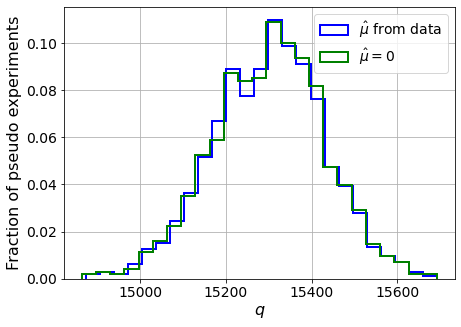

muhat mean:  0.0006008590716365138
Z_bins:  123.71834102120407
std Z_bins:  0.523255740326836
Z_bins mu=0:  123.71763715560118
std Z_bins mu=0:  0.5261637944729021

--------

B_expected:  643
S_expected:  17875

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2925


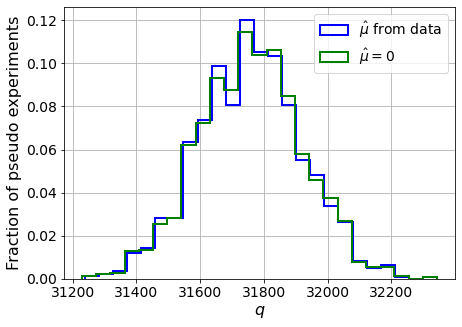

muhat mean:  0.0002962497258509561
Z_bins:  178.21253272345115
std Z_bins:  0.4565465139886299
Z_bins mu=0:  178.21157551474823
std Z_bins mu=0:  0.45842024360800904

--------


 FINAL RESULT:

[[0.0, inf, 2.809522452863948, 0.25077480934810603, 0.44179882421308475], [0.0, inf, 1.7599862524683638, 0.27295194865072286, 0.6186622588230823], [0.11195780866319349, 1.7483577641962365, 0.8208273841431624, 0.3366683794900203, 1.1387716835582262], [0.5570067104346094, 0.7394571091153622, 0.39695433332630214, 0.4838500572766926, 1.415147313089006], [1.275001152573175, 0.708381272099616, 0.19922698030408978, 1.2391344263182236, 1.014154751148626], [2.501895862328793, 0.7346781137322527, 0.11468312021828289, 2.4903715815824268, 0.9068372746468987], [4.618987967900772, 0.7547402776092875, 0.05984511189799984, 4.598240469643112, 0.850639513125948], [8.153373809726016, 0.7624549016432103, 0.03325130326664265, 8.144332558268815, 0.8183110287832494], [13.826730474130537, 0.7629468443651598, 0.01689799

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 285.65760023 245.67748199 203.6773517  173.93723811
 149.69974464 113.68144457  67.43999963   1.34854048 -86.3012458 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
    

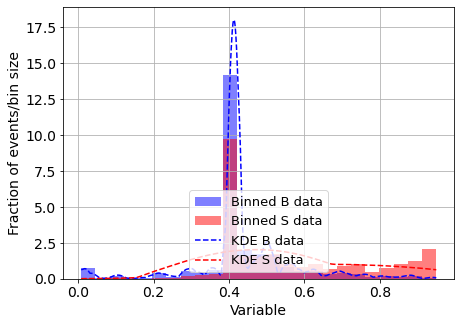

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.257351270001691
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



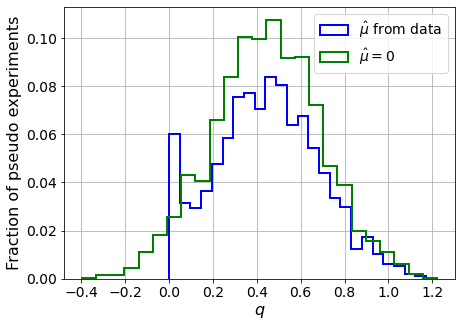

muhat mean:  -11.478259346799362
Z_bins:  0.669161547953081
std Z_bins:  0.17896876642825715
Z_bins mu=0:  0.669161547953081
std Z_bins mu=0:  0.18488040892079516

--------

B_expected:  643
S_expected:  3



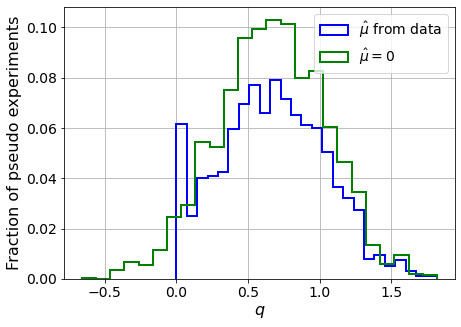

muhat mean:  -7.520189838632167
Z_bins:  0.8178454216288019
std Z_bins:  0.22341509964826328
Z_bins mu=0:  0.8178454216288019
std Z_bins mu=0:  0.23245685082023942

--------

B_expected:  643
S_expected:  7



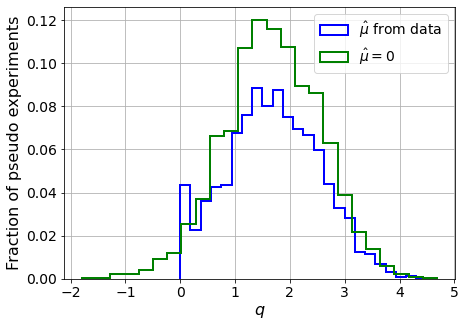

muhat mean:  -3.281056128496703
Z_bins:  1.2986671606609208
std Z_bins:  0.32581990375505904
Z_bins mu=0:  1.2986671606609208
std Z_bins mu=0:  0.33719193152034815

--------

B_expected:  643
S_expected:  13



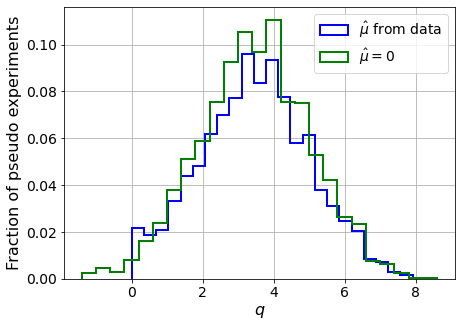

muhat mean:  -1.7983745709187415
Z_bins:  1.8649807687929894
std Z_bins:  0.4102349006890616
Z_bins mu=0:  1.8649807687929894
std Z_bins mu=0:  0.4167786276088424

--------

B_expected:  643
S_expected:  25



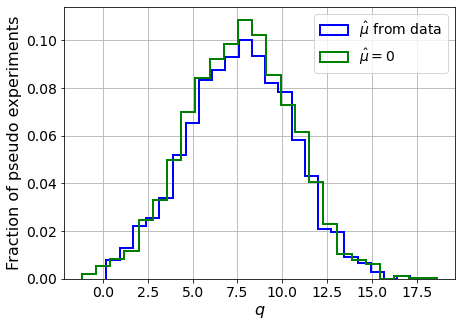

muhat mean:  -0.9272842439724477
Z_bins:  2.774764718368573
std Z_bins:  0.5241733723178115
Z_bins mu=0:  2.774764718368573
std Z_bins mu=0:  0.5287971293710672

--------

B_expected:  643
S_expected:  48



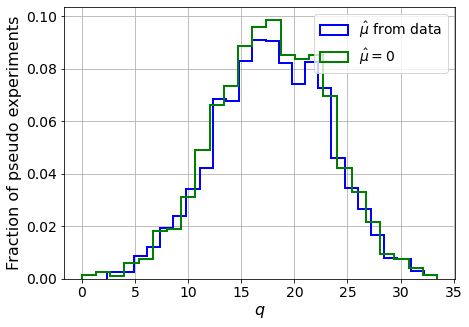

muhat mean:  -0.47817889419996523
Z_bins:  4.220727348959997
std Z_bins:  0.6269552939916073
Z_bins mu=0:  4.220727348959997
std Z_bins mu=0:  0.6310327229399902

--------

B_expected:  643
S_expected:  93



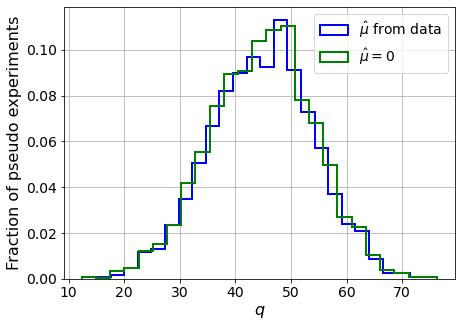

muhat mean:  -0.24404855053146662
Z_bins:  6.711152229856594
std Z_bins:  0.6919013434342662
Z_bins mu=0:  6.711152229856594
std Z_bins mu=0:  0.6946081996314004

--------

B_expected:  643
S_expected:  179



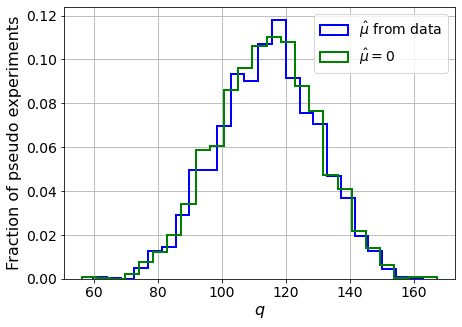

muhat mean:  -0.12525518930503893
Z_bins:  10.714133655791354
std Z_bins:  0.7348838166262495
Z_bins mu=0:  10.714133655791354
std Z_bins mu=0:  0.7368261982007699

--------

B_expected:  643
S_expected:  345



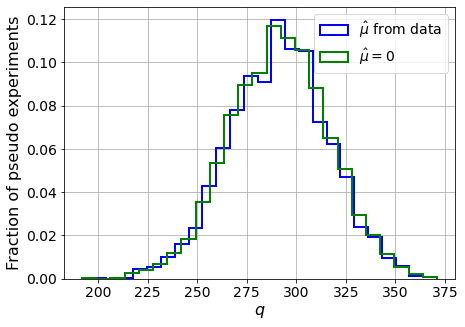

muhat mean:  -0.06699671036034911
Z_bins:  17.07852162588448
std Z_bins:  0.7334141816903726
Z_bins mu=0:  17.07852162588448
std Z_bins mu=0:  0.734752250548821

--------

B_expected:  643
S_expected:  666



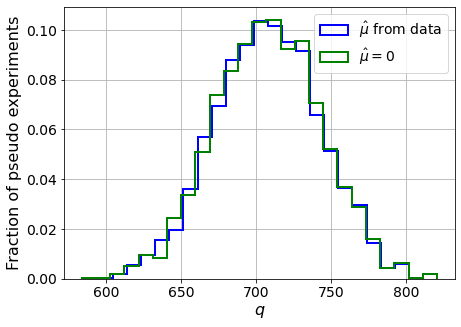

muhat mean:  -0.03402898786767811
Z_bins:  26.60513161500168
std Z_bins:  0.6612316853623618
Z_bins mu=0:  26.60513161500168
std Z_bins mu=0:  0.6616547301009528

--------

B_expected:  643
S_expected:  1286



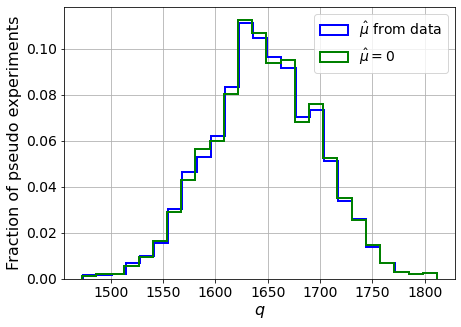

muhat mean:  -0.01775736815878671
Z_bins:  40.5649782782003
std Z_bins:  0.6426434762656777
Z_bins mu=0:  40.5649782782003
std Z_bins mu=0:  0.6431308575168152

--------

B_expected:  643
S_expected:  2484



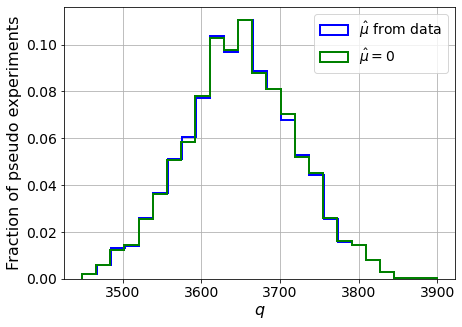

muhat mean:  -0.008958513920575712
Z_bins:  60.413816056978405
std Z_bins:  0.5852672719909334
Z_bins mu=0:  60.413816056978405
std Z_bins mu=0:  0.5855206421702961

--------

B_expected:  643
S_expected:  4795



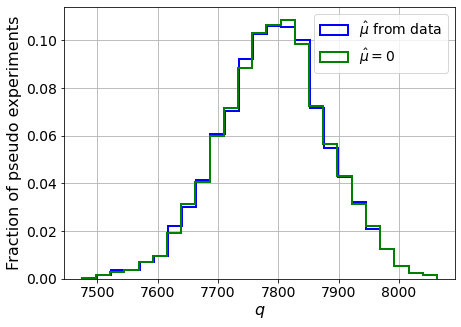

muhat mean:  -0.004963169299693471
Z_bins:  88.28335692612562
std Z_bins:  0.5032146993358424
Z_bins mu=0:  88.28335692612562
std Z_bins mu=0:  0.5033711667689861

--------

B_expected:  643
S_expected:  9258



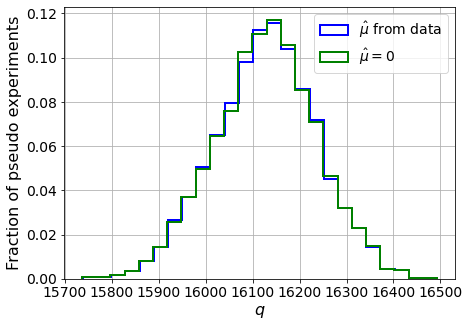

muhat mean:  -0.0024634488207146265
Z_bins:  127.00793778909143
std Z_bins:  0.4300153241039502
Z_bins mu=0:  127.00793778909143
std Z_bins mu=0:  0.43013684572087457

--------

B_expected:  643
S_expected:  17875



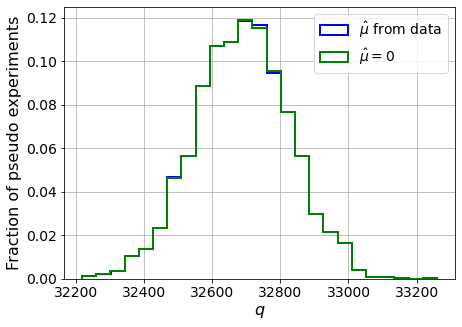

muhat mean:  -0.0012563994956685386
Z_bins:  180.80918072292263
std Z_bins:  0.38387590923860204
Z_bins mu=0:  180.80918072292263
std Z_bins mu=0:  0.3839774210179997

--------


 FINAL RESULT:

[[0.669161547953081, 0.17896876642825715, -11.478259346799362, 0.669161547953081, 0.18488040892079516], [0.8178454216288019, 0.22341509964826328, -7.520189838632167, 0.8178454216288019, 0.23245685082023942], [1.2986671606609208, 0.32581990375505904, -3.281056128496703, 1.2986671606609208, 0.33719193152034815], [1.8649807687929894, 0.4102349006890616, -1.7983745709187415, 1.8649807687929894, 0.4167786276088424], [2.774764718368573, 0.5241733723178115, -0.9272842439724477, 2.774764718368573, 0.5287971293710672], [4.220727348959997, 0.6269552939916073, -0.47817889419996523, 4.220727348959997, 0.6310327229399902], [6.711152229856594, 0.6919013434342662, -0.24404855053146662, 6.711152229856594, 0.6946081996314004], [10.714133655791354, 0.7348838166262495, -0.12525518930503893, 10.714133655791354, 0.

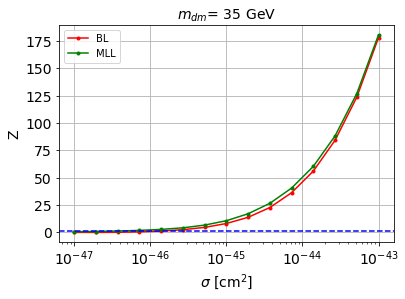


cross_BL_164:  1.6898828580564214e-46
cross_BL_164_up:  1.0000736308473748e-46
cross_BL_164_down:  2.5020533867438486e-46

cross_MLL_164:  5.541616348572741e-47
cross_MLL_164_up:  3.7865161133537417e-47
cross_MLL_164_down:  8.387845668187646e-47

#########################


#########################

mDM =  50 GeV


S_cs1.shape:  (35287,)
S_cs2.shape:  (35287,)
 NUM_DAT:  34105 

NUM_DAT_ER:  33671
NUM_DAT_AC:  119
NUM_DAT_CNNS:  1
NUM_DAT_RN:  31
NUM_DAT_WALL:  283

B_cs1cs2.shape:  (34105, 2)

S_cs1cs2.shape:  (34105, 2)


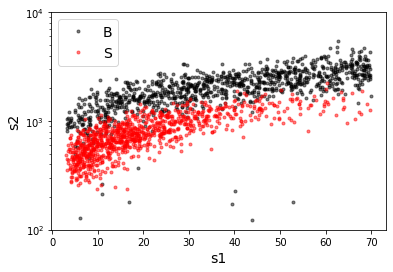

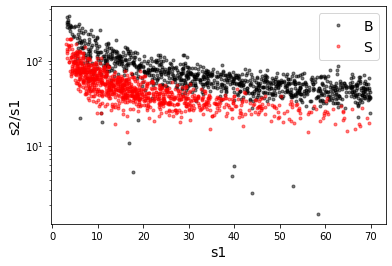

X_mon_B.shape:  (34105, 1)
X_mon_S.shape:  (34105, 1)
X_mon.shape:  (68210, 1)

X_mon_train :  (43483, 1)
y_mon_train :  (43483,)
X_mon_val :  (7674, 1)
y_mon_val :  (7674,)
X_mon_test :  (17053, 1)
y_mon_test :  (17053,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69141	validation_1-logloss:0.69150
[1]	validation_0-logloss:0.68972	validation_1-logloss:0.68988
[2]	validation_0-logloss:0.68806	validation_1-logloss:0.68829
[3]	validation_0-logloss:0.68643	validation_1-logloss:0.68674
[4]	validation_0-logloss:0.68484	validation_1-logloss:0.68522
[5]	validation_0-logloss:0.68326	validation_1-logloss:0.68372
[6]	validation_0-logloss:0.68173	validation_1-logloss:0.68226
[7]	validation_0-logloss:0.68022	validation_1-logloss:0.68082
[8]	validation_0-logloss:0.67874	validation_1-logloss:0.67941
[9]	validation_0-logloss:0.67730	validation_1-logloss:0.67803
[10]	validation_0-logloss:0.67587	validation_1-logloss:0.67667
[11]	validation_0-logloss:0.67447	validation_1-logloss:0.67534
[12]	validation_0-logloss:0.67310	validation_1-logloss:0.67404
[13]	validation_0-logloss:0.67175	validation_1-logloss:0.67276
[14]	validation_0-logloss:0.67044	validation_1-logloss:0.67150
[15]	validation_0-logloss:0.66914	validation_1-logloss:0.67027
[1

[130]	validation_0-logloss:0.60432	validation_1-logloss:0.61020
[131]	validation_0-logloss:0.60413	validation_1-logloss:0.61004
[132]	validation_0-logloss:0.60393	validation_1-logloss:0.60988
[133]	validation_0-logloss:0.60374	validation_1-logloss:0.60972
[134]	validation_0-logloss:0.60355	validation_1-logloss:0.60956
[135]	validation_0-logloss:0.60337	validation_1-logloss:0.60940
[136]	validation_0-logloss:0.60318	validation_1-logloss:0.60925
[137]	validation_0-logloss:0.60300	validation_1-logloss:0.60910
[138]	validation_0-logloss:0.60283	validation_1-logloss:0.60896
[139]	validation_0-logloss:0.60265	validation_1-logloss:0.60881
[140]	validation_0-logloss:0.60248	validation_1-logloss:0.60866
[141]	validation_0-logloss:0.60230	validation_1-logloss:0.60851
[142]	validation_0-logloss:0.60214	validation_1-logloss:0.60837
[143]	validation_0-logloss:0.60197	validation_1-logloss:0.60825
[144]	validation_0-logloss:0.60181	validation_1-logloss:0.60811
[145]	validation_0-logloss:0.60165	valid

[259]	validation_0-logloss:0.59254	validation_1-logloss:0.60152
[260]	validation_0-logloss:0.59251	validation_1-logloss:0.60150
[261]	validation_0-logloss:0.59247	validation_1-logloss:0.60149
[262]	validation_0-logloss:0.59244	validation_1-logloss:0.60147
[263]	validation_0-logloss:0.59241	validation_1-logloss:0.60146
[264]	validation_0-logloss:0.59237	validation_1-logloss:0.60144
[265]	validation_0-logloss:0.59234	validation_1-logloss:0.60142
[266]	validation_0-logloss:0.59230	validation_1-logloss:0.60141
[267]	validation_0-logloss:0.59227	validation_1-logloss:0.60140
[268]	validation_0-logloss:0.59224	validation_1-logloss:0.60140
[269]	validation_0-logloss:0.59220	validation_1-logloss:0.60138
[270]	validation_0-logloss:0.59217	validation_1-logloss:0.60137
[271]	validation_0-logloss:0.59214	validation_1-logloss:0.60136
[272]	validation_0-logloss:0.59212	validation_1-logloss:0.60135
[273]	validation_0-logloss:0.59208	validation_1-logloss:0.60134
[274]	validation_0-logloss:0.59206	valid

[388]	validation_0-logloss:0.58984	validation_1-logloss:0.60122
[389]	validation_0-logloss:0.58983	validation_1-logloss:0.60122
[390]	validation_0-logloss:0.58981	validation_1-logloss:0.60122
[391]	validation_0-logloss:0.58980	validation_1-logloss:0.60122
[392]	validation_0-logloss:0.58979	validation_1-logloss:0.60122
[393]	validation_0-logloss:0.58977	validation_1-logloss:0.60123
[394]	validation_0-logloss:0.58976	validation_1-logloss:0.60123
[395]	validation_0-logloss:0.58974	validation_1-logloss:0.60123
[396]	validation_0-logloss:0.58973	validation_1-logloss:0.60122


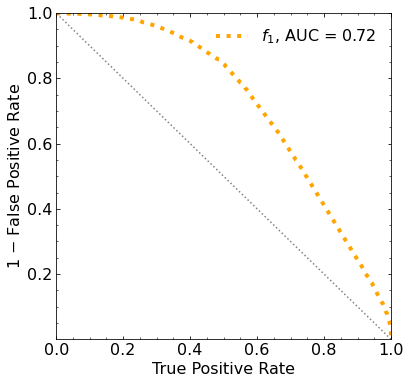

Classification score:


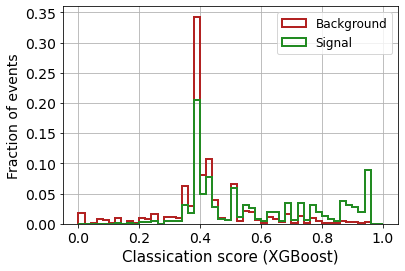


 ROC-AUC =  0.7194872372579939
At least 5 B events per bin, range = [[0, 1]]:
# bins:  9 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  9
range of our data:  [[0, 1]]
number of bins we are going to use:  9
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3105


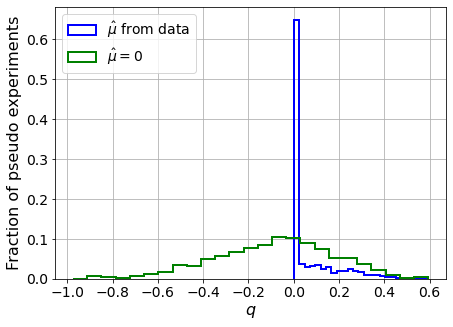

muhat mean:  2.287514371810726
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.25111463003187884
std Z_bins mu=0:  0.5208919144653879

--------

B_expected:  643
S_expected:  4



/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:807: RuntimeWarning: divide by zero encountered in double_scalars
  Z_bins_std = np.std(q_muhat_bins) / (2.*Z_bins)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3


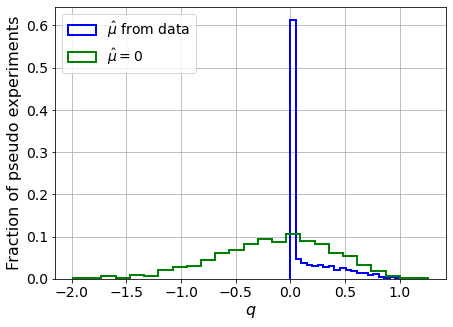

muhat mean:  1.2586014060297075
Z_bins:  0.005551100753704293
std Z_bins:  20.795065512594043
Z_bins mu=0:  0.3197256315022751
std Z_bins mu=0:  0.8232404725183328

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2885


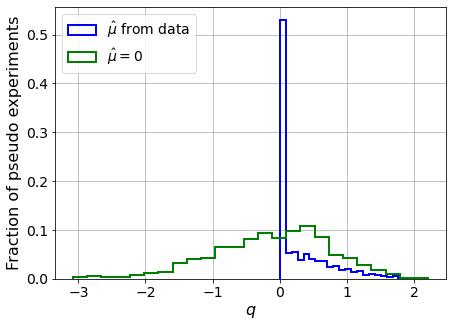

muhat mean:  0.72678821026291
Z_bins:  0.23327758737218576
std Z_bins:  0.888672666348881
Z_bins mu=0:  0.22496610425590718
std Z_bins mu=0:  1.9335368835506344

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2845


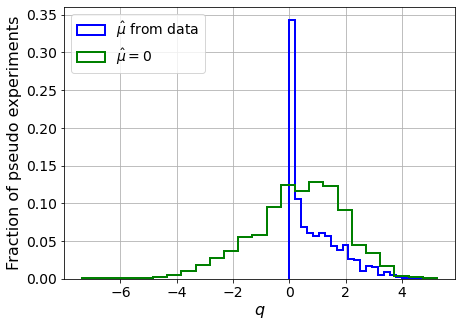

muhat mean:  0.3596201882316533
Z_bins:  0.75076465324686
std Z_bins:  0.6297389441842847
Z_bins mu=0:  0.6853067757033083
std Z_bins mu=0:  1.1963571569684956

--------

B_expected:  643
S_expected:  27

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2875


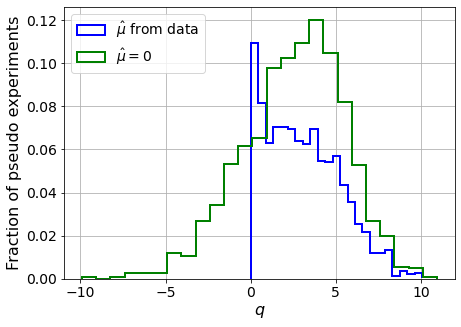

muhat mean:  0.15962665105014778
Z_bins:  1.6926917919594044
std Z_bins:  0.643587894788839
Z_bins mu=0:  1.6716424902925844
std Z_bins mu=0:  0.8902369680706735

--------

B_expected:  643
S_expected:  51

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2915


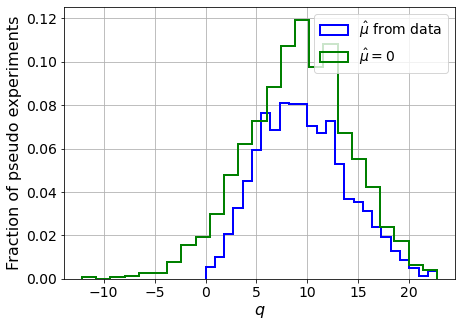

muhat mean:  0.091082487859304
Z_bins:  3.0577043503631343
std Z_bins:  0.699051122979818
Z_bins mu=0:  3.0367827831005556
std Z_bins mu=0:  0.8394986614403491

--------

B_expected:  643
S_expected:  99

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.264


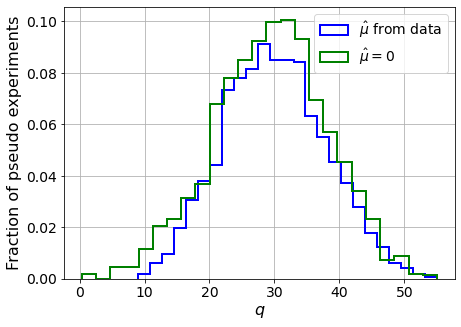

muhat mean:  0.04958042313156651
Z_bins:  5.456843191453067
std Z_bins:  0.7242249622421151
Z_bins mu=0:  5.440312791706634
std Z_bins mu=0:  0.8041099454777508

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2835


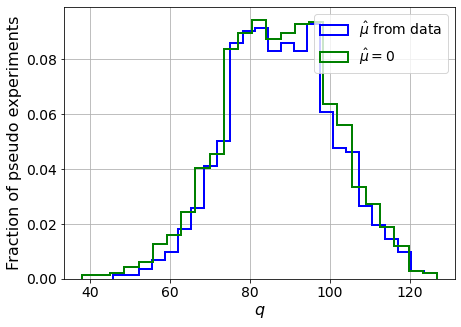

muhat mean:  0.025818268936251405
Z_bins:  9.351021582515862
std Z_bins:  0.7119782750902168
Z_bins mu=0:  9.34424767636733
std Z_bins mu=0:  0.7557195230799738

--------

B_expected:  643
S_expected:  370

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.298


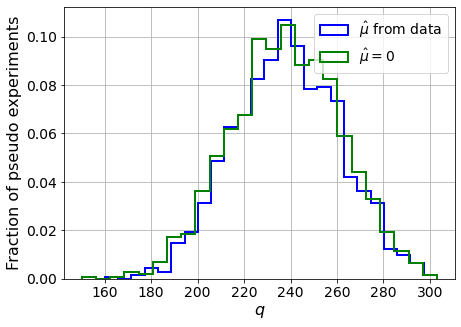

muhat mean:  0.013468291201435006
Z_bins:  15.43641754759202
std Z_bins:  0.7325204552314913
Z_bins mu=0:  15.427100886697179
std Z_bins mu=0:  0.7596212225795527

--------

B_expected:  643
S_expected:  714

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.283


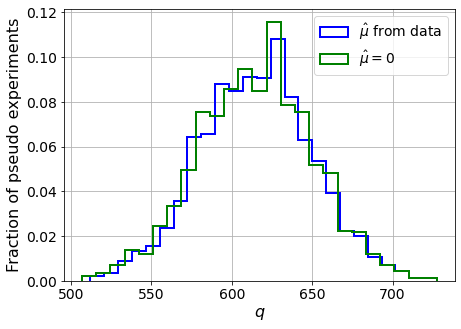

muhat mean:  0.0069423774747032745
Z_bins:  24.816658231238918
std Z_bins:  0.7015652070034966
Z_bins mu=0:  24.813358838381333
std Z_bins mu=0:  0.7164649879645102

--------

B_expected:  643
S_expected:  1378

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2805


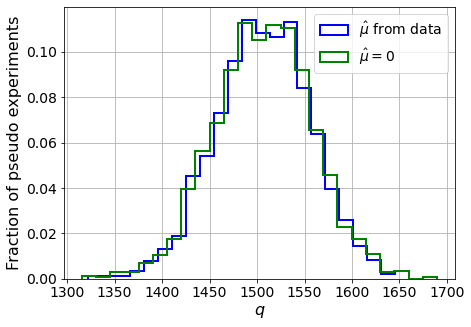

muhat mean:  0.0037535998854720943
Z_bins:  38.832436036014755
std Z_bins:  0.6510234356353186
Z_bins mu=0:  38.829770128494474
std Z_bins mu=0:  0.6607166004985721

--------

B_expected:  643
S_expected:  2661

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2955


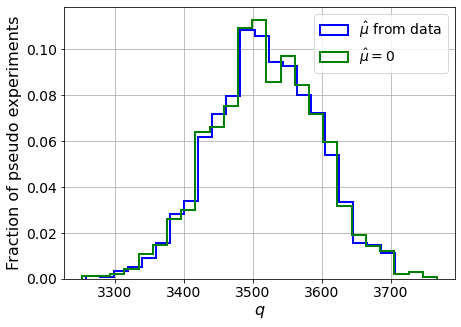

muhat mean:  0.0017999330038715128
Z_bins:  59.30938554370902
std Z_bins:  0.6496769199326744
Z_bins mu=0:  59.30833162317269
std Z_bins mu=0:  0.6558727778601067

--------

B_expected:  643
S_expected:  5138

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.269


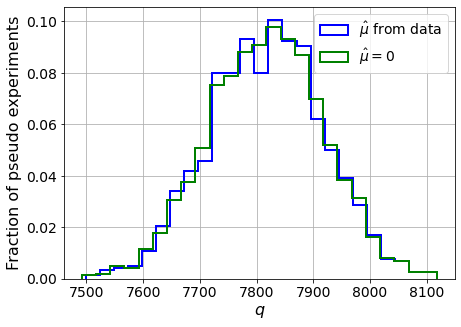

muhat mean:  0.0009205340202235536
Z_bins:  88.43484254461617
std Z_bins:  0.5671817937657245
Z_bins mu=0:  88.4308400558974
std Z_bins mu=0:  0.5706469734628744

--------

B_expected:  643
S_expected:  9921

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.292


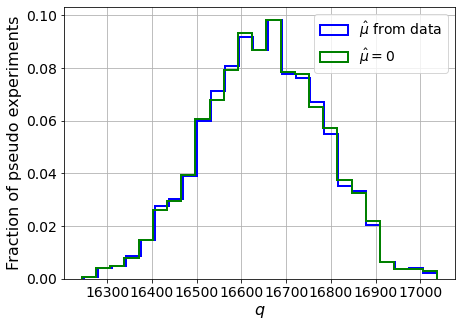

muhat mean:  0.0004944103921058716
Z_bins:  129.03509200935517
std Z_bins:  0.5110845897936399
Z_bins mu=0:  129.03357157430446
std Z_bins mu=0:  0.513376375015596

--------

B_expected:  643
S_expected:  19154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.299


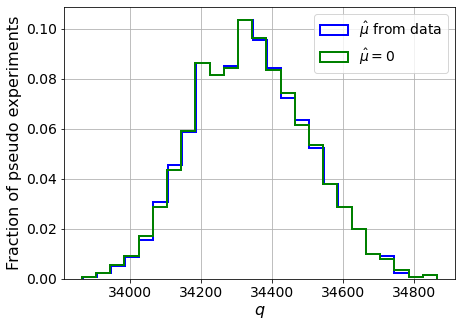

muhat mean:  0.0002600089508284419
Z_bins:  185.30409706437715
std Z_bins:  0.43172271083191577
Z_bins mu=0:  185.30296897525528
std Z_bins mu=0:  0.4332674554751996

--------


 FINAL RESULT:

[[0.0, inf, 2.287514371810726, 0.25111463003187884, 0.5208919144653879], [0.005551100753704293, 20.795065512594043, 1.2586014060297075, 0.3197256315022751, 0.8232404725183328], [0.23327758737218576, 0.888672666348881, 0.72678821026291, 0.22496610425590718, 1.9335368835506344], [0.75076465324686, 0.6297389441842847, 0.3596201882316533, 0.6853067757033083, 1.1963571569684956], [1.6926917919594044, 0.643587894788839, 0.15962665105014778, 1.6716424902925844, 0.8902369680706735], [3.0577043503631343, 0.699051122979818, 0.091082487859304, 3.0367827831005556, 0.8394986614403491], [5.456843191453067, 0.7242249622421151, 0.04958042313156651, 5.440312791706634, 0.8041099454777508], [9.351021582515862, 0.7119782750902168, 0.025818268936251405, 9.34424767636733, 0.7557195230799738], [15.43641754759202, 0.73

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 195.78703049 180.20962453 155.40872527
 130.33393882  97.54575832  59.03546786  -2.36897902 -87.57767682]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 110.5570446   92.21676551
  67

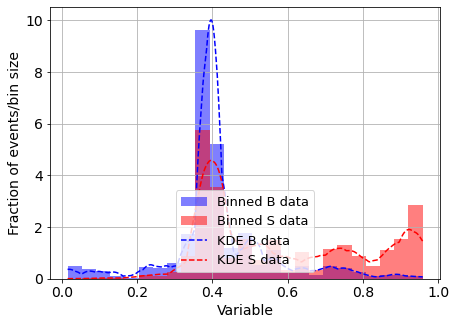

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



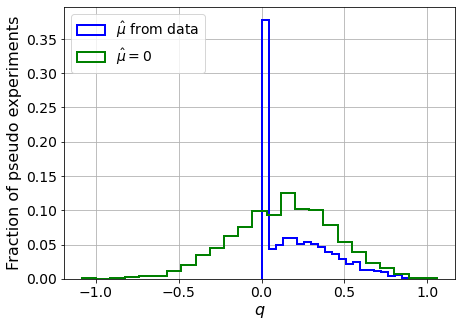

muhat mean:  -2.743099130276661
Z_bins:  0.38664884253294907
std Z_bins:  0.2771682877403097
Z_bins mu=0:  0.38664884253294907
std Z_bins mu=0:  0.39284869135429185

--------

B_expected:  643
S_expected:  4



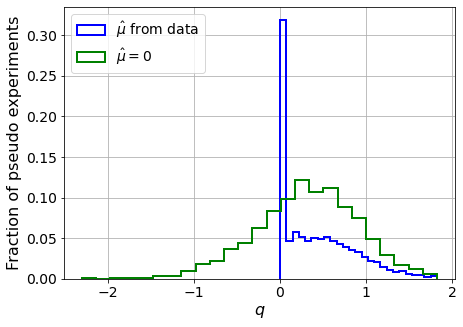

muhat mean:  -1.3300669738216293
Z_bins:  0.5775309828216744
std Z_bins:  0.3668263129368915
Z_bins mu=0:  0.5775309828216744
std Z_bins mu=0:  0.5087544566812308

--------

B_expected:  643
S_expected:  7



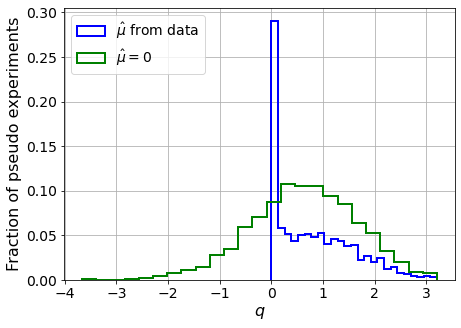

muhat mean:  -0.7613034364824749
Z_bins:  0.8108203732165616
std Z_bins:  0.470040166804067
Z_bins mu=0:  0.8108203732165616
std Z_bins mu=0:  0.6231306147172666

--------

B_expected:  643
S_expected:  14



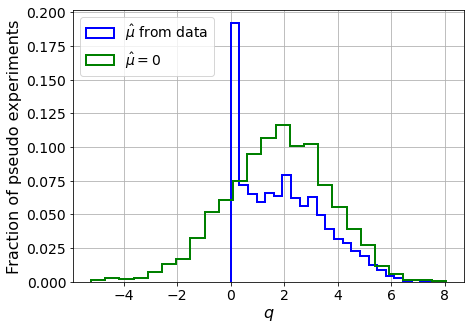

muhat mean:  -0.3761641907455783
Z_bins:  1.3589109396906818
std Z_bins:  0.5710609820409712
Z_bins mu=0:  1.3589109396906818
std Z_bins mu=0:  0.7018899834094849

--------

B_expected:  643
S_expected:  27



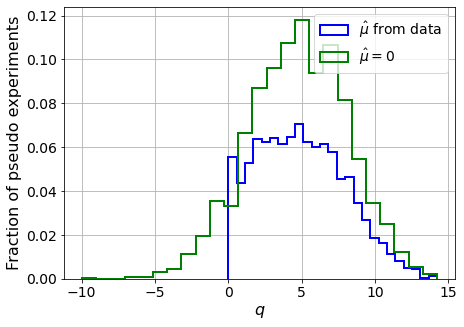

muhat mean:  -0.19808737104880975
Z_bins:  2.188756649632651
std Z_bins:  0.6754399084039677
Z_bins mu=0:  2.188756649632651
std Z_bins mu=0:  0.767749151261208

--------

B_expected:  643
S_expected:  51



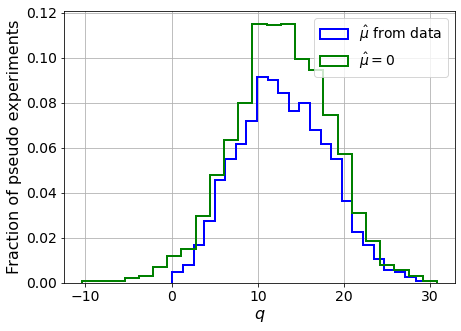

muhat mean:  -0.09807189058934383
Z_bins:  3.5720789814625062
std Z_bins:  0.7315422946406168
Z_bins mu=0:  3.5720789814625062
std Z_bins mu=0:  0.7966921955647198

--------

B_expected:  643
S_expected:  99



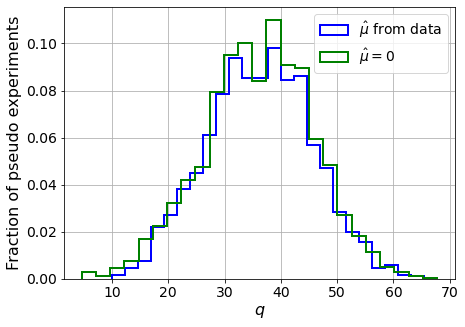

muhat mean:  -0.05742988024372478
Z_bins:  6.03265275767045
std Z_bins:  0.7692065049406842
Z_bins mu=0:  6.031517137436341
std Z_bins mu=0:  0.8059259107984107

--------

B_expected:  643
S_expected:  192



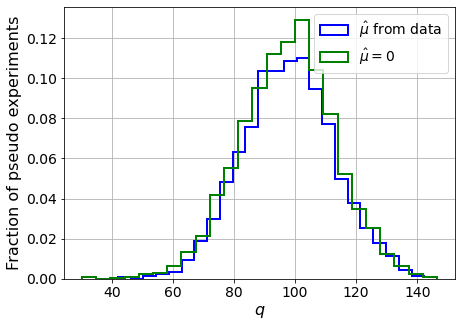

muhat mean:  -0.027639704309928667
Z_bins:  9.906264886989879
std Z_bins:  0.7592514444732292
Z_bins mu=0:  9.906264886989879
std Z_bins mu=0:  0.7831764264891131

--------

B_expected:  643
S_expected:  370



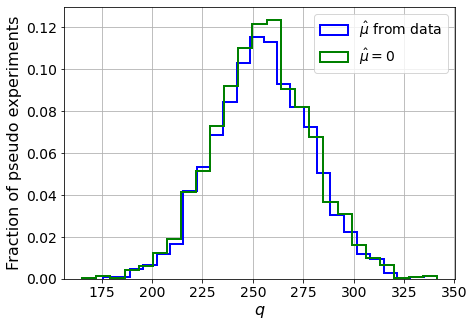

muhat mean:  -0.0146419807688674
Z_bins:  15.956987228570208
std Z_bins:  0.7493822803942729
Z_bins mu=0:  15.956758797487977
std Z_bins mu=0:  0.7615857815708962

--------

B_expected:  643
S_expected:  714



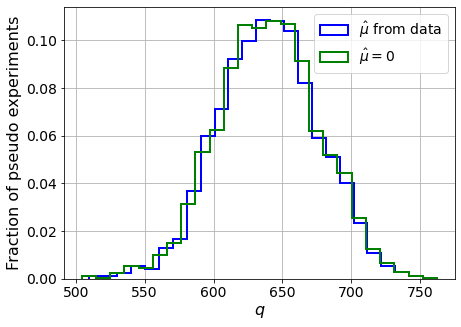

muhat mean:  -0.0072474405005013755
Z_bins:  25.29537073490393
std Z_bins:  0.7184532432564069
Z_bins mu=0:  25.29519312336555
std Z_bins mu=0:  0.7263689691460168

--------

B_expected:  643
S_expected:  1378



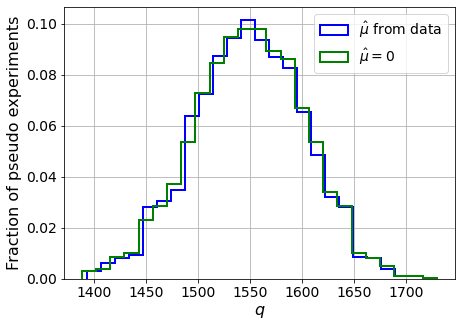

muhat mean:  -0.004196854528630101
Z_bins:  39.36022607962503
std Z_bins:  0.6757797090735257
Z_bins mu=0:  39.3592869242672
std Z_bins mu=0:  0.6799409391673392

--------

B_expected:  643
S_expected:  2661



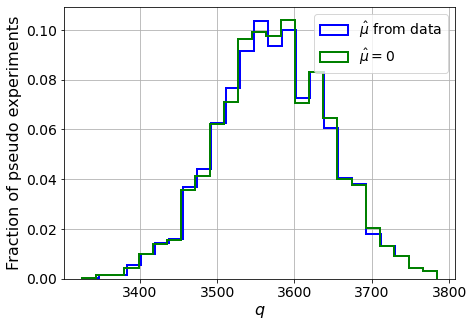

muhat mean:  -0.002227899904596347
Z_bins:  59.76511365857288
std Z_bins:  0.6076083183908076
Z_bins mu=0:  59.76396706100729
std Z_bins mu=0:  0.6101517062744429

--------

B_expected:  643
S_expected:  5138



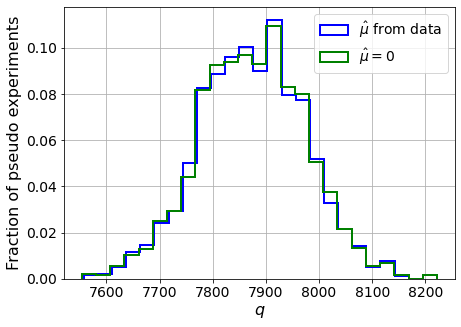

muhat mean:  -0.0009247311417080236
Z_bins:  88.74502449387421
std Z_bins:  0.5607747225137264
Z_bins mu=0:  88.74374272395657
std Z_bins mu=0:  0.5625552561756985

--------

B_expected:  643
S_expected:  9921



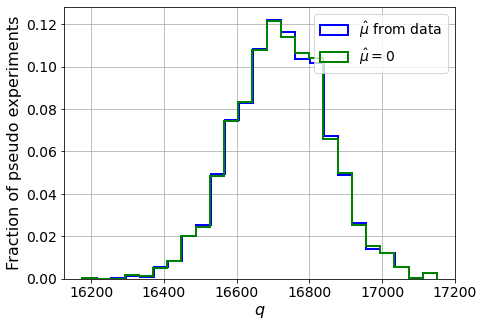

muhat mean:  -0.0004994484735481941
Z_bins:  129.31565546050874
std Z_bins:  0.4996678890225064
Z_bins mu=0:  129.31565546050874
std Z_bins mu=0:  0.5009509904482232

--------

B_expected:  643
S_expected:  19154



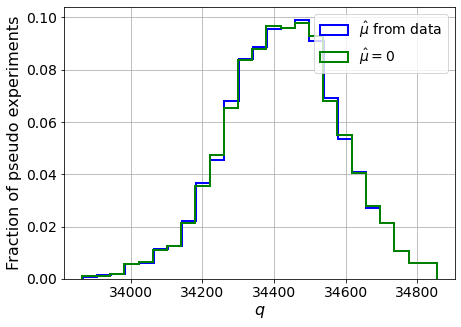

muhat mean:  -0.0002992496321573305
Z_bins:  185.5541919489891
std Z_bins:  0.4260063993336657
Z_bins mu=0:  185.5541919489891
std Z_bins mu=0:  0.4268221150641134

--------


 FINAL RESULT:

[[0.38664884253294907, 0.2771682877403097, -2.743099130276661, 0.38664884253294907, 0.39284869135429185], [0.5775309828216744, 0.3668263129368915, -1.3300669738216293, 0.5775309828216744, 0.5087544566812308], [0.8108203732165616, 0.470040166804067, -0.7613034364824749, 0.8108203732165616, 0.6231306147172666], [1.3589109396906818, 0.5710609820409712, -0.3761641907455783, 1.3589109396906818, 0.7018899834094849], [2.188756649632651, 0.6754399084039677, -0.19808737104880975, 2.188756649632651, 0.767749151261208], [3.5720789814625062, 0.7315422946406168, -0.09807189058934383, 3.5720789814625062, 0.7966921955647198], [6.03265275767045, 0.7692065049406842, -0.05742988024372478, 6.031517137436341, 0.8059259107984107], [9.906264886989879, 0.7592514444732292, -0.027639704309928667, 9.906264886989879, 0.7831

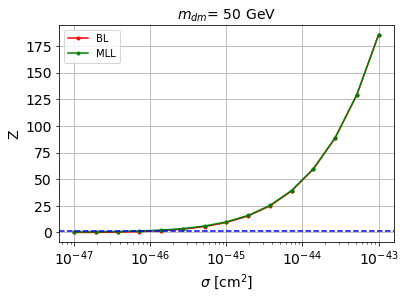


cross_BL_164:  1.3392885874573154e-46
cross_BL_164_up:  8.604293984840837e-47
cross_BL_164_down:  1.869723628614771e-46

cross_MLL_164:  8.993345564833821e-47
cross_MLL_164_up:  5.364239771375913e-47
cross_MLL_164_down:  1.4795464223947756e-46

#########################


#########################

mDM =  100 GeV


S_cs1.shape:  (37757,)
S_cs2.shape:  (37757,)
 NUM_DAT:  35163 

NUM_DAT_ER:  34715
NUM_DAT_AC:  123
NUM_DAT_CNNS:  1
NUM_DAT_RN:  32
NUM_DAT_WALL:  292

B_cs1cs2.shape:  (35163, 2)

S_cs1cs2.shape:  (35163, 2)


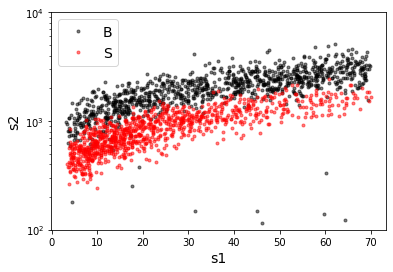

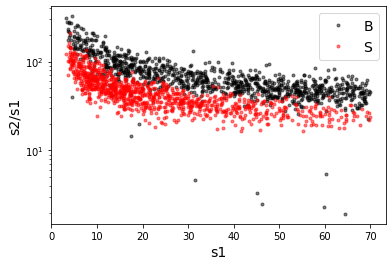

X_mon_B.shape:  (35163, 1)
X_mon_S.shape:  (35163, 1)
X_mon.shape:  (70326, 1)

X_mon_train :  (44832, 1)
y_mon_train :  (44832,)
X_mon_val :  (7912, 1)
y_mon_val :  (7912,)
X_mon_test :  (17582, 1)
y_mon_test :  (17582,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69095	validation_1-logloss:0.69093
[1]	validation_0-logloss:0.68881	validation_1-logloss:0.68874
[2]	validation_0-logloss:0.68671	validation_1-logloss:0.68661
[3]	validation_0-logloss:0.68465	validation_1-logloss:0.68451
[4]	validation_0-logloss:0.68263	validation_1-logloss:0.68245
[5]	validation_0-logloss:0.68063	validation_1-logloss:0.68044
[6]	validation_0-logloss:0.67870	validation_1-logloss:0.67846
[7]	validation_0-logloss:0.67679	validation_1-logloss:0.67652
[8]	validation_0-logloss:0.67491	validation_1-logloss:0.67462
[9]	validation_0-logloss:0.67308	validation_1-logloss:0.67276
[10]	validation_0-logloss:0.67127	validation_1-logloss:0.67092
[11]	validation_0-logloss:0.66951	validation_1-logloss:0.66913
[12]	validation_0-logloss:0.66777	validation_1-logloss:0.66736
[13]	validation_0-logloss:0.66608	validation_1-logloss:0.66563
[14]	validation_0-logloss:0.66440	validation_1-logloss:0.66392
[15]	validation_0-logloss:0.66276	validation_1-logloss:0.66225
[1

[130]	validation_0-logloss:0.58081	validation_1-logloss:0.57898
[131]	validation_0-logloss:0.58057	validation_1-logloss:0.57873
[132]	validation_0-logloss:0.58032	validation_1-logloss:0.57849
[133]	validation_0-logloss:0.58008	validation_1-logloss:0.57824
[134]	validation_0-logloss:0.57984	validation_1-logloss:0.57800
[135]	validation_0-logloss:0.57960	validation_1-logloss:0.57776
[136]	validation_0-logloss:0.57937	validation_1-logloss:0.57753
[137]	validation_0-logloss:0.57915	validation_1-logloss:0.57730
[138]	validation_0-logloss:0.57892	validation_1-logloss:0.57707
[139]	validation_0-logloss:0.57870	validation_1-logloss:0.57685
[140]	validation_0-logloss:0.57848	validation_1-logloss:0.57663
[141]	validation_0-logloss:0.57827	validation_1-logloss:0.57641
[142]	validation_0-logloss:0.57805	validation_1-logloss:0.57619
[143]	validation_0-logloss:0.57785	validation_1-logloss:0.57599
[144]	validation_0-logloss:0.57764	validation_1-logloss:0.57578
[145]	validation_0-logloss:0.57743	valid

[259]	validation_0-logloss:0.56609	validation_1-logloss:0.56471
[260]	validation_0-logloss:0.56605	validation_1-logloss:0.56467
[261]	validation_0-logloss:0.56600	validation_1-logloss:0.56464
[262]	validation_0-logloss:0.56596	validation_1-logloss:0.56460
[263]	validation_0-logloss:0.56592	validation_1-logloss:0.56457
[264]	validation_0-logloss:0.56587	validation_1-logloss:0.56454
[265]	validation_0-logloss:0.56583	validation_1-logloss:0.56451
[266]	validation_0-logloss:0.56580	validation_1-logloss:0.56447
[267]	validation_0-logloss:0.56575	validation_1-logloss:0.56444
[268]	validation_0-logloss:0.56571	validation_1-logloss:0.56441
[269]	validation_0-logloss:0.56567	validation_1-logloss:0.56438
[270]	validation_0-logloss:0.56564	validation_1-logloss:0.56436
[271]	validation_0-logloss:0.56560	validation_1-logloss:0.56433
[272]	validation_0-logloss:0.56556	validation_1-logloss:0.56430
[273]	validation_0-logloss:0.56552	validation_1-logloss:0.56427
[274]	validation_0-logloss:0.56549	valid

[388]	validation_0-logloss:0.56303	validation_1-logloss:0.56296
[389]	validation_0-logloss:0.56301	validation_1-logloss:0.56295
[390]	validation_0-logloss:0.56300	validation_1-logloss:0.56295
[391]	validation_0-logloss:0.56299	validation_1-logloss:0.56295
[392]	validation_0-logloss:0.56297	validation_1-logloss:0.56294
[393]	validation_0-logloss:0.56296	validation_1-logloss:0.56293
[394]	validation_0-logloss:0.56295	validation_1-logloss:0.56294
[395]	validation_0-logloss:0.56294	validation_1-logloss:0.56293
[396]	validation_0-logloss:0.56293	validation_1-logloss:0.56293
[397]	validation_0-logloss:0.56291	validation_1-logloss:0.56292
[398]	validation_0-logloss:0.56290	validation_1-logloss:0.56292
[399]	validation_0-logloss:0.56289	validation_1-logloss:0.56292
[400]	validation_0-logloss:0.56287	validation_1-logloss:0.56291
[401]	validation_0-logloss:0.56286	validation_1-logloss:0.56291
[402]	validation_0-logloss:0.56286	validation_1-logloss:0.56291
[403]	validation_0-logloss:0.56284	valid

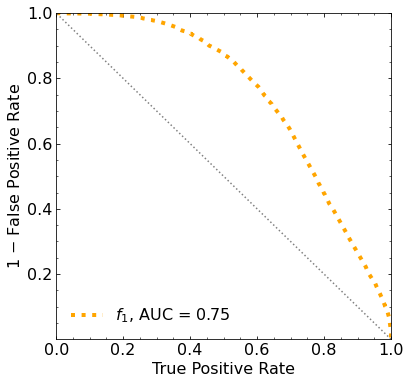

Classification score:


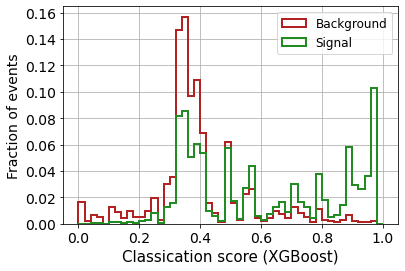


 ROC-AUC =  0.745442769754707
At least 5 B events per bin, range = [[0, 1]]:
# bins:  9 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  9
range of our data:  [[0, 1]]
number of bins we are going to use:  9
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0945


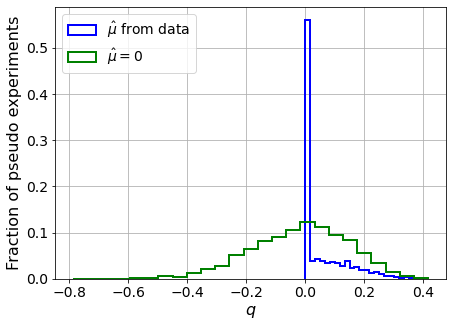

muhat mean:  1.7083907184153773
Z_bins:  0.010396362096148104
std Z_bins:  3.919655654922531
Z_bins mu=0:  0.08417117982843125
std Z_bins mu=0:  0.9802804119982576

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1035


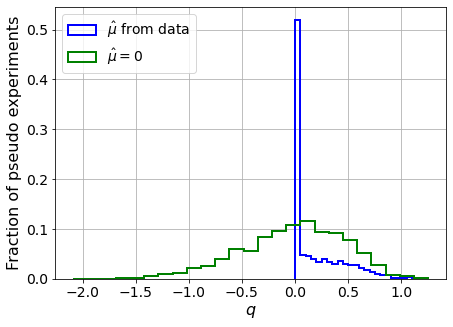

muhat mean:  0.6718310108758808
Z_bins:  0.1726308501415348
std Z_bins:  0.7290304074509586
Z_bins mu=0:  0.13635062358067865
std Z_bins mu=0:  1.8054701972227298

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0935


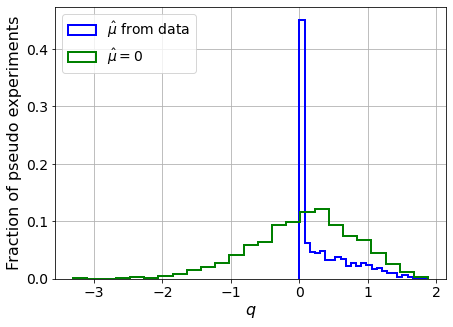

muhat mean:  0.36747727356383864
Z_bins:  0.365243656372852
std Z_bins:  0.575273842488659
Z_bins mu=0:  0.3561780403712613
std Z_bins mu=0:  1.0636147795730722

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1015


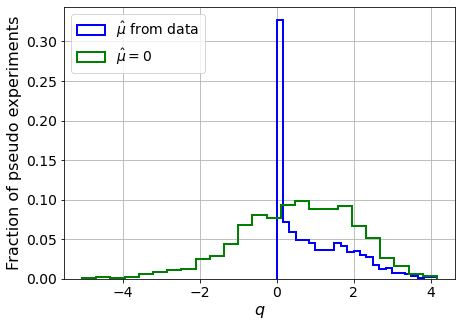

muhat mean:  0.1692877944392405
Z_bins:  0.8025770167403237
std Z_bins:  0.5939493507100749
Z_bins mu=0:  0.7980900851797044
std Z_bins mu=0:  0.9278818682718729

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0965


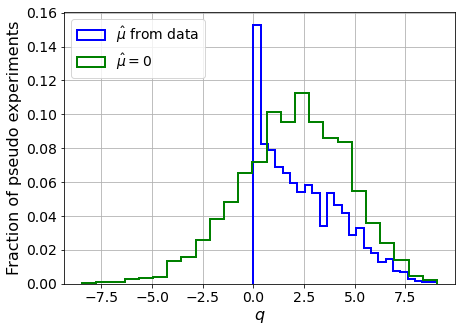

muhat mean:  0.11099361758725701
Z_bins:  1.4614303403805013
std Z_bins:  0.6706049212682649
Z_bins mu=0:  1.456678774605947
std Z_bins mu=0:  0.9127569443554879

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1005


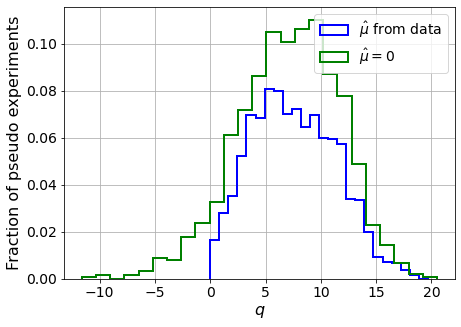

muhat mean:  0.05585470366489187
Z_bins:  2.7159655826984754
std Z_bins:  0.6960900505704087
Z_bins mu=0:  2.7133662796931413
std Z_bins mu=0:  0.8423664241718206

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0955


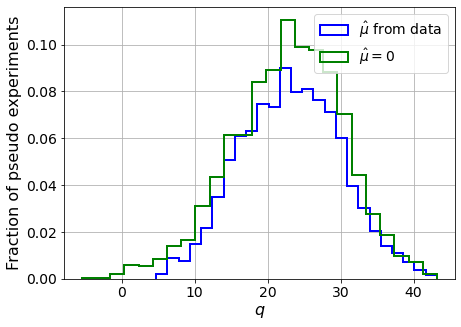

muhat mean:  0.021270753949354414
Z_bins:  4.809757702201317
std Z_bins:  0.7113601661158635
Z_bins mu=0:  4.807103642666596
std Z_bins mu=0:  0.7889742574127134

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0985


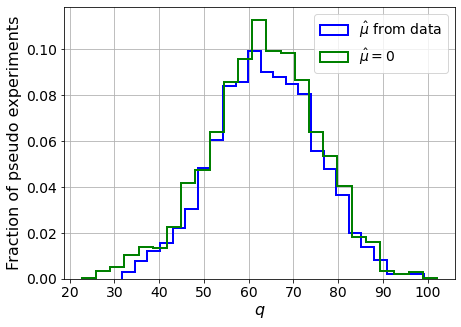

muhat mean:  0.013418411072228109
Z_bins:  7.972506515018632
std Z_bins:  0.7158120308329984
Z_bins mu=0:  7.9715453636253955
std Z_bins mu=0:  0.7623917215007698

--------

B_expected:  643
S_expected:  268

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0875


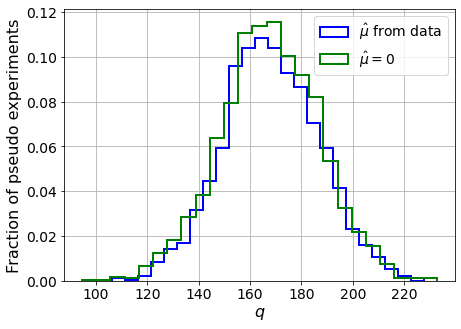

muhat mean:  0.0059548812060309046
Z_bins:  12.959059529992265
std Z_bins:  0.7168227930244616
Z_bins mu=0:  12.955413852861504
std Z_bins mu=0:  0.7424723489934791

--------

B_expected:  643
S_expected:  518

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.096


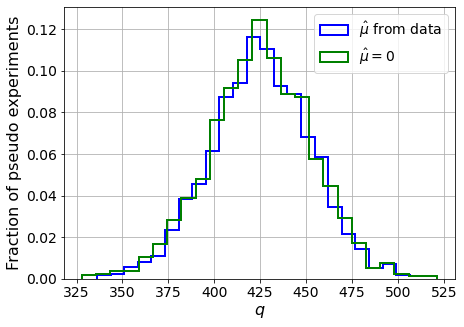

muhat mean:  0.002991246094047914
Z_bins:  20.628496856360414
std Z_bins:  0.6665958673308842
Z_bins mu=0:  20.621127464979743
std Z_bins mu=0:  0.6812136028804767

--------

B_expected:  643
S_expected:  1001

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1035


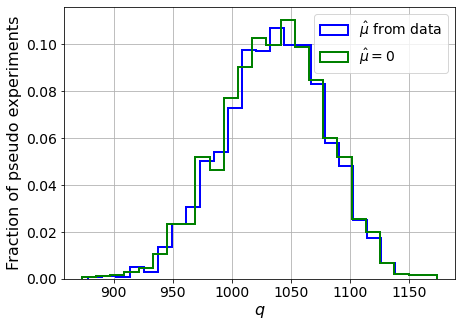

muhat mean:  0.001419246878715155
Z_bins:  32.20622810893883
std Z_bins:  0.6712415394646462
Z_bins mu=0:  32.20499438069629
std Z_bins mu=0:  0.6806569807315034

--------

B_expected:  643
S_expected:  1932

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


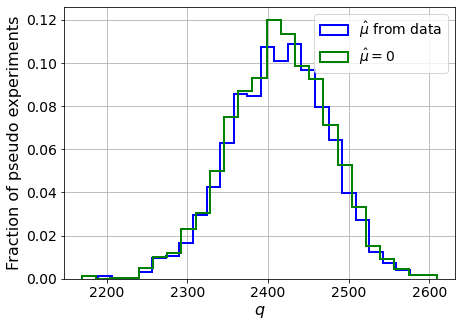

muhat mean:  0.0011750912063362368
Z_bins:  49.13833981537491
std Z_bins:  0.6223781791885764
Z_bins mu=0:  49.13679457400152
std Z_bins mu=0:  0.628442342277047

--------

B_expected:  643
S_expected:  3730

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.09


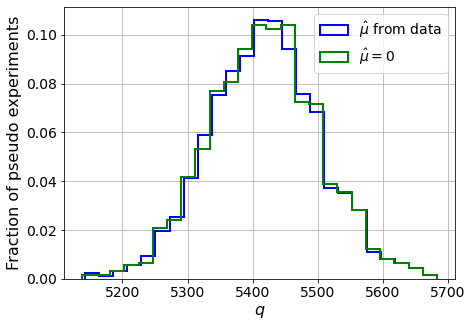

muhat mean:  0.0005499833710106552
Z_bins:  73.61721027530866
std Z_bins:  0.5741629872394006
Z_bins mu=0:  73.61442792785313
std Z_bins mu=0:  0.5776084599054159

--------

B_expected:  643
S_expected:  7201

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.099


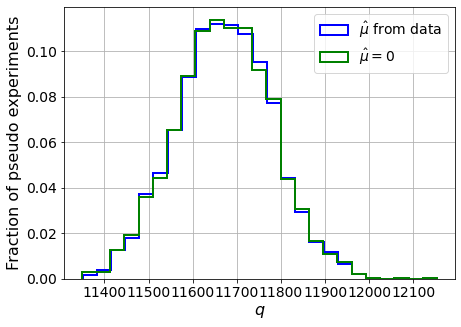

muhat mean:  0.000282615819037805
Z_bins:  108.04105854036612
std Z_bins:  0.5020584668142241
Z_bins mu=0:  108.03874258262303
std Z_bins mu=0:  0.5040835468377458

--------

B_expected:  643
S_expected:  13904

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0965


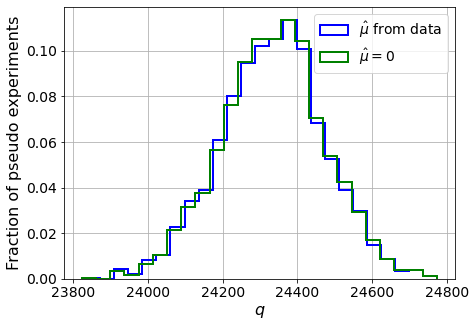

muhat mean:  9.380135675293703e-05
Z_bins:  156.00110066266296
std Z_bins:  0.443699012874002
Z_bins mu=0:  156.00010690080802
std Z_bins mu=0:  0.44513589905578677

--------


 FINAL RESULT:

[[0.010396362096148104, 3.919655654922531, 1.7083907184153773, 0.08417117982843125, 0.9802804119982576], [0.1726308501415348, 0.7290304074509586, 0.6718310108758808, 0.13635062358067865, 1.8054701972227298], [0.365243656372852, 0.575273842488659, 0.36747727356383864, 0.3561780403712613, 1.0636147795730722], [0.8025770167403237, 0.5939493507100749, 0.1692877944392405, 0.7980900851797044, 0.9278818682718729], [1.4614303403805013, 0.6706049212682649, 0.11099361758725701, 1.456678774605947, 0.9127569443554879], [2.7159655826984754, 0.6960900505704087, 0.05585470366489187, 2.7133662796931413, 0.8423664241718206], [4.809757702201317, 0.7113601661158635, 0.021270753949354414, 4.807103642666596, 0.7889742574127134], [7.972506515018632, 0.7158120308329984, 0.013418411072228109, 7.9715453636253955, 0.76239

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 177.17494784 163.76710888 154.51235963 137.61253369
 114.77769609  86.73785036  50.18986203  -6.20957499 -88.86989504]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  121.92073996  109.25097986   93.41061769   7

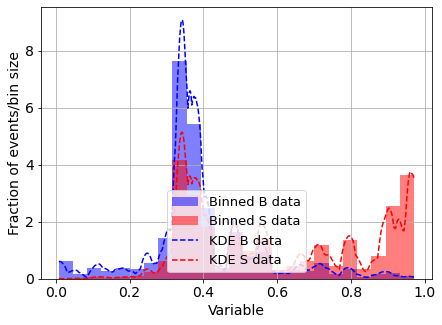

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



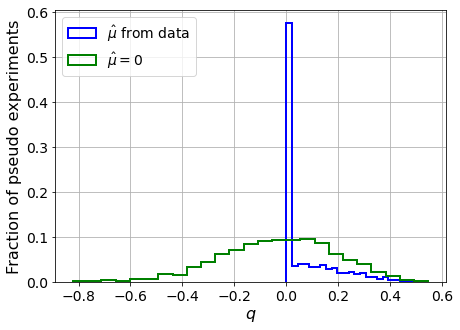

/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:1268: RuntimeWarning: divide by zero encountered in double_scalars
  Z_MLL_std = np.std(q_muhat_MLL) / (2.*Z_MLL)


muhat mean:  -0.8604354433536333
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.14765821490864325
std Z_bins mu=0:  0.7458040180394976

--------

B_expected:  643
S_expected:  3



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


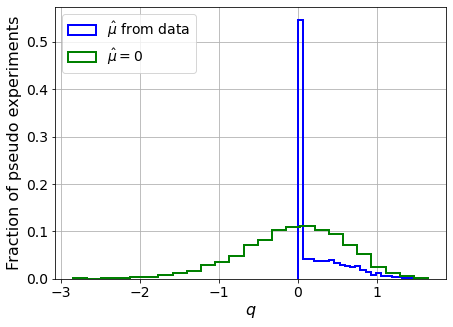

muhat mean:  0.1282918354928368
Z_bins:  0.146596958936209
std Z_bins:  1.0993118084652969
Z_bins mu=0:  0.07774354789227754
std Z_bins mu=0:  4.190537346993145

--------

B_expected:  643
S_expected:  5



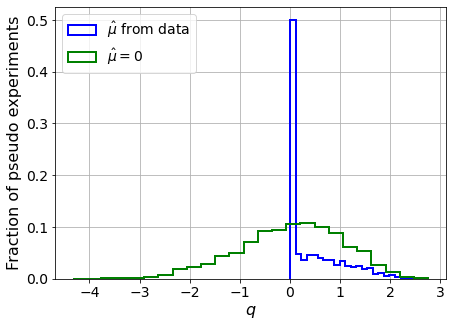

muhat mean:  0.02122230627512043
Z_bins:  0.3324419992312547
std Z_bins:  0.84385764137148
Z_bins mu=0:  0.28181076678221917
std Z_bins mu=0:  1.873044105726797

--------

B_expected:  643
S_expected:  10



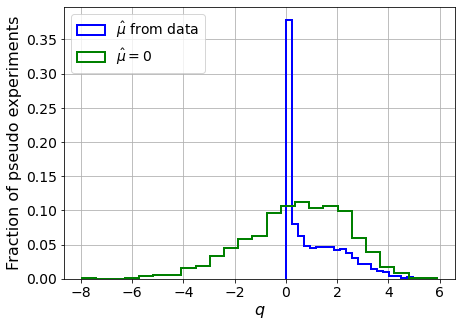

muhat mean:  0.0038216042508790763
Z_bins:  0.779003891772986
std Z_bins:  0.7394949201203604
Z_bins mu=0:  0.7578772682253304
std Z_bins mu=0:  1.2723702061221773

--------

B_expected:  643
S_expected:  19



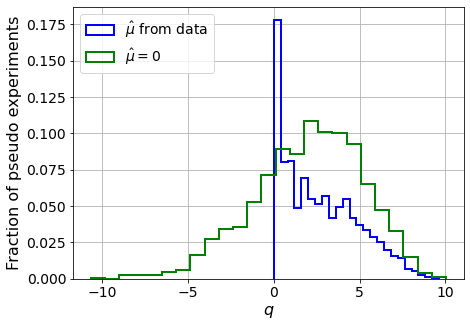

muhat mean:  0.01480683926065119
Z_bins:  1.5346253968907517
std Z_bins:  0.7160859105889474
Z_bins mu=0:  1.519416544311183
std Z_bins mu=0:  1.0352125770604683

--------

B_expected:  643
S_expected:  37



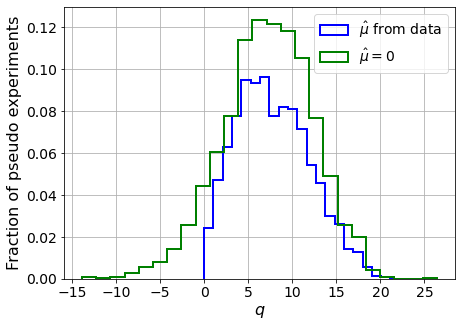

muhat mean:  0.0037174912378202763
Z_bins:  2.72928722316572
std Z_bins:  0.7600731801648315
Z_bins mu=0:  2.711857855536593
std Z_bins mu=0:  0.940473945845592

--------

B_expected:  643
S_expected:  72



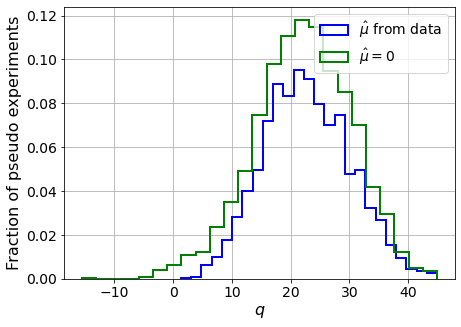

muhat mean:  0.0011288161808679798
Z_bins:  4.73602565032247
std Z_bins:  0.7736857790271969
Z_bins mu=0:  4.72592333442603
std Z_bins mu=0:  0.8777123501583503

--------

B_expected:  643
S_expected:  139



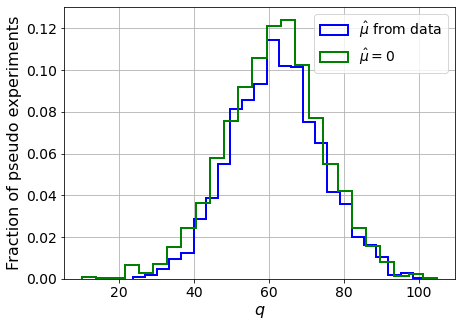

muhat mean:  0.003606211314273749
Z_bins:  7.869248522491431
std Z_bins:  0.7696316533730977
Z_bins mu=0:  7.859426328115526
std Z_bins mu=0:  0.8333849866724587

--------

B_expected:  643
S_expected:  268



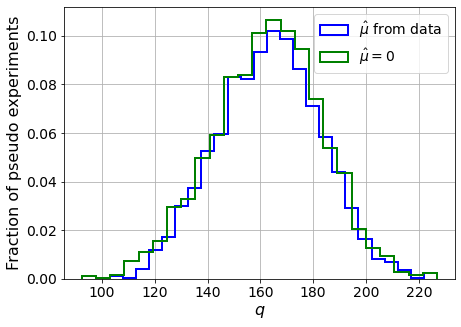

muhat mean:  -0.0004418452127070465
Z_bins:  12.798380386709802
std Z_bins:  0.7633170795483912
Z_bins mu=0:  12.789794462492436
std Z_bins mu=0:  0.8000363045500274

--------

B_expected:  643
S_expected:  518



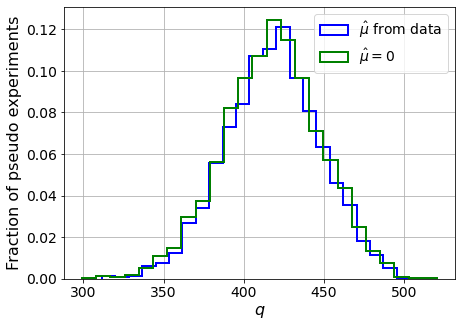

muhat mean:  -0.00037883240505213583
Z_bins:  20.454108780875337
std Z_bins:  0.7249331037518453
Z_bins mu=0:  20.44380739317556
std Z_bins mu=0:  0.7440587894852195

--------

B_expected:  643
S_expected:  1001



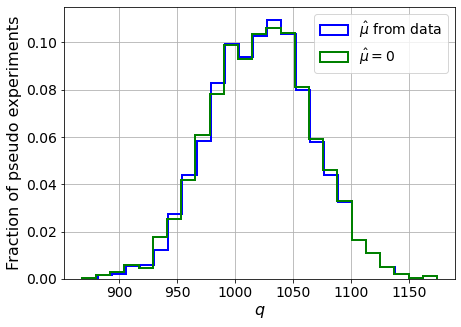

muhat mean:  0.00020986926412509742
Z_bins:  31.99632922099353
std Z_bins:  0.682190557918838
Z_bins mu=0:  31.983332481880932
std Z_bins mu=0:  0.6933984209387113

--------

B_expected:  643
S_expected:  1932



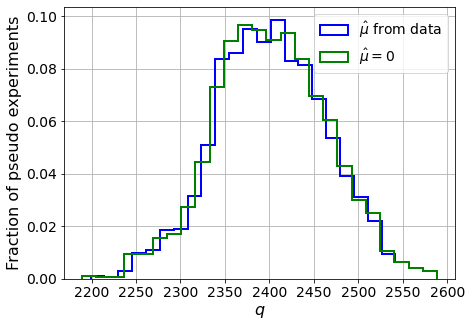

muhat mean:  -0.00019056646368663144
Z_bins:  49.00486742957538
std Z_bins:  0.6400481864766366
Z_bins mu=0:  49.00166561275937
std Z_bins mu=0:  0.6464197071195065

--------

B_expected:  643
S_expected:  3730



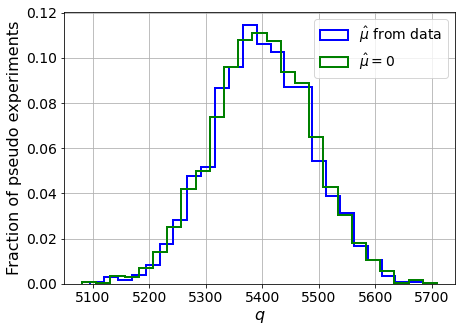

muhat mean:  -5.434291169416918e-05
Z_bins:  73.47905010679087
std Z_bins:  0.59970051350855
Z_bins mu=0:  73.47681480162736
std Z_bins mu=0:  0.6043946796071847

--------

B_expected:  643
S_expected:  7201



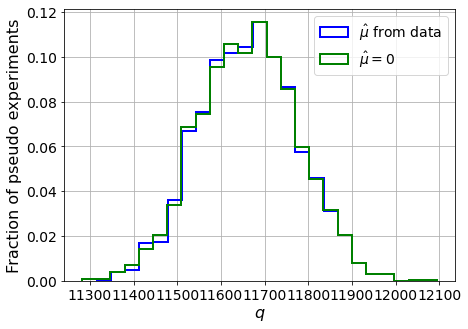

muhat mean:  -4.9239070677795194e-05
Z_bins:  107.9996298286344
std Z_bins:  0.5235630800256446
Z_bins mu=0:  107.99749329511644
std Z_bins mu=0:  0.5260053120578435

--------

B_expected:  643
S_expected:  13904



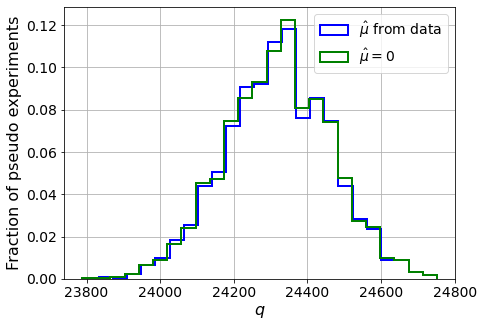

muhat mean:  -1.0700271348043696e-05
Z_bins:  155.9569889076373
std Z_bins:  0.4578999683595534
Z_bins mu=0:  155.95464794966026
std Z_bins mu=0:  0.45954658552843025

--------


 FINAL RESULT:

[[0.0, inf, -0.8604354433536333, 0.14765821490864325, 0.7458040180394976], [0.146596958936209, 1.0993118084652969, 0.1282918354928368, 0.07774354789227754, 4.190537346993145], [0.3324419992312547, 0.84385764137148, 0.02122230627512043, 0.28181076678221917, 1.873044105726797], [0.779003891772986, 0.7394949201203604, 0.0038216042508790763, 0.7578772682253304, 1.2723702061221773], [1.5346253968907517, 0.7160859105889474, 0.01480683926065119, 1.519416544311183, 1.0352125770604683], [2.72928722316572, 0.7600731801648315, 0.0037174912378202763, 2.711857855536593, 0.940473945845592], [4.73602565032247, 0.7736857790271969, 0.0011288161808679798, 4.72592333442603, 0.8777123501583503], [7.869248522491431, 0.7696316533730977, 0.003606211314273749, 7.859426328115526, 0.8333849866724587], [12.79838038670980

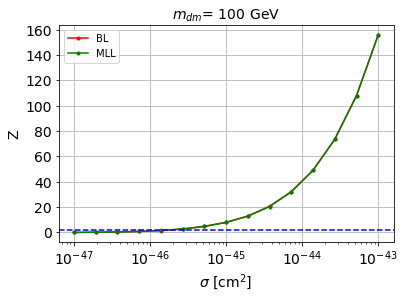


cross_BL_164:  1.5258980299938632e-46
cross_BL_164_up:  8.947920732389425e-47
cross_BL_164_down:  2.1890853221088646e-46

cross_MLL_164:  1.4725106397386662e-46
cross_MLL_164_up:  8.027003372413448e-47
cross_MLL_164_down:  2.2224247688891832e-46

#########################


#########################

mDM =  200 GeV


S_cs1.shape:  (34573,)
S_cs2.shape:  (34573,)
 NUM_DAT:  31737 

NUM_DAT_ER:  31333
NUM_DAT_AC:  111
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  263

B_cs1cs2.shape:  (31737, 2)

S_cs1cs2.shape:  (31737, 2)


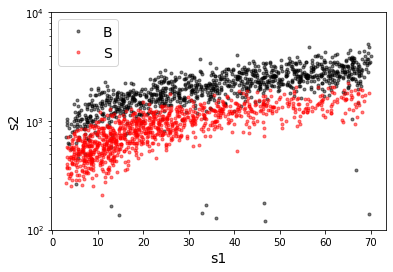

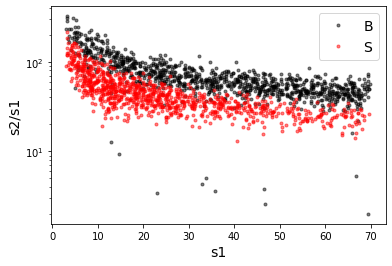

X_mon_B.shape:  (31737, 1)
X_mon_S.shape:  (31737, 1)
X_mon.shape:  (63474, 1)

X_mon_train :  (40464, 1)
y_mon_train :  (40464,)
X_mon_val :  (7141, 1)
y_mon_val :  (7141,)
X_mon_test :  (15869, 1)
y_mon_test :  (15869,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69081	validation_1-logloss:0.69084
[1]	validation_0-logloss:0.68854	validation_1-logloss:0.68859
[2]	validation_0-logloss:0.68630	validation_1-logloss:0.68637
[3]	validation_0-logloss:0.68411	validation_1-logloss:0.68420
[4]	validation_0-logloss:0.68197	validation_1-logloss:0.68207
[5]	validation_0-logloss:0.67986	validation_1-logloss:0.67999
[6]	validation_0-logloss:0.67778	validation_1-logloss:0.67795
[7]	validation_0-logloss:0.67575	validation_1-logloss:0.67594
[8]	validation_0-logloss:0.67377	validation_1-logloss:0.67398
[9]	validation_0-logloss:0.67182	validation_1-logloss:0.67205
[10]	validation_0-logloss:0.66991	validation_1-logloss:0.67016
[11]	validation_0-logloss:0.66802	validation_1-logloss:0.66831
[12]	validation_0-logloss:0.66619	validation_1-logloss:0.66650
[13]	validation_0-logloss:0.66438	validation_1-logloss:0.66471
[14]	validation_0-logloss:0.66260	validation_1-logloss:0.66297
[15]	validation_0-logloss:0.66086	validation_1-logloss:0.66126
[1

[130]	validation_0-logloss:0.57408	validation_1-logloss:0.57597
[131]	validation_0-logloss:0.57381	validation_1-logloss:0.57572
[132]	validation_0-logloss:0.57355	validation_1-logloss:0.57546
[133]	validation_0-logloss:0.57330	validation_1-logloss:0.57521
[134]	validation_0-logloss:0.57305	validation_1-logloss:0.57496
[135]	validation_0-logloss:0.57280	validation_1-logloss:0.57472
[136]	validation_0-logloss:0.57255	validation_1-logloss:0.57448
[137]	validation_0-logloss:0.57232	validation_1-logloss:0.57424
[138]	validation_0-logloss:0.57208	validation_1-logloss:0.57401
[139]	validation_0-logloss:0.57185	validation_1-logloss:0.57378
[140]	validation_0-logloss:0.57162	validation_1-logloss:0.57356
[141]	validation_0-logloss:0.57139	validation_1-logloss:0.57334
[142]	validation_0-logloss:0.57117	validation_1-logloss:0.57312
[143]	validation_0-logloss:0.57095	validation_1-logloss:0.57290
[144]	validation_0-logloss:0.57073	validation_1-logloss:0.57269
[145]	validation_0-logloss:0.57052	valid

[259]	validation_0-logloss:0.55850	validation_1-logloss:0.56151
[260]	validation_0-logloss:0.55846	validation_1-logloss:0.56147
[261]	validation_0-logloss:0.55841	validation_1-logloss:0.56144
[262]	validation_0-logloss:0.55837	validation_1-logloss:0.56140
[263]	validation_0-logloss:0.55832	validation_1-logloss:0.56137
[264]	validation_0-logloss:0.55829	validation_1-logloss:0.56133
[265]	validation_0-logloss:0.55825	validation_1-logloss:0.56129
[266]	validation_0-logloss:0.55820	validation_1-logloss:0.56125
[267]	validation_0-logloss:0.55816	validation_1-logloss:0.56122
[268]	validation_0-logloss:0.55812	validation_1-logloss:0.56118
[269]	validation_0-logloss:0.55808	validation_1-logloss:0.56115
[270]	validation_0-logloss:0.55805	validation_1-logloss:0.56111
[271]	validation_0-logloss:0.55801	validation_1-logloss:0.56108
[272]	validation_0-logloss:0.55797	validation_1-logloss:0.56105
[273]	validation_0-logloss:0.55793	validation_1-logloss:0.56102
[274]	validation_0-logloss:0.55790	valid

[388]	validation_0-logloss:0.55516	validation_1-logloss:0.55944
[389]	validation_0-logloss:0.55514	validation_1-logloss:0.55943
[390]	validation_0-logloss:0.55512	validation_1-logloss:0.55942
[391]	validation_0-logloss:0.55511	validation_1-logloss:0.55941
[392]	validation_0-logloss:0.55509	validation_1-logloss:0.55941
[393]	validation_0-logloss:0.55508	validation_1-logloss:0.55941
[394]	validation_0-logloss:0.55507	validation_1-logloss:0.55940
[395]	validation_0-logloss:0.55505	validation_1-logloss:0.55940
[396]	validation_0-logloss:0.55503	validation_1-logloss:0.55939
[397]	validation_0-logloss:0.55501	validation_1-logloss:0.55939
[398]	validation_0-logloss:0.55500	validation_1-logloss:0.55938
[399]	validation_0-logloss:0.55498	validation_1-logloss:0.55938
[400]	validation_0-logloss:0.55497	validation_1-logloss:0.55937
[401]	validation_0-logloss:0.55495	validation_1-logloss:0.55937
[402]	validation_0-logloss:0.55494	validation_1-logloss:0.55937
[403]	validation_0-logloss:0.55492	valid

[517]	validation_0-logloss:0.55353	validation_1-logloss:0.55919
[518]	validation_0-logloss:0.55352	validation_1-logloss:0.55919
[519]	validation_0-logloss:0.55350	validation_1-logloss:0.55919
[520]	validation_0-logloss:0.55349	validation_1-logloss:0.55919
[521]	validation_0-logloss:0.55348	validation_1-logloss:0.55919
[522]	validation_0-logloss:0.55347	validation_1-logloss:0.55918
[523]	validation_0-logloss:0.55347	validation_1-logloss:0.55918
[524]	validation_0-logloss:0.55345	validation_1-logloss:0.55918
[525]	validation_0-logloss:0.55344	validation_1-logloss:0.55918
[526]	validation_0-logloss:0.55344	validation_1-logloss:0.55918
[527]	validation_0-logloss:0.55342	validation_1-logloss:0.55918
[528]	validation_0-logloss:0.55341	validation_1-logloss:0.55918
[529]	validation_0-logloss:0.55340	validation_1-logloss:0.55918
[530]	validation_0-logloss:0.55339	validation_1-logloss:0.55918
[531]	validation_0-logloss:0.55339	validation_1-logloss:0.55918
[532]	validation_0-logloss:0.55338	valid

[646]	validation_0-logloss:0.55234	validation_1-logloss:0.55918
[647]	validation_0-logloss:0.55234	validation_1-logloss:0.55918
[648]	validation_0-logloss:0.55232	validation_1-logloss:0.55918
[649]	validation_0-logloss:0.55231	validation_1-logloss:0.55919
[650]	validation_0-logloss:0.55230	validation_1-logloss:0.55919
[651]	validation_0-logloss:0.55229	validation_1-logloss:0.55919
[652]	validation_0-logloss:0.55229	validation_1-logloss:0.55919
[653]	validation_0-logloss:0.55228	validation_1-logloss:0.55919
[654]	validation_0-logloss:0.55227	validation_1-logloss:0.55919
[655]	validation_0-logloss:0.55226	validation_1-logloss:0.55920
[656]	validation_0-logloss:0.55226	validation_1-logloss:0.55920
[657]	validation_0-logloss:0.55224	validation_1-logloss:0.55919
[658]	validation_0-logloss:0.55222	validation_1-logloss:0.55919
[659]	validation_0-logloss:0.55222	validation_1-logloss:0.55919
[660]	validation_0-logloss:0.55221	validation_1-logloss:0.55919
[661]	validation_0-logloss:0.55220	valid

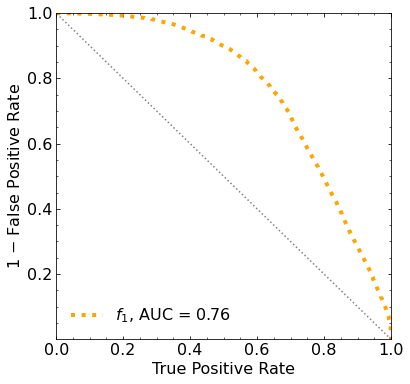

Classification score:


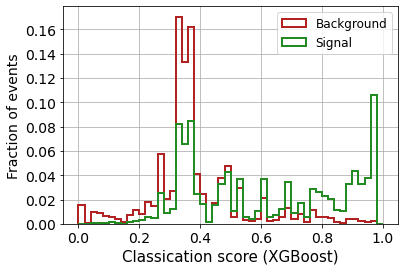


 ROC-AUC =  0.7640637275254384
At least 5 B events per bin, range = [[0, 1]]:
# bins:  10 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  10
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.246


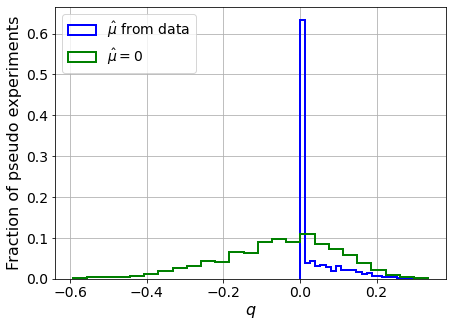

muhat mean:  3.4910944896289706
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.20040525562245975
std Z_bins mu=0:  0.3864051760895705

--------

B_expected:  643
S_expected:  2



/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:807: RuntimeWarning: divide by zero encountered in double_scalars
  Z_bins_std = np.std(q_muhat_bins) / (2.*Z_bins)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2625


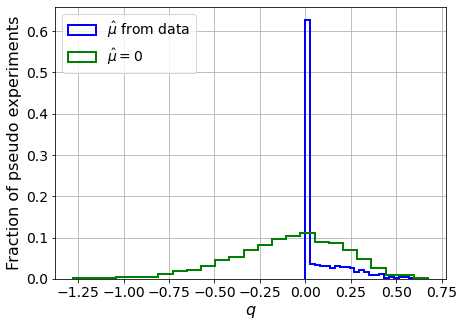

muhat mean:  1.7877155010252386
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.24271686376092155
std Z_bins mu=0:  0.6302625831864989

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.276


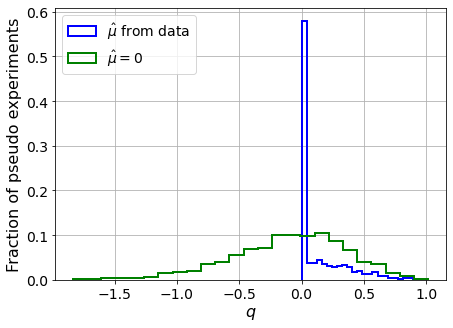

muhat mean:  1.1385779764021973
Z_bins:  0.04580491927162492
std Z_bins:  2.1872571022125853
Z_bins mu=0:  0.23179551820829106
std Z_bins mu=0:  0.9825841076924543

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2585


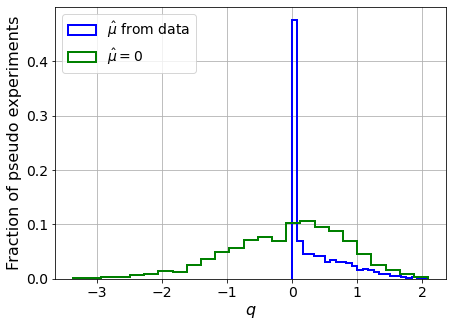

muhat mean:  0.6220809832588587
Z_bins:  0.33787137052664423
std Z_bins:  0.6497629372396009
Z_bins mu=0:  0.23670216317806006
std Z_bins mu=0:  1.901447240234468

--------

B_expected:  643
S_expected:  11

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2455


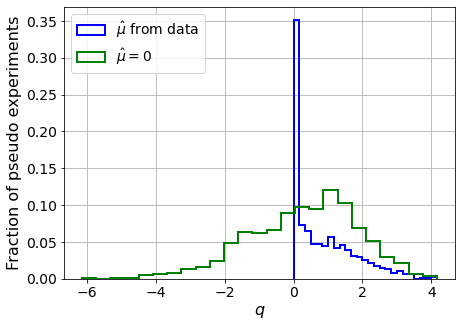

muhat mean:  0.35985164526719543
Z_bins:  0.7303622353415644
std Z_bins:  0.6144376563098481
Z_bins mu=0:  0.672486495782142
std Z_bins mu=0:  1.1677633041088247

--------

B_expected:  643
S_expected:  21

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.252


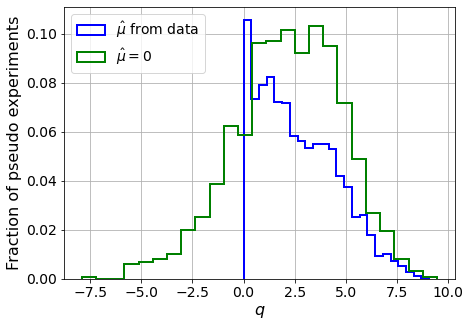

muhat mean:  0.16246448624110968
Z_bins:  1.54607818922839
std Z_bins:  0.6194341825966984
Z_bins mu=0:  1.5145508306626216
std Z_bins mu=0:  0.8613879072356115

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2485


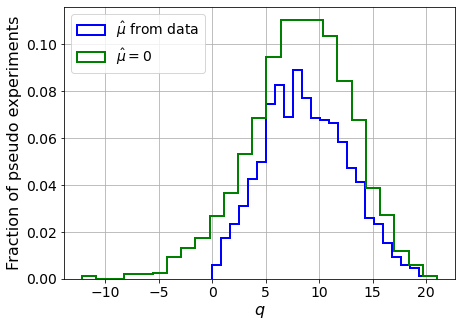

muhat mean:  0.08944183290007086
Z_bins:  2.922922626131906
std Z_bins:  0.6643515553619804
Z_bins mu=0:  2.9078785506078373
std Z_bins mu=0:  0.8143131924649256

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2555


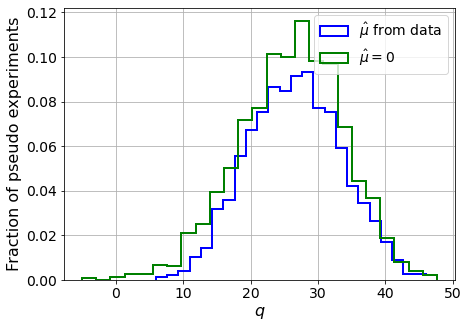

muhat mean:  0.04793947759063314
Z_bins:  5.156614846036014
std Z_bins:  0.6694651302721225
Z_bins mu=0:  5.144896733598871
std Z_bins mu=0:  0.7509075191758631

--------

B_expected:  643
S_expected:  152

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.253


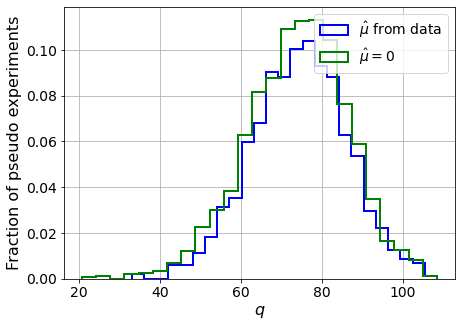

muhat mean:  0.02443181023640203
Z_bins:  8.647529702348107
std Z_bins:  0.6780050700466745
Z_bins mu=0:  8.641121363761636
std Z_bins mu=0:  0.7280773686721274

--------

B_expected:  643
S_expected:  294

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.262


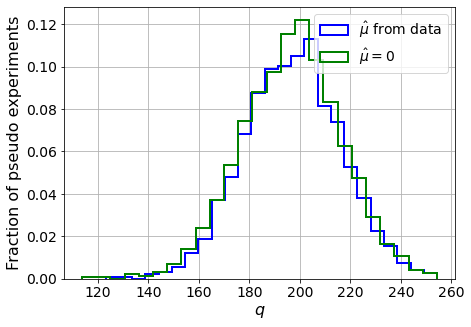

muhat mean:  0.01216401934972653
Z_bins:  14.044527477288057
std Z_bins:  0.6771104495997518
Z_bins mu=0:  14.038267569409033
std Z_bins mu=0:  0.7038179458869805

--------

B_expected:  643
S_expected:  567

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.253


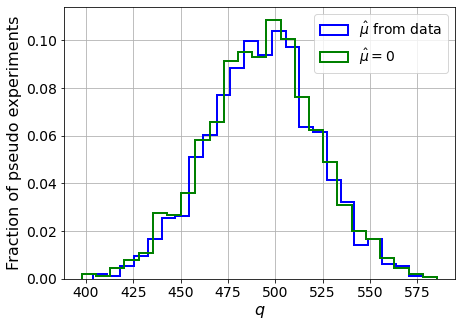

muhat mean:  0.006549636198992721
Z_bins:  22.22120749609913
std Z_bins:  0.6459533755526028
Z_bins mu=0:  22.21695973331114
std Z_bins mu=0:  0.6612387161460135

--------

B_expected:  643
S_expected:  1094

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2465


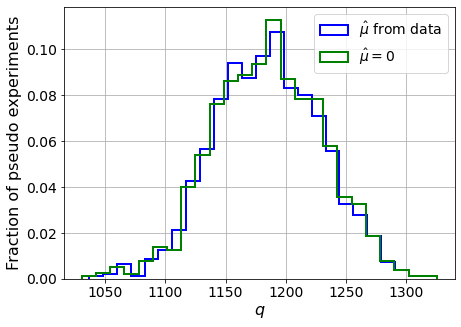

muhat mean:  0.0034831769769634114
Z_bins:  34.429950063823874
std Z_bins:  0.6448377676095138
Z_bins mu=0:  34.42747686981904
std Z_bins mu=0:  0.6553149198799475

--------

B_expected:  643
S_expected:  2113

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2325


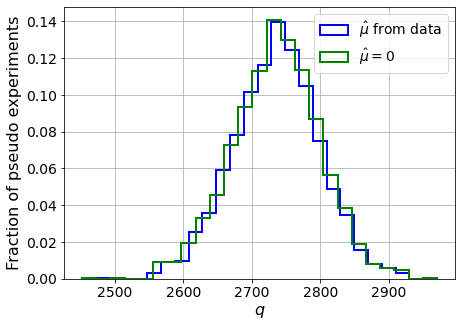

muhat mean:  0.0019248189035569073
Z_bins:  52.30813369740182
std Z_bins:  0.6080694414405956
Z_bins mu=0:  52.3074754549015
std Z_bins mu=0:  0.6149672083630993

--------

B_expected:  643
S_expected:  4079

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2315


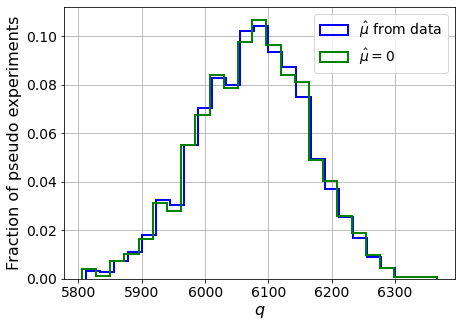

muhat mean:  0.0008902788572055733
Z_bins:  77.9675055793105
std Z_bins:  0.557615741529451
Z_bins mu=0:  77.96571357797372
std Z_bins mu=0:  0.5614196499748261

--------

B_expected:  643
S_expected:  7876

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.27


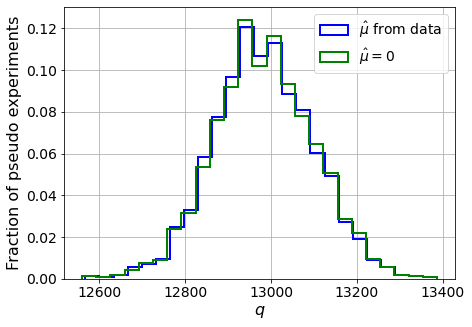

muhat mean:  0.0004553350715231043
Z_bins:  113.93818644486225
std Z_bins:  0.5062677205652356
Z_bins mu=0:  113.93649801275728
std Z_bins mu=0:  0.5087777828563904

--------


 FINAL RESULT:

[[0.0, inf, 3.4910944896289706, 0.20040525562245975, 0.3864051760895705], [0.0, inf, 1.7877155010252386, 0.24271686376092155, 0.6302625831864989], [0.04580491927162492, 2.1872571022125853, 1.1385779764021973, 0.23179551820829106, 0.9825841076924543], [0.33787137052664423, 0.6497629372396009, 0.6220809832588587, 0.23670216317806006, 1.901447240234468], [0.7303622353415644, 0.6144376563098481, 0.35985164526719543, 0.672486495782142, 1.1677633041088247], [1.54607818922839, 0.6194341825966984, 0.16246448624110968, 1.5145508306626216, 0.8613879072356115], [2.922922626131906, 0.6643515553619804, 0.08944183290007086, 2.9078785506078373, 0.8143131924649256], [5.156614846036014, 0.6694651302721225, 0.04793947759063314, 5.144896733598871, 0.7509075191758631], [8.647529702348107, 0.6780050700466745, 0.02443

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 168.50215323 162.33983215 141.05620417
 122.32450379  94.06723037  53.5759404   -5.277298   -88.47014423]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf   86.8334187    73.10870211   5

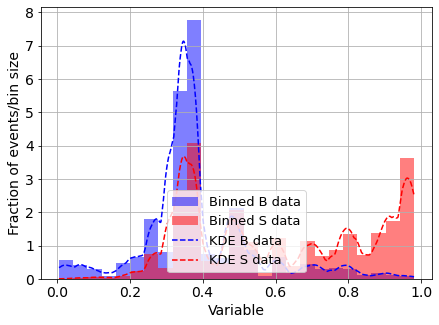

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



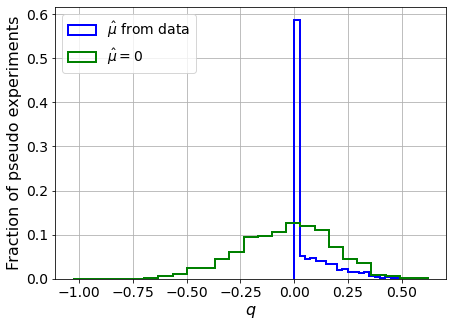

/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:1268: RuntimeWarning: divide by zero encountered in double_scalars
  Z_MLL_std = np.std(q_muhat_MLL) / (2.*Z_MLL)


muhat mean:  0.953284085158648
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.14134139888956818
std Z_bins mu=0:  0.7546091745589348

--------

B_expected:  643
S_expected:  2



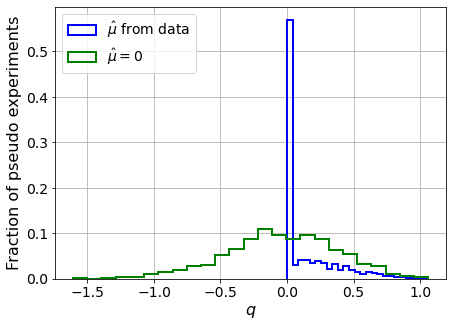

muhat mean:  0.3356551075392177
Z_bins:  0.024601506851658867
std Z_bins:  4.4222414968714405
Z_bins mu=0:  0.1751499187747868
std Z_bins mu=0:  1.2108792654300033

--------

B_expected:  643
S_expected:  3



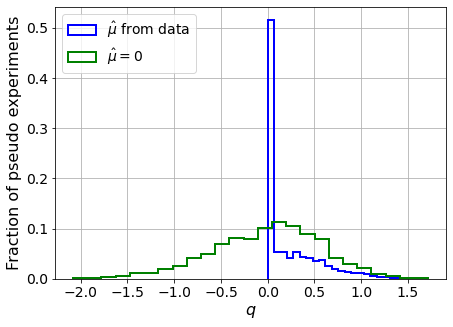

muhat mean:  0.20591578862177257
Z_bins:  0.2279653914573329
std Z_bins:  0.687044380070156
Z_bins mu=0:  0.2073122128629211
std Z_bins mu=0:  1.4255895354936565

--------

B_expected:  643
S_expected:  6



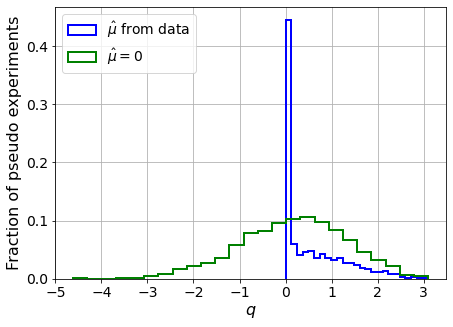

muhat mean:  0.06324815435487147
Z_bins:  0.4816037536741864
std Z_bins:  0.713667255431548
Z_bins mu=0:  0.4658771807959369
std Z_bins mu=0:  1.2518744519076686

--------

B_expected:  643
S_expected:  11



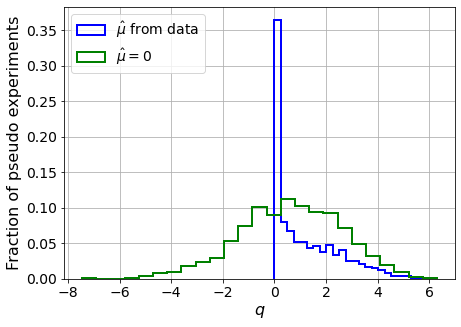

muhat mean:  0.11563577669587796
Z_bins:  0.844502637196203
std Z_bins:  0.7623677735803893
Z_bins mu=0:  0.8190529482494354
std Z_bins mu=0:  1.2218604944701859

--------

B_expected:  643
S_expected:  21



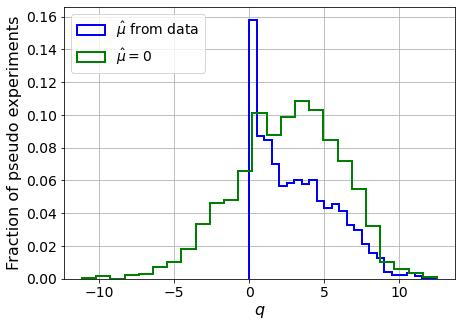

muhat mean:  0.06364672149572634
Z_bins:  1.7015266145074688
std Z_bins:  0.7493937447824501
Z_bins mu=0:  1.6924376099712906
std Z_bins mu=0:  1.026963009952164

--------

B_expected:  643
S_expected:  41



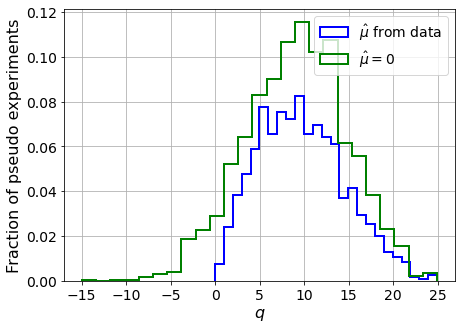

muhat mean:  0.0166337407157663
Z_bins:  3.0633284004530195
std Z_bins:  0.7816405865771057
Z_bins mu=0:  3.0522545871075737
std Z_bins mu=0:  0.9294736943669747

--------

B_expected:  643
S_expected:  79



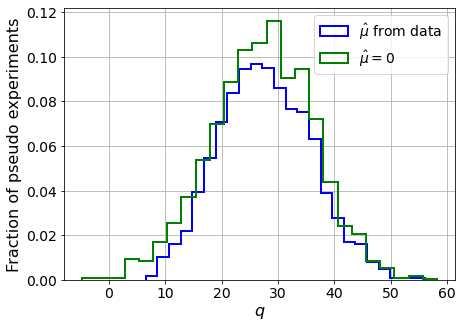

muhat mean:  0.010302982791413744
Z_bins:  5.244917292177353
std Z_bins:  0.7789477234321607
Z_bins mu=0:  5.232110510209056
std Z_bins mu=0:  0.8668759545686294

--------

B_expected:  643
S_expected:  152



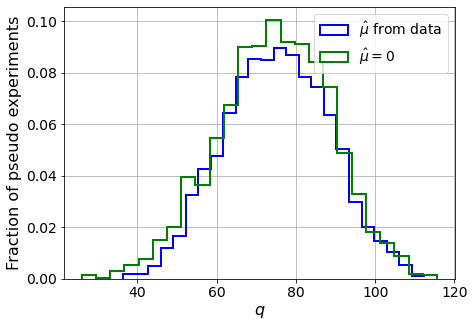

muhat mean:  0.006904210566378054
Z_bins:  8.675716225872131
std Z_bins:  0.7635302254019035
Z_bins mu=0:  8.66758284840765
std Z_bins mu=0:  0.8178996274692912

--------

B_expected:  643
S_expected:  294



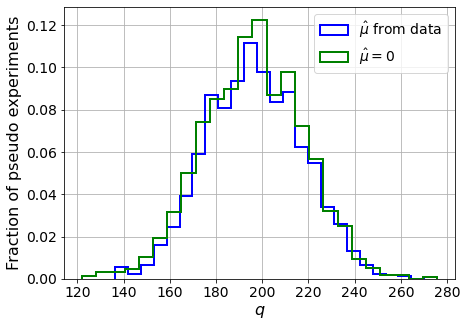

muhat mean:  0.0026947226917698724
Z_bins:  14.021653731654556
std Z_bins:  0.7452472150749315
Z_bins mu=0:  14.013868679716927
std Z_bins mu=0:  0.7743148506533782

--------

B_expected:  643
S_expected:  567



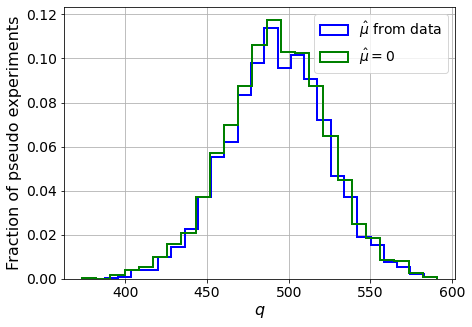

muhat mean:  0.00019829626295719144
Z_bins:  22.194232602144957
std Z_bins:  0.6857483340194696
Z_bins mu=0:  22.190160674590473
std Z_bins mu=0:  0.7029140878155754

--------

B_expected:  643
S_expected:  1094



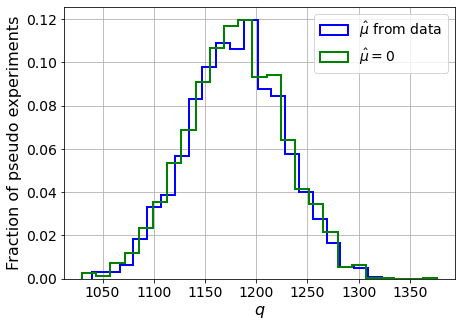

muhat mean:  0.0006474388486268937
Z_bins:  34.35472037814315
std Z_bins:  0.6795660100461519
Z_bins mu=0:  34.350954172068576
std Z_bins mu=0:  0.6909903138246277

--------

B_expected:  643
S_expected:  2113



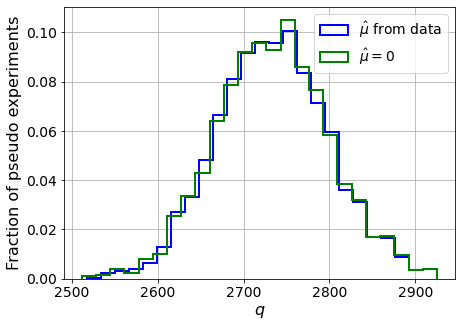

muhat mean:  0.00023429054202209266
Z_bins:  52.283881547527095
std Z_bins:  0.6221770545899279
Z_bins mu=0:  52.27999073971224
std Z_bins mu=0:  0.6284360522580685

--------

B_expected:  643
S_expected:  4079



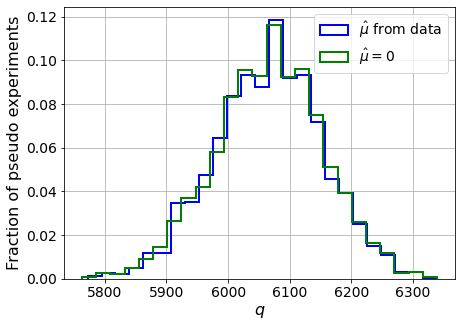

muhat mean:  7.288154473681196e-05
Z_bins:  77.91224515133146
std Z_bins:  0.5622949201110546
Z_bins mu=0:  77.9086395346173
std Z_bins mu=0:  0.5662232835117507

--------

B_expected:  643
S_expected:  7876



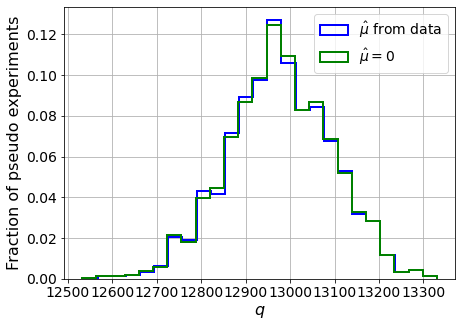

muhat mean:  7.671654452553903e-05
Z_bins:  113.90894949382583
std Z_bins:  0.5131294385534341
Z_bins mu=0:  113.90768172360913
std Z_bins mu=0:  0.5155425948776764

--------


 FINAL RESULT:

[[0.0, inf, 0.953284085158648, 0.14134139888956818, 0.7546091745589348], [0.024601506851658867, 4.4222414968714405, 0.3356551075392177, 0.1751499187747868, 1.2108792654300033], [0.2279653914573329, 0.687044380070156, 0.20591578862177257, 0.2073122128629211, 1.4255895354936565], [0.4816037536741864, 0.713667255431548, 0.06324815435487147, 0.4658771807959369, 1.2518744519076686], [0.844502637196203, 0.7623677735803893, 0.11563577669587796, 0.8190529482494354, 1.2218604944701859], [1.7015266145074688, 0.7493937447824501, 0.06364672149572634, 1.6924376099712906, 1.026963009952164], [3.0633284004530195, 0.7816405865771057, 0.0166337407157663, 3.0522545871075737, 0.9294736943669747], [5.244917292177353, 0.7789477234321607, 0.010302982791413744, 5.232110510209056, 0.8668759545686294], [8.675716225872131

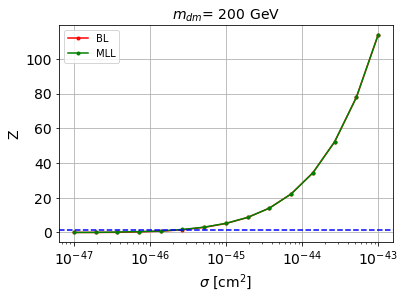


cross_BL_164:  2.8058309719168155e-46
cross_BL_164_up:  1.760455415027127e-46
cross_BL_164_down:  3.815880988068981e-46

cross_MLL_164:  2.5589376974642554e-46
cross_MLL_164_up:  1.425842781838873e-46
cross_MLL_164_down:  3.7704259531694234e-46

#########################


#########################

mDM =  500 GeV


S_cs1.shape:  (35477,)
S_cs2.shape:  (35477,)
 NUM_DAT:  32117 

NUM_DAT_ER:  31709
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  266

B_cs1cs2.shape:  (32117, 2)

S_cs1cs2.shape:  (32117, 2)


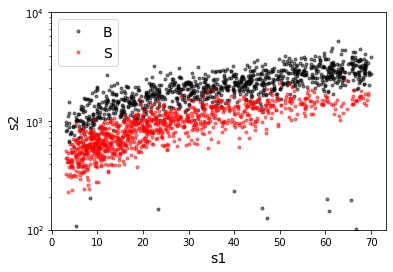

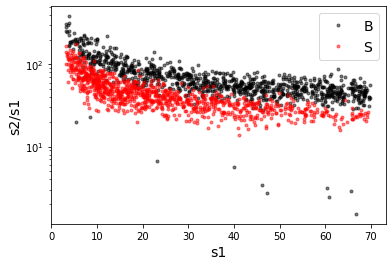

X_mon_B.shape:  (32117, 1)
X_mon_S.shape:  (32117, 1)
X_mon.shape:  (64234, 1)

X_mon_train :  (40948, 1)
y_mon_train :  (40948,)
X_mon_val :  (7227, 1)
y_mon_val :  (7227,)
X_mon_test :  (16059, 1)
y_mon_test :  (16059,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.69071	validation_1-logloss:0.69071
[1]	validation_0-logloss:0.68834	validation_1-logloss:0.68833
[2]	validation_0-logloss:0.68601	validation_1-logloss:0.68599
[3]	validation_0-logloss:0.68373	validation_1-logloss:0.68370
[4]	validation_0-logloss:0.68149	validation_1-logloss:0.68145
[5]	validation_0-logloss:0.67928	validation_1-logloss:0.67924
[6]	validation_0-logloss:0.67713	validation_1-logloss:0.67709
[7]	validation_0-logloss:0.67502	validation_1-logloss:0.67497
[8]	validation_0-logloss:0.67294	validation_1-logloss:0.67289
[9]	validation_0-logloss:0.67090	validation_1-logloss:0.67087
[10]	validation_0-logloss:0.66891	validation_1-logloss:0.66888
[11]	validation_0-logloss:0.66695	validation_1-logloss:0.66692
[12]	validation_0-logloss:0.66503	validation_1-logloss:0.66500
[13]	validation_0-logloss:0.66314	validation_1-logloss:0.66312
[14]	validation_0-logloss:0.66129	validation_1-logloss:0.66127
[15]	validation_0-logloss:0.65946	validation_1-logloss:0.65946
[1

[130]	validation_0-logloss:0.56871	validation_1-logloss:0.56974
[131]	validation_0-logloss:0.56843	validation_1-logloss:0.56949
[132]	validation_0-logloss:0.56816	validation_1-logloss:0.56922
[133]	validation_0-logloss:0.56788	validation_1-logloss:0.56896
[134]	validation_0-logloss:0.56762	validation_1-logloss:0.56871
[135]	validation_0-logloss:0.56735	validation_1-logloss:0.56846
[136]	validation_0-logloss:0.56710	validation_1-logloss:0.56821
[137]	validation_0-logloss:0.56684	validation_1-logloss:0.56796
[138]	validation_0-logloss:0.56659	validation_1-logloss:0.56772
[139]	validation_0-logloss:0.56634	validation_1-logloss:0.56749
[140]	validation_0-logloss:0.56610	validation_1-logloss:0.56726
[141]	validation_0-logloss:0.56586	validation_1-logloss:0.56702
[142]	validation_0-logloss:0.56562	validation_1-logloss:0.56680
[143]	validation_0-logloss:0.56538	validation_1-logloss:0.56658
[144]	validation_0-logloss:0.56515	validation_1-logloss:0.56636
[145]	validation_0-logloss:0.56493	valid

[259]	validation_0-logloss:0.55214	validation_1-logloss:0.55494
[260]	validation_0-logloss:0.55209	validation_1-logloss:0.55491
[261]	validation_0-logloss:0.55204	validation_1-logloss:0.55488
[262]	validation_0-logloss:0.55200	validation_1-logloss:0.55485
[263]	validation_0-logloss:0.55195	validation_1-logloss:0.55482
[264]	validation_0-logloss:0.55191	validation_1-logloss:0.55478
[265]	validation_0-logloss:0.55187	validation_1-logloss:0.55475
[266]	validation_0-logloss:0.55182	validation_1-logloss:0.55472
[267]	validation_0-logloss:0.55178	validation_1-logloss:0.55469
[268]	validation_0-logloss:0.55174	validation_1-logloss:0.55466
[269]	validation_0-logloss:0.55170	validation_1-logloss:0.55463
[270]	validation_0-logloss:0.55166	validation_1-logloss:0.55460
[271]	validation_0-logloss:0.55162	validation_1-logloss:0.55457
[272]	validation_0-logloss:0.55158	validation_1-logloss:0.55454
[273]	validation_0-logloss:0.55154	validation_1-logloss:0.55452
[274]	validation_0-logloss:0.55150	valid

[388]	validation_0-logloss:0.54870	validation_1-logloss:0.55337
[389]	validation_0-logloss:0.54869	validation_1-logloss:0.55336
[390]	validation_0-logloss:0.54867	validation_1-logloss:0.55337
[391]	validation_0-logloss:0.54866	validation_1-logloss:0.55337
[392]	validation_0-logloss:0.54864	validation_1-logloss:0.55337
[393]	validation_0-logloss:0.54863	validation_1-logloss:0.55337
[394]	validation_0-logloss:0.54861	validation_1-logloss:0.55337
[395]	validation_0-logloss:0.54860	validation_1-logloss:0.55336
[396]	validation_0-logloss:0.54858	validation_1-logloss:0.55336
[397]	validation_0-logloss:0.54857	validation_1-logloss:0.55336
[398]	validation_0-logloss:0.54856	validation_1-logloss:0.55336
[399]	validation_0-logloss:0.54854	validation_1-logloss:0.55335
[400]	validation_0-logloss:0.54853	validation_1-logloss:0.55335
[401]	validation_0-logloss:0.54851	validation_1-logloss:0.55335
[402]	validation_0-logloss:0.54850	validation_1-logloss:0.55335
[403]	validation_0-logloss:0.54848	valid

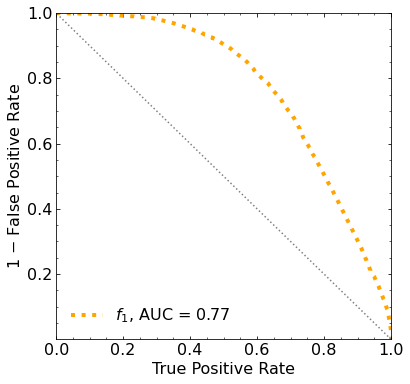

Classification score:


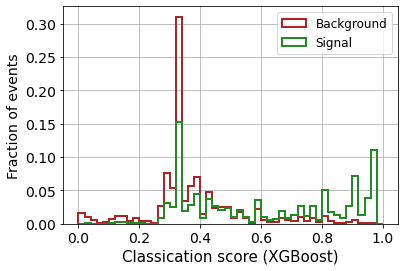


 ROC-AUC =  0.7697915540186094
At least 5 B events per bin, range = [[0, 1]]:
# bins:  11 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  11
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.188


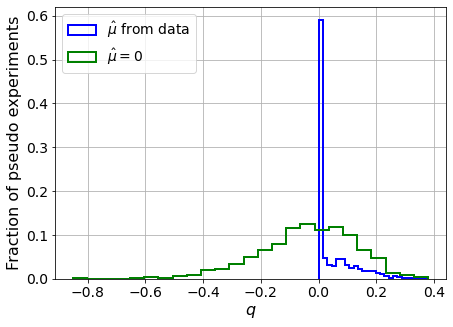

muhat mean:  2.6677138976910038
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.16278455413413842
std Z_bins mu=0:  0.5113359496184738

--------

B_expected:  643
S_expected:  1



/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:807: RuntimeWarning: divide by zero encountered in double_scalars
  Z_bins_std = np.std(q_muhat_bins) / (2.*Z_bins)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1885


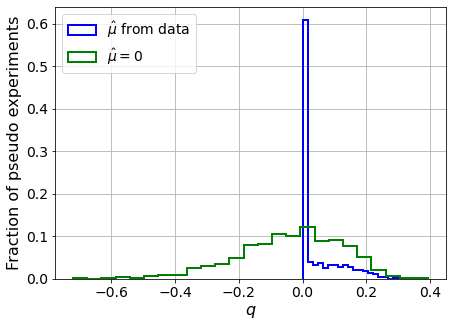

muhat mean:  2.6124090706238285
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.16223818991085845
std Z_bins mu=0:  0.5043785108032393

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1855


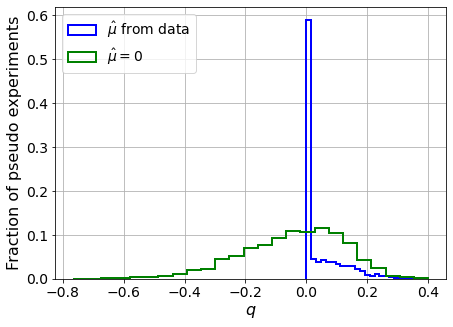

muhat mean:  2.795642554088741
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.1609396206994735
std Z_bins mu=0:  0.5151662159192466

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1915


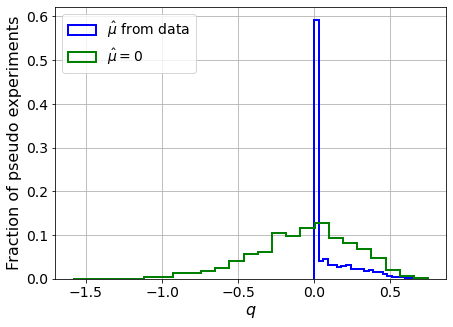

muhat mean:  1.4632477009438987
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.2108215520952347
std Z_bins mu=0:  0.7785134503426442

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1845


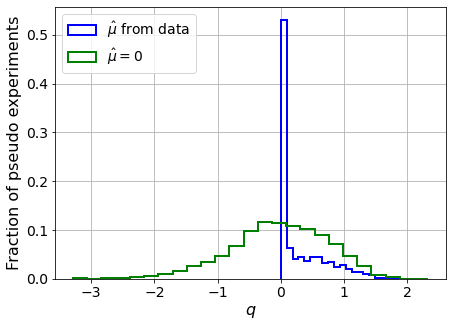

muhat mean:  0.5802271942129805
Z_bins:  0.25564594468361707
std Z_bins:  0.7924415142449692
Z_bins mu=0:  0.12626066378626336
std Z_bins mu=0:  3.0522244275511574

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2


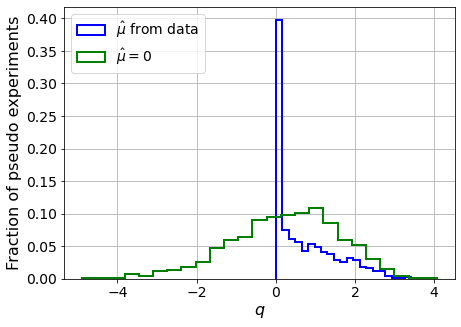

muhat mean:  0.34608660608464936
Z_bins:  0.636700738301935
std Z_bins:  0.6223628259300136
Z_bins mu=0:  0.5923014681304033
std Z_bins mu=0:  1.1572091242964442

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.185


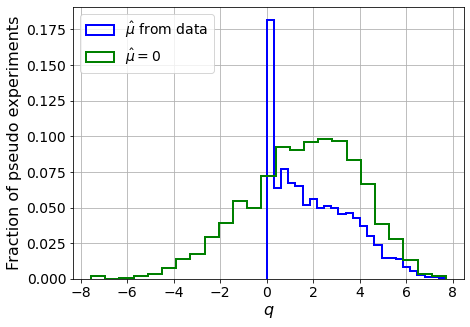

muhat mean:  0.1596947150695471
Z_bins:  1.3479616380865942
std Z_bins:  0.62420749561957
Z_bins mu=0:  1.3338013312636952
std Z_bins mu=0:  0.8941567347390525

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2005


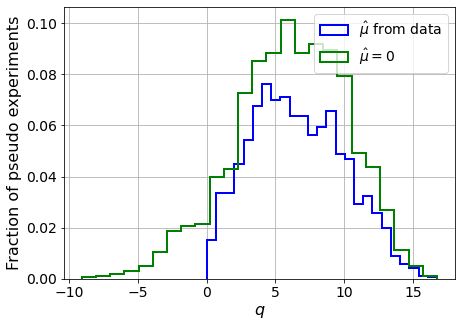

muhat mean:  0.07893327850177419
Z_bins:  2.5224843412566464
std Z_bins:  0.6668307265570532
Z_bins mu=0:  2.5091569667603864
std Z_bins mu=0:  0.8205793624455423

--------

B_expected:  643
S_expected:  64

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.192


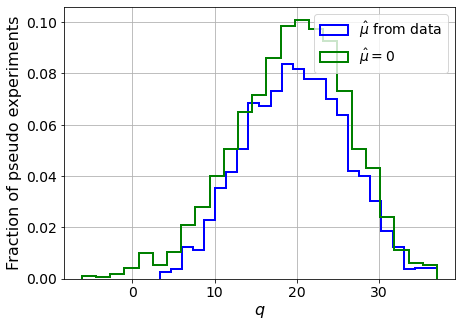

muhat mean:  0.045113807633670136
Z_bins:  4.466669232997343
std Z_bins:  0.6879265189899568
Z_bins mu=0:  4.457031945814873
std Z_bins mu=0:  0.7830913692611691

--------

B_expected:  643
S_expected:  124

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1945


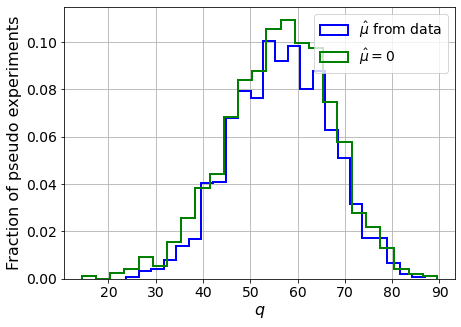

muhat mean:  0.024154814762301427
Z_bins:  7.531976205541033
std Z_bins:  0.6856420982382856
Z_bins mu=0:  7.524708600977218
std Z_bins mu=0:  0.7419237789173021

--------

B_expected:  643
S_expected:  239

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2015


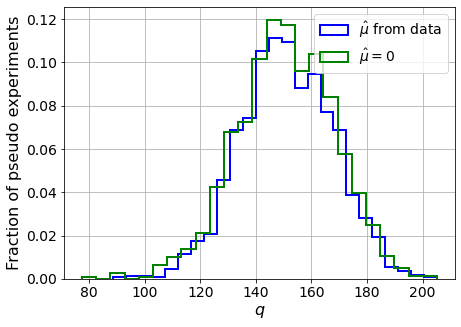

muhat mean:  0.009693182859674482
Z_bins:  12.283682464361643
std Z_bins:  0.676724073163425
Z_bins mu=0:  12.280378483795326
std Z_bins mu=0:  0.705159417780387

--------

B_expected:  643
S_expected:  462

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1825


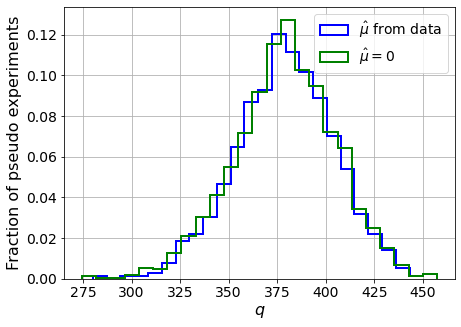

muhat mean:  0.006037567367624729
Z_bins:  19.48284103322162
std Z_bins:  0.6550667687422163
Z_bins mu=0:  19.4748169406419
std Z_bins mu=0:  0.673540885965798

--------

B_expected:  643
S_expected:  892

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.184


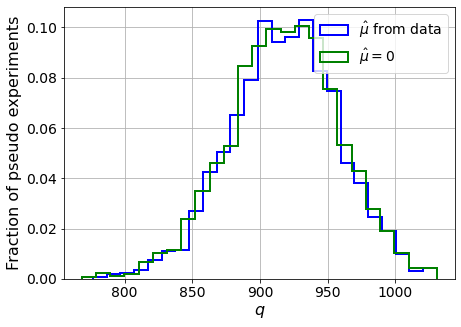

muhat mean:  0.0031157070440575134
Z_bins:  30.314481021869717
std Z_bins:  0.6613753241781114
Z_bins mu=0:  30.310500996519387
std Z_bins mu=0:  0.6725943270864955

--------

B_expected:  643
S_expected:  1723

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1765


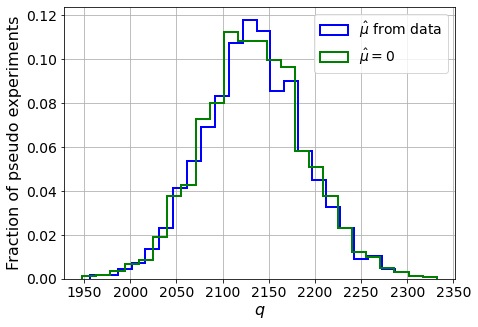

muhat mean:  0.0016473152081490055
Z_bins:  46.1935852126572
std Z_bins:  0.5981881947846108
Z_bins mu=0:  46.186115335721894
std Z_bins mu=0:  0.6044308792577135

--------

B_expected:  643
S_expected:  3326

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1875


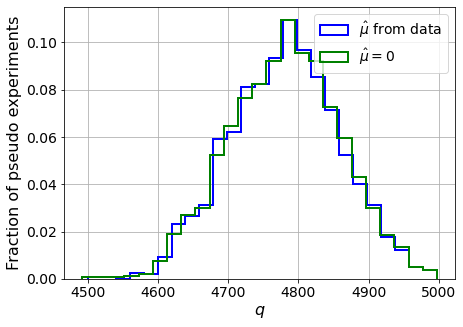

muhat mean:  0.0007996698399335236
Z_bins:  69.15823995284596
std Z_bins:  0.5639259641082607
Z_bins mu=0:  69.15628719783071
std Z_bins mu=0:  0.5678075964448777

--------


 FINAL RESULT:

[[0.0, inf, 2.6677138976910038, 0.16278455413413842, 0.5113359496184738], [0.0, inf, 2.6124090706238285, 0.16223818991085845, 0.5043785108032393], [0.0, inf, 2.795642554088741, 0.1609396206994735, 0.5151662159192466], [0.0, inf, 1.4632477009438987, 0.2108215520952347, 0.7785134503426442], [0.25564594468361707, 0.7924415142449692, 0.5802271942129805, 0.12626066378626336, 3.0522244275511574], [0.636700738301935, 0.6223628259300136, 0.34608660608464936, 0.5923014681304033, 1.1572091242964442], [1.3479616380865942, 0.62420749561957, 0.1596947150695471, 1.3338013312636952, 0.8941567347390525], [2.5224843412566464, 0.6668307265570532, 0.07893327850177419, 2.5091569667603864, 0.8205793624455423], [4.466669232997343, 0.6879265189899568, 0.045113807633670136, 4.457031945814873, 0.7830913692611691], [7.53197

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 165.52215339 155.71335923 138.41050406
 114.81020164  86.82400319  49.60975985  -7.28247238 -89.14028565]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf   83.33654863   68.8215286    5

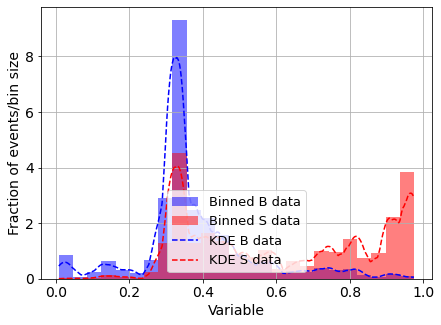

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



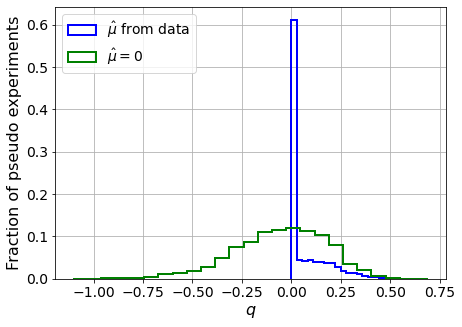

/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:1268: RuntimeWarning: divide by zero encountered in double_scalars
  Z_MLL_std = np.std(q_muhat_MLL) / (2.*Z_MLL)


muhat mean:  1.3697705816082115
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.19018442435565194
std Z_bins mu=0:  0.6081566059943285

--------

B_expected:  643
S_expected:  1



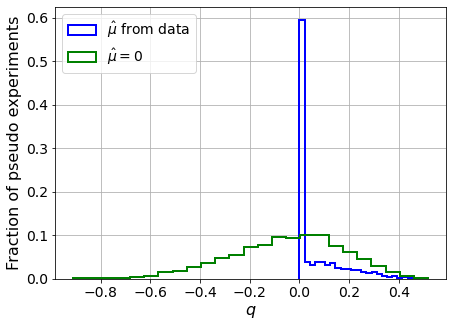

muhat mean:  1.2895081588794812
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.18081494491627206
std Z_bins mu=0:  0.6357131700680466

--------

B_expected:  643
S_expected:  1



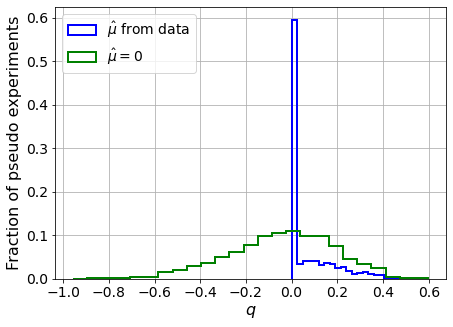

muhat mean:  0.7925482557641048
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.16825592012849935
std Z_bins mu=0:  0.6902800081545968

--------

B_expected:  643
S_expected:  2



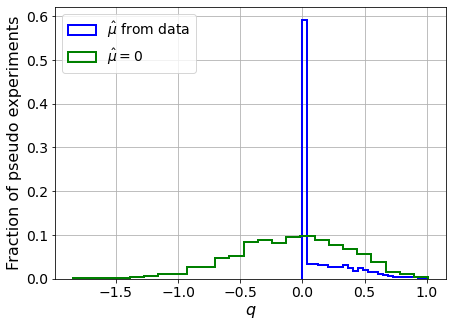

muhat mean:  0.762885233133332
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.2571150219685357
std Z_bins mu=0:  0.8899757978669173

--------

B_expected:  643
S_expected:  5



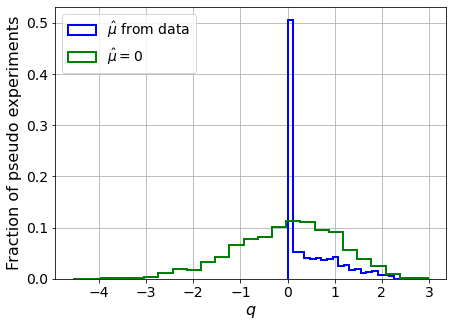

muhat mean:  0.22036285095842614
Z_bins:  0.3302468472378342
std Z_bins:  0.8614477089594232
Z_bins mu=0:  0.2800903747534866
std Z_bins mu=0:  1.939629894878598

--------

B_expected:  643
S_expected:  9



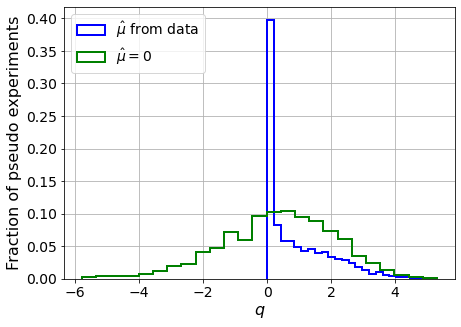

muhat mean:  0.07426092079807546
Z_bins:  0.6993714813043785
std Z_bins:  0.7463328234175675
Z_bins mu=0:  0.6655439437847837
std Z_bins mu=0:  1.3255023959455545

--------

B_expected:  643
S_expected:  17



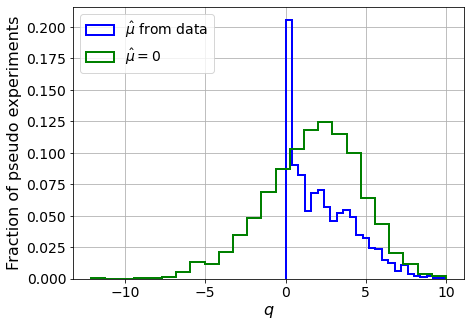

muhat mean:  0.05725976143902604
Z_bins:  1.4122051564737492
std Z_bins:  0.714317566569536
Z_bins mu=0:  1.3916885247316944
std Z_bins mu=0:  1.0540230373873303

--------

B_expected:  643
S_expected:  33



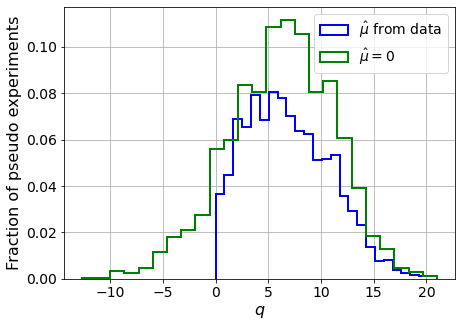

muhat mean:  0.022466913071326637
Z_bins:  2.5445379914970623
std Z_bins:  0.7835996491645261
Z_bins mu=0:  2.5286622024898158
std Z_bins mu=0:  0.9906585111585287

--------

B_expected:  643
S_expected:  64



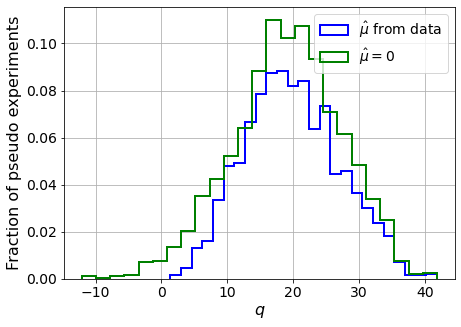

muhat mean:  0.017415177909328186
Z_bins:  4.412814620506634
std Z_bins:  0.8064791421394284
Z_bins mu=0:  4.387069890826117
std Z_bins mu=0:  0.9369513646830073

--------

B_expected:  643
S_expected:  124



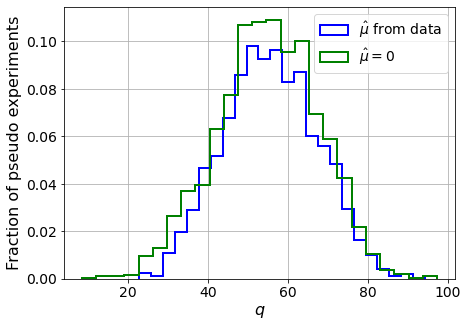

muhat mean:  0.005440383650065142
Z_bins:  7.447676224728242
std Z_bins:  0.7852231332649859
Z_bins mu=0:  7.430310945678706
std Z_bins mu=0:  0.8539407722101051

--------

B_expected:  643
S_expected:  239



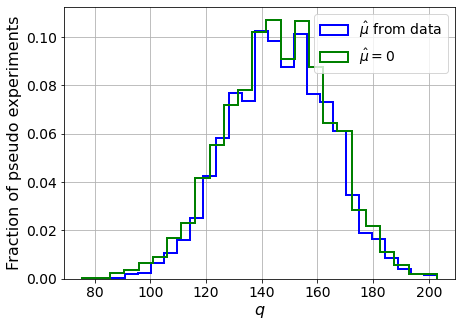

muhat mean:  0.004670510546919026
Z_bins:  12.087999579586661
std Z_bins:  0.7472503477919502
Z_bins mu=0:  12.076264315817193
std Z_bins mu=0:  0.7886128114773917

--------

B_expected:  643
S_expected:  462



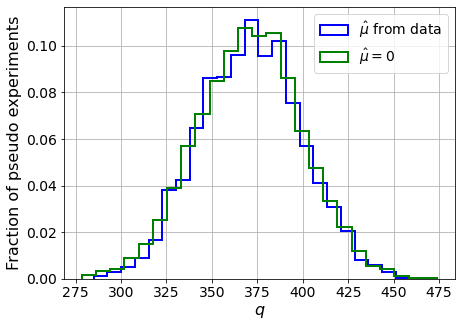

muhat mean:  0.0021189644860276887
Z_bins:  19.27163000905575
std Z_bins:  0.7208098264464927
Z_bins mu=0:  19.261801697883847
std Z_bins mu=0:  0.7449666506343238

--------

B_expected:  643
S_expected:  892



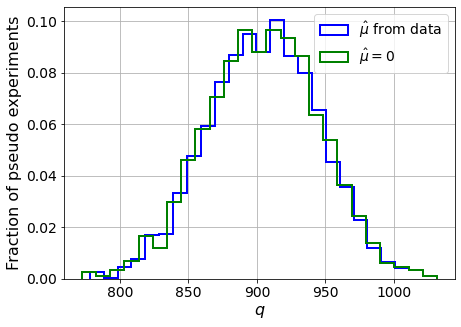

muhat mean:  0.00028534931855133414
Z_bins:  30.096249380489535
std Z_bins:  0.6708258974529152
Z_bins mu=0:  30.09061605909554
std Z_bins mu=0:  0.6831422555228167

--------

B_expected:  643
S_expected:  1723



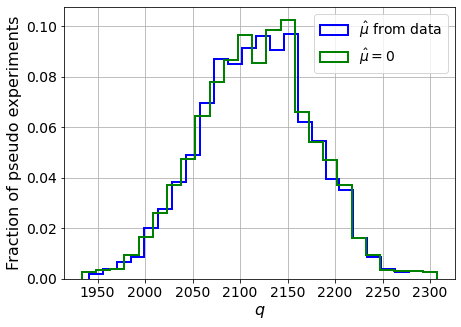

muhat mean:  0.0006074395327395587
Z_bins:  46.02314541042185
std Z_bins:  0.6414888652585551
Z_bins mu=0:  46.02161547308087
std Z_bins mu=0:  0.6496092086278646

--------

B_expected:  643
S_expected:  3326



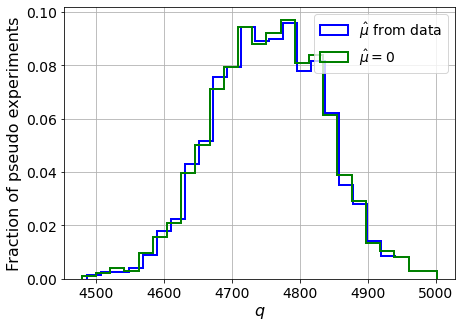

muhat mean:  0.00024843642681877487
Z_bins:  68.96255386449342
std Z_bins:  0.5948061372430224
Z_bins mu=0:  68.96100427969684
std Z_bins mu=0:  0.5993118518071495

--------


 FINAL RESULT:

[[0.0, inf, 1.3697705816082115, 0.19018442435565194, 0.6081566059943285], [0.0, inf, 1.2895081588794812, 0.18081494491627206, 0.6357131700680466], [0.0, inf, 0.7925482557641048, 0.16825592012849935, 0.6902800081545968], [0.0, inf, 0.762885233133332, 0.2571150219685357, 0.8899757978669173], [0.3302468472378342, 0.8614477089594232, 0.22036285095842614, 0.2800903747534866, 1.939629894878598], [0.6993714813043785, 0.7463328234175675, 0.07426092079807546, 0.6655439437847837, 1.3255023959455545], [1.4122051564737492, 0.714317566569536, 0.05725976143902604, 1.3916885247316944, 1.0540230373873303], [2.5445379914970623, 0.7835996491645261, 0.022466913071326637, 2.5286622024898158, 0.9906585111585287], [4.412814620506634, 0.8064791421394284, 0.017415177909328186, 4.387069890826117, 0.9369513646830073], [7.4

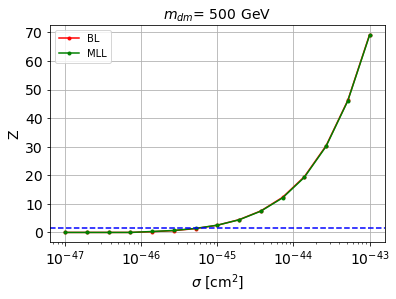


cross_BL_164:  6.099959331653761e-46
cross_BL_164_up:  3.812397474715382e-46
cross_BL_164_down:  8.821951634768067e-46

cross_MLL_164:  5.912398891917157e-46
cross_MLL_164_up:  3.2367573203883923e-46
cross_MLL_164_down:  9.278881190076024e-46

#########################



In [83]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []



for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    S_cs1 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs1.txt')
    S_cs2 = np.loadtxt(filefolder + 'WIMP_' + str(mDM) + 'GeV_cs2.txt')

    print('\nS_cs1.shape: ', S_cs1.shape)
    print('S_cs2.shape: ', S_cs2.shape)
    
    S_cs1_aux = [S_cs1[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs2 = [S_cs2[x] for x in range(len(S_cs1)) if (3 < S_cs1[x] < 70 and 50 < S_cs2[x] < 8000)]
    S_cs1 = S_cs1_aux
    
    
    # set events per classs
    NUM_DAT = min(len(B_cs1_ER), len(S_cs1))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = int(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, int(NUM_DAT*f_CNNS))
    NUM_DAT_RN = int(NUM_DAT*f_RN)
    NUM_DAT_WALL = int(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_cs1cs2 = np.concatenate([np.stack([B_cs1_ER,B_cs2_ER],axis=1)[:NUM_DAT_ER], np.stack([B_cs1_AC,B_cs2_AC],axis=1)[:NUM_DAT_AC], np.stack([B_cs1_CNNS,B_cs2_CNNS],axis=1)[:NUM_DAT_CNNS], np.stack([B_cs1_RN,B_cs2_RN],axis=1)[:NUM_DAT_RN], np.stack([B_cs1_WALL,B_cs2_WALL],axis=1)[:NUM_DAT_WALL]])

    print('\nB_cs1cs2.shape: ', B_cs1cs2.shape)


    S_cs1cs2 = np.stack([S_cs1,S_cs2],axis=1)[:NUM_DAT]


    print('\nS_cs1cs2.shape: ', S_cs1cs2.shape)
    
    
    rnd = 100

    B_cs1cs2_plot = shuffle(B_cs1cs2, random_state=rnd)
    S_cs1cs2_plot = shuffle(S_cs1cs2, random_state=rnd)

    plt.plot(B_cs1cs2_plot[:,0][:1000], B_cs1cs2_plot[:,1][:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], S_cs1cs2_plot[:,1][:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    
    plt.plot(B_cs1cs2_plot[:,0][:1000], (B_cs1cs2_plot[:,1] / B_cs1cs2_plot[:,0])[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_cs1cs2_plot[:,0][:1000], (S_cs1cs2_plot[:,1] / S_cs1cs2_plot[:,0])[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2/s1',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    ############
    # DATASETS #
    ############
    
    # concatenate the data
    X_mon_B = np.reshape( (B_cs1cs2[:,1] / B_cs1cs2[:,0]), [len(B_cs1cs2), 1])
    X_mon_S = np.reshape( (S_cs1cs2[:,1] / S_cs1cs2[:,0]), [len(S_cs1cs2), 1])

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 1 (faster)
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)
    
    
    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    ##########
    # FIND Z #
    ##########
    
    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [84]:
cross_cs1cs2ratio = store_cross_BL_164
cross_cs1cs2ratio_up = store_cross_BL_164_up
cross_cs1cs2ratio_down = store_cross_BL_164_down

print(cross_cs1cs2ratio)
print(cross_cs1cs2ratio_up)
print(cross_cs1cs2ratio_down)


cross_cs1cs2ratio_MLL = store_cross_MLL_164
cross_cs1cs2ratio_MLL_up = store_cross_MLL_164_up
cross_cs1cs2ratio_MLL_down = store_cross_MLL_164_down

print(cross_cs1cs2ratio_MLL)
print(cross_cs1cs2ratio_MLL_up)
print(cross_cs1cs2ratio_MLL_down)

[8.742134946724876e-45, 4.286911563739823e-46, 1.6898828580564214e-46, 1.3392885874573154e-46, 1.5258980299938632e-46, 2.8058309719168155e-46, 6.099959331653761e-46]
[4.739034004766273e-45, 2.4591297746233356e-46, 1.0000736308473748e-46, 8.604293984840837e-47, 8.947920732389425e-47, 1.760455415027127e-46, 3.812397474715382e-46]
[1.3625543887700953e-44, 6.500460955100018e-46, 2.5020533867438486e-46, 1.869723628614771e-46, 2.1890853221088646e-46, 3.815880988068981e-46, 8.821951634768067e-46]
[7.206453676103188e-45, 9.465285684476282e-47, 5.541616348572741e-47, 8.993345564833821e-47, 1.4725106397386662e-46, 2.5589376974642554e-46, 5.912398891917157e-46]
[4.017433684558724e-45, 7.498969856538178e-47, 3.7865161133537417e-47, 5.364239771375913e-47, 8.027003372413448e-47, 1.425842781838873e-46, 3.2367573203883923e-46]
[1.0756658183909771e-44, 1.2768540508490896e-46, 8.387845668187646e-47, 1.4795464223947756e-46, 2.2224247688891832e-46, 3.7704259531694234e-46, 9.278881190076024e-46]


In [106]:
np.savetxt('results/cs1cs2ratio.txt', [cross_cs1cs2ratio, cross_cs1cs2ratio_up, cross_cs1cs2ratio_down])
np.savetxt('results/cs1cs2ratio_MLL.txt', [cross_cs1cs2ratio_MLL, cross_cs1cs2ratio_MLL_up, cross_cs1cs2ratio_MLL_down])

In [107]:
cross_cs1cs2ratio = np.loadtxt('results/cs1cs2ratio.txt')[0]
cross_cs1cs2ratio_up = np.loadtxt('results/cs1cs2ratio.txt')[1]
cross_cs1cs2ratio_down =np.loadtxt('results/cs1cs2ratio.txt')[2]

cross_cs1cs2ratio_MLL = np.loadtxt('results/cs1cs2ratio_MLL.txt')[0]
cross_cs1cs2ratio_MLL_up = np.loadtxt('results/cs1cs2ratio_MLL.txt')[1]
cross_cs1cs2ratio_MLL_down = np.loadtxt('results/cs1cs2ratio_MLL.txt')[2]

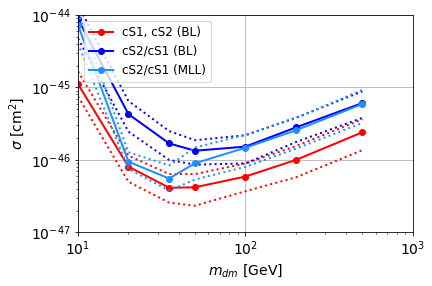

In [108]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_cs1cs2, '-o', color='red', lw=lw, label=r'cS1, cS2 (BL)')
plt.plot(mDM_mDM, cross_cs1cs2_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_down, ':', color='red', lw=lw)
# plt.plot(mDM_mDM, cross_cs1cs2_MLL, '-o', color='darkorange', lw=lw, label=r'cS2, cS1 (MLL)')
# plt.plot(mDM_mDM, cross_cs1cs2_MLL_up, ':', color='darkorange', lw=lw) 
# plt.plot(mDM_mDM, cross_cs1cs2_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_cs1cs2ratio, '-o', color='blue', lw=lw, label=r'cS2/cS1 (BL)')
plt.plot(mDM_mDM, cross_cs1cs2ratio_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2ratio_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_cs1cs2ratio_MLL, '-o', color='dodgerblue', lw=lw, label=r'cS2/cS1 (MLL)')
plt.plot(mDM_mDM, cross_cs1cs2ratio_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2ratio_MLL_down, ':', color='dodgerblue', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlim(10,1000)
plt.ylim(1e-47, 1e-44)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

In [109]:
x_XENON1T_1tonyr_down = [6.055606916561549, 6.823778108538652, 7.726215280067716, 8.582423845905856, 9.904912022713336, 11.596190805697788, 14.105146244789573, 17.91067828986308, 22.419318490487267, 28.741287837312296, 37.55681861498598, 46.12118051468561, 57.18227249733948, 70.55823652254493, 95.79168238706818, 141.05146244789574, 199.9078624971397, 281.97296360054435, 435.5160347143599, 663.0965425825532, 1004.7885762566482]
y_XENON1T_1tonyr_down = [2.122997019253291e-44, 6.830827595149092e-45, 2.5565879564232304e-45, 1.0450855592138182e-45, 3.814128748283239e-46, 1.6397373222443297e-46, 7.13879927716957e-47, 3.4375712618817914e-47, 2.296937143881235e-47, 1.807931378879487e-47, 1.5939048066202329e-47, 1.57394815950498e-47, 1.6141144911444228e-47, 1.7629420229546865e-47, 2.1840435093891482e-47, 2.99267938153686e-47, 4.3126768942716094e-47, 5.984360998261109e-47, 9.301141506038491e-47, 1.4275218465524083e-46, 2.218713527075558e-46]

x_XENON1T_1tonyr_up = [5.998025375267653, 6.694623244123534, 7.837740338641554, 9.176046414544945, 10.340054351159923, 12.047941859795849, 14.240556819126223, 17.57167968977445, 22.419318490487267, 28.604313898938127, 36.495613101538225, 45.03259469748133, 54.77586085235927, 70.22197324875098, 93.0849924905222, 139.0444078719906, 196.1241707554598, 274.00553519070826, 411.25186818001043, 650.5459961419798, 995.2342449249492]
y_XENON1T_1tonyr_up = [8.70579590515474e-44, 3.137473218474891e-44, 8.046532229280133e-45, 2.7573536821266015e-45, 1.2156689420722025e-45, 5.6367138959821105e-46, 2.7486819276573736e-46, 1.4639514554724662e-46, 8.956129880675696e-47, 6.702940894624926e-47, 5.909433198208975e-47, 5.909433198208975e-47, 6.293693784124586e-47, 6.873996431179536e-47, 8.409314634569101e-47, 1.1236099983376527e-46, 1.5013107289081836e-46, 2.057166738834862e-46, 3.0401858742608336e-46, 4.785094961345878e-46, 7.252122247218222e-46]

x_XENON1T_1tonyr_dat = [5.940991365202825, 6.5679129168455805, 7.616277137894846, 8.874272903135752, 10.340054351159923, 11.990524319733609, 14.308748811391741, 17.156940060795215, 20.76956429087212, 25.142875087521656, 30.147625520495286, 36.14858369857204, 45.901378264580416, 60.267473771664314, 83.39918867052648, 123.98267316495033, 183.43638249062232, 276.63601106438455, 407.34135734995056, 638.2329961306843, 990.4912022713337]
y_XENON1T_1tonyr_dat = [2.4080691095438086e-44, 9.84373819664703e-45, 2.936650461687786e-45, 1.0320004592606233e-45, 4.492941663683521e-46, 2.362985258610077e-46, 1.2744862586397517e-46, 7.699400454191772e-47, 5.479161357412966e-47, 4.422734147010833e-47, 4.1007103760403667e-47, 4.2586795849318555e-47, 4.830527157087775e-47, 5.984360998261109e-47, 7.797023884122048e-47, 1.1095417251641934e-46, 1.5989333808583735e-46, 2.3333992615362496e-46, 3.448416377736618e-46, 5.427628610945291e-46, 8.542806062673913e-46]

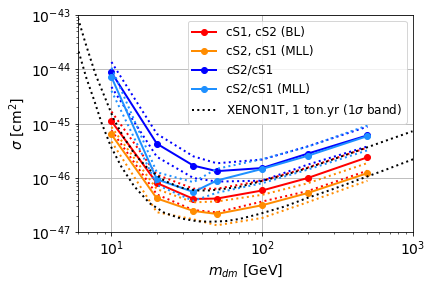

In [110]:

# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_cs1cs2, '-o', color='red', lw=lw, label=r'cS1, cS2 (BL)')
plt.plot(mDM_mDM, cross_cs1cs2_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_cs1cs2_MLL, '-o', color='darkorange', lw=lw, label=r'cS2, cS1 (MLL)')
plt.plot(mDM_mDM, cross_cs1cs2_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_cs1cs2ratio, '-o', color='blue', lw=lw, label=r'cS2/cS1')
plt.plot(mDM_mDM, cross_cs1cs2ratio_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2ratio_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_cs1cs2ratio_MLL, '-o', color='dodgerblue', lw=lw, label=r'cS2/cS1 (MLL)')
plt.plot(mDM_mDM, cross_cs1cs2ratio_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_cs1cs2ratio_MLL_down, ':', color='dodgerblue', lw=lw)
#plt.plot(x_XENON1T_1tonyr_dat, y_XENON1T_1tonyr_dat, '--', color='green', lw=lw, label='XENON1T')
plt.plot(x_XENON1T_1tonyr_up, y_XENON1T_1tonyr_up, ':', color='black', lw=lw, label='XENON1T, 1 ton.yr (1$\sigma$ band)')
plt.plot(x_XENON1T_1tonyr_down, y_XENON1T_1tonyr_down, ':', color='black', lw=lw)


plt.xscale('log')
plt.yscale('log')
plt.xlim(6,1000)
plt.ylim(1e-47, 1e-43)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper right", fontsize=12)
plt.show()